In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re

In [2]:
data_olx = pd.read_csv("Datasets/olx_uylari.csv")
data_olx

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,...,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,85.0,...,1,1,1,1,1,0,1,1,1,0
1,https://www.olx.uz/d/obyavlenie/tashkent-siti-...,Шайхантахурский район,Сегодня в 15:22,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,0.0,...,1,1,1,1,1,0,1,1,1,0
2,https://www.olx.uz/d/obyavlenie/remont-dlya-se...,Чиланзарский район,Сегодня в 15:21,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,0.0,...,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,0.0,...,1,1,1,1,1,0,1,1,1,0
4,https://www.olx.uz/d/obyavlenie/odnokomnatnaya...,Алмазарский район,Сегодня в 15:20,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,0.0,...,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,https://www.olx.uz/d/obyavlenie/chilanzar-2-kv...,Чиланзарский район,Сегодня в 15:01,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,0.0,...,0,0,0,0,0,0,0,0,0,0
5197,https://www.olx.uz/d/obyavlenie/2-1-6-srochno-...,Чиланзарский район,Сегодня в 15:01,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,0.0,...,0,0,0,0,0,0,0,0,0,0
5198,https://www.olx.uz/d/obyavlenie/u-nas-deshevle...,Чиланзарский район,Сегодня в 15:01,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,0.0,...,0,0,0,0,0,0,0,0,0,0
5199,https://www.olx.uz/d/obyavlenie/optovyy-rynok-...,Чиланзарский район,Сегодня в 15:01,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
pd.options.display.max_columns = 100

In [4]:
data_olx.sample(5)

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
1539,https://www.olx.uz/d/obyavlenie/prodazha-3h-ko...,Яккасарайский район,Сегодня в 07:40,ПРОДАЖА 3х ком Евро квартиры!! Ор-р: ул.Абдулл...,119900.0,Бизнес,Вторичный рынок,3,117.0,0.0,0.0,7,16,Монолитный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
4474,https://www.olx.uz/d/obyavlenie/3h-komnatnaya-...,Мирзо-Улугбекский район,Сегодня в 09:54,3х комнатная/75м2/ташсельмаш/New Life/махтумкули,57800.0,Бизнес,Новостройки,3,75.0,0.0,0.0,3,9,Кирпичный,Раздельная,Раздельный,1,Черновая отделка,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2776,https://www.olx.uz/d/obyavlenie/chil-18-panel-...,Чиланзарский район,Сегодня в 12:21,"Чил-18/ Панель 2/2/4 балкон 1,5/3 ориентир пар...",44000.0,Бизнес,Вторичный рынок,2,45.0,0.0,0.0,2,4,Панельный,NaN,Раздельный,1,Евроремонт,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2651,https://www.olx.uz/d/obyavlenie/chilonzor-14-k...,Чиланзарский район,Сегодня в 12:13,"Чилонзор 14-кв ЕВРО ремонтом 2в3/4/4 Балкон 1,5/6",43500.0,Бизнес,Вторичный рынок,2,50.0,0.0,0.0,4,4,Панельный,NaN,Раздельный,0,Евроремонт,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1090,https://www.olx.uz/d/obyavlenie/24kv-ne-dorogo...,Чиланзарский район,Сегодня в 15:55,"24кв не дорого срочно 2/4/4 50кв.м 33,000 треб...",33000.0,Бизнес,Вторичный рынок,2,50.0,0.0,0.0,4,4,Панельный,NaN,Раздельный,0,Требует ремонта,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0


In [5]:
data_olx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5201 entries, 0 to 5200
Data columns (total 42 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Link                 5201 non-null   object 
 1   Location             5201 non-null   object 
 2   DataTime             5201 non-null   object 
 3   Info                 5201 non-null   object 
 4   Prices               5201 non-null   float64
 5   Xususiy biznes       5201 non-null   object 
 6   Turar joyi           5201 non-null   object 
 7   Xonalar              5201 non-null   int64  
 8   Umumiy maydoni       5201 non-null   float64
 9   Yashash maydoni      5201 non-null   float64
 10  Oshxona maydoni      5201 non-null   float64
 11  Etaj                 5201 non-null   int64  
 12  Max etaj             5201 non-null   int64  
 13  Qurilish turi        4468 non-null   object 
 14  Rejasi               3376 non-null   object 
 15  Sanuzel              4219 non-null   o

In [6]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
count,5.201000e+03,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.0,5201.000000,5201.000000,5201.000000,5201.0
mean,4.586745e+06,2.378197,66.324811,8.843943,1.469908,3.700250,5.933667,0.431648,0.362238,0.334167,0.162084,0.168429,0.188233,0.340704,0.162661,0.447799,0.706979,0.706979,0.724668,0.725245,0.725822,0.698904,0.698904,0.698904,0.711594,0.711594,0.712748,0.0,0.715439,0.715439,0.713709,0.0
std,5.125645e+07,1.030411,36.453488,25.490466,6.312156,2.275864,2.835968,0.495354,0.480693,0.471744,0.368563,0.374283,0.390936,0.473991,0.369092,0.497315,0.455192,0.455192,0.446724,0.446434,0.446142,0.458778,0.458778,0.458778,0.453065,0.453065,0.452524,0.0,0.451248,0.451248,0.452071,0.0
min,4.000000e+02,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
25%,3.850000e+04,2.000000,46.000000,0.000000,0.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
50%,4.950000e+04,2.000000,60.000000,0.000000,0.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
75%,6.900000e+04,3.000000,75.000000,0.000000,0.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
max,2.200677e+09,11.000000,600.000000,250.000000,150.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0


Prices - yomon           - Togirlash kerak
Yashash maydoni - yomon  - Ochirsak boladi lekin oldin tekshirish kerak
Oshxona maydoni - yomon  - Ochirsak boladi lekin oldin tekshirish kerak
Televizor - yomon        - Ochirsak boladi lekin oldin tekshirish kerak
Muzlatgich - yomon       - Ochirsak boladi lekin oldin tekshirish kerak
Konditsioner - yomon     - Ochirsak boladi lekin oldin tekshirish kerak
Kir mashina - yomon      - Ochirsak boladi lekin oldin tekshirish kerak
Bozor - yomon            - Ochirish kerak hamma qiymatlar 0
Metro - yomon            - Ochirish kerak hamma qiymatlar 0

In [7]:
data_olx.describe(include="object")

,Link,Location,DataTime,Info,Xususiy biznes,Turar joyi,Qurilish turi,Rejasi,Sanuzel,Remont
count,5201,5201,5201,5201,5201,5201,4468,3376,4219,4398
unique,5197,11,601,5144,2,2,5,7,3,6
top,https://www.olx.uz/d/obyavlenie/kvartira-ipote...,Чиланзарский район,16 апреля 2022 г.,Продаётся квартира,Бизнес,Вторичный рынок,Кирпичный,Раздельная,Раздельный,Средний
freq,2,1816,56,7,4905,4162,2276,2481,2808,1777


Qurilish turi - yomon  - Tekshirish kerak
Rejasi        - yomon  - Tekshirish kerak (Tekshir)
Sanuzel       - yomon  - Tekshirish kerak (Tekshir)
Remeont       - yomon  - Tekshirish kerak 


# <center> 1 - qadam. Narxlarni tog'irlaymiz

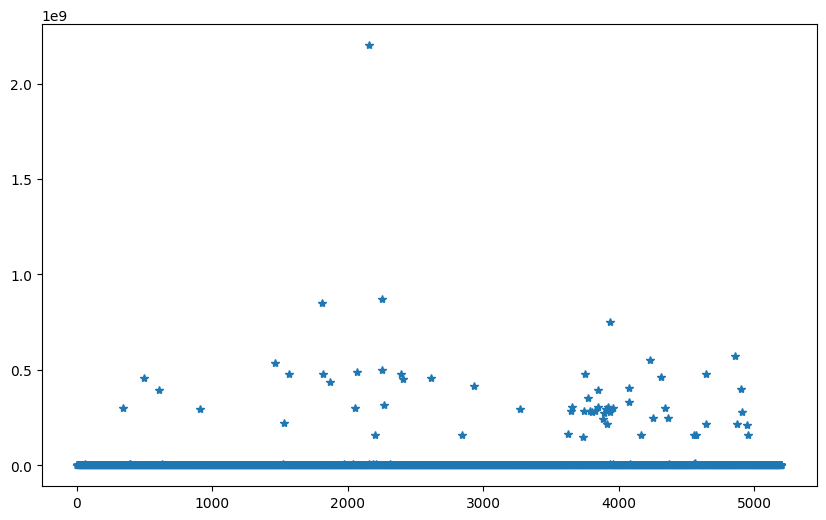

In [8]:
x_prices = data_olx["Prices"]
y_range = np.arange(len(data_olx))
plt.figure(figsize=(10,6))
plt.plot(y_range, x_prices,"*")

In [9]:
data_olx[data_olx["Prices"]>2000000000]
#1 ta
# 2000000000 / 11200 = 179 000 $ bolishi mumkin

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
2158,https://www.olx.uz/d/obyavlenie/4-komn-kvartir...,Яшнабадский район,Сегодня в 09:29,4-комн. квартира в Infinity Luxury Residence. ...,2.200677e+09,Бизнес,Новостройки,4,105.69,0.0,0.0,7,12,NaN,NaN,NaN,0,NaN,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0


In [10]:
data_olx[data_olx.Prices>100000000]
# 100 000 000 mln dan katta Uylarni somgda kiritilgan deb olsak ularni $ ga bolish kerak
# 61 ta shunaqa uylar bor ekan

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
342,https://www.olx.uz/d/obyavlenie/izzat-tjm-dan-...,Яшнабадский район,Сегодня в 14:12,Izzat tjm dan yangilik,301200000.0,Бизнес,Новостройки,3,55.0,75.0,0.0,8,8,Монолитный,Многоуровневая,Раздельный,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
496,https://www.olx.uz/d/obyavlenie/karasu-6-orien...,Мирзо-Улугбекский район,Сегодня в 13:48,Карасу-6 ориентир мечеть! Новостройка 2/1/6 65...,458500000.0,Бизнес,Новостройки,2,65.5,0.0,0.0,1,6,Кирпичный,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
608,https://www.olx.uz/d/obyavlenie/zhk-baku-resid...,Яшнабадский район,Сегодня в 13:39,"Жк""BAKU RESIDENCE"" Ajoyib muddatli toʻlov 40/3...",396500000.0,Бизнес,Новостройки,2,61.0,0.0,0.0,9,9,Монолитный,Раздельная,Совмещенный,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
908,https://www.olx.uz/d/obyavlenie/izzat-tjm-dan-...,Яшнабадский район,Сегодня в 15:22,Izzat tjm dan supper yangilik,293600000.0,Бизнес,Новостройки,3,578.0,74.0,0.0,3,12,Монолитный,Многоуровневая,Раздельный,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1459,https://www.olx.uz/d/obyavlenie/prodazha-novos...,Юнусабадский район,Сегодня в 07:26,Продажа новостройки ЖК менинг уйим,538480000.0,Бизнес,Новостройки,3,84.8,84.8,0.0,8,11,Кирпичный,Раздельная,Раздельный,0,Черновая отделка,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4869,https://www.olx.uz/d/obyavlenie/izzat-turar-jo...,Яшнабадский район,Сегодня в 11:25,«IZZAT» turar joy majmuasi qayerda joylashganl...,217010000.0,Бизнес,Новостройки,2,57.3,0.0,0.0,7,12,Монолитный,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
4899,https://www.olx.uz/d/obyavlenie/prodayu-2h-kom...,Юнусабадский район,Сегодня в 11:32,Продаю 2х комнатную в центре,399000000.0,Частное лицо,Вторичный рынок,4,60.0,60.0,35.0,4,4,Кирпичный,Раздельная,Раздельный,1,Средний,0,0,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
4907,https://www.olx.uz/d/obyavlenie/izzat-turarjoy...,Яшнабадский район,Сегодня в 13:54,"""IZZAT"" Turarjoy Kompleksdan Super Narxlar!",278920000.0,Бизнес,Новостройки,3,73.0,73.0,0.0,7,8,Монолитный,NaN,NaN,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
4944,https://www.olx.uz/d/obyavlenie/baku-residence...,Яшнабадский район,Сегодня в 14:10,Baku Residence 3 xonalik xonadon sotuvda 74 kv,213120000.0,Бизнес,Новостройки,3,74.0,0.0,9.5,5,9,Монолитный,Раздельная,NaN,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0


In [11]:
data_olx.loc[data_olx.Prices>100000000, "Prices"] = data_olx[data_olx.Prices>100000000]["Prices"] / 11200

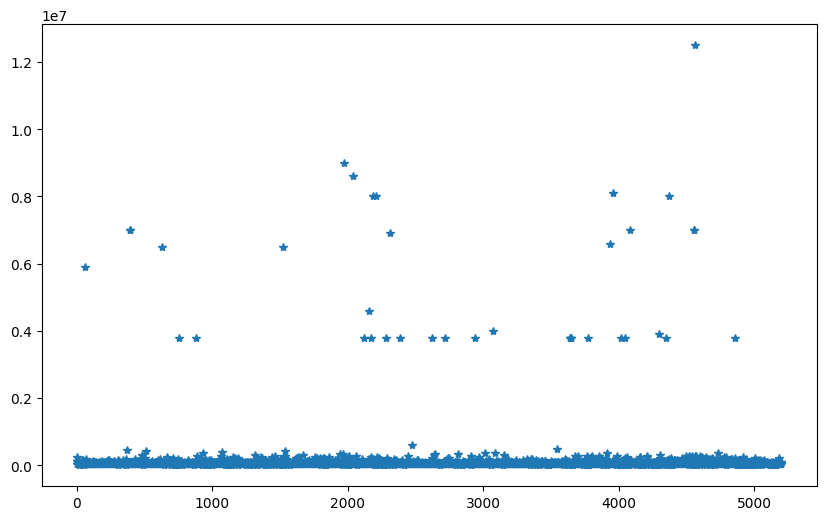

In [12]:
x_prices = data_olx["Prices"]
y_range = np.arange(len(data_olx))
plt.figure(figsize=(10,6))
plt.plot(y_range, x_prices, "*")

In [13]:
data_olx[data_olx.Prices>10000000]
# 10 000 000 dan kattlarini korsak bu kvadrat metr uchun ekan

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
4559,https://www.olx.uz/d/obyavlenie/istanbul-city-...,Яккасарайский район,Сегодня в 10:05,ISTANBUL CITY TJM da tayyor xonadonlar kadastr...,12500000.0,Бизнес,Новостройки,3,94.0,0.0,0.0,7,9,Монолитный,Раздельная,2 санузла и более,1,Евроремонт,1,0,0,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0


In [14]:
data_olx[data_olx.Prices>5000000]
# 5 000 000 dan kattlarini korsak bu metr kvadrat uchun ekan

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
62,https://www.olx.uz/d/obyavlenie/prodaetsya-nov...,Юнусабадский район,Сегодня в 15:04,Продается Новостройка 2 комнатная недалеко от ...,5900000.0,Бизнес,Новостройки,2,53.00,0.0,0.0,3,12,Блочный,NaN,NaN,0,Черновая отделка,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
390,https://www.olx.uz/d/obyavlenie/kvartira-iz-pe...,Мирзо-Улугбекский район,Сегодня в 13:59,"Квартира из первых рук ЖК""QORASUV SOHIL BUYI"" ...",7000000.0,Бизнес,Новостройки,2,58.00,0.0,0.0,2,6,Кирпичный,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
393,https://www.olx.uz/d/obyavlenie/kvartira-iz-pe...,Мирзо-Улугбекский район,Сегодня в 13:59,"Квартира из первых рук 1/3/6 ЖК""QORASUV SOHIL ...",7000000.0,Бизнес,Новостройки,1,42.00,0.0,0.0,3,6,Кирпичный,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
631,https://www.olx.uz/d/obyavlenie/vygodno-tseny-...,Яшнабадский район,Сегодня в 13:36,ВЫГОДНО! ЦЕНЫ ОТ ЗАСТРОЙЩИКА! Джаркурганская (...,6500000.0,Бизнес,Новостройки,2,56.00,0.0,0.0,5,10,Монолитный,Раздельная,Совмещенный,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1520,https://www.olx.uz/d/obyavlenie/novastroyka-ba...,Яшнабадский район,Сегодня в 07:34,Новастройка Baku Residence 40% 30% 30%,6500000.0,Бизнес,Новостройки,2,61.00,0.0,0.0,9,9,Монолитный,NaN,Совмещенный,0,Черновая отделка,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1969,https://www.olx.uz/d/obyavlenie/srochno-prodoe...,Яккасарайский район,Сегодня в 08:47,Срочно! Продоётся квартира 1 этаж 145 кв,9000000.0,Частное лицо,Новостройки,4,145.00,0.0,0.0,1,10,Кирпичный,Раздельная,NaN,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2038,https://www.olx.uz/d/obyavlenie/prodaetsya-kva...,Мирзо-Улугбекский район,Сегодня в 09:07,Продается квартира в новостройке с ремонтом в ...,8600000.0,Бизнес,Новостройки,2,78.00,0.0,0.0,5,9,Блочный,NaN,NaN,0,Средний,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2183,https://www.olx.uz/d/obyavlenie/zhk-diamond-ci...,Юнусабадский район,Сегодня в 09:26,ЖК Diamond city новостройка без%рассрочка,8000000.0,Бизнес,Новостройки,3,103.70,0.0,0.0,10,11,Кирпичный,NaN,NaN,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2210,https://www.olx.uz/d/obyavlenie/subsidiyaga-uy...,Юнусабадский район,Сегодня в 09:36,Субсидияга уй 3 хонали,8000000.0,Бизнес,Новостройки,3,85.00,85.0,10.0,3,4,Кирпичный,NaN,Раздельный,0,NaN,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2310,https://www.olx.uz/d/obyavlenie/novostroyka-ch...,Чиланзарский район,Сегодня в 09:54,"Новостройка Чиланзар, 6,9 млн за 1 м2 (96825)",6900000.0,Бизнес,Новостройки,3,112.60,0.0,0.0,7,10,Кирпичный,Раздельная,Совмещенный,0,Черновая отделка,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,1,1,1,0,1,1,1,0


In [15]:
data_olx[data_olx.Prices>1000000]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
62,https://www.olx.uz/d/obyavlenie/prodaetsya-nov...,Юнусабадский район,Сегодня в 15:04,Продается Новостройка 2 комнатная недалеко от ...,5900000.0,Бизнес,Новостройки,2,53.00,0.0,0.0,3,12,Блочный,NaN,NaN,0,Черновая отделка,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
390,https://www.olx.uz/d/obyavlenie/kvartira-iz-pe...,Мирзо-Улугбекский район,Сегодня в 13:59,"Квартира из первых рук ЖК""QORASUV SOHIL BUYI"" ...",7000000.0,Бизнес,Новостройки,2,58.00,0.0,0.0,2,6,Кирпичный,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
393,https://www.olx.uz/d/obyavlenie/kvartira-iz-pe...,Мирзо-Улугбекский район,Сегодня в 13:59,"Квартира из первых рук 1/3/6 ЖК""QORASUV SOHIL ...",7000000.0,Бизнес,Новостройки,1,42.00,0.0,0.0,3,6,Кирпичный,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
631,https://www.olx.uz/d/obyavlenie/vygodno-tseny-...,Яшнабадский район,Сегодня в 13:36,ВЫГОДНО! ЦЕНЫ ОТ ЗАСТРОЙЩИКА! Джаркурганская (...,6500000.0,Бизнес,Новостройки,2,56.00,0.0,0.0,5,10,Монолитный,Раздельная,Совмещенный,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
754,https://www.olx.uz/d/obyavlenie/yangi-va-zamon...,Яшнабадский район,Сегодня в 13:23,"Янги ва замонавий уй жой мажмуасида, катта чег...",3800000.0,Бизнес,Новостройки,2,57.00,57.0,0.0,8,12,Монолитный,NaN,NaN,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
875,https://www.olx.uz/d/obyavlenie/azia-house-we-...,Яшнабадский район,Сегодня в 14:02,AZIA HOUSE we build only for you,3800000.0,Бизнес,Новостройки,3,89.00,89.0,0.0,8,8,Кирпичный,NaN,NaN,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1520,https://www.olx.uz/d/obyavlenie/novastroyka-ba...,Яшнабадский район,Сегодня в 07:34,Новастройка Baku Residence 40% 30% 30%,6500000.0,Бизнес,Новостройки,2,61.00,0.0,0.0,9,9,Монолитный,NaN,Совмещенный,0,Черновая отделка,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1969,https://www.olx.uz/d/obyavlenie/srochno-prodoe...,Яккасарайский район,Сегодня в 08:47,Срочно! Продоётся квартира 1 этаж 145 кв,9000000.0,Частное лицо,Новостройки,4,145.00,0.0,0.0,1,10,Кирпичный,Раздельная,NaN,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2038,https://www.olx.uz/d/obyavlenie/prodaetsya-kva...,Мирзо-Улугбекский район,Сегодня в 09:07,Продается квартира в новостройке с ремонтом в ...,8600000.0,Бизнес,Новостройки,2,78.00,0.0,0.0,5,9,Блочный,NaN,NaN,0,Средний,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2121,https://www.olx.uz/d/obyavlenie/azia-house-orz...,Яшнабадский район,Сегодня в 09:23,AZIA HOUSE orzuyingizdagi xonadonlar!,3800000.0,Бизнес,Новостройки,2,75.00,75.0,0.0,8,8,Кирпичный,NaN,NaN,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0


In [16]:
# 1 000 000 ml dan kattalarini umumiy maydonga kopaytirib keyin 11200 ga bolamiz
data_olx.loc[data_olx.Prices>1000000, "Prices"] = (data_olx[data_olx.Prices>1000000]["Prices"] * data_olx[data_olx.Prices>1000000]["Umumiy maydoni"]) / 11200


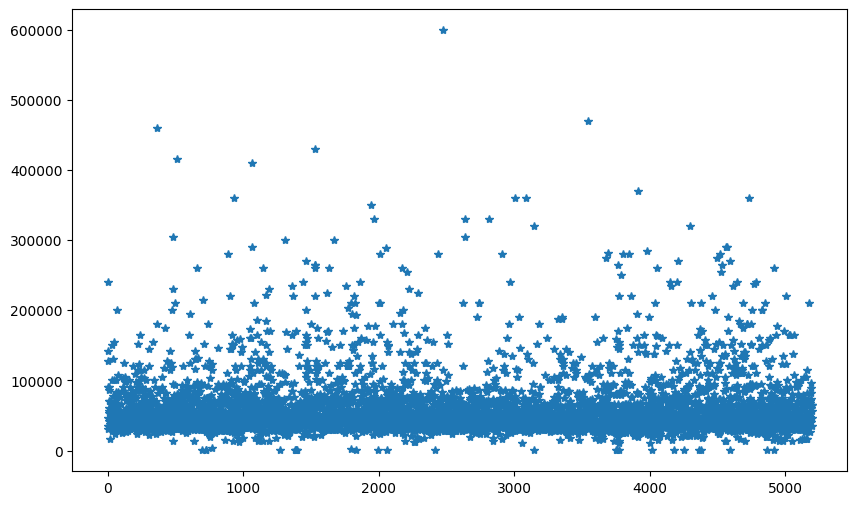

In [17]:
x_prices = data_olx["Prices"]
y_range = np.arange(len(data_olx))
plt.figure(figsize=(10,6))
plt.plot(y_range, x_prices, "*")

In [18]:
data_olx[data_olx.Prices>100000]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,85.0,12.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1,https://www.olx.uz/d/obyavlenie/tashkent-siti-...,Шайхантахурский район,Сегодня в 15:22,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,0.0,0.0,3,8,Кирпичный,Раздельная,2 санузла и более,0,Черновая отделка,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,0.0,0.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
35,https://www.olx.uz/d/obyavlenie/prodayu-m-elbe...,Мирабадский район,Сегодня в 15:11,продаю м Эльбек 4/3/4 Кир дом банковской 126к...,150000.0,Бизнес,Вторичный рынок,4,126.0,29.0,6.0,3,4,Панельный,Раздельная,Совмещенный,0,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
38,https://www.olx.uz/d/obyavlenie/4-komnatnaya-k...,Мирзо-Улугбекский район,Сегодня в 15:11,4-комнатная квартира (2+2) со свежим ремонтом ...,130000.0,Бизнес,Вторичный рынок,4,130.0,0.0,0.0,6,9,Панельный,Раздельная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5069,https://www.olx.uz/d/obyavlenie/ts-1-3-6-8-80m...,Мирзо-Улугбекский район,Сегодня в 14:35,Ц-1 3/6/8 80м2 евролюкс,165000.0,Бизнес,Новостройки,3,80.0,0.0,0.0,6,8,Кирпичный,Смежная,Совмещенный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5138,https://www.olx.uz/d/obyavlenie/4-komnatnaya-y...,Юнусабадский район,Сегодня в 14:53,4 комнатная Юнусабад-19 Не далеко Сайрам 4/1/5,105000.0,Бизнес,Вторичный рынок,4,104.0,0.0,12.0,1,5,Панельный,Раздельная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5152,https://www.olx.uz/d/obyavlenie/qora-tosh-medi...,Шайхантахурский район,Сегодня в 14:50,- Qora tosh Media park 4 / 6 / 9 100 kv Yevro...,105000.0,Бизнес,Вторичный рынок,4,100.0,95.0,0.0,6,9,Панельный,Раздельная,Раздельный,1,Евроремонт,1,1,0,0,1,1,0,1,0,0,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5165,https://www.olx.uz/d/obyavlenie/prodayu-kvarti...,Чиланзарский район,Сегодня в 14:59,Продаю квартиру,115000.0,Частное лицо,Новостройки,4,110.0,80.0,20.0,6,8,Кирпичный,Раздельная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,1,0


In [19]:
data_olx[data_olx.Prices<15000]


,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
484,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Яшнабадский район,Сегодня в 13:48,Срочно Продаётся 1 ком квартиру не далеко от р...,13000.000000,Бизнес,Вторичный рынок,1,20.00,0.0,0.0,3,4,Кирпичный,Студия,Совмещенный,0,Авторский проект,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
641,https://www.olx.uz/d/obyavlenie/srochno-40let-...,Яшнабадский район,Сегодня в 13:36,Срочно!!!40лет. Крестик. Лисунова. Дока хлеб. ...,14000.000000,Бизнес,Вторичный рынок,1,20.00,20.0,3.0,6,9,Панельный,Раздельная,Совмещенный,0,Средний,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,1,1,0
694,https://www.olx.uz/d/obyavlenie/vozle-doma-per...,Мирзо-Улугбекский район,Сегодня в 13:28,Возле дома перевозной,400.000000,Частное лицо,Новостройки,1,13.00,13.0,13.0,1,1,Панельный,Раздельная,Раздельный,0,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
727,https://www.olx.uz/d/obyavlenie/aktsiya-skidka...,Сергелийский район,Сегодня в 13:25,"Акция!!! скидка до 17% на SERGELI AVENUE, Серг...",560.000000,Бизнес,Новостройки,1,48.00,21.0,12.0,8,9,Кирпичный,Раздельная,Раздельный,0,Черновая отделка,1,0,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
728,https://www.olx.uz/d/obyavlenie/skidka-do-17-s...,Сергелийский район,Сегодня в 13:25,Скидка до 17% Современный комплекс на Сергелях...,560.000000,Бизнес,Новостройки,3,69.00,41.0,9.0,8,9,Кирпичный,Раздельная,Раздельный,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
773,https://www.olx.uz/d/obyavlenie/kvartira-sotil...,Чиланзарский район,Сегодня в 13:21,Квартира сотилади новостройка\nБелтепада жойла...,3333.000000,Частное лицо,Новостройки,1,120.00,120.0,120.0,1,5,Кирпичный,Раздельная,NaN,1,Авторский проект,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
867,https://www.olx.uz/d/obyavlenie/prodam-komnatu...,Яккасарайский район,Сегодня в 14:02,Продам комнату СВОЮ,14800.000000,Бизнес,Вторичный рынок,1,18.00,16.0,15.0,2,4,Кирпичный,Студия,Раздельный,0,Евроремонт,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
925,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Яшнабадский район,Сегодня в 15:26,Срочно Продаётся СВОЯ Квартира На Рисовым Базаре,13300.000000,Бизнес,Вторичный рынок,1,18.00,0.0,0.0,4,4,Кирпичный,Смежная,Совмещенный,0,Средний,0,0,0,0,0,1,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
973,https://www.olx.uz/d/obyavlenie/prodam-obschag...,Чиланзарский район,Сегодня в 15:36,Продам общагу чиланзар 3. Одна комнатная,12700.000000,Бизнес,Вторичный рынок,1,15.00,0.0,0.0,4,4,Кирпичный,Студия,NaN,1,Авторский проект,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,1,1,1,0,0,0,0,0
1111,https://www.olx.uz/d/obyavlenie/srochno-svoya-...,Яккасарайский район,Сегодня в 16:02,Срочно. Своя. Шота Руставели общага 18 м2,13200.000000,Бизнес,Вторичный рынок,1,18.00,0.0,0.0,4,4,Кирпичный,NaN,Совмещенный,0,Средний,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [20]:
#13 000 - 20 kv
#12 700 - 15 kv
#12 500 - 15 kv
#10 500 - 14 kv
#10 200 - 19 kv
# demak xulosa qilsak eng arzon uy hozircha 10 200 $  ga ekan (bolishi mumkin chunki kv kichkina ekan)


In [21]:
# 10 200 dan keyin eng kichiki qaysi
data_olx[data_olx.Prices<10200]
# 3333 # ekan demak xulosa qilsak 10 200 $ dan paslarini umumiy maydonga kopaytiramiz

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
694,https://www.olx.uz/d/obyavlenie/vozle-doma-per...,Мирзо-Улугбекский район,Сегодня в 13:28,Возле дома перевозной,400.0,Частное лицо,Новостройки,1,13.00,13.0,13.0,1,1,Панельный,Раздельная,Раздельный,0,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
727,https://www.olx.uz/d/obyavlenie/aktsiya-skidka...,Сергелийский район,Сегодня в 13:25,"Акция!!! скидка до 17% на SERGELI AVENUE, Серг...",560.0,Бизнес,Новостройки,1,48.00,21.0,12.0,8,9,Кирпичный,Раздельная,Раздельный,0,Черновая отделка,1,0,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
728,https://www.olx.uz/d/obyavlenie/skidka-do-17-s...,Сергелийский район,Сегодня в 13:25,Скидка до 17% Современный комплекс на Сергелях...,560.0,Бизнес,Новостройки,3,69.00,41.0,9.0,8,9,Кирпичный,Раздельная,Раздельный,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
773,https://www.olx.uz/d/obyavlenie/kvartira-sotil...,Чиланзарский район,Сегодня в 13:21,Квартира сотилади новостройка\nБелтепада жойла...,3333.0,Частное лицо,Новостройки,1,120.00,120.0,120.0,1,5,Кирпичный,Раздельная,NaN,1,Авторский проект,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1269,https://www.olx.uz/d/obyavlenie/nrg-mirzo-ulug...,Мирзо-Улугбекский район,Сегодня в 16:26,NRG Mirzo ulugbek новостройка ТОРГ 1200m²,1200.0,Частное лицо,Новостройки,2,60.00,60.0,11.0,2,9,NaN,Раздельная,Раздельный,0,Требует ремонта,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1387,https://www.olx.uz/d/obyavlenie/n-one-ajoyib-n...,Яккасарайский район,Сегодня в 07:26,“N ONE” ajoyib narxlarda xarid qiling,800.0,Бизнес,Новостройки,3,131.57,0.0,0.0,8,12,Монолитный,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1393,https://www.olx.uz/d/obyavlenie/novostroyke-ka...,Юнусабадский район,Сегодня в 07:25,"Новостройке ""KAZAKHSTAN"" продаются 3 комнатные...",1250.0,Бизнес,Новостройки,3,92.00,0.0,0.0,4,10,NaN,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,1,1,1,1,1,1,0,1,1,1,1,0,1,1,1,0
1394,https://www.olx.uz/d/obyavlenie/zhiloy-komplek...,Юнусабадский район,Сегодня в 07:25,"Жилой комплекс ""Казaхстан"" продаётся 3x комна...",1250.0,Бизнес,Новостройки,3,88.00,0.0,0.0,4,10,NaN,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1396,https://www.olx.uz/d/obyavlenie/zhiloy-komplek...,Юнусабадский район,Сегодня в 07:25,"Жилой комплекс ""KAZAKHSTAN"" новостройка",1250.0,Бизнес,Новостройки,2,110.00,110.0,0.0,5,10,Кирпичный,Раздельная,Раздельный,0,NaN,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1798,https://www.olx.uz/d/obyavlenie/4h-kom-kvartir...,Юнусабадский район,Сегодня в 08:06,4х ком квартира на Юнус-Абаде! ZI,2500.0,Бизнес,Новостройки,4,125.00,91.0,0.0,4,6,NaN,NaN,NaN,1,Средний,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0


In [22]:
data_olx.loc[data_olx.Prices<10200, "Prices"] = data_olx[data_olx.Prices<10200]["Prices"] * data_olx[data_olx.Prices<10200]["Umumiy maydoni"]


In [23]:
data_olx[data_olx.Prices<10200]
# Xulosa qilsak bu uyning 1-metr kv 400 $ bolsgan umumiy maydoni 13 ligini hisobga olsak, va uy 1-etajli kotej
# ekanini hisobga olsak bolishi mumkin

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
694,https://www.olx.uz/d/obyavlenie/vozle-doma-per...,Мирзо-Улугбекский район,Сегодня в 13:28,Возле дома перевозной,5200.0,Частное лицо,Новостройки,1,13.0,13.0,13.0,1,1,Панельный,Раздельная,Раздельный,0,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0


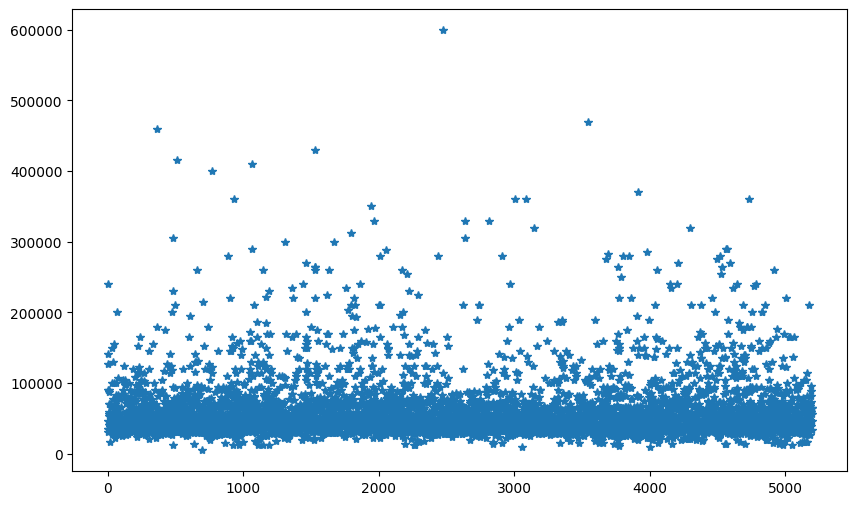

In [24]:
x_prices = data_olx["Prices"]
y_range = np.arange(len(data_olx))
plt.figure(figsize=(10,6))
plt.plot(y_range, x_prices, "*")

In [25]:
data_olx[(data_olx.Prices<20000) & (data_olx.Prices>10000)]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
18,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Мирабадский район,Сегодня в 15:17,Срочно Продаётся СВОЯ Квартира На Рисовым Базаре,16200.000000,Бизнес,Вторичный рынок,1,18.0,0.0,0.0,2,4,Кирпичный,Смежная,Совмещенный,0,Евроремонт,0,0,0,0,0,1,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
484,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Яшнабадский район,Сегодня в 13:48,Срочно Продаётся 1 ком квартиру не далеко от р...,13000.000000,Бизнес,Вторичный рынок,1,20.0,0.0,0.0,3,4,Кирпичный,Студия,Совмещенный,0,Авторский проект,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
641,https://www.olx.uz/d/obyavlenie/srochno-40let-...,Яшнабадский район,Сегодня в 13:36,Срочно!!!40лет. Крестик. Лисунова. Дока хлеб. ...,14000.000000,Бизнес,Вторичный рынок,1,20.0,20.0,3.0,6,9,Панельный,Раздельная,Совмещенный,0,Средний,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,1,1,0
754,https://www.olx.uz/d/obyavlenie/yangi-va-zamon...,Яшнабадский район,Сегодня в 13:23,"Янги ва замонавий уй жой мажмуасида, катта чег...",19339.285714,Бизнес,Новостройки,2,57.0,57.0,0.0,8,12,Монолитный,NaN,NaN,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
867,https://www.olx.uz/d/obyavlenie/prodam-komnatu...,Яккасарайский район,Сегодня в 14:02,Продам комнату СВОЮ,14800.000000,Бизнес,Вторичный рынок,1,18.0,16.0,15.0,2,4,Кирпичный,Студия,Раздельный,0,Евроремонт,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5112,https://www.olx.uz/d/obyavlenie/mirzo-ulugbek-...,Мирзо-Улугбекский район,Сегодня в 14:45,Мирзо Улугбек кабелний новостройка. 1/3/3. 15м...,15000.000000,Бизнес,Вторичный рынок,1,15.0,0.0,0.0,3,3,Панельный,Раздельная,Совмещенный,0,Средний,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5128,https://www.olx.uz/d/obyavlenie/prodazha-odnak...,Чиланзарский район,Сегодня в 14:47,Продажа. Однакомнатные Жатковские домики. 1/1/...,16700.000000,Бизнес,Новостройки,1,27.0,27.0,0.0,1,1,Кирпичный,Смежная,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5139,https://www.olx.uz/d/obyavlenie/prodaetsya-byv...,Чиланзарский район,Сегодня в 14:53,"Продаётся Бывшая общежития 1/3/5 Кирпич, С рем...",17000.000000,Бизнес,Вторичный рынок,1,18.0,0.0,0.0,3,5,Кирпичный,Раздельная,Раздельный,0,Евроремонт,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5157,https://www.olx.uz/d/obyavlenie/prodazha-zhatk...,Чиланзарский район,Сегодня в 14:49,"Продажа ,Жатковского типа. 1 ком. Старое Серге...",16700.000000,Бизнес,Новостройки,1,27.0,27.0,0.0,1,1,Кирпичный,Смежная,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [26]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
count,5201.00000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.0,5201.000000,5201.000000,5201.000000,5201.0
mean,61259.80803,2.378197,66.324811,8.843943,1.469908,3.700250,5.933667,0.431648,0.362238,0.334167,0.162084,0.168429,0.188233,0.340704,0.162661,0.447799,0.706979,0.706979,0.724668,0.725245,0.725822,0.698904,0.698904,0.698904,0.711594,0.711594,0.712748,0.0,0.715439,0.715439,0.713709,0.0
std,42831.76350,1.030411,36.453488,25.490466,6.312156,2.275864,2.835968,0.495354,0.480693,0.471744,0.368563,0.374283,0.390936,0.473991,0.369092,0.497315,0.455192,0.455192,0.446724,0.446434,0.446142,0.458778,0.458778,0.458778,0.453065,0.453065,0.452524,0.0,0.451248,0.451248,0.452071,0.0
min,5200.00000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
25%,38000.00000,2.000000,46.000000,0.000000,0.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
50%,49000.00000,2.000000,60.000000,0.000000,0.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
75%,67500.00000,3.000000,75.000000,0.000000,0.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
max,599000.00000,11.000000,600.000000,250.000000,150.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0


# 2 - qadam. Xato kiritilgan xona bor ekan shuni togirlaymiz

In [27]:
data_olx[data_olx.Xonalar>6]
# 6 xonadan katta uylarni tekshirib chiqamiz

# 1232 index 34 500 ga 11 xonalik uy bolmaydi kv = 33 metr  Info ga qarasak bu 2 xona. Togirlaymiz

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
337,https://www.olx.uz/d/obyavlenie/prodaetsya-4-4...,Мирзо-Улугбекский район,Сегодня в 14:13,Продаётся 4+4/1/5 Кора СУ-3,155000.0,Бизнес,Вторичный рынок,8,186.0,0.0,0.0,1,5,NaN,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
481,https://www.olx.uz/d/obyavlenie/prodaetsya-8-k...,Яккасарайский район,Сегодня в 13:49,Продаётся 8 комнат 4+5 эатжи 291м2 с ремонтом ...,230000.0,Бизнес,Вторичный рынок,8,291.0,0.0,0.0,4,5,Кирпичный,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1232,https://www.olx.uz/d/obyavlenie/chilanzar-24-1...,Чиланзарский район,Сегодня в 16:18,Чиланзар 24 1²/4/5 Срочно продается квартира,34500.0,Бизнес,Вторичный рынок,11,33.0,0.0,0.0,4,5,Кирпичный,NaN,Совмещенный,0,Евроремонт,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1366,https://www.olx.uz/d/obyavlenie/prodaetsya-gab...,Яккасарайский район,Сегодня в 16:47,"Продается Габус 7 комнат. Парк Бобур, центр го...",220000.0,Частное лицо,Вторичный рынок,7,291.0,0.0,0.0,4,5,Кирпичный,Пентхаус,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1714,https://www.olx.uz/d/obyavlenie/prodaetsya-7h-...,Мирзо-Улугбекский район,Сегодня в 07:52,Продаётся 7х ком квартира в Новостройке. Парке...,150000.0,Бизнес,Новостройки,7,223.0,0.0,0.0,7,7,NaN,NaN,NaN,1,Евроремонт,1,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3357,https://www.olx.uz/d/obyavlenie/yakkasaray-toy...,Яккасарайский район,Сегодня в 15:26,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,190000.0,Бизнес,Новостройки,8,300.0,0.0,0.0,8,9,Кирпичный,Раздельная,2 санузла и более,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3697,https://www.olx.uz/d/obyavlenie/maksim-gorkiy-...,Мирзо-Улугбекский район,Сегодня в 05:08,Максим горький 7/2/4 СРОЧНО,282000.0,Частное лицо,Вторичный рынок,7,261.0,0.0,0.0,2,4,NaN,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3801,https://www.olx.uz/d/obyavlenie/prodam-kvartir...,Яккасарайский район,Сегодня в 05:47,Продам квартиру 7/8/8 в новостройке Parisien о...,280000.0,Бизнес,Новостройки,7,232.0,0.0,0.0,8,8,NaN,NaN,2 санузла и более,1,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3914,https://www.olx.uz/d/obyavlenie/kvartira-240-m...,Мирабадский район,Сегодня в 06:12,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,11,240.0,0.0,0.0,5,5,Кирпичный,Пентхаус,2 санузла и более,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
4199,https://www.olx.uz/d/obyavlenie/toshkent-sh-se...,Сергелийский район,Сегодня в 08:42,Toshkent sh Sergili tuman Beruniy ko'chasida U...,128000.0,Частное лицо,Новостройки,7,2.9,250.0,0.0,2,2,Кирпичный,Раздельная,2 санузла и более,0,Евроремонт,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0,1,1,1,0,1,1,1,0


In [28]:
data_olx.iat[1232,7]

11

In [29]:
data_olx.iat[1232,7] = 2

In [30]:
data_olx[data_olx.Xonalar>6]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
337,https://www.olx.uz/d/obyavlenie/prodaetsya-4-4...,Мирзо-Улугбекский район,Сегодня в 14:13,Продаётся 4+4/1/5 Кора СУ-3,155000.0,Бизнес,Вторичный рынок,8,186.0,0.0,0.0,1,5,NaN,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
481,https://www.olx.uz/d/obyavlenie/prodaetsya-8-k...,Яккасарайский район,Сегодня в 13:49,Продаётся 8 комнат 4+5 эатжи 291м2 с ремонтом ...,230000.0,Бизнес,Вторичный рынок,8,291.0,0.0,0.0,4,5,Кирпичный,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1366,https://www.olx.uz/d/obyavlenie/prodaetsya-gab...,Яккасарайский район,Сегодня в 16:47,"Продается Габус 7 комнат. Парк Бобур, центр го...",220000.0,Частное лицо,Вторичный рынок,7,291.0,0.0,0.0,4,5,Кирпичный,Пентхаус,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1714,https://www.olx.uz/d/obyavlenie/prodaetsya-7h-...,Мирзо-Улугбекский район,Сегодня в 07:52,Продаётся 7х ком квартира в Новостройке. Парке...,150000.0,Бизнес,Новостройки,7,223.0,0.0,0.0,7,7,NaN,NaN,NaN,1,Евроремонт,1,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3357,https://www.olx.uz/d/obyavlenie/yakkasaray-toy...,Яккасарайский район,Сегодня в 15:26,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,190000.0,Бизнес,Новостройки,8,300.0,0.0,0.0,8,9,Кирпичный,Раздельная,2 санузла и более,0,Черновая отделка,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3697,https://www.olx.uz/d/obyavlenie/maksim-gorkiy-...,Мирзо-Улугбекский район,Сегодня в 05:08,Максим горький 7/2/4 СРОЧНО,282000.0,Частное лицо,Вторичный рынок,7,261.0,0.0,0.0,2,4,NaN,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3801,https://www.olx.uz/d/obyavlenie/prodam-kvartir...,Яккасарайский район,Сегодня в 05:47,Продам квартиру 7/8/8 в новостройке Parisien о...,280000.0,Бизнес,Новостройки,7,232.0,0.0,0.0,8,8,NaN,NaN,2 санузла и более,1,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3914,https://www.olx.uz/d/obyavlenie/kvartira-240-m...,Мирабадский район,Сегодня в 06:12,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,11,240.0,0.0,0.0,5,5,Кирпичный,Пентхаус,2 санузла и более,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
4199,https://www.olx.uz/d/obyavlenie/toshkent-sh-se...,Сергелийский район,Сегодня в 08:42,Toshkent sh Sergili tuman Beruniy ko'chasida U...,128000.0,Частное лицо,Новостройки,7,2.9,250.0,0.0,2,2,Кирпичный,Раздельная,2 санузла и более,0,Евроремонт,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0,1,1,1,0,1,1,1,0
4209,https://www.olx.uz/d/obyavlenie/prodam-kommerc...,Мирзо-Улугбекский район,Сегодня в 08:41,Продам коммерческую недвижимость Тахтапуль 200...,270000.0,Бизнес,Вторичный рынок,8,400.0,29.0,4.0,2,2,Кирпичный,Раздельная,Раздельный,0,Авторский проект,1,1,0,0,0,0,0,1,1,1,1,1,1,0,0,0,0,0,1,0,0,0,0,0


In [31]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
count,5201.00000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.0,5201.000000,5201.000000,5201.000000,5201.0
mean,61259.80803,2.376466,66.324811,8.843943,1.469908,3.700250,5.933667,0.431648,0.362238,0.334167,0.162084,0.168429,0.188233,0.340704,0.162661,0.447799,0.706979,0.706979,0.724668,0.725245,0.725822,0.698904,0.698904,0.698904,0.711594,0.711594,0.712748,0.0,0.715439,0.715439,0.713709,0.0
std,42831.76350,1.023463,36.453488,25.490466,6.312156,2.275864,2.835968,0.495354,0.480693,0.471744,0.368563,0.374283,0.390936,0.473991,0.369092,0.497315,0.455192,0.455192,0.446724,0.446434,0.446142,0.458778,0.458778,0.458778,0.453065,0.453065,0.452524,0.0,0.451248,0.451248,0.452071,0.0
min,5200.00000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
25%,38000.00000,2.000000,46.000000,0.000000,0.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
50%,49000.00000,2.000000,60.000000,0.000000,0.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
75%,67500.00000,3.000000,75.000000,0.000000,0.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
max,599000.00000,11.000000,600.000000,250.000000,150.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0


In [32]:
data_olx[data_olx.Prices>400000]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
368,https://www.olx.uz/d/obyavlenie/prodaetsya-got...,Шайхантахурский район,Сегодня в 14:01,Продается Готовоя квартира Ташкент сити bulva...,460000.0,Бизнес,Новостройки,3,118.0,118.0,35.0,3,7,NaN,Смежно-раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
510,https://www.olx.uz/d/obyavlenie/gabus-4-5-7-na...,Мирабадский район,Сегодня в 13:46,Габус 4/5/7 на улице Тараса Шевченко с Ремонтом,415000.0,Бизнес,Новостройки,4,230.0,0.0,0.0,5,7,Кирпичный,NaN,2 санузла и более,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1069,https://www.olx.uz/d/obyavlenie/mirabad-avenyu...,Шайхантахурский район,Сегодня в 15:49,Мирабад Авеню Д блок сдан в эксплуатацию /коро...,410000.0,Бизнес,Новостройки,4,193.0,0.0,0.0,4,10,NaN,Раздельная,2 санузла и более,0,NaN,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1534,https://www.olx.uz/d/obyavlenie/prodazha-novoo...,Шайхантахурский район,Сегодня в 07:34,Продажа новоостройки в Ташкентс сити 5/7/7,430000.0,Бизнес,Новостройки,5,234.0,134.0,12.0,7,7,Монолитный,Студия,Раздельный,0,Предчистовая отделка,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2473,https://www.olx.uz/d/obyavlenie/kvartira-klass...,Яккасарайский район,Сегодня в 10:50,Квартира класса LUX в 3 уровня.5 комнатная,599000.0,Бизнес,Новостройки,5,240.0,0.0,0.0,9,9,NaN,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3544,https://www.olx.uz/d/obyavlenie/prodaetsya-mag...,Юнусабадский район,16 апреля 2022 г.,"Продается магазин и евро квартира 5ком , Юнуса...",470000.0,Частное лицо,Новостройки,5,600.0,200.0,32.0,2,2,Кирпичный,Раздельная,NaN,1,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# 3 - qadam. Columnlarni tekshiramiz va kerak emaslarini ochiramiz

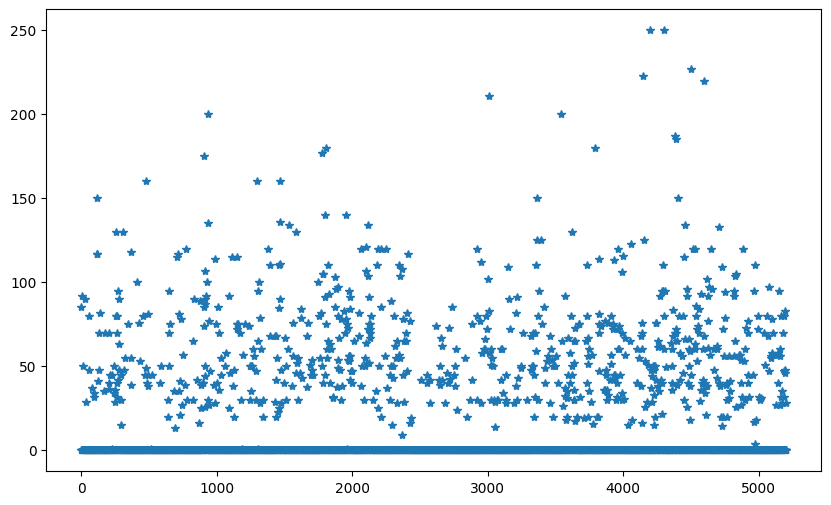

In [33]:
x_yashash = data_olx["Yashash maydoni"]
y_range = np.arange(len(data_olx))
plt.figure(figsize=(10,6))
plt.plot(y_range, x_yashash, "*")
# Yashash maydoni

In [34]:
data_olx[data_olx["Yashash maydoni"]>0]
# yashash maydoni columnni keshib tashlaymiz

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.00,85.00,12.00,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Мирзо-Улугбекский район,Сегодня в 15:20,Срочно продаётся своя квартира на Карасу 4,90000.0,Частное лицо,Вторичный рынок,4,92.00,92.00,0.00,1,9,Панельный,Смежно-раздельная,NaN,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
12,https://www.olx.uz/d/obyavlenie/novostroyka-2-...,Яккасарайский район,Сегодня в 15:18,Новостройка 2/3/7 яккасарай ул Шотаруставелли,57000.0,Бизнес,Новостройки,2,50.00,50.00,8.00,3,7,NaN,Раздельная,Раздельный,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
24,https://www.olx.uz/d/obyavlenie/zudlik-bilan-4...,Сергелийский район,Сегодня в 15:15,Зудлик билан 4хоналий5хона килинган 4/5Этажлий...,51000.0,Частное лицо,Вторичный рынок,4,92.00,90.00,7.00,4,5,Панельный,Раздельная,NaN,0,Евроремонт,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
35,https://www.olx.uz/d/obyavlenie/prodayu-m-elbe...,Мирабадский район,Сегодня в 15:11,продаю м Эльбек 4/3/4 Кир дом банковской 126к...,150000.0,Бизнес,Вторичный рынок,4,126.00,29.00,6.00,3,4,Панельный,Раздельная,Совмещенный,0,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5188,https://www.olx.uz/d/obyavlenie/uy-sotiladi-be...,Мирзо-Улугбекский район,Сегодня в 15:05,Уй сотилади. Без посредник,46000.0,Частное лицо,Вторичный рынок,3,62.00,47.00,0.00,2,4,NaN,Раздельная,Раздельный,0,Требует ремонта,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,1,1,1,0
5191,https://www.olx.uz/d/obyavlenie/oybek-ulitsa-t...,Мирабадский район,Сегодня в 15:04,Ойбек. улица Тараса Шевченко. 82 000 у.е.,82000.0,Частное лицо,Вторичный рынок,3,68.99,48.07,6.55,3,3,Кирпичный,NaN,Совмещенный,1,Средний,0,1,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,0,0,1,1,1,0
5192,https://www.olx.uz/d/obyavlenie/chilanzar-7-2-...,Чиланзарский район,Сегодня в 15:03,"Чиланзар-7, 2 ком. 2-этаж. Новостройка 2015 г....",60000.0,Частное лицо,Новостройки,2,46.00,46.00,0.00,2,4,Кирпичный,Смежная,Совмещенный,1,Требует ремонта,1,0,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,1,1,1,0
5194,https://www.olx.uz/d/obyavlenie/tahtapulda-lyu...,Алмазарский район,Сегодня в 15:03,Тахтапулда Люкс новостройка 4 хона,89000.0,Бизнес,Новостройки,4,86.00,83.00,20.00,5,7,Кирпичный,Раздельная,2 санузла и более,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0


In [35]:
data_olx.drop(["Yashash maydoni"], axis=1, inplace=True)
data_olx

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,12.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1,https://www.olx.uz/d/obyavlenie/tashkent-siti-...,Шайхантахурский район,Сегодня в 15:22,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,0.0,3,8,Кирпичный,Раздельная,2 санузла и более,0,Черновая отделка,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2,https://www.olx.uz/d/obyavlenie/remont-dlya-se...,Чиланзарский район,Сегодня в 15:21,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,0.0,1,4,Панельный,Смежная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,0.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
4,https://www.olx.uz/d/obyavlenie/odnokomnatnaya...,Алмазарский район,Сегодня в 15:20,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,0.0,4,5,Панельный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,https://www.olx.uz/d/obyavlenie/chilanzar-2-kv...,Чиланзарский район,Сегодня в 15:01,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,0.0,1,4,Кирпичный,Смежно-раздельная,Совмещенный,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5197,https://www.olx.uz/d/obyavlenie/2-1-6-srochno-...,Чиланзарский район,Сегодня в 15:01,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,0.0,1,6,Кирпичный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5198,https://www.olx.uz/d/obyavlenie/u-nas-deshevle...,Чиланзарский район,Сегодня в 15:01,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,0.0,2,4,Панельный,Смежная,Раздельный,1,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5199,https://www.olx.uz/d/obyavlenie/optovyy-rynok-...,Чиланзарский район,Сегодня в 15:01,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,0.0,2,4,Кирпичный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [36]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Oshxona maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
count,5201.00000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.0,5201.000000,5201.000000,5201.000000,5201.0
mean,61259.80803,2.376466,66.324811,1.469908,3.700250,5.933667,0.431648,0.362238,0.334167,0.162084,0.168429,0.188233,0.340704,0.162661,0.447799,0.706979,0.706979,0.724668,0.725245,0.725822,0.698904,0.698904,0.698904,0.711594,0.711594,0.712748,0.0,0.715439,0.715439,0.713709,0.0
std,42831.76350,1.023463,36.453488,6.312156,2.275864,2.835968,0.495354,0.480693,0.471744,0.368563,0.374283,0.390936,0.473991,0.369092,0.497315,0.455192,0.455192,0.446724,0.446434,0.446142,0.458778,0.458778,0.458778,0.453065,0.453065,0.452524,0.0,0.451248,0.451248,0.452071,0.0
min,5200.00000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
25%,38000.00000,2.000000,46.000000,0.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
50%,49000.00000,2.000000,60.000000,0.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
75%,67500.00000,3.000000,75.000000,0.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
max,599000.00000,11.000000,600.000000,150.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0


In [37]:
data_olx.drop(["Oshxona maydoni"], axis=1, inplace=True)

In [38]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
count,5201.00000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.0,5201.000000,5201.000000,5201.000000,5201.0
mean,61259.80803,2.376466,66.324811,3.700250,5.933667,0.431648,0.362238,0.334167,0.162084,0.168429,0.188233,0.340704,0.162661,0.447799,0.706979,0.706979,0.724668,0.725245,0.725822,0.698904,0.698904,0.698904,0.711594,0.711594,0.712748,0.0,0.715439,0.715439,0.713709,0.0
std,42831.76350,1.023463,36.453488,2.275864,2.835968,0.495354,0.480693,0.471744,0.368563,0.374283,0.390936,0.473991,0.369092,0.497315,0.455192,0.455192,0.446724,0.446434,0.446142,0.458778,0.458778,0.458778,0.453065,0.453065,0.452524,0.0,0.451248,0.451248,0.452071,0.0
min,5200.00000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
25%,38000.00000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
50%,49000.00000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
75%,67500.00000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
max,599000.00000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0


### Televizor

In [39]:
data_olx[data_olx.Televizor>0]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2,https://www.olx.uz/d/obyavlenie/remont-dlya-se...,Чиланзарский район,Сегодня в 15:21,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,Панельный,Смежная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Мирзо-Улугбекский район,Сегодня в 15:20,Срочно продаётся своя квартира на Карасу 4,90000.0,Частное лицо,Вторичный рынок,4,92.0,1,9,Панельный,Смежно-раздельная,NaN,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
9,https://www.olx.uz/d/obyavlenie/chilonzar-16-2...,Чиланзарский район,Сегодня в 15:19,Чилонзар-16 2/3/4/балкон 1.5х3,41500.0,Бизнес,Вторичный рынок,2,50.0,3,5,Панельный,Смежная,Раздельный,1,Средний,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5189,https://www.olx.uz/d/obyavlenie/ul-chehova-2-1...,Мирабадский район,Сегодня в 15:04,"ул. Чехова, 2/1/4 - 55 м2, высокопотолочн. дом",73000.0,Бизнес,Вторичный рынок,2,55.0,1,4,Кирпичный,NaN,NaN,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5192,https://www.olx.uz/d/obyavlenie/chilanzar-7-2-...,Чиланзарский район,Сегодня в 15:03,"Чиланзар-7, 2 ком. 2-этаж. Новостройка 2015 г....",60000.0,Частное лицо,Новостройки,2,46.0,2,4,Кирпичный,Смежная,Совмещенный,1,Требует ремонта,1,0,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,1,1,1,0
5194,https://www.olx.uz/d/obyavlenie/tahtapulda-lyu...,Алмазарский район,Сегодня в 15:03,Тахтапулда Люкс новостройка 4 хона,89000.0,Бизнес,Новостройки,4,86.0,5,7,Кирпичный,Раздельная,2 санузла и более,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5196,https://www.olx.uz/d/obyavlenie/chilanzar-2-kv...,Чиланзарский район,Сегодня в 15:01,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,Кирпичный,Смежно-раздельная,Совмещенный,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [40]:
data_olx[(data_olx.Televizor>0) & ((data_olx["Turar joyi"]=="Новостройки"))]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
14,https://www.olx.uz/d/obyavlenie/prodaetsya-kva...,Юнусабадский район,Сегодня в 15:18,Продаётся квартира Ц2 2/8/8,70000.0,Бизнес,Новостройки,2,52.0,8,8,NaN,NaN,NaN,1,Авторский проект,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
15,https://www.olx.uz/d/obyavlenie/novostroyka-76...,Шайхантахурский район,Сегодня в 15:17,Novostroyka 76 kv Gunchada 3 xonali,70000.0,Частное лицо,Новостройки,3,76.0,5,6,Кирпичный,Раздельная,Раздельный,0,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
119,https://www.olx.uz/d/obyavlenie/dream-hause-na...,Яккасарайский район,Сегодня в 14:51,Dream Hause Навостройка продается очень срочно,125000.0,Бизнес,Новостройки,4,150.0,3,7,Кирпичный,Раздельная,2 санузла и более,0,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5069,https://www.olx.uz/d/obyavlenie/ts-1-3-6-8-80m...,Мирзо-Улугбекский район,Сегодня в 14:35,Ц-1 3/6/8 80м2 евролюкс,165000.0,Бизнес,Новостройки,3,80.0,6,8,Кирпичный,Смежная,Совмещенный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5079,https://www.olx.uz/d/obyavlenie/tinchlik-metro...,Алмазарский район,Сегодня в 14:44,- Tinchlik metro Yangi turar joy 3 / 3 / 5 10...,97000.0,Бизнес,Новостройки,3,100.0,3,5,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5165,https://www.olx.uz/d/obyavlenie/prodayu-kvarti...,Чиланзарский район,Сегодня в 14:59,Продаю квартиру,115000.0,Частное лицо,Новостройки,4,110.0,6,8,Кирпичный,Раздельная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,1,0
5192,https://www.olx.uz/d/obyavlenie/chilanzar-7-2-...,Чиланзарский район,Сегодня в 15:03,"Чиланзар-7, 2 ком. 2-этаж. Новостройка 2015 г....",60000.0,Частное лицо,Новостройки,2,46.0,2,4,Кирпичный,Смежная,Совмещенный,1,Требует ремонта,1,0,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,1,1,1,0


In [41]:
data_olx["Remont"].unique()

array(['Евроремонт', 'Черновая отделка', 'Авторский проект', nan,
       'Средний', 'Требует ремонта', 'Предчистовая отделка'], dtype=object)

In [42]:
data_olx[(data_olx.Televizor>0) & ((data_olx["Turar joyi"]=="Новостройки") & ((data_olx["Remont"]=="Черновая отделка") | (data_olx["Remont"]=="Предчистовая отделка")))]


,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
643,https://www.olx.uz/d/obyavlenie/1-2-8-zhk-nrg-...,Мирабадский район,Сегодня в 13:35,1/2/8 - ЖК NRG Oybek - Нукусская - Госпиталка ...,43999.0,Бизнес,Новостройки,1,30.0,7,12,Кирпичный,NaN,Совмещенный,0,Предчистовая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1860,https://www.olx.uz/d/obyavlenie/suroochni-prod...,Яшнабадский район,Сегодня в 08:20,Суроочни продаются 4 ком новостройка паркентск...,120000.0,Бизнес,Новостройки,4,137.0,3,9,Кирпичный,Раздельная,2 санузла и более,1,Черновая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2136,https://www.olx.uz/d/obyavlenie/yangi-uylar-so...,Яшнабадский район,Сегодня в 09:22,Янги Уйлар сотилади Супер нархда.,69000.0,Частное лицо,Новостройки,3,95.0,3,8,Кирпичный,Раздельная,Раздельный,0,Черновая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2971,https://www.olx.uz/d/obyavlenie/tayyor-navatro...,Чиланзарский район,Сегодня в 12:50,Таййор Наватройка 2 хона 62 м²,37000.0,Бизнес,Новостройки,2,62.0,4,5,Кирпичный,Раздельная,Раздельный,0,Черновая отделка,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0


Televizor ustunga qarasak xulosa umumiy 843 datada bor. 191 tasi yangi qurilgan uyda ekan lekin yangiqutilgan uylar kopinch bo'sh boladi va agar Черновая отделка yoki Предчистовая отделка u yerda aniq televizor bolmaydi bizda shunaqa data atiga 4 ta ekan yani biz umumiy 843 tadan 4 tasini xato deyishimiz mumkin
bu yomon emas shuning uchun Televizor columnni olib qolamiz

In [43]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
count,5201.00000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.0,5201.000000,5201.000000,5201.000000,5201.0
mean,61259.80803,2.376466,66.324811,3.700250,5.933667,0.431648,0.362238,0.334167,0.162084,0.168429,0.188233,0.340704,0.162661,0.447799,0.706979,0.706979,0.724668,0.725245,0.725822,0.698904,0.698904,0.698904,0.711594,0.711594,0.712748,0.0,0.715439,0.715439,0.713709,0.0
std,42831.76350,1.023463,36.453488,2.275864,2.835968,0.495354,0.480693,0.471744,0.368563,0.374283,0.390936,0.473991,0.369092,0.497315,0.455192,0.455192,0.446724,0.446434,0.446142,0.458778,0.458778,0.458778,0.453065,0.453065,0.452524,0.0,0.451248,0.451248,0.452071,0.0
min,5200.00000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
25%,38000.00000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
50%,49000.00000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
75%,67500.00000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
max,599000.00000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0


### Muzlatgich

In [44]:
data_olx[data_olx.Muzlatgich>0]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2,https://www.olx.uz/d/obyavlenie/remont-dlya-se...,Чиланзарский район,Сегодня в 15:21,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,Панельный,Смежная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Мирзо-Улугбекский район,Сегодня в 15:20,Срочно продаётся своя квартира на Карасу 4,90000.0,Частное лицо,Вторичный рынок,4,92.0,1,9,Панельный,Смежно-раздельная,NaN,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
9,https://www.olx.uz/d/obyavlenie/chilonzar-16-2...,Чиланзарский район,Сегодня в 15:19,Чилонзар-16 2/3/4/балкон 1.5х3,41500.0,Бизнес,Вторичный рынок,2,50.0,3,5,Панельный,Смежная,Раздельный,1,Средний,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5189,https://www.olx.uz/d/obyavlenie/ul-chehova-2-1...,Мирабадский район,Сегодня в 15:04,"ул. Чехова, 2/1/4 - 55 м2, высокопотолочн. дом",73000.0,Бизнес,Вторичный рынок,2,55.0,1,4,Кирпичный,NaN,NaN,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5192,https://www.olx.uz/d/obyavlenie/chilanzar-7-2-...,Чиланзарский район,Сегодня в 15:03,"Чиланзар-7, 2 ком. 2-этаж. Новостройка 2015 г....",60000.0,Частное лицо,Новостройки,2,46.0,2,4,Кирпичный,Смежная,Совмещенный,1,Требует ремонта,1,0,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,1,1,1,0
5194,https://www.olx.uz/d/obyavlenie/tahtapulda-lyu...,Алмазарский район,Сегодня в 15:03,Тахтапулда Люкс новостройка 4 хона,89000.0,Бизнес,Новостройки,4,86.0,5,7,Кирпичный,Раздельная,2 санузла и более,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5196,https://www.olx.uz/d/obyavlenie/chilanzar-2-kv...,Чиланзарский район,Сегодня в 15:01,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,Кирпичный,Смежно-раздельная,Совмещенный,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [45]:
data_olx[(data_olx.Muzlatgich>0) & (data_olx["Turar joyi"]=="Новостройки")]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
14,https://www.olx.uz/d/obyavlenie/prodaetsya-kva...,Юнусабадский район,Сегодня в 15:18,Продаётся квартира Ц2 2/8/8,70000.0,Бизнес,Новостройки,2,52.0,8,8,NaN,NaN,NaN,1,Авторский проект,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
15,https://www.olx.uz/d/obyavlenie/novostroyka-76...,Шайхантахурский район,Сегодня в 15:17,Novostroyka 76 kv Gunchada 3 xonali,70000.0,Частное лицо,Новостройки,3,76.0,5,6,Кирпичный,Раздельная,Раздельный,0,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
119,https://www.olx.uz/d/obyavlenie/dream-hause-na...,Яккасарайский район,Сегодня в 14:51,Dream Hause Навостройка продается очень срочно,125000.0,Бизнес,Новостройки,4,150.0,3,7,Кирпичный,Раздельная,2 санузла и более,0,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5069,https://www.olx.uz/d/obyavlenie/ts-1-3-6-8-80m...,Мирзо-Улугбекский район,Сегодня в 14:35,Ц-1 3/6/8 80м2 евролюкс,165000.0,Бизнес,Новостройки,3,80.0,6,8,Кирпичный,Смежная,Совмещенный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5079,https://www.olx.uz/d/obyavlenie/tinchlik-metro...,Алмазарский район,Сегодня в 14:44,- Tinchlik metro Yangi turar joy 3 / 3 / 5 10...,97000.0,Бизнес,Новостройки,3,100.0,3,5,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5165,https://www.olx.uz/d/obyavlenie/prodayu-kvarti...,Чиланзарский район,Сегодня в 14:59,Продаю квартиру,115000.0,Частное лицо,Новостройки,4,110.0,6,8,Кирпичный,Раздельная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,1,0
5192,https://www.olx.uz/d/obyavlenie/chilanzar-7-2-...,Чиланзарский район,Сегодня в 15:03,"Чиланзар-7, 2 ком. 2-этаж. Новостройка 2015 г....",60000.0,Частное лицо,Новостройки,2,46.0,2,4,Кирпичный,Смежная,Совмещенный,1,Требует ремонта,1,0,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,1,1,1,0


In [46]:
data_olx[(data_olx.Muzlatgich>0) & ((data_olx["Turar joyi"]=="Новостройки") & ((data_olx["Remont"]=="Черновая отделка") | (data_olx["Remont"]=="Предчистовая отделка")))]


,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
643,https://www.olx.uz/d/obyavlenie/1-2-8-zhk-nrg-...,Мирабадский район,Сегодня в 13:35,1/2/8 - ЖК NRG Oybek - Нукусская - Госпиталка ...,43999.0,Бизнес,Новостройки,1,30.0,7,12,Кирпичный,NaN,Совмещенный,0,Предчистовая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1860,https://www.olx.uz/d/obyavlenie/suroochni-prod...,Яшнабадский район,Сегодня в 08:20,Суроочни продаются 4 ком новостройка паркентск...,120000.0,Бизнес,Новостройки,4,137.0,3,9,Кирпичный,Раздельная,2 санузла и более,1,Черновая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2136,https://www.olx.uz/d/obyavlenie/yangi-uylar-so...,Яшнабадский район,Сегодня в 09:22,Янги Уйлар сотилади Супер нархда.,69000.0,Частное лицо,Новостройки,3,95.0,3,8,Кирпичный,Раздельная,Раздельный,0,Черновая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2971,https://www.olx.uz/d/obyavlenie/tayyor-navatro...,Чиланзарский район,Сегодня в 12:50,Таййор Наватройка 2 хона 62 м²,37000.0,Бизнес,Новостройки,2,62.0,4,5,Кирпичный,Раздельная,Раздельный,0,Черновая отделка,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0


Muzlatgichga ustunga qarasak xulosa umumiy 876 datada bor. 208 tasi yangi qurilgan uyda ekan lekin yangi qurilgan uylar ko'pincha bosh bo'ladi va agar Черновая отделка yoki Предчистовая отделка u yerda aniq Muzlatgich bo'lmaydi bizda shunaqa data atiga 4 ta ekan yani biz umumiy 876 tadan 4 tasini xato deyishimiz mumkin
bu yomon emas shuning uchun Muzlatgich columnni olib qolamiz

In [47]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
count,5201.00000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.0,5201.000000,5201.000000,5201.000000,5201.0
mean,61259.80803,2.376466,66.324811,3.700250,5.933667,0.431648,0.362238,0.334167,0.162084,0.168429,0.188233,0.340704,0.162661,0.447799,0.706979,0.706979,0.724668,0.725245,0.725822,0.698904,0.698904,0.698904,0.711594,0.711594,0.712748,0.0,0.715439,0.715439,0.713709,0.0
std,42831.76350,1.023463,36.453488,2.275864,2.835968,0.495354,0.480693,0.471744,0.368563,0.374283,0.390936,0.473991,0.369092,0.497315,0.455192,0.455192,0.446724,0.446434,0.446142,0.458778,0.458778,0.458778,0.453065,0.453065,0.452524,0.0,0.451248,0.451248,0.452071,0.0
min,5200.00000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
25%,38000.00000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
50%,49000.00000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
75%,67500.00000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
max,599000.00000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0


### Konditsioner

In [48]:
data_olx[data_olx.Konditsioner>0]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2,https://www.olx.uz/d/obyavlenie/remont-dlya-se...,Чиланзарский район,Сегодня в 15:21,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,Панельный,Смежная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Мирзо-Улугбекский район,Сегодня в 15:20,Срочно продаётся своя квартира на Карасу 4,90000.0,Частное лицо,Вторичный рынок,4,92.0,1,9,Панельный,Смежно-раздельная,NaN,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
9,https://www.olx.uz/d/obyavlenie/chilonzar-16-2...,Чиланзарский район,Сегодня в 15:19,Чилонзар-16 2/3/4/балкон 1.5х3,41500.0,Бизнес,Вторичный рынок,2,50.0,3,5,Панельный,Смежная,Раздельный,1,Средний,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5189,https://www.olx.uz/d/obyavlenie/ul-chehova-2-1...,Мирабадский район,Сегодня в 15:04,"ул. Чехова, 2/1/4 - 55 м2, высокопотолочн. дом",73000.0,Бизнес,Вторичный рынок,2,55.0,1,4,Кирпичный,NaN,NaN,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5192,https://www.olx.uz/d/obyavlenie/chilanzar-7-2-...,Чиланзарский район,Сегодня в 15:03,"Чиланзар-7, 2 ком. 2-этаж. Новостройка 2015 г....",60000.0,Частное лицо,Новостройки,2,46.0,2,4,Кирпичный,Смежная,Совмещенный,1,Требует ремонта,1,0,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,1,1,1,0
5194,https://www.olx.uz/d/obyavlenie/tahtapulda-lyu...,Алмазарский район,Сегодня в 15:03,Тахтапулда Люкс новостройка 4 хона,89000.0,Бизнес,Новостройки,4,86.0,5,7,Кирпичный,Раздельная,2 санузла и более,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5196,https://www.olx.uz/d/obyavlenie/chilanzar-2-kv...,Чиланзарский район,Сегодня в 15:01,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,Кирпичный,Смежно-раздельная,Совмещенный,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [49]:
data_olx[(data_olx.Konditsioner>0) & (data_olx["Turar joyi"]=="Новостройки")]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.00,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.00,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
14,https://www.olx.uz/d/obyavlenie/prodaetsya-kva...,Юнусабадский район,Сегодня в 15:18,Продаётся квартира Ц2 2/8/8,70000.0,Бизнес,Новостройки,2,52.00,8,8,NaN,NaN,NaN,1,Авторский проект,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
15,https://www.olx.uz/d/obyavlenie/novostroyka-76...,Шайхантахурский район,Сегодня в 15:17,Novostroyka 76 kv Gunchada 3 xonali,70000.0,Частное лицо,Новостройки,3,76.00,5,6,Кирпичный,Раздельная,Раздельный,0,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
119,https://www.olx.uz/d/obyavlenie/dream-hause-na...,Яккасарайский район,Сегодня в 14:51,Dream Hause Навостройка продается очень срочно,125000.0,Бизнес,Новостройки,4,150.00,3,7,Кирпичный,Раздельная,2 санузла и более,0,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5078,https://www.olx.uz/d/obyavlenie/nedvizhimost-d...,Юнусабадский район,Сегодня в 14:44,Недвижимость дома,90000.0,Частное лицо,Новостройки,2,79.54,1,1,Кирпичный,Раздельная,Раздельный,0,Средний,1,1,0,0,1,0,0,1,1,1,0,1,1,0,0,0,1,1,1,0,1,1,1,0
5079,https://www.olx.uz/d/obyavlenie/tinchlik-metro...,Алмазарский район,Сегодня в 14:44,- Tinchlik metro Yangi turar joy 3 / 3 / 5 10...,97000.0,Бизнес,Новостройки,3,100.00,3,5,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5165,https://www.olx.uz/d/obyavlenie/prodayu-kvarti...,Чиланзарский район,Сегодня в 14:59,Продаю квартиру,115000.0,Частное лицо,Новостройки,4,110.00,6,8,Кирпичный,Раздельная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,1,0
5192,https://www.olx.uz/d/obyavlenie/chilanzar-7-2-...,Чиланзарский район,Сегодня в 15:03,"Чиланзар-7, 2 ком. 2-этаж. Новостройка 2015 г....",60000.0,Частное лицо,Новостройки,2,46.00,2,4,Кирпичный,Смежная,Совмещенный,1,Требует ремонта,1,0,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,1,1,1,0


In [50]:
data_olx[(data_olx.Konditsioner>0) & ((data_olx["Turar joyi"]=="Новостройки") & ((data_olx["Remont"]=="Черновая отделка") | (data_olx["Remont"]=="Предчистовая отделка")))]


,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
643,https://www.olx.uz/d/obyavlenie/1-2-8-zhk-nrg-...,Мирабадский район,Сегодня в 13:35,1/2/8 - ЖК NRG Oybek - Нукусская - Госпиталка ...,43999.0,Бизнес,Новостройки,1,30.0,7,12,Кирпичный,NaN,Совмещенный,0,Предчистовая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1860,https://www.olx.uz/d/obyavlenie/suroochni-prod...,Яшнабадский район,Сегодня в 08:20,Суроочни продаются 4 ком новостройка паркентск...,120000.0,Бизнес,Новостройки,4,137.0,3,9,Кирпичный,Раздельная,2 санузла и более,1,Черновая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2136,https://www.olx.uz/d/obyavlenie/yangi-uylar-so...,Яшнабадский район,Сегодня в 09:22,Янги Уйлар сотилади Супер нархда.,69000.0,Частное лицо,Новостройки,3,95.0,3,8,Кирпичный,Раздельная,Раздельный,0,Черновая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2971,https://www.olx.uz/d/obyavlenie/tayyor-navatro...,Чиланзарский район,Сегодня в 12:50,Таййор Наватройка 2 хона 62 м²,37000.0,Бизнес,Новостройки,2,62.0,4,5,Кирпичный,Раздельная,Раздельный,0,Черновая отделка,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0


Konditsioner ustunga qarasak xulosa umumiy 979 datada bor. 230 tasi yangi qurilgan uyda ekan lekin yangi qurilgan uylar ko'pincha bosh boladi va agar Черновая отделка yoki Предчистовая отделка u yerda aniq Konditsioner bo'lmaydi bizda shunaqa data atiga 4 ta ekan ya'ni biz umumiy 979 tadan 4 tasini xato deyishimiz mumkin bu yomon emas shuning uchun Konditsioner columnni olib qolamiz


In [51]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
count,5201.00000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.0,5201.000000,5201.000000,5201.000000,5201.0
mean,61259.80803,2.376466,66.324811,3.700250,5.933667,0.431648,0.362238,0.334167,0.162084,0.168429,0.188233,0.340704,0.162661,0.447799,0.706979,0.706979,0.724668,0.725245,0.725822,0.698904,0.698904,0.698904,0.711594,0.711594,0.712748,0.0,0.715439,0.715439,0.713709,0.0
std,42831.76350,1.023463,36.453488,2.275864,2.835968,0.495354,0.480693,0.471744,0.368563,0.374283,0.390936,0.473991,0.369092,0.497315,0.455192,0.455192,0.446724,0.446434,0.446142,0.458778,0.458778,0.458778,0.453065,0.453065,0.452524,0.0,0.451248,0.451248,0.452071,0.0
min,5200.00000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
25%,38000.00000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
50%,49000.00000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
75%,67500.00000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
max,599000.00000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0


### Kir mashina

In [52]:
data_olx[data_olx["Kir mashina"]>0]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2,https://www.olx.uz/d/obyavlenie/remont-dlya-se...,Чиланзарский район,Сегодня в 15:21,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,Панельный,Смежная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Мирзо-Улугбекский район,Сегодня в 15:20,Срочно продаётся своя квартира на Карасу 4,90000.0,Частное лицо,Вторичный рынок,4,92.0,1,9,Панельный,Смежно-раздельная,NaN,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
9,https://www.olx.uz/d/obyavlenie/chilonzar-16-2...,Чиланзарский район,Сегодня в 15:19,Чилонзар-16 2/3/4/балкон 1.5х3,41500.0,Бизнес,Вторичный рынок,2,50.0,3,5,Панельный,Смежная,Раздельный,1,Средний,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5189,https://www.olx.uz/d/obyavlenie/ul-chehova-2-1...,Мирабадский район,Сегодня в 15:04,"ул. Чехова, 2/1/4 - 55 м2, высокопотолочн. дом",73000.0,Бизнес,Вторичный рынок,2,55.0,1,4,Кирпичный,NaN,NaN,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5192,https://www.olx.uz/d/obyavlenie/chilanzar-7-2-...,Чиланзарский район,Сегодня в 15:03,"Чиланзар-7, 2 ком. 2-этаж. Новостройка 2015 г....",60000.0,Частное лицо,Новостройки,2,46.0,2,4,Кирпичный,Смежная,Совмещенный,1,Требует ремонта,1,0,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,1,1,1,0
5194,https://www.olx.uz/d/obyavlenie/tahtapulda-lyu...,Алмазарский район,Сегодня в 15:03,Тахтапулда Люкс новостройка 4 хона,89000.0,Бизнес,Новостройки,4,86.0,5,7,Кирпичный,Раздельная,2 санузла и более,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5196,https://www.olx.uz/d/obyavlenie/chilanzar-2-kv...,Чиланзарский район,Сегодня в 15:01,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,Кирпичный,Смежно-раздельная,Совмещенный,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [53]:
data_olx[(data_olx["Kir mashina"]>0) & (data_olx["Turar joyi"]=="Новостройки")]

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
14,https://www.olx.uz/d/obyavlenie/prodaetsya-kva...,Юнусабадский район,Сегодня в 15:18,Продаётся квартира Ц2 2/8/8,70000.0,Бизнес,Новостройки,2,52.0,8,8,NaN,NaN,NaN,1,Авторский проект,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
15,https://www.olx.uz/d/obyavlenie/novostroyka-76...,Шайхантахурский район,Сегодня в 15:17,Novostroyka 76 kv Gunchada 3 xonali,70000.0,Частное лицо,Новостройки,3,76.0,5,6,Кирпичный,Раздельная,Раздельный,0,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
119,https://www.olx.uz/d/obyavlenie/dream-hause-na...,Яккасарайский район,Сегодня в 14:51,Dream Hause Навостройка продается очень срочно,125000.0,Бизнес,Новостройки,4,150.0,3,7,Кирпичный,Раздельная,2 санузла и более,0,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5069,https://www.olx.uz/d/obyavlenie/ts-1-3-6-8-80m...,Мирзо-Улугбекский район,Сегодня в 14:35,Ц-1 3/6/8 80м2 евролюкс,165000.0,Бизнес,Новостройки,3,80.0,6,8,Кирпичный,Смежная,Совмещенный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5079,https://www.olx.uz/d/obyavlenie/tinchlik-metro...,Алмазарский район,Сегодня в 14:44,- Tinchlik metro Yangi turar joy 3 / 3 / 5 10...,97000.0,Бизнес,Новостройки,3,100.0,3,5,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,0,1,1,1,0
5165,https://www.olx.uz/d/obyavlenie/prodayu-kvarti...,Чиланзарский район,Сегодня в 14:59,Продаю квартиру,115000.0,Частное лицо,Новостройки,4,110.0,6,8,Кирпичный,Раздельная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,1,0
5192,https://www.olx.uz/d/obyavlenie/chilanzar-7-2-...,Чиланзарский район,Сегодня в 15:03,"Чиланзар-7, 2 ком. 2-этаж. Новостройка 2015 г....",60000.0,Частное лицо,Новостройки,2,46.0,2,4,Кирпичный,Смежная,Совмещенный,1,Требует ремонта,1,0,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,1,1,1,0


In [54]:
data_olx[(data_olx["Kir mashina"]>0) & ((data_olx["Turar joyi"]=="Новостройки") & ((data_olx["Remont"]=="Черновая отделка") | (data_olx["Remont"]=="Предчистовая отделка")))]


,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
643,https://www.olx.uz/d/obyavlenie/1-2-8-zhk-nrg-...,Мирабадский район,Сегодня в 13:35,1/2/8 - ЖК NRG Oybek - Нукусская - Госпиталка ...,43999.0,Бизнес,Новостройки,1,30.0,7,12,Кирпичный,NaN,Совмещенный,0,Предчистовая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1860,https://www.olx.uz/d/obyavlenie/suroochni-prod...,Яшнабадский район,Сегодня в 08:20,Суроочни продаются 4 ком новостройка паркентск...,120000.0,Бизнес,Новостройки,4,137.0,3,9,Кирпичный,Раздельная,2 санузла и более,1,Черновая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2136,https://www.olx.uz/d/obyavlenie/yangi-uylar-so...,Яшнабадский район,Сегодня в 09:22,Янги Уйлар сотилади Супер нархда.,69000.0,Частное лицо,Новостройки,3,95.0,3,8,Кирпичный,Раздельная,Раздельный,0,Черновая отделка,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2971,https://www.olx.uz/d/obyavlenie/tayyor-navatro...,Чиланзарский район,Сегодня в 12:50,Таййор Наватройка 2 хона 62 м²,37000.0,Бизнес,Новостройки,2,62.0,4,5,Кирпичный,Раздельная,Раздельный,0,Черновая отделка,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0
3977,https://www.olx.uz/d/obyavlenie/srochno-deshev...,Юнусабадский район,Сегодня в 06:40,Срочно ДЕшево!!! Нововстройка Юнусабаде 17-й к...,42000.0,Бизнес,Новостройки,2,77.7,5,12,Панельный,Раздельная,Совмещенный,0,Черновая отделка,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0


Kir mashinaga xulosa umumiy 846 datada bor. 213 tasi yangi qurilgan uyda ekan lekin yangi qurilgan uylar ko'pincha bo'sh bo'ladi va agar Черновая отделка yoki Предчистовая отделка u yerda aniq Kir mashina bo'lmaydi bizda shunaqa data atiga 5 ta ekan yani biz umumiy 846 tadan 5 tasini xato deyishimiz mumkin bu yomon emas shuning uchun Kir mashina columnni olib qolamiz


In [55]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
count,5201.00000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.0,5201.000000,5201.000000,5201.000000,5201.0
mean,61259.80803,2.376466,66.324811,3.700250,5.933667,0.431648,0.362238,0.334167,0.162084,0.168429,0.188233,0.340704,0.162661,0.447799,0.706979,0.706979,0.724668,0.725245,0.725822,0.698904,0.698904,0.698904,0.711594,0.711594,0.712748,0.0,0.715439,0.715439,0.713709,0.0
std,42831.76350,1.023463,36.453488,2.275864,2.835968,0.495354,0.480693,0.471744,0.368563,0.374283,0.390936,0.473991,0.369092,0.497315,0.455192,0.455192,0.446724,0.446434,0.446142,0.458778,0.458778,0.458778,0.453065,0.453065,0.452524,0.0,0.451248,0.451248,0.452071,0.0
min,5200.00000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
25%,38000.00000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
50%,49000.00000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
75%,67500.00000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0
max,599000.00000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0


In [56]:
# Bozor va Metero columnlarni ochirib tashlaymiz chunki hammaasi 0 ekan
data_olx.drop(["Bozor", "Metro"], axis=1, inplace=True)

In [57]:
data_olx

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,https://www.olx.uz/d/obyavlenie/tashkent-siti-...,Шайхантахурский район,Сегодня в 15:22,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,Кирпичный,Раздельная,2 санузла и более,0,Черновая отделка,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,https://www.olx.uz/d/obyavlenie/remont-dlya-se...,Чиланзарский район,Сегодня в 15:21,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,Панельный,Смежная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,https://www.olx.uz/d/obyavlenie/odnokomnatnaya...,Алмазарский район,Сегодня в 15:20,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,Панельный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,https://www.olx.uz/d/obyavlenie/chilanzar-2-kv...,Чиланзарский район,Сегодня в 15:01,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,Кирпичный,Смежно-раздельная,Совмещенный,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5197,https://www.olx.uz/d/obyavlenie/2-1-6-srochno-...,Чиланзарский район,Сегодня в 15:01,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,Кирпичный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5198,https://www.olx.uz/d/obyavlenie/u-nas-deshevle...,Чиланзарский район,Сегодня в 15:01,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,2,4,Панельный,Смежная,Раздельный,1,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5199,https://www.olx.uz/d/obyavlenie/optovyy-rynok-...,Чиланзарский район,Сегодня в 15:01,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,Кирпичный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# 4 - qadam. Nan qiymatlar bilan ishlash

In [58]:
data_olx.isna()

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5197,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5198,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5199,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [59]:
data_olx.isnull()

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5197,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5198,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5199,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [60]:
data_olx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5201 entries, 0 to 5200
Data columns (total 38 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Link                 5201 non-null   object 
 1   Location             5201 non-null   object 
 2   DataTime             5201 non-null   object 
 3   Info                 5201 non-null   object 
 4   Prices               5201 non-null   float64
 5   Xususiy biznes       5201 non-null   object 
 6   Turar joyi           5201 non-null   object 
 7   Xonalar              5201 non-null   int64  
 8   Umumiy maydoni       5201 non-null   float64
 9   Etaj                 5201 non-null   int64  
 10  Max etaj             5201 non-null   int64  
 11  Qurilish turi        4468 non-null   object 
 12  Rejasi               3376 non-null   object 
 13  Sanuzel              4219 non-null   object 
 14  Mebel                5201 non-null   int64  
 15  Remont               4398 non-null   o

In [61]:
s = 0
nan_columns = []

for i in data_olx:
    if data_olx[i].hasnans:
        nan_columns.append(i)
        s+=1
print(s)
# Demak 4 ta ustunda nan qiymatlar bor

4


In [62]:
data_olx.isnull().sum()
# Qurilish turi           733
# Rejasi                 1825
# Sanuzel                 982
# Remont                  803

Link                      0
Location                  0
DataTime                  0
Info                      0
Prices                    0
Xususiy biznes            0
Turar joyi                0
Xonalar                   0
Umumiy maydoni            0
Etaj                      0
Max etaj                  0
Qurilish turi           733
Rejasi                 1825
Sanuzel                 982
Mebel                     0
Remont                  803
Internet                  0
Telefon                   0
Televizor                 0
Muzlatgich                0
Konditsioner              0
Kabelli TV                0
Kir mashina               0
Oshxona                   0
Shifoxona                 0
Poliklinika               0
Bolalar maydonchasi       0
Bolalar bogchasi          0
Bekat                     0
Park                      0
Kongilochar joy           0
Yashil maydon             0
Restoran                  0
Kafe                      0
Avtoturargoh              0
Supermarket         

In [63]:
data_olx.isna().sum().sum()
# umumiy 4343 data nan qiymat mavjud

4343

In [64]:
nan_columns
# Demak Quyidagi columnlarda nan qiymatlar mavjud

['Qurilish turi', 'Rejasi', 'Sanuzel', 'Remont']

Qurilish turi = 4468 (733 ta yetmayapti)
Rejasi        = 3376 (1825 ta yetmayapti)
Sanuzel       = 4219 (982 ta yetmayapti)
Remont        = 4398 (803 ta yetmayapti)

### Qurilish turi columndagi nan qiymatlarni to'ldira oladiganlarimizni to'ldiramiz

In [65]:
data_olx["Qurilish turi"].unique()

array(['Кирпичный', 'Панельный', nan, 'Монолитный', 'Блочный',
       'Деревянный'], dtype=object)

In [66]:
qurilish = (data_olx[(data_olx["Qurilish turi"]!="Кирпичный") & (data_olx["Qurilish turi"]!="Панельный") & (data_olx["Qurilish turi"]!="Монолитный") & (data_olx["Qurilish turi"]!="Блочный") & (data_olx["Qurilish turi"]!="Деревянный")]) 
qurilish


,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
12,https://www.olx.uz/d/obyavlenie/novostroyka-2-...,Яккасарайский район,Сегодня в 15:18,Новостройка 2/3/7 яккасарай ул Шотаруставелли,57000.0,Бизнес,Новостройки,2,50.0,3,7,NaN,Раздельная,Раздельный,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14,https://www.olx.uz/d/obyavlenie/prodaetsya-kva...,Юнусабадский район,Сегодня в 15:18,Продаётся квартира Ц2 2/8/8,70000.0,Бизнес,Новостройки,2,52.0,8,8,NaN,NaN,NaN,1,Авторский проект,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
32,https://www.olx.uz/d/obyavlenie/prodaetsya-4-2...,Мирзо-Улугбекский район,Сегодня в 15:12,Продаётся 4/2/5 кора-су-4,58000.0,Бизнес,Вторичный рынок,4,92.0,2,5,NaN,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
40,https://www.olx.uz/d/obyavlenie/prodaetsya-4-3...,Мирзо-Улугбекский район,Сегодня в 15:10,Продаётся 4/3/5 Карасу 6 Qorasu 6,78000.0,Бизнес,Вторичный рынок,3,93.0,3,5,NaN,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
41,https://www.olx.uz/d/obyavlenie/yunusabad-15-d...,Юнусабадский район,Сегодня в 15:10,Юнусабад 15 (Дом быта) 2/2/4 Без ремонта,37000.0,Бизнес,Вторичный рынок,2,50.0,2,4,NaN,Смежная,Раздельный,0,Требует ремонта,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,https://www.olx.uz/d/obyavlenie/chilonzor-19kv...,Чиланзарский район,Сегодня в 14:55,Чилонзор 19кв мебель техникаси бн. Прописка ну...,44500.0,Бизнес,Вторичный рынок,2,53.0,3,4,NaN,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5178,https://www.olx.uz/d/obyavlenie/prodam-kvartir...,Яккасарайский район,Сегодня в 14:54,Продам квартиру парк Бобура 2х комнатная 77 серия,67000.0,Бизнес,Вторичный рынок,2,60.0,2,4,NaN,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5184,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Яшнабадский район,Сегодня в 15:06,Срочно продается квартира в Яшнобадском районе...,71000.0,Бизнес,Новостройки,2,62.0,2,9,NaN,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5187,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Юнусабадский район,Сегодня в 15:05,СРОЧНО Продается СВОЯ 4х комнатная квартира с...,68000.0,Частное лицо,Вторичный рынок,4,80.0,2,4,NaN,NaN,Раздельный,0,Евроремонт,0,0,0,0,0,0,0,0,1,1,1,1,1,0,1,0,1,1,0,1,1,1


In [67]:
qurilish.Info

12          Новостройка 2/3/7 яккасарай ул Шотаруставелли
14                            Продаётся квартира Ц2 2/8/8
32                              Продаётся 4/2/5 кора-су-4
40                      Продаётся 4/3/5 Карасу 6 Qorasu 6
41              Юнусабад 15 (Дом быта)  2/2/4 Без ремонта
                              ...                        
5174    Чилонзор 19кв мебель техникаси бн. Прописка ну...
5178    Продам квартиру парк Бобура 2х комнатная 77 серия
5184    Срочно продается квартира в Яшнобадском районе...
5187    СРОЧНО Продается  СВОЯ 4х комнатная квартира с...
5188                           Уй сотилади. Без посредник
Name: Info, Length: 733, dtype: object

In [68]:
pd.options.display.max_rows

60

In [69]:
#pd.options.display.max_rows = 2000

In [70]:
qurilish.Info
#366, 

12          Новостройка 2/3/7 яккасарай ул Шотаруставелли
14                            Продаётся квартира Ц2 2/8/8
32                              Продаётся 4/2/5 кора-су-4
40                      Продаётся 4/3/5 Карасу 6 Qorasu 6
41              Юнусабад 15 (Дом быта)  2/2/4 Без ремонта
                              ...                        
5174    Чилонзор 19кв мебель техникаси бн. Прописка ну...
5178    Продам квартиру парк Бобура 2х комнатная 77 серия
5184    Срочно продается квартира в Яшнобадском районе...
5187    СРОЧНО Продается  СВОЯ 4х комнатная квартира с...
5188                           Уй сотилади. Без посредник
Name: Info, Length: 733, dtype: object

In [71]:
qurilish_index = qurilish.index
qurilish_index

Index([  12,   14,   32,   40,   41,   48,   50,   57,   80,  100,
       ...
       5141, 5142, 5144, 5146, 5168, 5174, 5178, 5184, 5187, 5188],
      dtype='int64', length=733)

In [72]:
data_olx["Qurilish turi"].unique()

array(['Кирпичный', 'Панельный', nan, 'Монолитный', 'Блочный',
       'Деревянный'], dtype=object)

In [73]:
qurilish2 = np.array(qurilish["Info"])
#qurilish2

array(['Новостройка 2/3/7 яккасарай ул Шотаруставелли',
       'Продаётся квартира Ц2 2/8/8', 'Продаётся 4/2/5 кора-су-4',
       'Продаётся 4/3/5 Карасу 6 Qorasu 6',
       'Юнусабад 15 (Дом быта)  2/2/4 Без ремонта',
       'Продается 4+4/1/5 Карасу-3',
       '2-комнатная квартира на ул. Афросиаб (метро Ойбек)..',
       'СРОЧНО Продается  СВОЯ 4х комнатная квартира с евро ремонтом,Юнусабад',
       'Продается 2/1/4 Ялангач,налоговая',
       'квартал-21  2в3/4/4 Зеркалка меб+техника 1,5/6-балкон Чиланзар 54квм',
       'квартал-14  3/2/4 С ремонтом  Чиланзар 65квм',
       'квартал-24  3/3/4 мебель+техника Чиланзар 65квм',
       'Абсолютная надежность 2-х комнатная квартира в новостройке',
       'квартал-19  3/4/4 орр Базарчик 65квм Чиланзар',
       'квартал-8  1в2/4/4 балкон-1,5/3 Чиланзар 33квм',
       'Юнусабад 18кв 4/1/9 балкон 2*6 ремонт средний можно под офис',
       'Кара Камыш 2/4   3/8/9 с ремонтом',
       'Кара Камыш 2/4   3/1/4 хороший ремонт',
       'Кара камыш 2

In [74]:
qurilish2_index = np.array(qurilish_index)
#qurilish2_index

array([  12,   14,   32,   40,   41,   48,   50,   57,   80,  100,  105,
        109,  112,  122,  133,  135,  145,  147,  149,  155,  156,  157,
        158,  159,  160,  161,  162,  163,  165,  166,  171,  173,  178,
        189,  216,  222,  224,  232,  234,  237,  241,  251,  283,  310,
        318,  322,  325,  331,  333,  337,  358,  366,  368,  375,  377,
        378,  395,  403,  407,  409,  410,  414,  415,  421,  431,  454,
        470,  472,  476,  487,  494,  503,  514,  531,  539,  554,  556,
        563,  577,  582,  585,  587,  595,  601,  606,  610,  611,  614,
        620,  622,  624,  628,  629,  632,  633,  642,  650,  651,  655,
        676,  680,  682,  710,  719,  731,  746,  756,  757,  784,  788,
        793,  803,  819,  824,  834,  842,  864,  880,  888,  891,  902,
        903,  909,  917,  919,  927,  935,  952,  961,  964,  987,  992,
        999, 1003, 1029, 1038, 1040, 1041, 1043, 1051, 1052, 1054, 1055,
       1056, 1069, 1173, 1261, 1266, 1269, 1276, 12

In [75]:
data_olx["Qurilish turi"].unique()

array(['Кирпичный', 'Панельный', nan, 'Монолитный', 'Блочный',
       'Деревянный'], dtype=object)

In [76]:
s = []

for i in range(len(qurilish2)):
    s.append((qurilish2_index[i], qurilish2[i]))  
#s

[(12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли'),
 (14, 'Продаётся квартира Ц2 2/8/8'),
 (32, 'Продаётся 4/2/5 кора-су-4'),
 (40, 'Продаётся 4/3/5 Карасу 6 Qorasu 6'),
 (41, 'Юнусабад 15 (Дом быта)  2/2/4 Без ремонта'),
 (48, 'Продается 4+4/1/5 Карасу-3'),
 (50, '2-комнатная квартира на ул. Афросиаб (метро Ойбек)..'),
 (57, 'СРОЧНО Продается  СВОЯ 4х комнатная квартира с евро ремонтом,Юнусабад'),
 (80, 'Продается 2/1/4 Ялангач,налоговая'),
 (100, 'квартал-21  2в3/4/4 Зеркалка меб+техника 1,5/6-балкон Чиланзар 54квм'),
 (105, 'квартал-14  3/2/4 С ремонтом  Чиланзар 65квм'),
 (109, 'квартал-24  3/3/4 мебель+техника Чиланзар 65квм'),
 (112, 'Абсолютная надежность 2-х комнатная квартира в новостройке'),
 (122, 'квартал-19  3/4/4 орр Базарчик 65квм Чиланзар'),
 (133, 'квартал-8  1в2/4/4 балкон-1,5/3 Чиланзар 33квм'),
 (135, 'Юнусабад 18кв 4/1/9 балкон 2*6 ремонт средний можно под офис'),
 (145, 'Кара Камыш 2/4   3/8/9 с ремонтом'),
 (147, 'Кара Камыш 2/4   3/1/4 хороший ремонт'),
 (14

In [77]:
s = np.array(s)
s

array([['12', 'Новостройка 2/3/7 яккасарай ул Шотаруставелли'],
       ['14', 'Продаётся квартира Ц2 2/8/8'],
       ['32', 'Продаётся 4/2/5 кора-су-4'],
       ...,
       ['5184',
        'Срочно продается квартира в Яшнобадском районе 2/2/9 на Махтумкули'],
       ['5187',
        'СРОЧНО Продается  СВОЯ 4х комнатная квартира с евро ремонтом,Юнусабад'],
       ['5188', 'Уй сотилади. Без посредник']], dtype='<U70')

In [78]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(кирпич|Кирпич|g'isht|gisht|G'isht|Gisht)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])


In [79]:
a1

[331,
 333,
 366,
 375,
 421,
 503,
 632,
 710,
 819,
 1276,
 1414,
 1651,
 1789,
 2467,
 2482,
 2692,
 3049,
 3172,
 3354]

In [80]:
a2

['Ц14 2комнатная 4 этаж 4 этажный дом кирпич 60м2',
 'Ц14 3комнатная (77я серия) 2 этаж 4 этажный дом кирпич 75м2',
 'Ц14 3комнатная 3 этаж 4 этажный дом кирпич 75м2',
 'Ц13 3комнатная 2 этаж 4 этажный дом кирпич70м2',
 'Ц14 3комнатная 3 этаж 4 этажный дом кирпич 80м2',
 'Чиланзар 20 квартал 77серия 3/4/4 кирпич ор-р Батальон',
 'улЮнусаРаджабий 2комнатная 3 этаж 4 этажный дом кирпич56м2',
 'ДружбаНародов 4комнатная 9 этаж 9 этажный дом кирпич120м2',
 'Ц13 3комнатная 4 этаж 4 этажный дом кирпич72м2',
 'Юнусабад 4 квартал ,4/3/4, 80 м2, бал 2х6, кирпич, ст цена 59000',
 'Навои 3/5/7 кирпич комн разд  орр автотест',
 'Ц14 1/4/4 кирпич с/у разд орр  ганга',
 'Ц14 1в3/1/4 кирпич с/у совм орр хадра миллий таомлар',
 '*Чиланзар 24 квартал 3/3/5 кирпич ор-р Атс',
 'Чиланзар-9 1/1/4 дом кирпичный срочно продам',
 '1/1/2 Спутник-4. Кирпич. Своя',
 'Чиланзар 26-кв Кирпич 4/5/5 Балкон 2/6 Срочно',
 'Ц14 1/1/4 кирпич  орр магазин пинокио , налоговая',
 'Ойбек, Гранд Мир. 3/4/5, кирпич, комн.-разде

In [81]:
len(a1)

19

In [82]:
data_olx["Qurilish turi"].unique()

array(['Кирпичный', 'Панельный', nan, 'Монолитный', 'Блочный',
       'Деревянный'], dtype=object)

In [83]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        
        data_olx.iat[i,11] = "Кирпичный"
        

In [84]:
data_olx.loc[331]

Link                   https://www.olx.uz/d/obyavlenie/ts14-2komnatna...
Location                                           Шайхантахурский район
DataTime                                                 Сегодня в 14:17
Info                     Ц14 2комнатная 4 этаж 4 этажный дом кирпич 60м2
Prices                                                           50000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                2
Umumiy maydoni                                                      60.0
Etaj                                                                   4
Max etaj                                                               4
Qurilish turi                                                  Кирпичный
Rejasi                                                               NaN
Sanuzel                                            

In [85]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Панел|панел|Panel|panel)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [86]:
a1

[283, 415, 487, 556, 682, 757, 1003, 1450, 1516, 1595, 1662, 1700]

In [87]:
a2

['ДружбаНародов3комнатная7 этаж9 этажный дом панель80м2',
 'Ц14 3комнатная 9 этаж  9 этажный дом панель 72м2',
 'ДружбаНародов 3комнатная 1 этаж 9 этажный дом панель72м2',
 'Ц13 3комнатная 6 этаж 9 этажный дом панель 72м2',
 'Хадра 2комнатная 6 этаж 9 этажный дом панель60м2',
 'Ц14 3комнатная 5 этаж 9 этажный дом панель72м2',
 'Лисунова-1 Яшнабадский р-он 1/1/5. 40м² Панель Французская планировка',
 'Ганга 3/6/9 панель комн разд   орр ганга',
 'Ц15 2/9/9 панель комн разд орр  ганга мороженно',
 'Себзар  1/4/4  панель орр 22 школа',
 'Ц15 2/5/9 отд вх панель комн разд',
 'ДрНар 2в3/2/9 панель общ пл  63 орр  концертный зал']

In [88]:
len(a1)

12

In [89]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        
        data_olx.iat[i,11] = "Панельный"

In [90]:
data_olx.loc[283]

Link                   https://www.olx.uz/d/obyavlenie/druzhbanarodov...
Location                                           Шайхантахурский район
DataTime                                                 Сегодня в 14:26
Info                   ДружбаНародов3комнатная7 этаж9 этажный дом пан...
Prices                                                           67000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                3
Umumiy maydoni                                                      80.0
Etaj                                                                   7
Max etaj                                                               9
Qurilish turi                                                  Панельный
Rejasi                                                               NaN
Sanuzel                                            

In [91]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Монолит|монолит|Monolit|monolit)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [92]:
a1

[454, 3147, 3213]

In [93]:
a2

['Новостройки 2комнатная 13 этаж 16 этажный дом монолит',
 'Караташ  3/4/12  монолит  орр  сам дарв0за',
 'караташ 2/5/12 монолит комн разд  орр медиа']

In [94]:
len(a1)

3

In [95]:
data_olx["Qurilish turi"].unique()

array(['Кирпичный', 'Панельный', nan, 'Монолитный', 'Блочный',
       'Деревянный'], dtype=object)

In [96]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        
        data_olx.iat[i,11] = "Монолитный"

In [97]:
data_olx.loc[454]

Link                   https://www.olx.uz/d/obyavlenie/novostroyki-2k...
Location                                           Шайхантахурский район
DataTime                                                 Сегодня в 13:51
Info                   Новостройки 2комнатная 13 этаж 16 этажный дом ...
Prices                                                           71000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                2
Umumiy maydoni                                                      65.0
Etaj                                                                  13
Max etaj                                                              16
Qurilish turi                                                 Монолитный
Rejasi                                                               NaN
Sanuzel                                            

In [98]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Блочный|блочный|Penablok|penablok|Пенаблок|пенаблок|gazablok|Gazablok|Газаблок|газаблок)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [99]:
a1

[]

In [100]:
a2
# Blochniy yoq (NaN qiymatlar orasida)

[]

In [101]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Деревянный|деревянный|Daraxt|daraxt)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [102]:
a1

[]

In [103]:
a2
# Daraxtlik ham yoq(NaN qiymatlar orasida)

[]

In [104]:
data_olx.info()
# Qurilish turiga etibor bersak 4468 hozir  esa 4502 (34 ta uyning qurilish rejasni topdik)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5201 entries, 0 to 5200
Data columns (total 38 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Link                 5201 non-null   object 
 1   Location             5201 non-null   object 
 2   DataTime             5201 non-null   object 
 3   Info                 5201 non-null   object 
 4   Prices               5201 non-null   float64
 5   Xususiy biznes       5201 non-null   object 
 6   Turar joyi           5201 non-null   object 
 7   Xonalar              5201 non-null   int64  
 8   Umumiy maydoni       5201 non-null   float64
 9   Etaj                 5201 non-null   int64  
 10  Max etaj             5201 non-null   int64  
 11  Qurilish turi        4502 non-null   object 
 12  Rejasi               3376 non-null   object 
 13  Sanuzel              4219 non-null   object 
 14  Mebel                5201 non-null   int64  
 15  Remont               4398 non-null   o

### Rejasi columndagi nan qiymatlarni to'ldira oladiganlarimizni to'ldiramiz

In [105]:
data_olx["Rejasi"].unique()

array(['Раздельная', 'Смежная', nan, 'Смежно-раздельная', 'Студия',
       'Многоуровневая', 'Малосемейка', 'Пентхаус'], dtype=object)

In [106]:
reja = (data_olx[(data_olx["Rejasi"]!="Раздельная") & (data_olx["Rejasi"]!="Смежная") & (data_olx["Rejasi"]!="Смежно-раздельная") & (data_olx["Rejasi"]!="Студия") & (data_olx["Rejasi"]!="Многоуровневая") & (data_olx["Rejasi"]!="Малосемейка") & (data_olx["Rejasi"]!="Пентхаус")]) 
reja

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
4,https://www.olx.uz/d/obyavlenie/odnokomnatnaya...,Алмазарский район,Сегодня в 15:20,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.00,4,5,Панельный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,https://www.olx.uz/d/obyavlenie/m-ulugbek-1-3-...,Мирзо-Улугбекский район,Сегодня в 15:19,М.Улугбек 1/3/4 Ор-р Академ Городок,30500.0,Бизнес,Вторичный рынок,1,28.00,3,4,Кирпичный,NaN,Совмещенный,0,NaN,0,0,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
14,https://www.olx.uz/d/obyavlenie/prodaetsya-kva...,Юнусабадский район,Сегодня в 15:18,Продаётся квартира Ц2 2/8/8,70000.0,Бизнес,Новостройки,2,52.00,8,8,NaN,NaN,NaN,1,Авторский проект,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
17,https://www.olx.uz/d/obyavlenie/1-1-4-buyuk-ip...,Мирзо-Улугбекский район,Сегодня в 15:17,1/1/4 буюк ипак йули аптека 36.6,34500.0,Бизнес,Вторичный рынок,1,36.00,1,4,Кирпичный,NaN,Совмещенный,0,Средний,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
19,https://www.olx.uz/d/obyavlenie/yunusabad-18-d...,Юнусабадский район,Сегодня в 15:17,Юнусабад 18 (дет.сад) 2/4/4/ (без ремонта),37500.0,Бизнес,Вторичный рынок,2,61.00,4,4,Кирпичный,NaN,NaN,0,Требует ремонта,1,1,0,0,0,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5189,https://www.olx.uz/d/obyavlenie/ul-chehova-2-1...,Мирабадский район,Сегодня в 15:04,"ул. Чехова, 2/1/4 - 55 м2, высокопотолочн. дом",73000.0,Бизнес,Вторичный рынок,2,55.00,1,4,Кирпичный,NaN,NaN,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5191,https://www.olx.uz/d/obyavlenie/oybek-ulitsa-t...,Мирабадский район,Сегодня в 15:04,Ойбек. улица Тараса Шевченко. 82 000 у.е.,82000.0,Частное лицо,Вторичный рынок,3,68.99,3,3,Кирпичный,NaN,Совмещенный,1,Средний,0,1,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,0,1,1,1
5195,https://www.olx.uz/d/obyavlenie/darhan-evro-re...,Мирзо-Улугбекский район,Сегодня в 15:02,Дархан евро рем 4-5-9 орр перекресток пушкина,96000.0,Бизнес,Вторичный рынок,4,80.00,5,9,Панельный,NaN,Раздельный,1,Евроремонт,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,1
5197,https://www.olx.uz/d/obyavlenie/2-1-6-srochno-...,Чиланзарский район,Сегодня в 15:01,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.00,1,6,Кирпичный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [107]:
reja.Info

4       Однокомнатная переделанная в 2х  на Каракамыше...
6                     М.Улугбек 1/3/4 Ор-р Академ Городок
14                            Продаётся квартира Ц2 2/8/8
17                       1/1/4 буюк ипак йули аптека 36.6
19             Юнусабад 18 (дет.сад) 2/4/4/ (без ремонта)
                              ...                        
5189      ул. Чехова,  2/1/4 - 55 м2, высокопотолочн. дом
5191            Ойбек. улица Тараса Шевченко. 82 000 у.е.
5195        Дархан евро рем 4-5-9 орр перекресток пушкина
5197       2/1/6 Срочно Продается Квартира на Чиланзар 10
5199    Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...
Name: Info, Length: 1825, dtype: object

In [108]:
reja_index = reja.index
reja_index

Index([   4,    6,   14,   17,   19,   20,   26,   27,   28,   29,
       ...
       5176, 5178, 5180, 5184, 5187, 5189, 5191, 5195, 5197, 5199],
      dtype='int64', length=1825)

In [109]:
reja2 = np.array(reja["Info"])
reja2

array(['Однокомнатная переделанная в 2х  на Каракамыше 1/2',
       'М.Улугбек 1/3/4 Ор-р Академ Городок',
       'Продаётся квартира Ц2 2/8/8', ...,
       'Дархан евро рем 4-5-9 орр перекресток пушкина',
       '2/1/6 Срочно Продается Квартира на Чиланзар 10',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости'],
      dtype=object)

In [110]:
reja2_index= np.array(reja_index)
reja2_index

array([   4,    6,   14, ..., 5195, 5197, 5199], dtype=int64)

In [111]:
data_olx["Rejasi"].unique()

array(['Раздельная', 'Смежная', nan, 'Смежно-раздельная', 'Студия',
       'Многоуровневая', 'Малосемейка', 'Пентхаус'], dtype=object)

In [112]:
s = []

for i in range(len(reja2)):
    s.append((reja2_index[i], reja2[i]))  
#s

[(4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2'),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок'),
 (14, 'Продаётся квартира Ц2 2/8/8'),
 (17, '1/1/4 буюк ипак йули аптека 36.6'),
 (19, 'Юнусабад 18 (дет.сад) 2/4/4/ (без ремонта)'),
 (20, 'Бектемир водникда 2 хонали кв сотилади'),
 (26, '1/2/4 Срочно Продается Квартира на Чиланзар 20'),
 (27, 'Yakkasaroy tumani 2/4/4 gishtli'),
 (28, '4/4/5 БИЙ Макро Саёхат'),
 (29, '^ Райхон кафе Чиланзар 9 1*2/3/4 Упаковка'),
 (30, '_1/2/5 7 кв Очень хороший вариант Сдать в аренду'),
 (32, 'Продаётся 4/2/5 кора-су-4'),
 (37, 'Продается 3/2/4 77 серия Паркентский'),
 (40, 'Продаётся 4/3/5 Карасу 6 Qorasu 6'),
 (43, '1*2/1/5 Срочно Продается Квартира на Чиланзар 17'),
 (46, '1/1/4 Срочно Продается Квартира на Чиланзар 19'),
 (47, 'Срочно Продаю 2/2/4 Чиланзар 8 квартал Просторная квартира общ пл 55'),
 (48, 'Продается 4+4/1/5 Карасу-3'),
 (51, '3 / 4 / 5 Садык Азимова'),
 (52, '1/9/9 Срочно Продается Квартира на Чиланзар 20'),
 (53, '2/3/4 62м2 У

In [113]:
len(a1)

0

In [114]:
data_olx["Rejasi"].unique()

array(['Раздельная', 'Смежная', nan, 'Смежно-раздельная', 'Студия',
       'Многоуровневая', 'Малосемейка', 'Пентхаус'], dtype=object)

In [115]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Раздельная|раздельная|Bolingan|bolingan|Bo'lingan|bo'lingan|Раздельный|раздельный|Улучшенная планировка|улучшенная планировка|спецплан|Спецплан|Разделка|разделка|Раздельно_Евро|Раздельно|раздельно|Улучшенка|улучшенка|Улучшенной планировки|улучшенной планировки)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        

In [116]:
a1

[206,
 992,
 1004,
 1128,
 1274,
 1333,
 1339,
 1362,
 1368,
 1372,
 1458,
 1730,
 1740,
 1758,
 2039,
 2111,
 2227,
 2542,
 2956,
 2961,
 3014,
 3814,
 3838,
 4222,
 4280,
 4770,
 5143]

In [117]:
len(a2)

27

In [118]:
a2
# Razdelniy 27 ta bor ekan (NaN qiymatlar orasida)

['Карасу 2. Продаётся 4в3/4/4. МВД Академия Улучшенная планировка (663)',
 'Юнусабад 19 ( Пансионат) 3/3/5 (улучшенная планировка)',
 '#С.Азимова #Ор-р Эффенди  3/4/5  100м2 Спецплан 2 балкона  Евроремонт',
 'Разделка Чилонзор-12 Панель 2/3/4 балкон 1,5/3 ориентир ширин',
 'Актепа 1/4/4 улучшенка ор.р РУВД',
 '8 -Квартал Разделка панель 2/2/4 балкон 1,5/3 ориентир ровд',
 'Продаётся 1/7/9 Госпитальный, улучшенная планировка (лоджия 1,8х6)',
 'Кафе Дархан 4/2/4 Спецплан 140м2 Новый Евро',
 'Ц5 улучшенка 1/3/4 лоджия 2х6, площадь 42м2, ор-р На Небе',
 'Разделка Чилонзор-8 Панель 2в3/4/4  балкон 1,5/3 ориентир ровд',
 'Ц4 2/3/5 Комнаты Раздельно_Евро Ремонт_Площадь 55/Кирпич',
 '4/3/5 140м2 Дархан спецплан',
 'Карасу 1 1/5/5, 40м2, балкон 2х4, улучшенная планировка',
 '4/2/4 Тамараханум 140м2 спецплан',
 '1 квартал Чиланзар ВЫСОКОПОТОЛОЧКА 2/1/4 Разделка продам',
 '. Улучшенка  1в2/9/9 Ул.Бобура  Ор-р Корзинка',
 'Продается квартира в центре города Спецплан',
 '6-Чил разделка панель 2/3/4

In [119]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        
        data_olx.iat[i,12] = "Раздельная"

In [120]:
data_olx.loc[2956]

Link                   https://www.olx.uz/d/obyavlenie/chilanzar-17kv...
Location                                              Чиланзарский район
DataTime                                                 Сегодня в 12:46
Info                   ,Чиланзар 17кв (3*4/2/4) Раздельная 58 м², бал...
Prices                                                           56000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                4
Umumiy maydoni                                                      58.0
Etaj                                                                   2
Max etaj                                                               4
Qurilish turi                                                  Панельный
Rejasi                                                        Раздельная
Sanuzel                                            

In [121]:
data_olx["Rejasi"].unique()

array(['Раздельная', 'Смежная', nan, 'Смежно-раздельная', 'Студия',
       'Многоуровневая', 'Малосемейка', 'Пентхаус'], dtype=object)

In [122]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Смежная|смежная)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [123]:
a1

[]

In [124]:
a2
#Смежная yoq ekan (NaN qiymatlar orasida)

[]

In [125]:
data_olx["Rejasi"].unique()

array(['Раздельная', 'Смежная', nan, 'Смежно-раздельная', 'Студия',
       'Многоуровневая', 'Малосемейка', 'Пентхаус'], dtype=object)

In [126]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Смежно-раздельная|cмежно-раздельная)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [127]:
a1

[]

In [128]:
a2
# Смежно-раздельная yoq ekan (NaN qiymatlar orasida)

[]

In [129]:
data_olx["Rejasi"].unique()

array(['Раздельная', 'Смежная', nan, 'Смежно-раздельная', 'Студия',
       'Многоуровневая', 'Малосемейка', 'Пентхаус'], dtype=object)

In [130]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Студия|cтудия)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [131]:
a1

[1472, 3473]

In [132]:
a2
# Студия 2 ta bor ekan (NaN qiymatlar orasida)

['Продается ЦУМ 1в2/6/9 Студия',
 'Ц1  1/9/9 Студия меб+тех евроремонт ор-р Бибигон']

In [133]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        
        data_olx.iat[i,12] = "Студия"

In [134]:
data_olx.loc[1472]

Link                   https://www.olx.uz/d/obyavlenie/prodaetsya-tsu...
Location                                               Мирабадский район
DataTime                                                 Сегодня в 07:33
Info                                        Продается ЦУМ 1в2/6/9 Студия
Prices                                                           74500.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                2
Umumiy maydoni                                                      55.0
Etaj                                                                   6
Max etaj                                                               9
Qurilish turi                                                  Кирпичный
Rejasi                                                            Студия
Sanuzel                                            

In [135]:
data_olx["Rejasi"].unique()

array(['Раздельная', 'Смежная', nan, 'Смежно-раздельная', 'Студия',
       'Многоуровневая', 'Малосемейка', 'Пентхаус'], dtype=object)

In [136]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Многоуровневая|многоуровневая|Дуплекс|дуплекс)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [137]:
a1

[1085, 1189, 2398, 3150]

In [138]:
a2
#Многоуровневая 4 ta bor ekan (NaN qiymatlar orasida)

['Квартира дуплекс 234 кв.м. Кадастр есть',
 'Golden House, Ж/К Parisien, 4 ком. 7/8 этаж Дуплекс, 150 кв.м.',
 'Продаётся квартира Коробка в Новостройке Дуплекс ID: #1468',
 'Дуплекс на Cambridge Residence от Murad Building']

In [139]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        
        data_olx.iat[i,12] = "Многоуровневая"

In [140]:
data_olx.loc[1189]

Link                   https://www.olx.uz/d/obyavlenie/golden-house-z...
Location                                             Яккасарайский район
DataTime                                                 Сегодня в 16:07
Info                   Golden House, Ж/К Parisien, 4 ком. 7/8 этаж Ду...
Prices                                                          230000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                                   Новостройки
Xonalar                                                                4
Umumiy maydoni                                                     150.0
Etaj                                                                   7
Max etaj                                                               8
Qurilish turi                                                  Кирпичный
Rejasi                                                    Многоуровневая
Sanuzel                                            

In [141]:
data_olx["Rejasi"].unique()

array(['Раздельная', 'Смежная', nan, 'Смежно-раздельная', 'Студия',
       'Многоуровневая', 'Малосемейка', 'Пентхаус'], dtype=object)

In [142]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Малосемейка|малосемейка|малогабаритка|Малогабаритка)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [143]:
a1

[]

In [144]:
a2
# Малосемейка yoq ekan (NaN qiymatlar orasida)

[]

In [145]:
data_olx["Rejasi"].unique()

array(['Раздельная', 'Смежная', nan, 'Смежно-раздельная', 'Студия',
       'Многоуровневая', 'Малосемейка', 'Пентхаус'], dtype=object)

In [146]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Пентхаус|пентхаус|Penthouse|penthouse)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [147]:
a1

[114, 116, 4671]

In [148]:
a2
# Пентхаус 3 ta bor ekan (NaN qiymatlar orasida)

['Пентхаус + Терраса 4х ком 297 кв.м в Новостройке ЖК Кадышева.',
 'Пентхаус+Террасса 4х ком 297 кв.м Новостройка ЖК Кадышева',
 'Продается пентхаус 6\\9\\9 квартира, метро Ойбека']

In [149]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        
        data_olx.iat[i,12] = "Пентхаус"

In [150]:
data_olx.loc[114]

Link                   https://www.olx.uz/d/obyavlenie/penthaus-terra...
Location                                               Яшнабадский район
DataTime                                                 Сегодня в 14:52
Info                   Пентхаус + Терраса 4х ком 297 кв.м в Новострой...
Prices                                                           85000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                                   Новостройки
Xonalar                                                                4
Umumiy maydoni                                                     295.0
Etaj                                                                   8
Max etaj                                                               8
Qurilish turi                                                  Кирпичный
Rejasi                                                          Пентхаус
Sanuzel                                            

In [151]:
data_olx.info()
# Reja turiga etibor bersak  (36 ta uyning rejasni topdik)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5201 entries, 0 to 5200
Data columns (total 38 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Link                 5201 non-null   object 
 1   Location             5201 non-null   object 
 2   DataTime             5201 non-null   object 
 3   Info                 5201 non-null   object 
 4   Prices               5201 non-null   float64
 5   Xususiy biznes       5201 non-null   object 
 6   Turar joyi           5201 non-null   object 
 7   Xonalar              5201 non-null   int64  
 8   Umumiy maydoni       5201 non-null   float64
 9   Etaj                 5201 non-null   int64  
 10  Max etaj             5201 non-null   int64  
 11  Qurilish turi        4502 non-null   object 
 12  Rejasi               3412 non-null   object 
 13  Sanuzel              4219 non-null   object 
 14  Mebel                5201 non-null   int64  
 15  Remont               4398 non-null   o

## Sanuzel columndagi nan qiymatlarni to'ldira oladiganlarimizni to'ldiramiz

In [152]:
data_olx["Sanuzel"].unique()

array(['2 санузла и более', 'Раздельный', nan, 'Совмещенный'],
      dtype=object)

In [153]:
sanuzel = (data_olx[(data_olx["Sanuzel"]!="2 санузла и более") & (data_olx["Sanuzel"]!="Раздельный") & (data_olx["Sanuzel"]!="Совмещенный")]) 
sanuzel

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Мирзо-Улугбекский район,Сегодня в 15:20,Срочно продаётся своя квартира на Карасу 4,90000.0,Частное лицо,Вторичный рынок,4,92.0,1,9,Панельный,Смежно-раздельная,NaN,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
10,https://www.olx.uz/d/obyavlenie/3-kom-2-4-kirp...,Мирзо-Улугбекский район,Сегодня в 15:18,3 ком/2/4 кирпич площадь 87м2. Новомосковская,87000.0,Бизнес,Вторичный рынок,3,87.0,2,4,Кирпичный,Смежно-раздельная,NaN,1,Авторский проект,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
13,https://www.olx.uz/d/obyavlenie/ts5-sverdlovsk...,Юнусабадский район,Сегодня в 15:18,Ц5 Свердловская планировка/кирпич/3 комн/2 этаж,90000.0,Бизнес,Вторичный рынок,3,72.0,2,4,Кирпичный,Раздельная,NaN,1,Евроремонт,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,0,1
14,https://www.olx.uz/d/obyavlenie/prodaetsya-kva...,Юнусабадский район,Сегодня в 15:18,Продаётся квартира Ц2 2/8/8,70000.0,Бизнес,Новостройки,2,52.0,8,8,NaN,NaN,NaN,1,Авторский проект,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5178,https://www.olx.uz/d/obyavlenie/prodam-kvartir...,Яккасарайский район,Сегодня в 14:54,Продам квартиру парк Бобура 2х комнатная 77 серия,67000.0,Бизнес,Вторичный рынок,2,60.0,2,4,NaN,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5184,https://www.olx.uz/d/obyavlenie/srochno-prodae...,Яшнабадский район,Сегодня в 15:06,Срочно продается квартира в Яшнобадском районе...,71000.0,Бизнес,Новостройки,2,62.0,2,9,NaN,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5186,https://www.olx.uz/d/obyavlenie/prodaetsya-3-k...,Мирзо-Улугбекский район,Сегодня в 15:05,Продаётся 3 комнатная квартира в Мирзо-Улугбек,65000.0,Частное лицо,Вторичный рынок,3,63.0,2,4,Панельный,Раздельная,NaN,1,Евроремонт,1,1,0,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5189,https://www.olx.uz/d/obyavlenie/ul-chehova-2-1...,Мирабадский район,Сегодня в 15:04,"ул. Чехова, 2/1/4 - 55 м2, высокопотолочн. дом",73000.0,Бизнес,Вторичный рынок,2,55.0,1,4,Кирпичный,NaN,NaN,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [154]:
sanuzel.Info

3         Яккасарай /Новостройка/4 комнат/3 этаж //150 м2
5              Срочно продаётся своя квартира на Карасу 4
10          3 ком/2/4 кирпич площадь 87м2. Новомосковская
13        Ц5 Свердловская планировка/кирпич/3 комн/2 этаж
14                            Продаётся квартира Ц2 2/8/8
                              ...                        
5178    Продам квартиру парк Бобура 2х комнатная 77 серия
5184    Срочно продается квартира в Яшнобадском районе...
5186       Продаётся 3 комнатная квартира в Мирзо-Улугбек
5189      ул. Чехова,  2/1/4 - 55 м2, высокопотолочн. дом
5193    Продажа Квартиры в Новостройке. Darkhan Avenue...
Name: Info, Length: 982, dtype: object

In [155]:
sanuzel_index = sanuzel.index
sanuzel_index

Index([   3,    5,   10,   13,   14,   19,   20,   24,   27,   28,
       ...
       5144, 5162, 5168, 5170, 5174, 5178, 5184, 5186, 5189, 5193],
      dtype='int64', length=982)

In [156]:
sanuzel2 = np.array(sanuzel["Info"])
#sanuzel2

array(['Яккасарай /Новостройка/4 комнат/3 этаж //150 м2',
       'Срочно продаётся своя квартира на Карасу 4',
       '3 ком/2/4 кирпич площадь 87м2. Новомосковская',
       'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж',
       'Продаётся квартира Ц2 2/8/8',
       'Юнусабад 18 (дет.сад) 2/4/4/ (без ремонта)',
       'Бектемир водникда 2 хонали кв сотилади',
       'Зудлик билан 4хоналий5хона килинган 4/5Этажлий уй сотилади 51000уе',
       'Yakkasaroy tumani 2/4/4 gishtli', '4/4/5 БИЙ Макро Саёхат',
       'Продаётся 4/2/5 кора-су-4',
       'Продается 3/2/4 77 серия Паркентский',
       'Продаётся 4/3/5 Карасу 6 Qorasu 6', 'Продается 4+4/1/5 Карасу-3',
       '2/3/4 62м2 Урда ближе к Анхор парку шикарная локация зеленая зона',
       'Продается Новостройка 2 комнатная недалеко от Мегапланет. (93373)',
       'Ул.Нукус/Истикбол Закрытый двор 1комн с балконом',
       'Пушкина салар 5/5/5 спец план с лифтом 122кв.м',
       'Продаётся квартира в мирабадскый районе',
       '2 хонал

In [157]:
sanuzel2_index= np.array(sanuzel_index)
#sanuzel2_index

array([   3,    5,   10,   13,   14,   19,   20,   24,   27,   28,   32,
         37,   40,   48,   53,   62,   73,   76,   81,   98,  112,  114,
        116,  130,  132,  134,  136,  138,  139,  140,  142,  143,  145,
        147,  148,  149,  151,  152,  154,  155,  156,  157,  158,  159,
        160,  161,  162,  163,  165,  166,  167,  169,  170,  171,  173,
        175,  206,  215,  223,  224,  229,  232,  234,  251,  253,  255,
        273,  282,  287,  288,  298,  323,  324,  337,  358,  361,  362,
        371,  377,  390,  392,  393,  395,  396,  403,  408,  414,  441,
        447,  461,  464,  470,  476,  481,  483,  494,  496,  501,  507,
        509,  513,  525,  531,  539,  551,  554,  563,  577,  585,  595,
        601,  606,  610,  611,  614,  620,  622,  624,  628,  633,  642,
        651,  655,  675,  676,  715,  717,  719,  742,  743,  746,  754,
        756,  773,  783,  793,  803,  825,  829,  833,  844,  849,  866,
        873,  875,  884,  889,  891,  893,  895,  9

In [158]:
s = []

for i in range(len(sanuzel2)):
    s.append((sanuzel2_index[i], sanuzel2[i]))  
#s

[(3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2'),
 (5, 'Срочно продаётся своя квартира на Карасу 4'),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская'),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж'),
 (14, 'Продаётся квартира Ц2 2/8/8'),
 (19, 'Юнусабад 18 (дет.сад) 2/4/4/ (без ремонта)'),
 (20, 'Бектемир водникда 2 хонали кв сотилади'),
 (24, 'Зудлик билан 4хоналий5хона килинган 4/5Этажлий уй сотилади 51000уе'),
 (27, 'Yakkasaroy tumani 2/4/4 gishtli'),
 (28, '4/4/5 БИЙ Макро Саёхат'),
 (32, 'Продаётся 4/2/5 кора-су-4'),
 (37, 'Продается 3/2/4 77 серия Паркентский'),
 (40, 'Продаётся 4/3/5 Карасу 6 Qorasu 6'),
 (48, 'Продается 4+4/1/5 Карасу-3'),
 (53, '2/3/4 62м2 Урда ближе к Анхор парку шикарная локация зеленая зона'),
 (62, 'Продается Новостройка 2 комнатная недалеко от Мегапланет. (93373)'),
 (73, 'Ул.Нукус/Истикбол Закрытый двор 1комн с балконом'),
 (76, 'Пушкина салар 5/5/5 спец план с лифтом 122кв.м'),
 (81, 'Продаётся квартира в мирабадскый районе'),
 (9

In [159]:
len(s)

982

In [160]:
data_olx["Sanuzel"].unique()

array(['2 санузла и более', 'Раздельный', nan, 'Совмещенный'],
      dtype=object)

In [161]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Санузла|санузла|Санузeл|санузeл|Sanuzel|sanuzel)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [162]:
a1

[]

In [163]:
a2
# Info da sanuzel haqida malumot yoq

[]

In [164]:
data_olx["Remont"].unique()

array(['Евроремонт', 'Черновая отделка', 'Авторский проект', nan,
       'Средний', 'Требует ремонта', 'Предчистовая отделка'], dtype=object)

### Remont columndagi nan qiymatlarni to'ldira oladiganlarimizni to'ldiramiz

In [165]:
remont = (data_olx[(data_olx["Remont"]!="Евроремонт") & (data_olx["Remont"]!="Черновая отделка") & (data_olx["Remont"]!="Авторский проект") & (data_olx["Remont"]!="Средний") & (data_olx["Remont"]!="Требует ремонта") & (data_olx["Remont"]!="Предчистовая отделка")]) 
remont


,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
6,https://www.olx.uz/d/obyavlenie/m-ulugbek-1-3-...,Мирзо-Улугбекский район,Сегодня в 15:19,М.Улугбек 1/3/4 Ор-р Академ Городок,30500.0,Бизнес,Вторичный рынок,1,28.0,3,4,Кирпичный,NaN,Совмещенный,0,NaN,0,0,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
12,https://www.olx.uz/d/obyavlenie/novostroyka-2-...,Яккасарайский район,Сегодня в 15:18,Новостройка 2/3/7 яккасарай ул Шотаруставелли,57000.0,Бизнес,Новостройки,2,50.0,3,7,NaN,Раздельная,Раздельный,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
30,https://www.olx.uz/d/obyavlenie/1-2-5-7-kv-och...,Чиланзарский район,Сегодня в 15:13,_1/2/5 7 кв Очень хороший вариант Сдать в аренду,28500.0,Бизнес,Вторичный рынок,1,28.0,2,5,Кирпичный,NaN,Совмещенный,0,NaN,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
32,https://www.olx.uz/d/obyavlenie/prodaetsya-4-2...,Мирзо-Улугбекский район,Сегодня в 15:12,Продаётся 4/2/5 кора-су-4,58000.0,Бизнес,Вторичный рынок,4,92.0,2,5,NaN,NaN,NaN,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
37,https://www.olx.uz/d/obyavlenie/prodaetsya-3-2...,Мирзо-Улугбекский район,Сегодня в 15:11,Продается 3/2/4 77 серия Паркентский,68000.0,Бизнес,Вторичный рынок,3,75.0,2,4,Кирпичный,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5169,https://www.olx.uz/d/obyavlenie/chilanzar-9-2k...,Чиланзарский район,Сегодня в 14:57,Чиланзар 9 2комнатная 37000 зеркалка,37000.0,Бизнес,Вторичный рынок,2,50.0,4,4,Панельный,NaN,Раздельный,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5174,https://www.olx.uz/d/obyavlenie/chilonzor-19kv...,Чиланзарский район,Сегодня в 14:55,Чилонзор 19кв мебель техникаси бн. Прописка ну...,44500.0,Бизнес,Вторичный рынок,2,53.0,3,4,NaN,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5178,https://www.olx.uz/d/obyavlenie/prodam-kvartir...,Яккасарайский район,Сегодня в 14:54,Продам квартиру парк Бобура 2х комнатная 77 серия,67000.0,Бизнес,Вторичный рынок,2,60.0,2,4,NaN,NaN,NaN,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5183,https://www.olx.uz/d/obyavlenie/mnogo-kvartir-...,Чиланзарский район,Сегодня в 15:06,Много Квартир. Чиланзар 19 Квартал 2в3/2/4 Цар...,40555.0,Бизнес,Вторичный рынок,2,52.0,2,4,Панельный,Смежная,Раздельный,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [166]:
remont.Info

6                     М.Улугбек 1/3/4 Ор-р Академ Городок
12          Новостройка 2/3/7 яккасарай ул Шотаруставелли
30       _1/2/5 7 кв Очень хороший вариант Сдать в аренду
32                              Продаётся 4/2/5 кора-су-4
37                   Продается 3/2/4 77 серия Паркентский
                              ...                        
5169                 Чиланзар 9 2комнатная 37000 зеркалка
5174    Чилонзор 19кв мебель техникаси бн. Прописка ну...
5178    Продам квартиру парк Бобура 2х комнатная 77 серия
5183    Много Квартир. Чиланзар 19 Квартал 2в3/2/4 Цар...
5184    Срочно продается квартира в Яшнобадском районе...
Name: Info, Length: 803, dtype: object

In [167]:
remont_index = remont.index
remont_index

Index([   6,   12,   30,   32,   37,   40,   42,   48,   66,   76,
       ...
       5150, 5151, 5162, 5163, 5168, 5169, 5174, 5178, 5183, 5184],
      dtype='int64', length=803)

In [168]:
remont2 = np.array(remont["Info"])
#remont2

array(['М.Улугбек 1/3/4 Ор-р Академ Городок',
       'Новостройка 2/3/7 яккасарай ул Шотаруставелли',
       '_1/2/5 7 кв Очень хороший вариант Сдать в аренду',
       'Продаётся 4/2/5 кора-су-4',
       'Продается 3/2/4 77 серия Паркентский',
       'Продаётся 4/3/5 Карасу 6 Qorasu 6',
       'Госпитальный 1в2/3/5_40м2,Хороший ремонт,Ор-р Госпитальный базар',
       'Продается 4+4/1/5 Карасу-3',
       'Продается 3/7/9 Tashkent city ЖК “Gardens”',
       'Пушкина салар 5/5/5 спец план с лифтом 122кв.м',
       'Ш.Руставели 1//5//5 Площадь 30м2,Не торец,Ор-р Аския Базар',
       'Ш.Руставели 1/4/5 Ор-р Парк Бабура,Цветочный базар',
       'Продается квартира на Чиланзаре 5 квартал 1/3/4',
       'Сергели 2/2/3 новостройка  евроремонт',
       'квартал-21  2в3/4/4 Зеркалка меб+техника 1,5/6-балкон Чиланзар 54квм',
       'квартал-14  3/2/4 С ремонтом  Чиланзар 65квм',
       'квартал-24  3/3/4 мебель+техника Чиланзар 65квм',
       'Метро Хамза. Чиланзар 5 Квартал 2в3/2/4 Царство недвиж

In [169]:
remont2_index= np.array(remont_index)
#remont2_index

array([   6,   12,   30,   32,   37,   40,   42,   48,   66,   76,   82,
         84,   88,   97,  100,  105,  109,  113,  114,  118,  144,  153,
        167,  169,  181,  191,  195,  205,  209,  218,  229,  232,  237,
        239,  254,  257,  283,  288,  295,  322,  331,  332,  333,  337,
        340,  349,  352,  354,  360,  361,  366,  371,  375,  390,  393,
        395,  396,  408,  415,  416,  421,  428,  441,  454,  461,  464,
        470,  472,  474,  481,  487,  493,  494,  496,  510,  512,  524,
        525,  539,  554,  555,  556,  557,  558,  563,  577,  587,  593,
        601,  606,  611,  614,  620,  622,  624,  628,  632,  633,  642,
        646,  649,  655,  661,  682,  684,  709,  710,  728,  742,  746,
        756,  757,  774,  783,  790,  793,  819,  861,  864,  874,  878,
        880,  888,  902,  915,  957,  965,  966,  975,  977,  984,  989,
        993,  997,  998, 1011, 1015, 1016, 1017, 1019, 1021, 1024, 1026,
       1027, 1037, 1043, 1047, 1051, 1052, 1053, 10

In [170]:
data_olx["Remont"].unique()

array(['Евроремонт', 'Черновая отделка', 'Авторский проект', nan,
       'Средний', 'Требует ремонта', 'Предчистовая отделка'], dtype=object)

In [171]:
s = []

for i in range(len(remont2)):
    s.append((remont2_index[i], remont2[i]))  
#s

[(6, 'М.Улугбек 1/3/4 Ор-р Академ Городок'),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли'),
 (30, '_1/2/5 7 кв Очень хороший вариант Сдать в аренду'),
 (32, 'Продаётся 4/2/5 кора-су-4'),
 (37, 'Продается 3/2/4 77 серия Паркентский'),
 (40, 'Продаётся 4/3/5 Карасу 6 Qorasu 6'),
 (42, 'Госпитальный 1в2/3/5_40м2,Хороший ремонт,Ор-р Госпитальный базар'),
 (48, 'Продается 4+4/1/5 Карасу-3'),
 (66, 'Продается 3/7/9 Tashkent city ЖК “Gardens”'),
 (76, 'Пушкина салар 5/5/5 спец план с лифтом 122кв.м'),
 (82, 'Ш.Руставели 1//5//5 Площадь 30м2,Не торец,Ор-р Аския Базар'),
 (84, 'Ш.Руставели 1/4/5 Ор-р Парк Бабура,Цветочный базар'),
 (88, 'Продается квартира на Чиланзаре 5 квартал 1/3/4'),
 (97, 'Сергели 2/2/3 новостройка  евроремонт'),
 (100, 'квартал-21  2в3/4/4 Зеркалка меб+техника 1,5/6-балкон Чиланзар 54квм'),
 (105, 'квартал-14  3/2/4 С ремонтом  Чиланзар 65квм'),
 (109, 'квартал-24  3/3/4 мебель+техника Чиланзар 65квм'),
 (113, 'Метро Хамза. Чиланзар 5 Квартал 2в3/2/4 Царство недв

In [172]:
len(s)

803

In [173]:
data_olx["Remont"].unique()

array(['Евроремонт', 'Черновая отделка', 'Авторский проект', nan,
       'Средний', 'Требует ремонта', 'Предчистовая отделка'], dtype=object)

In [174]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Евроремонт|евроремонт|Евро ремонт|евро ремонт|evro remont|ЕВРО|евро|Evro remont|Evroremont|евро квартира|Евро квартира|evroremont|Yevroremont|yevroremont|Хороший ремонт|хороший ремонт|Ремонт хороший|ремонт хороший|Ремонтом|ремонтом|хорош.рем|Мирабад Авеню|Mirobod Avenue|обстановкой|Обстановкой|Greenwich|greenwich|Golden House|tamirlangan|Tamirlangan|новый ремонт|Новый ремонт|Yangi remont|yangi remont|remont yangi|Remont yangi|хорошие ремонт|мебель\+техника|мебелью техникой|меб\+техника|Мебель \+ техника|мебелью и техникой|Отличный ремонт)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])


In [175]:
a1

[42,
 97,
 100,
 105,
 109,
 349,
 416,
 461,
 464,
 474,
 481,
 496,
 510,
 512,
 524,
 555,
 593,
 646,
 661,
 774,
 915,
 984,
 993,
 997,
 1021,
 1026,
 1027,
 1047,
 1069,
 1073,
 1081,
 1160,
 1177,
 1194,
 1211,
 1220,
 1240,
 1241,
 1254,
 1340,
 1348,
 1365,
 1413,
 1581,
 1582,
 1601,
 1771,
 1783,
 1929,
 1933,
 1956,
 2057,
 2098,
 2212,
 2249,
 2305,
 2420,
 2431,
 2434,
 2560,
 2666,
 2678,
 2682,
 2693,
 3030,
 3041,
 3043,
 3061,
 3116,
 3154,
 3202,
 3210,
 3271,
 3274,
 3298,
 3445,
 3481,
 3503,
 3506,
 3512,
 3522,
 3608,
 3680,
 3681,
 3693,
 3755,
 3804,
 3855,
 3866,
 3969,
 3972,
 3988,
 4135,
 4189,
 4202,
 4249,
 4291,
 4343,
 4410,
 4500,
 4507,
 4520,
 4639,
 4728,
 4916,
 4977,
 5004,
 5140,
 5142]

In [176]:
a2
# Евроремонт 109 ta bor ekan (NaN qiymatlar orasida)

['Госпитальный 1в2/3/5_40м2,Хороший ремонт,Ор-р Госпитальный базар',
 'Сергели 2/2/3 новостройка  евроремонт',
 'квартал-21  2в3/4/4 Зеркалка меб+техника 1,5/6-балкон Чиланзар 54квм',
 'квартал-14  3/2/4 С ремонтом  Чиланзар 65квм',
 'квартал-24  3/3/4 мебель+техника Чиланзар 65квм',
 'Евро квартира на Дархане 1в2/9/9 ор.р интеллект',
 'Дархан 1в2/3//9 Площадь 45м2,Чистая,с Обстановкой',
 'Bibigon Ц-1 3/3/4 80м2 с ремонтом мебелью техникой!',
 'Ц-15 ул. Абай 4/2/4 90м2 с евро ремонтом мебелью техникой',
 'Дархан. 71 школа 3/4/9 с мебелью и техникой',
 'Продаётся 8 комнат 4+5 эатжи 291м2 с ремонтом мебелью техникой',
 'Карасу-6 ориентир мечеть! Новостройка 2/1/6 65.5м2 с черновым ремонтом',
 'Габус 4/5/7 на улице Тараса Шевченко с Ремонтом',
 'Евро. Ц6 . Джентльмен паб 3/2/9 с обстановкой',
 '& 2в3/4/5 Балкон-2/6 Кв.м54 Чиланзар25 Кирпичная. Хороший ремонт.',
 'Дархан. Интеллект 1/5/9 с обстановкой',
 'Чехова 3/6/9 с мебелью и техникой ор.р перфектум. 60 школа',
 'Продаётся Квартира в Ц

In [177]:
len(a2)

109

In [178]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        
        data_olx.iat[i,15] = "Евроремонт"

In [179]:
data_olx.loc[2434]

Link                   https://www.olx.uz/d/obyavlenie/ts-15-zhangoh-...
Location                                           Шайхантахурский район
DataTime                                                 Сегодня в 10:16
Info                   Ц-15 Жангох 3/2/8 НОВОСТРОЙКА  Евроремонт 103 ...
Prices                                                          125000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                                   Новостройки
Xonalar                                                                3
Umumiy maydoni                                                     103.0
Etaj                                                                   2
Max etaj                                                               8
Qurilish turi                                                  Кирпичный
Rejasi                                                               NaN
Sanuzel                                            

In [180]:
data_olx["Remont"].unique()

array(['Евроремонт', 'Черновая отделка', 'Авторский проект', nan,
       'Средний', 'Требует ремонта', 'Предчистовая отделка'], dtype=object)

In [181]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Черновая отделка|черновая отделка|qora suvoq|Qora suvoq)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [182]:
a1

[]

In [183]:
a2
# Черновая отделка yoq ekan (NaN qiymatlar orasida)

[]

In [184]:
data_olx["Remont"].unique()

array(['Евроремонт', 'Черновая отделка', 'Авторский проект', nan,
       'Средний', 'Требует ремонта', 'Предчистовая отделка'], dtype=object)

In [185]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Авторский проект|авторский проект|спец план|Спец план)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])

In [186]:
a1

[76, 563, 601, 1047, 4242]

In [187]:
a2
# Авторский проект yoq ekan (NaN qiymatlar orasida)

['Пушкина салар 5/5/5 спец план с лифтом 122кв.м',
 'м.Космонавтов спец план 2\\6\\7 76кв',
 'Квартира спец план 2\\4\\7 70кв м.Космонавтов',
 'Евро. Спец план. Дархан 2/6/6 с обстановкой ор.р ул. Кары Ниязова',
 'Спец план. 1в2 комнатную якасарайский район Мвд корзинка']

In [188]:
data_olx["Remont"].unique()

array(['Евроремонт', 'Черновая отделка', 'Авторский проект', nan,
       'Средний', 'Требует ремонта', 'Предчистовая отделка'], dtype=object)

In [189]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Средний|средний|O'rta|Orta|o'rta|orta|O'rtacha|ortacha|Чистая|чистая|tamirlangan|Tamirlangan|sredni remont|sredniy remont|с мебелью|С мебелью)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        

In [190]:
a1

[416,
 474,
 558,
 593,
 966,
 977,
 1037,
 1087,
 1160,
 1340,
 1365,
 1435,
 1601,
 1743,
 2305,
 2431,
 2566,
 2693,
 3228,
 3274,
 3321,
 3354,
 3416,
 3807,
 4340,
 4520,
 4557]

In [191]:
a2
# Средний 27 ta bor ekan (NaN qiymatlar orasida)

['Дархан 1в2/3//9 Площадь 45м2,Чистая,с Обстановкой',
 'Дархан. 71 школа 3/4/9 с мебелью и техникой',
 'Дархан 1в2/4/9_45м2,Чистая,Мебель+Техника,Ор-р Б.Ц.Инконель',
 'Чехова 3/6/9 с мебелью и техникой ор.р перфектум. 60 школа',
 'Новомосковская 2в3/4/5 с мебелью ор.р тралейбусный Круг',
 '^Чиланзар 3 162 школа средний ремонт 2/2/4',
 'Чиланзар-9 Кирпичный 3/2/4 балкон-2/6 С мебелью 70квм',
 'Роскошная квартира на Ц5 3/3/4 с мебелью ор.р фин.институт',
 'Юнусабад 6, 3/3/4 с мебелью и техникой, можно под ипотеку',
 'Хамза метро 1/1/4 с мебелью и техникой по улице мукимий',
 'Чиланзар 3 2в3/1/4 с мебелью и техникой ор.р памятник Гагарина',
 'Юнусабад-17 Сайрам перекресток 3/5/5 чистая квартира',
 'Чиланзар 5 квартал 1/1/4 с мебелью с ремонтом кирпич',
 '7-Чиланзар 3//3//4 Чистая квартира Срочно!',
 'Продаётся 3х комнатный квартира с ремонтом чистая',
 '_1в2/4/4  Идиалный вариант Балкон2/6 Площадь42 м2 С мебелью и техникой',
 'Госпиталка. Рынок 1в2/7/9 с мебелью',
 'ЦУМ 2/2/4 с мебелью и 

In [192]:
len(a2)

27

In [193]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        
        data_olx.iat[i,15] = "Средний"

In [194]:
data_olx.loc[977]

Link                   https://www.olx.uz/d/obyavlenie/chilanzar-3-16...
Location                                              Чиланзарский район
DataTime                                                 Сегодня в 15:35
Info                          ^Чиланзар 3 162 школа средний ремонт 2/2/4
Prices                                                           41500.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                2
Umumiy maydoni                                                      45.0
Etaj                                                                   2
Max etaj                                                               4
Qurilish turi                                                  Панельный
Rejasi                                                        Раздельная
Sanuzel                                            

In [195]:
data_olx["Remont"].unique()

array(['Евроремонт', 'Черновая отделка', 'Авторский проект', nan,
       'Средний', 'Требует ремонта', 'Предчистовая отделка'], dtype=object)

In [196]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Требует ремонта|требует ремонта|Remnot yoq|remont yoq|Bez remont|bez remont|Remontsiz|remontsiz|коробка|Коробка|Без ремонт|без ремонт|IZZAT|Izzat|Иззат)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])


In [197]:
a1

[232,
 1069,
 1238,
 1432,
 1465,
 1532,
 1577,
 2171,
 2600,
 2794,
 3182,
 3203,
 3211,
 3606,
 3877,
 4046,
 4298,
 4346,
 4421,
 4869,
 4931]

In [198]:
a2
# Требует ремонта 21 ta ekan (NaN qiymatlar orasida)

['4 комнат на ул Нукус банковское дом без ремонта',
 'Мирабад Авеню Д блок сдан в эксплуатацию /коробка /193 м2',
 'Отд.вход. чиланзар 8 2/9/9 без ремонта ор.р РУВД',
 'Срочно!!!Юнусабад-15 По линии метро 2/2/4 без ремонта',
 'Продажа новостройки Мирзо Улугбекский район  3/5/9  /Коробка',
 'Продажа Новостройки Ташкент сити ЖК Гарденс/Коробка  4/3/8',
 'Цум продажа без ремонт  "XDO"',
 'Скидки на квартиры в ЖК IZZAT',
 'Без ремонта. Новомосковская 2/5/5 кирпич ор.р Брэдли',
 'СРОЧНО!!! Продаётся своя квартира 1/8/8 в ЖК IZZAT',
 'ЦУМ. Книжные ряды 2/3/4 кирпич без ремонта',
 'Без ремонта. Новомосковская 2/3/4 кирпич ор.р старт стадион',
 'Без ремонта. ЦУМ 2/3/4 Разделка',
 'Дерево.Продам 1 ком без ремонта. 2/2/2. Сергели. Спутник-1.(дом  свой)',
 'Юнусабад-7, 3/1/4, Франция планировка, без ремонта',
 'Самые выгодные цены на ЖК IZZAT',
 'Asia Hous Izzatdan Arzon Honadon',
 'Жилой Комплекс Иззат',
 'Ц-2 ул. Гоголя 4/3/4 100 кв.м. без ремонта',
 '«IZZAT» turar joy majmuasi qayerda joylashg

In [199]:
len(a2)

21

In [200]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        
        data_olx.iat[i,15] = "Требует ремонта"

In [201]:
data_olx.loc[1069]

Link                   https://www.olx.uz/d/obyavlenie/mirabad-avenyu...
Location                                           Шайхантахурский район
DataTime                                                 Сегодня в 15:49
Info                   Мирабад Авеню Д блок сдан в эксплуатацию /коро...
Prices                                                          410000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                                   Новостройки
Xonalar                                                                4
Umumiy maydoni                                                     193.0
Etaj                                                                   4
Max etaj                                                              10
Qurilish turi                                                        NaN
Rejasi                                                        Раздельная
Sanuzel                                            

In [202]:
data_olx["Remont"].unique()

array(['Евроремонт', 'Черновая отделка', 'Авторский проект', nan,
       'Средний', 'Требует ремонта', 'Предчистовая отделка'], dtype=object)

In [203]:
a1=[]
a2=[]

for i in range(len(s)):
    if re.search(r"(Предчистовая отделка|предчистовая отделка|Oqlangan|oqlangan|Oq suvoq|oq suvoq)", s[i][1]):
        a1.append(int(s[i][0]))
        a2.append(s[i][1])


In [204]:
a1

[]

In [205]:
a2
# Предчистовая отделка yoq ekan (NaN qiymatlar orasida)

[]

In [206]:
data_olx

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,https://www.olx.uz/d/obyavlenie/tashkent-siti-...,Шайхантахурский район,Сегодня в 15:22,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,Кирпичный,Раздельная,2 санузла и более,0,Черновая отделка,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,https://www.olx.uz/d/obyavlenie/remont-dlya-se...,Чиланзарский район,Сегодня в 15:21,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,Панельный,Смежная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,https://www.olx.uz/d/obyavlenie/odnokomnatnaya...,Алмазарский район,Сегодня в 15:20,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,Панельный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,https://www.olx.uz/d/obyavlenie/chilanzar-2-kv...,Чиланзарский район,Сегодня в 15:01,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,Кирпичный,Смежно-раздельная,Совмещенный,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5197,https://www.olx.uz/d/obyavlenie/2-1-6-srochno-...,Чиланзарский район,Сегодня в 15:01,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,Кирпичный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5198,https://www.olx.uz/d/obyavlenie/u-nas-deshevle...,Чиланзарский район,Сегодня в 15:01,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,2,4,Панельный,Смежная,Раздельный,1,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5199,https://www.olx.uz/d/obyavlenie/optovyy-rynok-...,Чиланзарский район,Сегодня в 15:01,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,Кирпичный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [207]:
data_olx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5201 entries, 0 to 5200
Data columns (total 38 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Link                 5201 non-null   object 
 1   Location             5201 non-null   object 
 2   DataTime             5201 non-null   object 
 3   Info                 5201 non-null   object 
 4   Prices               5201 non-null   float64
 5   Xususiy biznes       5201 non-null   object 
 6   Turar joyi           5201 non-null   object 
 7   Xonalar              5201 non-null   int64  
 8   Umumiy maydoni       5201 non-null   float64
 9   Etaj                 5201 non-null   int64  
 10  Max etaj             5201 non-null   int64  
 11  Qurilish turi        4502 non-null   object 
 12  Rejasi               3412 non-null   object 
 13  Sanuzel              4219 non-null   object 
 14  Mebel                5201 non-null   int64  
 15  Remont               4542 non-null   o

In [208]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
count,5201.00000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000,5201.000000
mean,61259.80803,2.376466,66.324811,3.700250,5.933667,0.431648,0.362238,0.334167,0.162084,0.168429,0.188233,0.340704,0.162661,0.447799,0.706979,0.706979,0.724668,0.725245,0.725822,0.698904,0.698904,0.698904,0.711594,0.711594,0.712748,0.715439,0.715439,0.713709
std,42831.76350,1.023463,36.453488,2.275864,2.835968,0.495354,0.480693,0.471744,0.368563,0.374283,0.390936,0.473991,0.369092,0.497315,0.455192,0.455192,0.446724,0.446434,0.446142,0.458778,0.458778,0.458778,0.453065,0.453065,0.452524,0.451248,0.451248,0.452071
min,5200.00000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38000.00000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,49000.00000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,67500.00000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,599000.00000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [209]:
data_olx.describe(include="object")

,Link,Location,DataTime,Info,Xususiy biznes,Turar joyi,Qurilish turi,Rejasi,Sanuzel,Remont
count,5201,5201,5201,5201,5201,5201,4502,3412,4219,4542
unique,5197,11,601,5144,2,2,5,7,3,6
top,https://www.olx.uz/d/obyavlenie/kvartira-ipote...,Чиланзарский район,16 апреля 2022 г.,Продаётся квартира,Бизнес,Вторичный рынок,Кирпичный,Раздельная,Раздельный,Средний
freq,2,1816,56,7,4905,4162,2295,2508,2808,1804


In [210]:
data_olx.isnull().sum()

# Qurilish turi        oldin=733      hozir=699   (minus=34)
# Rejasi               oldin=1825     hozir=1789  (minus=36)
# Sanuzel              oldin=982      hozir=982   (minus=0)
# Remont               oldin=803      hozir=659   (minus=144)

# Xulosa Nan qiymatlarni to'ldirishga urinib ko'rdik va 214 ta NaN qiymatlarni to'ldirdik
# Lekin bu kam shuning uchun bu 4 ta ustunni va kerakmas ustunlarni o'chirib tashlaymiz

Link                      0
Location                  0
DataTime                  0
Info                      0
Prices                    0
Xususiy biznes            0
Turar joyi                0
Xonalar                   0
Umumiy maydoni            0
Etaj                      0
Max etaj                  0
Qurilish turi           699
Rejasi                 1789
Sanuzel                 982
Mebel                     0
Remont                  659
Internet                  0
Telefon                   0
Televizor                 0
Muzlatgich                0
Konditsioner              0
Kabelli TV                0
Kir mashina               0
Oshxona                   0
Shifoxona                 0
Poliklinika               0
Bolalar maydonchasi       0
Bolalar bogchasi          0
Bekat                     0
Park                      0
Kongilochar joy           0
Yashil maydon             0
Restoran                  0
Kafe                      0
Avtoturargoh              0
Supermarket         

In [211]:
data_olx.drop(["Qurilish turi","Rejasi","Sanuzel","Remont","Link","DataTime"], axis=1, inplace=True)

In [212]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5197,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5198,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5199,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [213]:
# Duplicatlarni ochiramiz
data_olx.drop_duplicates(inplace=True)

In [214]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5197,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5198,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5199,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Har bir ustunlarni max min va mean larini ko'rib chiqamiz

In [215]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
count,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000
mean,61283.036394,2.375988,66.332923,3.700328,5.935826,0.431490,0.362305,0.334168,0.161688,0.168241,0.188090,0.340721,0.162459,0.447870,0.706302,0.706302,0.724032,0.724610,0.725188,0.698400,0.698208,0.698400,0.710927,0.710927,0.712276,0.714781,0.714781,0.713047
std,42867.565460,1.023570,36.480104,2.275757,2.837124,0.495332,0.480713,0.471744,0.368200,0.374116,0.390822,0.473997,0.368907,0.497323,0.455499,0.455499,0.447044,0.446754,0.446463,0.458997,0.459080,0.458997,0.453376,0.453376,0.452745,0.451562,0.451562,0.452383
min,5200.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38000.000000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,49000.000000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,67390.000000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,599000.000000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [216]:
data_olx.describe(include="object")

,Location,Info,Xususiy biznes,Turar joyi
count,5189,5189,5189,5189
unique,11,5144,2,2
top,Чиланзарский район,Продаётся квартира,Бизнес,Вторичный рынок
freq,1813,7,4896,4152


In [217]:
data_olx["Location"].unique()

array(['Яккасарайский район', 'Шайхантахурский район',
       'Чиланзарский район', 'Алмазарский район',
       'Мирзо-Улугбекский район', 'Юнусабадский район',
       'Мирабадский район', 'Бектемирский район', 'Яшнабадский район',
       'Сергелийский район', 'Учтепинский район'], dtype=object)

In [218]:
data_olx["Location"].value_counts()

Location
Чиланзарский район         1813
Мирзо-Улугбекский район     757
Юнусабадский район          608
Яккасарайский район         488
Мирабадский район           427
Шайхантахурский район       350
Яшнабадский район           305
Сергелийский район          181
Алмазарский район           158
Учтепинский район            85
Бектемирский район           17
Name: count, dtype: int64

In [219]:
data_olx["Turar joyi"].value_counts()

Turar joyi
Вторичный рынок    4152
Новостройки        1037
Name: count, dtype: int64

In [220]:
data_olx["Info"].nunique()

5144

In [221]:
# uylar orasida Elonlar bir xillari bor ekan 
# ayni 1 ta elon bir necha marta berilgan o'shalarni tekshirib koramiz

In [222]:
a1=[]
a2=[]
a3=[]
s1=0
s2=0
for i in data_olx["Info"]:
    for j in range(s1+1,len(data_olx)):
        if i==data_olx.iloc[j,1]:
            #print(i)
            a1.append(i)
            a2.append(s2)
            a3.append(j)
            
    s1+=1
    s2+=1

In [223]:
a1

['Срочно Продаётся СВОЯ Квартира На Рисовым Базаре',
 'Продается 2/9/9 Хумаюн ТТЗ',
 '/Чиланзар 21 квартал 1в2/2/4 панель/',
 'Продам в новостройке Парисен',
 'Мирабад Кирпич , 2/4/4',
 'Продается квартира',
 'Чиланзар 6 2/2/4 кирпич 50м2 не торец балкон 2*6 ор-р банк',
 'Чиланзар 3 квартал, 2комнатка на 2 этаже панель. 4этажки',
 'Кадышева Лисунова',
 'Продаётся Новостройка м. Янгиабад, с пропиской 87м² 3х комнатная',
 'Юнусабад 3 (Универсам) 4/1/4 Евроремонт',
 'Продаётся квартира',
 'Продаётся квартира',
 'Продаётся квартира',
 'Продаётся квартира',
 'Продаётся квартира',
 'Продаётся квартира',
 'Samarqand darvoza novastroyka',
 'Чиланзар 7 квартал, 2комнатка на 3 этаже панель. 4этажки',
 'Продам в новостройке Ул Нукусская',
 'Срочно продаётся квартира',
 'Срочно продаётся квартира',
 'Продам квартиру 3/3/4 Рисовая',
 '3/3/4 на ЦУМе. Выставочный зaл. Идеальное место для проживания',
 '2/4/4 на Ц-2. С арендатором//всё остаётся.',
 'Продаётся 3/2/5 на Карасу-3',
 'Юнусабад 10 квартал 

In [224]:
len(a1)

63

In [225]:
a2

[18,
 33,
 592,
 707,
 716,
 809,
 822,
 857,
 882,
 917,
 927,
 995,
 995,
 995,
 995,
 995,
 995,
 1005,
 1125,
 1153,
 1172,
 1172,
 1282,
 1451,
 1540,
 1633,
 1704,
 2044,
 2045,
 2099,
 2099,
 2099,
 2099,
 2099,
 2313,
 2384,
 2707,
 2712,
 2856,
 2886,
 3353,
 3371,
 3371,
 3403,
 3416,
 3416,
 3502,
 3786,
 3786,
 3786,
 3786,
 4293,
 4362,
 4446,
 4582,
 4599,
 4599,
 4599,
 4601,
 4601,
 4689,
 4726,
 4733]

In [226]:
a3

[925,
 901,
 711,
 926,
 758,
 1744,
 2977,
 1234,
 5037,
 3835,
 2059,
 2099,
 3786,
 4599,
 4601,
 4689,
 4820,
 1007,
 4206,
 3453,
 2045,
 2504,
 1283,
 2104,
 2041,
 1842,
 4781,
 3905,
 2504,
 3786,
 4599,
 4601,
 4689,
 4820,
 4497,
 4008,
 3268,
 2936,
 2900,
 3171,
 3394,
 3403,
 3447,
 3447,
 3502,
 4571,
 4571,
 4599,
 4601,
 4689,
 4820,
 4484,
 4365,
 4657,
 4761,
 4601,
 4689,
 4820,
 4689,
 4820,
 4820,
 4731,
 4740]

In [227]:
data_olx.loc[18]
# 18 bilan 925 bir xil elonga o'xshayapti. 

Location                                              Мирабадский район
Info                   Срочно Продаётся СВОЯ Квартира На Рисовым Базаре
Prices                                                          16200.0
Xususiy biznes                                                   Бизнес
Turar joyi                                              Вторичный рынок
Xonalar                                                               1
Umumiy maydoni                                                     18.0
Etaj                                                                  2
Max etaj                                                              4
Mebel                                                                 0
Internet                                                              0
Telefon                                                               0
Televizor                                                             0
Muzlatgich                                                      

In [228]:
data_olx.loc[925]

Location                                              Яшнабадский район
Info                   Срочно Продаётся СВОЯ Квартира На Рисовым Базаре
Prices                                                          13300.0
Xususiy biznes                                                   Бизнес
Turar joyi                                              Вторичный рынок
Xonalar                                                               1
Umumiy maydoni                                                     18.0
Etaj                                                                  4
Max etaj                                                              4
Mebel                                                                 0
Internet                                                              0
Telefon                                                               0
Televizor                                                             0
Muzlatgich                                                      

In [229]:
data_olx.loc[33]
# 33 bilan 901 bir xil elon. Narxidan tashqari
# narxlarni har xil

Location                  Мирзо-Улугбекский район
Info                   Продается 2/9/9 Хумаюн ТТЗ
Prices                                    36000.0
Xususiy biznes                             Бизнес
Turar joyi                        Вторичный рынок
Xonalar                                         2
Umumiy maydoni                               62.0
Etaj                                            9
Max etaj                                        9
Mebel                                           0
Internet                                        0
Telefon                                         0
Televizor                                       0
Muzlatgich                                      0
Konditsioner                                    0
Kabelli TV                                      0
Kir mashina                                     0
Oshxona                                         0
Shifoxona                                       0
Poliklinika                                     0


In [230]:
data_olx.loc[901]

Location                  Мирзо-Улугбекский район
Info                   Продается 2/9/9 Хумаюн ТТЗ
Prices                                    35000.0
Xususiy biznes                             Бизнес
Turar joyi                        Вторичный рынок
Xonalar                                         2
Umumiy maydoni                               62.0
Etaj                                            9
Max etaj                                        9
Mebel                                           0
Internet                                        0
Telefon                                         0
Televizor                                       0
Muzlatgich                                      0
Konditsioner                                    0
Kabelli TV                                      0
Kir mashina                                     0
Oshxona                                         0
Shifoxona                                       0
Poliklinika                                     0


In [231]:
data_olx.loc[592]
# 592 bilan 711 bir xil elon. Narxidan tashqari
# narxlarni har xil

Location                                 Чиланзарский район
Info                   /Чиланзар 21 квартал 1в2/2/4 панель/
Prices                                              29500.0
Xususiy biznes                                       Бизнес
Turar joyi                                  Вторичный рынок
Xonalar                                                   1
Umumiy maydoni                                         34.0
Etaj                                                      2
Max etaj                                                  4
Mebel                                                     0
Internet                                                  0
Telefon                                                   0
Televizor                                                 0
Muzlatgich                                                0
Konditsioner                                              0
Kabelli TV                                                0
Kir mashina                             

In [232]:
data_olx.loc[711]

Location                                 Чиланзарский район
Info                   /Чиланзар 21 квартал 1в2/2/4 панель/
Prices                                              31500.0
Xususiy biznes                                       Бизнес
Turar joyi                                  Вторичный рынок
Xonalar                                                   1
Umumiy maydoni                                         33.0
Etaj                                                      2
Max etaj                                                  4
Mebel                                                     0
Internet                                                  0
Telefon                                                   0
Televizor                                                 0
Muzlatgich                                                0
Konditsioner                                              0
Kabelli TV                                                0
Kir mashina                             

In [233]:
# Xulosa bir xil elon lekin 2 xil narxdagilar bor ekan. Elon qanchadur vaqt oraligida berilgan dep hisblasak
# menimcha bular qolgani yaxshi
# Qaysi elon oxirgi bo'lib berilganini bilmaganimiz uhun menimcha ikklasi ham qolgani maqul

In [234]:
data_olx.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5189 entries, 0 to 5200
Data columns (total 32 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Location             5189 non-null   object 
 1   Info                 5189 non-null   object 
 2   Prices               5189 non-null   float64
 3   Xususiy biznes       5189 non-null   object 
 4   Turar joyi           5189 non-null   object 
 5   Xonalar              5189 non-null   int64  
 6   Umumiy maydoni       5189 non-null   float64
 7   Etaj                 5189 non-null   int64  
 8   Max etaj             5189 non-null   int64  
 9   Mebel                5189 non-null   int64  
 10  Internet             5189 non-null   int64  
 11  Telefon              5189 non-null   int64  
 12  Televizor            5189 non-null   int64  
 13  Muzlatgich           5189 non-null   int64  
 14  Konditsioner         5189 non-null   int64  
 15  Kabelli TV           5189 non-null   int64 

In [235]:
data_olx.describe()


,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
count,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000
mean,61283.036394,2.375988,66.332923,3.700328,5.935826,0.431490,0.362305,0.334168,0.161688,0.168241,0.188090,0.340721,0.162459,0.447870,0.706302,0.706302,0.724032,0.724610,0.725188,0.698400,0.698208,0.698400,0.710927,0.710927,0.712276,0.714781,0.714781,0.713047
std,42867.565460,1.023570,36.480104,2.275757,2.837124,0.495332,0.480713,0.471744,0.368200,0.374116,0.390822,0.473997,0.368907,0.497323,0.455499,0.455499,0.447044,0.446754,0.446463,0.458997,0.459080,0.458997,0.453376,0.453376,0.452745,0.451562,0.451562,0.452383
min,5200.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38000.000000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,49000.000000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,67390.000000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,599000.000000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [236]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5197,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5198,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5199,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [237]:
a1=[]
a2=[]
for i in range(len(data_olx)):
    
    if data_olx.iloc[i,2]>61283.036394:
        a1.append(data_olx.iloc[i,0])
        #a2.append(data_olx.iloc[i,2])
    #print(data_olx.iloc[i, 2])
    #print(data_olx.iloc[i,0])

In [238]:
a1 = pd.Series(a1)
a1

0           Яккасарайский район
1         Шайхантахурский район
2           Яккасарайский район
3       Мирзо-Улугбекский район
4       Мирзо-Улугбекский район
                 ...           
1639          Мирабадский район
1640          Алмазарский район
1641    Мирзо-Улугбекский район
1642         Чиланзарский район
1643        Яккасарайский район
Length: 1644, dtype: object

In [239]:
a1 =(a1.value_counts())
a1

Мирзо-Улугбекский район    310
Мирабадский район          302
Яккасарайский район        271
Юнусабадский район         228
Шайхантахурский район      190
Чиланзарский район         190
Яшнабадский район           67
Алмазарский район           54
Сергелийский район          20
Учтепинский район           11
Бектемирский район           1
Name: count, dtype: int64

In [240]:
a1[0]
a1 = [a1[5], a1[0], a1[3], a1[2], a1[1], a1[4], a1[6], a1[8], a1[7], a1[9], a1[10]]
a1

[190, 310, 228, 271, 302, 190, 67, 20, 54, 11, 1]

In [241]:
umumiy_elonlar_soni_index = data_olx["Location"].value_counts()
umumiy_elonlar_soni_index = umumiy_elonlar_soni_index.index
umumiy_elonlar_soni_index

Index(['Чиланзарский район', 'Мирзо-Улугбекский район', 'Юнусабадский район',
       'Яккасарайский район', 'Мирабадский район', 'Шайхантахурский район',
       'Яшнабадский район', 'Сергелийский район', 'Алмазарский район',
       'Учтепинский район', 'Бектемирский район'],
      dtype='object', name='Location')

In [242]:
umumiy_elonlar_soni = data_olx["Location"].value_counts()
umumiy_elonlar_soni = umumiy_elonlar_soni.values
umumiy_elonlar_soni = [umumiy_elonlar_soni]
umumiy_elonlar_soni

[array([1813,  757,  608,  488,  427,  350,  305,  181,  158,   85,   17],
       dtype=int64)]

[Text(0, 0, '1813'),
 Text(0, 0, '757'),
 Text(0, 0, '608'),
 Text(0, 0, '488'),
 Text(0, 0, '427'),
 Text(0, 0, '350'),
 Text(0, 0, '305'),
 Text(0, 0, '181'),
 Text(0, 0, '158'),
 Text(0, 0, '85'),
 Text(0, 0, '17')]

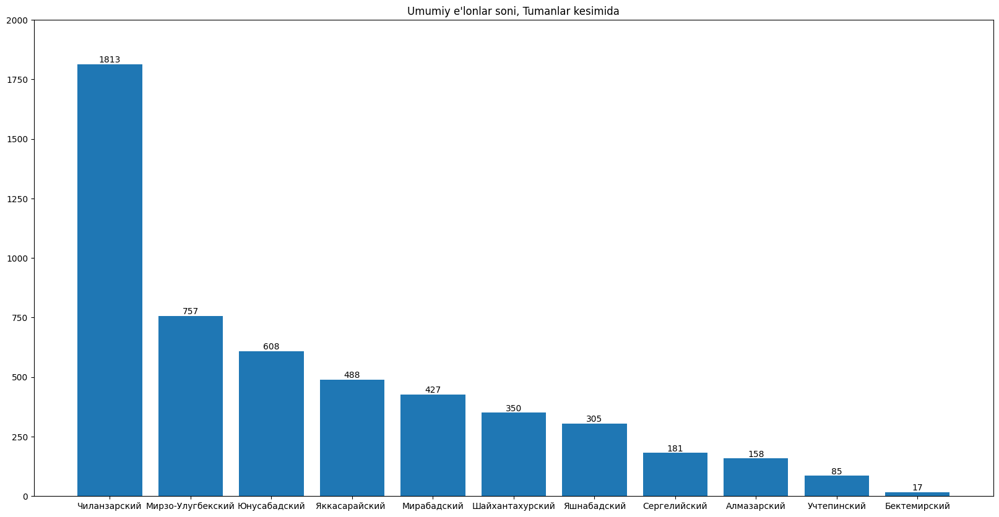

In [243]:
names = ['Чиланзарский', 'Мирзо-Улугбекский', 'Юнусабадский',
       'Яккасарайский ', 'Мирабадский', 'Шайхантахурский',
       'Яшнабадский', 'Сергелийский', 'Алмазарский',
       'Учтепинский', 'Бектемирский']
counts = [1813,  757,  608,  488,  427,  350,  305,  181,  158,   85,   17]

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='', title='Umumiy e\'lonlar soni, Tumanlar kesimida', ylim=(0, 2000))
ax.bar_label(bar_container)

In [244]:
umumiy = []

for i in range(11):
    s = (100 * a1[i]) / umumiy_elonlar_soni[0][i]
    umumiy.append(s)

In [245]:
umumiy

[10.479867622724766,
 40.95112285336856,
 37.5,
 55.532786885245905,
 70.72599531615926,
 54.285714285714285,
 21.9672131147541,
 11.049723756906078,
 34.177215189873415,
 12.941176470588236,
 5.882352941176471]

In [246]:
umumiy = list(umumiy)
umumiy

[10.479867622724766,
 40.95112285336856,
 37.5,
 55.532786885245905,
 70.72599531615926,
 54.285714285714285,
 21.9672131147541,
 11.049723756906078,
 34.177215189873415,
 12.941176470588236,
 5.882352941176471]

[Text(0, 0, '10.4'),
 Text(0, 0, '40.9'),
 Text(0, 0, '37.5'),
 Text(0, 0, '55.5'),
 Text(0, 0, '70.7'),
 Text(0, 0, '54.2'),
 Text(0, 0, '21.9'),
 Text(0, 0, '11'),
 Text(0, 0, '34.1'),
 Text(0, 0, '12.9'),
 Text(0, 0, '5.8')]

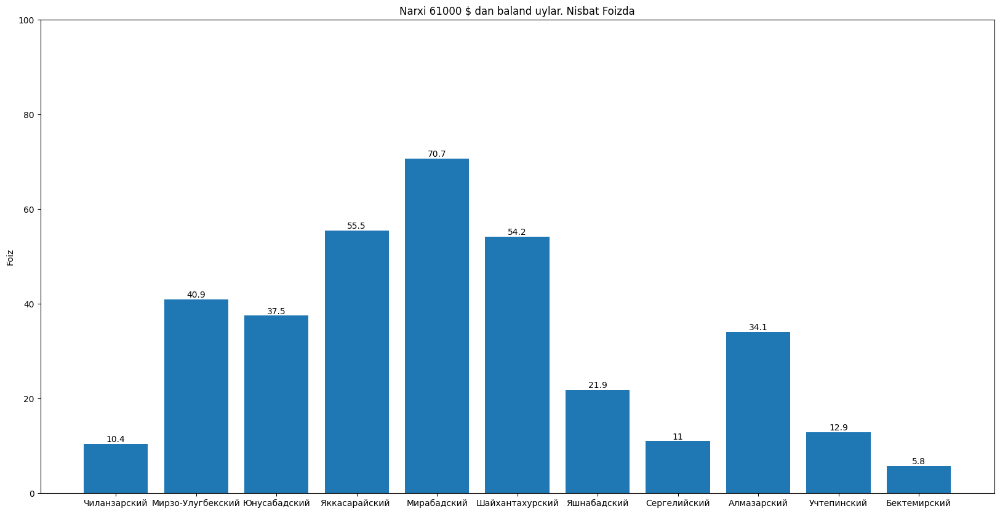

In [247]:
names = ['Чиланзарский', 'Мирзо-Улугбекский', 'Юнусабадский',
       'Яккасарайский ', 'Мирабадский', 'Шайхантахурский',
       'Яшнабадский', 'Сергелийский', 'Алмазарский',
       'Учтепинский', 'Бектемирский']
counts = [10.4, 40.9, 37.5, 55.5, 70.7, 54.2, 21.9, 11.0, 34.1, 12.9, 5.8]

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Foiz', title='Narxi 61000 $ dan baland uylar. Nisbat Foizda', ylim=(0, 100))
ax.bar_label(bar_container)

In [248]:
# Masalan Chilonzorda 1813 ta uy bolsa 190 tasi 61000 $ dan banad yani 10 fozigina
# Mirobodda 427 ta uy bolsa 302 tasi 61000$ dan baland 70 foizi
# formula (100 * 61000 dan baland uylar soni) /  umumiy uylar soni
# Bu degani eng kop qimmat uylar Mirobod tumanida deagni emas. Bu yerda elonlarga nisbatan olingan

In [249]:
a1=[]
a2=[]
for i in range(len(data_olx)):
    
    if data_olx.iloc[i,2]<61283.036394:
        a1.append(data_olx.iloc[i,0])
        #a2.append(data_olx.iloc[i,2])
    #print(data_olx.iloc[i, 2])
    #print(data_olx.iloc[i,0])

In [250]:
a1 = pd.Series(a1)
a1

0            Чиланзарский район
1             Алмазарский район
2       Мирзо-Улугбекский район
3           Яккасарайский район
4            Чиланзарский район
                 ...           
3540         Чиланзарский район
3541    Мирзо-Улугбекский район
3542         Чиланзарский район
3543         Чиланзарский район
3544         Чиланзарский район
Length: 3545, dtype: object

In [251]:
a1 =(a1.value_counts())
a1

Чиланзарский район         1623
Мирзо-Улугбекский район     447
Юнусабадский район          380
Яшнабадский район           238
Яккасарайский район         217
Сергелийский район          161
Шайхантахурский район       160
Мирабадский район           125
Алмазарский район           104
Учтепинский район            74
Бектемирский район           16
Name: count, dtype: int64

In [252]:
a1[0]
a1 = [a1[0], a1[1], a1[2], a1[4], a1[7], a1[6], a1[3], a1[5], a1[8], a1[9], a1[10]]
a1

[1623, 447, 380, 217, 125, 160, 238, 161, 104, 74, 16]

In [253]:
umumiy_elonlar_soni_index = data_olx["Location"].value_counts()
umumiy_elonlar_soni_index = umumiy_elonlar_soni_index.index
umumiy_elonlar_soni_index

Index(['Чиланзарский район', 'Мирзо-Улугбекский район', 'Юнусабадский район',
       'Яккасарайский район', 'Мирабадский район', 'Шайхантахурский район',
       'Яшнабадский район', 'Сергелийский район', 'Алмазарский район',
       'Учтепинский район', 'Бектемирский район'],
      dtype='object', name='Location')

In [254]:
umumiy_elonlar_soni = data_olx["Location"].value_counts()
umumiy_elonlar_soni = umumiy_elonlar_soni.values
umumiy_elonlar_soni = [umumiy_elonlar_soni]
umumiy_elonlar_soni

[array([1813,  757,  608,  488,  427,  350,  305,  181,  158,   85,   17],
       dtype=int64)]

In [255]:
umumiy = []

for i in range(11):
    s = (100 * a1[i]) / umumiy_elonlar_soni[0][i]
    umumiy.append(s)

In [256]:
umumiy

[89.52013237727523,
 59.04887714663144,
 62.5,
 44.467213114754095,
 29.27400468384075,
 45.714285714285715,
 78.0327868852459,
 88.95027624309392,
 65.82278481012658,
 87.05882352941177,
 94.11764705882354]

In [257]:
umumiy = list(umumiy)
umumiy

[89.52013237727523,
 59.04887714663144,
 62.5,
 44.467213114754095,
 29.27400468384075,
 45.714285714285715,
 78.0327868852459,
 88.95027624309392,
 65.82278481012658,
 87.05882352941177,
 94.11764705882354]

[Text(0, 0, '89.5'),
 Text(0, 0, '59'),
 Text(0, 0, '62.5'),
 Text(0, 0, '44.4'),
 Text(0, 0, '29.2'),
 Text(0, 0, '45.7'),
 Text(0, 0, '78'),
 Text(0, 0, '88.9'),
 Text(0, 0, '65.8'),
 Text(0, 0, '87'),
 Text(0, 0, '94.1')]

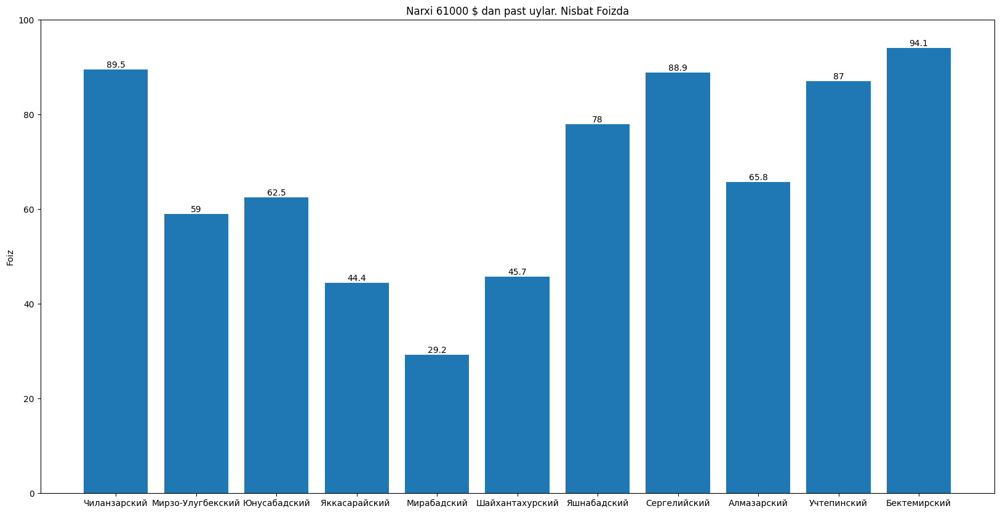

In [258]:
names = ['Чиланзарский', 'Мирзо-Улугбекский', 'Юнусабадский',
       'Яккасарайский ', 'Мирабадский', 'Шайхантахурский',
       'Яшнабадский', 'Сергелийский', 'Алмазарский',
       'Учтепинский', 'Бектемирский']
counts = [89.5, 59.0, 62.5, 44.4, 29.2, 45.7, 78.0, 88.9, 65.8, 87.0, 94.1]

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Foiz', title='Narxi 61000 $ dan past uylar. Nisbat Foizda', ylim=(0, 100))
ax.bar_label(bar_container)

In [259]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5197,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5198,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5199,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [260]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
count,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000
mean,61283.036394,2.375988,66.332923,3.700328,5.935826,0.431490,0.362305,0.334168,0.161688,0.168241,0.188090,0.340721,0.162459,0.447870,0.706302,0.706302,0.724032,0.724610,0.725188,0.698400,0.698208,0.698400,0.710927,0.710927,0.712276,0.714781,0.714781,0.713047
std,42867.565460,1.023570,36.480104,2.275757,2.837124,0.495332,0.480713,0.471744,0.368200,0.374116,0.390822,0.473997,0.368907,0.497323,0.455499,0.455499,0.447044,0.446754,0.446463,0.458997,0.459080,0.458997,0.453376,0.453376,0.452745,0.451562,0.451562,0.452383
min,5200.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38000.000000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,49000.000000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,67390.000000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,599000.000000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [261]:
# Tekshirsak Umumiy maydoni 1 ga teng uylar bor ekan shularni ko'rib chiqamiz
data_olx[data_olx["Umumiy maydoni"]<13]
# biz teparoqda eng arzon uyni ko'rgan edik narxi 5200 $ edi 
# umumiy maydoni esa 13 kv edi
# shuning uchun qidirishni 13 kv dan kichkinalardan boshlaymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
81,Мирабадский район,Продаётся квартира в мирабадскый районе,55000.0,Частное лицо,Вторичный рынок,3,1.0,2,4,1,1,1,1,1,1,1,0,1,1,1,1,0,0,0,0,0,1,1,1,1,1,1
218,Чиланзарский район,"СРОЧНО!!! Чиланзар-6 Парус! 1 комнатная,акфа, ...",28700.0,Бизнес,Вторичный рынок,1,4.0,4,4,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
476,Шайхантахурский район,Ташкент сити Gardens 3/7/9 92м2 с новым евро р...,200000.0,Бизнес,Новостройки,3,2.0,7,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
513,Алмазарский район,Продаетса 4-х комнатная квартира,60000.0,Частное лицо,Вторичный рынок,4,1.0,2,4,0,0,0,0,0,1,0,0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1
723,Яккасарайский район,Продаётся 3 комнатная квартира на Центр города...,61300.0,Бизнес,Вторичный рынок,3,4.0,4,4,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
913,Сергелийский район,Срочна сотилади сергели-4. 4/4/5 2#6 балкон р...,47000.0,Бизнес,Вторичный рынок,4,9.0,4,5,0,0,0,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1217,Учтепинский район,Чиланзар 24 Квартал 1в2/1/5 Звоните Жасмина,34250.0,Бизнес,Вторичный рынок,1,2.0,1,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2364,Яккасарайский район,. Бобура 1/5/9 Галерейка Напротив Ровд,28000.0,Бизнес,Вторичный рынок,1,5.0,5,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3032,Яккасарайский район,Люкс навастройка от ДРЕМ ХАУС,115000.0,Бизнес,Новостройки,3,1.0,8,9,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3261,Чиланзарский район,*Чиланзар* Г9а 2/2/4 кирпич,39500.0,Бизнес,Вторичный рынок,2,2.0,2,4,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [262]:
ind = data_olx[data_olx["Umumiy maydoni"]<13]

In [263]:
ind = ind.index
ind

Index([  81,  218,  476,  513,  723,  913, 1217, 2364, 3032, 3261, 4174, 4199,
       4357, 4393, 4923],
      dtype='int64')

In [264]:
# Demak biz datasetda Yashash maydoni degan columnni ochir tashlagandik
# Shuing uchun datani boshqatdan yuklab olib Yashash maydonini tekshirib chiqamiz
# chunki kiritishda xatolik ketgan bolishi mumkin
# Masalan kimdur Umumiy maydonni Yashash maydoninga kiritib qoygan bolishi mumkin

In [265]:
data2 = pd.read_csv("Datasets/olx_uylari.csv")
data2

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
0,https://www.olx.uz/d/obyavlenie/prodam-zh-k-pa...,Яккасарайский район,Сегодня в 15:23,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,85.0,12.0,4,8,Кирпичный,Раздельная,2 санузла и более,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1,https://www.olx.uz/d/obyavlenie/tashkent-siti-...,Шайхантахурский район,Сегодня в 15:22,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,0.0,0.0,3,8,Кирпичный,Раздельная,2 санузла и более,0,Черновая отделка,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2,https://www.olx.uz/d/obyavlenie/remont-dlya-se...,Чиланзарский район,Сегодня в 15:21,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,0.0,0.0,1,4,Панельный,Смежная,Раздельный,1,Евроремонт,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,https://www.olx.uz/d/obyavlenie/yakkasaray-nov...,Яккасарайский район,Сегодня в 15:21,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,0.0,0.0,3,8,Кирпичный,Раздельная,NaN,1,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
4,https://www.olx.uz/d/obyavlenie/odnokomnatnaya...,Алмазарский район,Сегодня в 15:20,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,0.0,0.0,4,5,Панельный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,https://www.olx.uz/d/obyavlenie/chilanzar-2-kv...,Чиланзарский район,Сегодня в 15:01,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,0.0,0.0,1,4,Кирпичный,Смежно-раздельная,Совмещенный,1,Евроремонт,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5197,https://www.olx.uz/d/obyavlenie/2-1-6-srochno-...,Чиланзарский район,Сегодня в 15:01,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,0.0,0.0,1,6,Кирпичный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5198,https://www.olx.uz/d/obyavlenie/u-nas-deshevle...,Чиланзарский район,Сегодня в 15:01,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,0.0,0.0,2,4,Панельный,Смежная,Раздельный,1,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5199,https://www.olx.uz/d/obyavlenie/optovyy-rynok-...,Чиланзарский район,Сегодня в 15:01,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,0.0,0.0,2,4,Кирпичный,NaN,Совмещенный,0,Евроремонт,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [266]:
kich = ind

In [267]:
dataind = data2.loc[kich]

In [268]:
dataind

,Link,Location,DataTime,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Yashash maydoni,Oshxona maydoni,Etaj,Max etaj,Qurilish turi,Rejasi,Sanuzel,Mebel,Remont,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Bozor,Supermarket,Dukon,Maktab,Metro
81,https://www.olx.uz/d/obyavlenie/prodaetsya-kva...,Мирабадский район,Сегодня в 14:59,Продаётся квартира в мирабадскый районе,55000.0,Частное лицо,Вторичный рынок,3,1.0,0.0,0.0,2,4,Кирпичный,Смежная,NaN,1,Евроремонт,1,1,1,1,1,1,0,1,1,1,1,0,0,0,0,0,1,1,1,0,1,1,1,0
218,https://www.olx.uz/d/obyavlenie/srochno-chilan...,Чиланзарский район,Сегодня в 14:38,"СРОЧНО!!! Чиланзар-6 Парус! 1 комнатная,акфа, ...",28700.0,Бизнес,Вторичный рынок,1,4.0,0.0,0.0,4,4,Панельный,NaN,Раздельный,1,NaN,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
476,https://www.olx.uz/d/obyavlenie/tashkent-siti-...,Шайхантахурский район,Сегодня в 13:49,Ташкент сити Gardens 3/7/9 92м2 с новым евро р...,200000.0,Бизнес,Новостройки,3,2.0,0.0,0.0,7,9,NaN,NaN,NaN,1,Авторский проект,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
513,https://www.olx.uz/d/obyavlenie/prodaetsa-4-h-...,Алмазарский район,Сегодня в 13:46,Продаетса 4-х комнатная квартира,60000.0,Частное лицо,Вторичный рынок,4,1.0,1.0,1.0,2,4,Кирпичный,NaN,NaN,0,Средний,0,0,0,0,1,0,0,1,1,1,1,1,1,1,0,1,1,1,1,0,1,1,1,0
723,https://www.olx.uz/d/obyavlenie/prodaetsya-3-k...,Яккасарайский район,Сегодня в 13:25,Продаётся 3 комнатная квартира на Центр города...,61300.0,Бизнес,Вторичный рынок,3,4.0,0.0,0.0,4,4,Кирпичный,Раздельная,Совмещенный,0,Средний,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
913,https://www.olx.uz/d/obyavlenie/srochna-sotila...,Сергелийский район,Сегодня в 15:27,Срочна сотилади сергели-4. 4/4/5 2#6 балкон р...,47000.0,Бизнес,Вторичный рынок,4,9.0,90.0,20.0,4,5,Панельный,Раздельная,Раздельный,0,Евроремонт,0,0,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
1217,https://www.olx.uz/d/obyavlenie/chilanzar-24-k...,Учтепинский район,Сегодня в 16:14,Чиланзар 24 Квартал 1в2/1/5 Звоните Жасмина,34250.0,Бизнес,Вторичный рынок,1,2.0,0.0,0.0,1,5,Кирпичный,NaN,Совмещенный,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2364,https://www.olx.uz/d/obyavlenie/bobura-1-5-9-g...,Яккасарайский район,Сегодня в 10:01,. Бобура 1/5/9 Галерейка Напротив Ровд,28000.0,Бизнес,Вторичный рынок,1,5.0,9.0,0.0,5,9,Монолитный,NaN,Совмещенный,0,Требует ремонта,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3032,https://www.olx.uz/d/obyavlenie/lyuks-navastro...,Яккасарайский район,Сегодня в 12:59,Люкс навастройка от ДРЕМ ХАУС,115000.0,Бизнес,Новостройки,3,1.0,0.0,0.0,8,9,Кирпичный,Раздельная,2 санузла и более,0,Авторский проект,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3261,https://www.olx.uz/d/obyavlenie/chilanzar-g9a-...,Чиланзарский район,Сегодня в 13:22,*Чиланзар* Г9а 2/2/4 кирпич,39500.0,Бизнес,Вторичный рынок,2,2.0,0.0,0.0,2,4,Кирпичный,Раздельная,Раздельный,1,Средний,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0


In [269]:
# 913 datada Umumiy maydoni 90.0 ekan adashib yasash madyoni ga kiritilgan bolishi kerak
# 4199 datada Umumiy maydoni 250.0 ekan adashib yasash madyoni ga kiritilgan bolishi kerak
# 4357 datada Umumiy maydoni 50.0 ekan adashib yasash madyoni ga kiritilgan bolishi kerak
# 4393 datada Umumiy maydoni 39.0 ekan adashib yasash madyoni ga kiritilgan bolishi kerak
# 4923 datada Umumiy maydoni 40.0 ekan adashib yasash madyoni ga kiritilgan bolishi kerak

# bularni togirlab chiqamiz

In [270]:
data_olx.at[913,"Umumiy maydoni"] = 90.0
data_olx.at[4199,"Umumiy maydoni"] = 250.0
data_olx.at[4357,"Umumiy maydoni"] = 50.0
data_olx.at[4393,"Umumiy maydoni"] = 39.0
data_olx.at[4923,"Umumiy maydoni"] = 40.0

In [271]:
data_olx[data_olx["Umumiy maydoni"]<13]
# qolganlarini o'rtachasi bilan to'ldirishga urinib ko'ramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
81,Мирабадский район,Продаётся квартира в мирабадскый районе,55000.0,Частное лицо,Вторичный рынок,3,1.0,2,4,1,1,1,1,1,1,1,0,1,1,1,1,0,0,0,0,0,1,1,1,1,1,1
218,Чиланзарский район,"СРОЧНО!!! Чиланзар-6 Парус! 1 комнатная,акфа, ...",28700.0,Бизнес,Вторичный рынок,1,4.0,4,4,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
476,Шайхантахурский район,Ташкент сити Gardens 3/7/9 92м2 с новым евро р...,200000.0,Бизнес,Новостройки,3,2.0,7,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
513,Алмазарский район,Продаетса 4-х комнатная квартира,60000.0,Частное лицо,Вторичный рынок,4,1.0,2,4,0,0,0,0,0,1,0,0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1
723,Яккасарайский район,Продаётся 3 комнатная квартира на Центр города...,61300.0,Бизнес,Вторичный рынок,3,4.0,4,4,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1217,Учтепинский район,Чиланзар 24 Квартал 1в2/1/5 Звоните Жасмина,34250.0,Бизнес,Вторичный рынок,1,2.0,1,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2364,Яккасарайский район,. Бобура 1/5/9 Галерейка Напротив Ровд,28000.0,Бизнес,Вторичный рынок,1,5.0,5,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3032,Яккасарайский район,Люкс навастройка от ДРЕМ ХАУС,115000.0,Бизнес,Новостройки,3,1.0,8,9,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3261,Чиланзарский район,*Чиланзар* Г9а 2/2/4 кирпич,39500.0,Бизнес,Вторичный рынок,2,2.0,2,4,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4174,Мирабадский район,Продается евро квартира на Нукуской новостройка,76000.0,Бизнес,Новостройки,3,2.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [272]:
datamir = data_olx[(data_olx.Prices<59000) & (data_olx.Prices>52000) & (data_olx.Location=="Мирабадский район") & (data_olx.Xonalar==3)]
datamir


,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
81,Мирабадский район,Продаётся квартира в мирабадскый районе,55000.0,Частное лицо,Вторичный рынок,3,1.0,2,4,1,1,1,1,1,1,1,0,1,1,1,1,0,0,0,0,0,1,1,1,1,1,1
338,Мирабадский район,"Ойбек 3-х комнатная французкой планировки, Авт...",58000.0,Бизнес,Вторичный рынок,3,72.0,9,9,1,1,1,0,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1131,Мирабадский район,"Ойбек 3/9/9 французкая планировка, Атодорожный...",57000.0,Бизнес,Вторичный рынок,3,72.0,9,9,1,1,1,0,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1746,Мирабадский район,"Ойбек 3-х комнатная квартира 75м2(франция), ор...",57000.0,Бизнес,Вторичный рынок,3,75.0,9,9,1,1,1,0,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0
1929,Мирабадский район,Новостройка на Мирабадском районе ЖК Greenwic...,55999.0,Бизнес,Новостройки,3,60.0,3,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3605,Мирабадский район,Мирабадский район квартира 3 комнаты 77 м² улу...,56000.0,Бизнес,Вторичный рынок,3,77.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4250,Мирабадский район,"Z Саракулька 3/2/4 кирпич, не торец, балкон 2*...",56000.0,Бизнес,Вторичный рынок,3,70.0,2,4,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4403,Мирабадский район,"Ойбек 3/9/9 Шахрисабз-38, кафе Брассери",57000.0,Бизнес,Вторичный рынок,3,72.0,9,9,1,1,1,0,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4580,Мирабадский район,Квартира,55000.0,Частное лицо,Вторичный рынок,3,65.0,4,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [273]:
datamir_mean = np.sum(datamir["Umumiy maydoni"])/(len(datamir)-1)
datamir_mean
# shu narxga yaqin va shu tumandan shunday xonalik uyning ortacha olchami 70 ekan
# shuing uchun 70 qilib olamiz

70.5

In [274]:
data_olx.at[81,"Umumiy maydoni"] = 70.0

In [275]:
data_olx[data_olx["Umumiy maydoni"]<13]
# qolganlarini ortachasi bilan toldirishga urinib koramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
218,Чиланзарский район,"СРОЧНО!!! Чиланзар-6 Парус! 1 комнатная,акфа, ...",28700.0,Бизнес,Вторичный рынок,1,4.0,4,4,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
476,Шайхантахурский район,Ташкент сити Gardens 3/7/9 92м2 с новым евро р...,200000.0,Бизнес,Новостройки,3,2.0,7,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
513,Алмазарский район,Продаетса 4-х комнатная квартира,60000.0,Частное лицо,Вторичный рынок,4,1.0,2,4,0,0,0,0,0,1,0,0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1
723,Яккасарайский район,Продаётся 3 комнатная квартира на Центр города...,61300.0,Бизнес,Вторичный рынок,3,4.0,4,4,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1217,Учтепинский район,Чиланзар 24 Квартал 1в2/1/5 Звоните Жасмина,34250.0,Бизнес,Вторичный рынок,1,2.0,1,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2364,Яккасарайский район,. Бобура 1/5/9 Галерейка Напротив Ровд,28000.0,Бизнес,Вторичный рынок,1,5.0,5,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3032,Яккасарайский район,Люкс навастройка от ДРЕМ ХАУС,115000.0,Бизнес,Новостройки,3,1.0,8,9,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3261,Чиланзарский район,*Чиланзар* Г9а 2/2/4 кирпич,39500.0,Бизнес,Вторичный рынок,2,2.0,2,4,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4174,Мирабадский район,Продается евро квартира на Нукуской новостройка,76000.0,Бизнес,Новостройки,3,2.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [276]:
datamir = data_olx[(data_olx.Prices>24000) & (data_olx.Prices<30000) & (data_olx.Location=="Чиланзарский район") & (data_olx.Xonalar==1)]
datamir

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
30,Чиланзарский район,_1/2/5 7 кв Очень хороший вариант Сдать в аренду,28500.0,Бизнес,Вторичный рынок,1,28.0,2,5,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
111,Чиланзарский район,#1+2/3/5 НЕДОРОГО Балкон 1/3 ТЦ Парус Чиланзар 6,29500.0,Бизнес,Вторичный рынок,1,28.0,3,5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
121,Чиланзарский район,"Чилонзор 8-кв 33м2 Балкон 1,5/3 не торец 1в2/4/4",29500.0,Бизнес,Вторичный рынок,1,33.0,4,4,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
133,Чиланзарский район,"квартал-8 1в2/4/4 балкон-1,5/3 Чиланзар 33квм",29500.0,Бизнес,Вторичный рынок,1,33.0,4,4,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
215,Чиланзарский район,квартал-9 1/1/4 Кирпич Чиланзар 28квм,28000.0,Бизнес,Вторичный рынок,1,28.0,1,4,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5047,Чиланзарский район,1 Комнатная. Чиланзар 19 Квартал 1в2/4/4 Балко...,29950.0,Бизнес,Вторичный рынок,1,35.0,4,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5082,Чиланзарский район,"Срочно продам квартиру. Чиланзар 16. 1/4/4. 1,...",29600.0,Бизнес,Вторичный рынок,1,35.0,4,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5115,Чиланзарский район,Срочно продам каартиру. Чиланзар 7. 1/3/4.,28800.0,Бизнес,Вторичный рынок,1,32.0,3,4,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5122,Чиланзарский район,Срочно продам квартиру на Чиланзаре 7 квартал ...,29200.0,Бизнес,Вторичный рынок,1,32.0,3,4,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [277]:
datamir_mean = np.sum(datamir["Umumiy maydoni"])/(len(datamir)-1)
datamir_mean

33.335533980582525

In [278]:
data_olx.at[218,"Umumiy maydoni"] = 33.0

In [279]:
data_olx[data_olx["Umumiy maydoni"]<13]
# qolganlarini o'rtachasi bilan toldirishga urinib ko'ramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
476,Шайхантахурский район,Ташкент сити Gardens 3/7/9 92м2 с новым евро р...,200000.0,Бизнес,Новостройки,3,2.0,7,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
513,Алмазарский район,Продаетса 4-х комнатная квартира,60000.0,Частное лицо,Вторичный рынок,4,1.0,2,4,0,0,0,0,0,1,0,0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1
723,Яккасарайский район,Продаётся 3 комнатная квартира на Центр города...,61300.0,Бизнес,Вторичный рынок,3,4.0,4,4,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1217,Учтепинский район,Чиланзар 24 Квартал 1в2/1/5 Звоните Жасмина,34250.0,Бизнес,Вторичный рынок,1,2.0,1,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2364,Яккасарайский район,. Бобура 1/5/9 Галерейка Напротив Ровд,28000.0,Бизнес,Вторичный рынок,1,5.0,5,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3032,Яккасарайский район,Люкс навастройка от ДРЕМ ХАУС,115000.0,Бизнес,Новостройки,3,1.0,8,9,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3261,Чиланзарский район,*Чиланзар* Г9а 2/2/4 кирпич,39500.0,Бизнес,Вторичный рынок,2,2.0,2,4,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4174,Мирабадский район,Продается евро квартира на Нукуской новостройка,76000.0,Бизнес,Новостройки,3,2.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [280]:
# 476 ni ortachaisni topish shart emas cunki Info da 92 metr kv dep yozilgan
data_olx.at[476,"Umumiy maydoni"] = 92.0

In [281]:
data_olx[data_olx["Umumiy maydoni"]<13]
# qolganlarini ortachasi bilan toldirishga urinib koramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
513,Алмазарский район,Продаетса 4-х комнатная квартира,60000.0,Частное лицо,Вторичный рынок,4,1.0,2,4,0,0,0,0,0,1,0,0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1
723,Яккасарайский район,Продаётся 3 комнатная квартира на Центр города...,61300.0,Бизнес,Вторичный рынок,3,4.0,4,4,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1217,Учтепинский район,Чиланзар 24 Квартал 1в2/1/5 Звоните Жасмина,34250.0,Бизнес,Вторичный рынок,1,2.0,1,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2364,Яккасарайский район,. Бобура 1/5/9 Галерейка Напротив Ровд,28000.0,Бизнес,Вторичный рынок,1,5.0,5,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3032,Яккасарайский район,Люкс навастройка от ДРЕМ ХАУС,115000.0,Бизнес,Новостройки,3,1.0,8,9,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3261,Чиланзарский район,*Чиланзар* Г9а 2/2/4 кирпич,39500.0,Бизнес,Вторичный рынок,2,2.0,2,4,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4174,Мирабадский район,Продается евро квартира на Нукуской новостройка,76000.0,Бизнес,Новостройки,3,2.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [282]:
datamir = data_olx[(data_olx.Prices>57000) & (data_olx.Prices<65000) & (data_olx.Location=="Алмазарский район") & (data_olx.Xonalar==4)]
datamir

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
513,Алмазарский район,Продаетса 4-х комнатная квартира,60000.0,Частное лицо,Вторичный рынок,4,1.00,2,4,0,0,0,0,0,1,0,0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1
1002,Алмазарский район,Самарканд дарваза,58000.0,Бизнес,Новостройки,4,90.00,12,12,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1032,Алмазарский район,"Метро Тинчлик Aloqa 4/2/5 (83,62 kv.m) J-do'm ...",63000.0,Частное лицо,Вторичный рынок,4,83.62,2,5,0,1,1,0,0,0,1,0,1,1,1,1,1,1,0,0,0,1,1,1,1,1,1
4389,Алмазарский район,Qora qamish Fargona makro 4 xona sotiladi,61500.0,Бизнес,Вторичный рынок,4,78.00,4,4,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4926,Алмазарский район,"Продается 4-х ком с Евроремонтом, мебелью и те...",60000.0,Бизнес,Вторичный рынок,4,85.00,4,4,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [283]:
datamir_mean = np.sum(datamir["Umumiy maydoni"])/(len(datamir)-1)
datamir_mean

84.405

In [284]:
data_olx.at[513,"Umumiy maydoni"] = 84

In [285]:
data_olx[data_olx["Umumiy maydoni"]<13]
# qolganlarini ortachasi bilan toldirishga urinib koramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
723,Яккасарайский район,Продаётся 3 комнатная квартира на Центр города...,61300.0,Бизнес,Вторичный рынок,3,4.0,4,4,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1217,Учтепинский район,Чиланзар 24 Квартал 1в2/1/5 Звоните Жасмина,34250.0,Бизнес,Вторичный рынок,1,2.0,1,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2364,Яккасарайский район,. Бобура 1/5/9 Галерейка Напротив Ровд,28000.0,Бизнес,Вторичный рынок,1,5.0,5,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3032,Яккасарайский район,Люкс навастройка от ДРЕМ ХАУС,115000.0,Бизнес,Новостройки,3,1.0,8,9,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3261,Чиланзарский район,*Чиланзар* Г9а 2/2/4 кирпич,39500.0,Бизнес,Вторичный рынок,2,2.0,2,4,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4174,Мирабадский район,Продается евро квартира на Нукуской новостройка,76000.0,Бизнес,Новостройки,3,2.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [286]:
datamir = data_olx[(data_olx.Prices>58000) & (data_olx.Prices<66000) & (data_olx.Location=="Яккасарайский район") & (data_olx.Xonalar==3)]
datamir

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
228,Яккасарайский район,Ш.СРОЧНО продажа квартира в Яккасарой 3/6/9 So...,60000.0,Бизнес,Новостройки,3,74.0,6,10,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
317,Яккасарайский район,"Шота Руставели 3/4/4 высокопотолочка, ор-р 59 ...",65000.0,Бизнес,Вторичный рынок,3,78.0,4,4,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
432,Яккасарайский район,Бобура 3/3/4 ТЦ Некст,63000.0,Бизнес,Вторичный рынок,3,65.0,3,4,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
564,Яккасарайский район,"Бобур кучаси 3/3/9 французкий планировка, бути...",61000.0,Бизнес,Вторичный рынок,3,70.0,3,9,1,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
723,Яккасарайский район,Продаётся 3 комнатная квартира на Центр города...,61300.0,Бизнес,Вторичный рынок,3,4.0,4,4,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
953,Яккасарайский район,Юнусабад 14 3/1/9 Французская планировка зал 5...,63000.0,Бизнес,Вторичный рынок,3,72.0,1,9,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,1,1,1,1
1198,Яккасарайский район,Улица Бобура 3/3/8 ор.р РУВД,61000.0,Бизнес,Вторичный рынок,3,62.0,3,8,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1719,Яккасарайский район,ул.Шота Руставели 3/3/5 Разделка/Общая пл 80м2...,62000.0,Бизнес,Вторичный рынок,3,80.0,3,5,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2612,Яккасарайский район,ШРуставeли// ор-р Макс Вэй// 3/5/5. Гранд мир,65000.0,Бизнес,Вторичный рынок,3,65.0,5,5,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2654,Яккасарайский район,-/ШРуставели 3/4/4 кирпич 77 серия Ремонт сре...,63000.0,Бизнес,Вторичный рынок,3,75.0,4,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [287]:
datamir_mean = np.sum(datamir["Umumiy maydoni"])/(len(datamir)-1)
datamir_mean

70.86111111111111

In [288]:
data_olx.at[723,"Umumiy maydoni"] = 70

In [289]:
data_olx[data_olx["Umumiy maydoni"]<13]
# qolganlarini ortachasi bilan toldirishga urinib koramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
1217,Учтепинский район,Чиланзар 24 Квартал 1в2/1/5 Звоните Жасмина,34250.0,Бизнес,Вторичный рынок,1,2.0,1,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2364,Яккасарайский район,. Бобура 1/5/9 Галерейка Напротив Ровд,28000.0,Бизнес,Вторичный рынок,1,5.0,5,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3032,Яккасарайский район,Люкс навастройка от ДРЕМ ХАУС,115000.0,Бизнес,Новостройки,3,1.0,8,9,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3261,Чиланзарский район,*Чиланзар* Г9а 2/2/4 кирпич,39500.0,Бизнес,Вторичный рынок,2,2.0,2,4,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4174,Мирабадский район,Продается евро квартира на Нукуской новостройка,76000.0,Бизнес,Новостройки,3,2.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [290]:
datamir = data_olx[(data_olx.Prices>30000) & (data_olx.Prices<38000) & (data_olx.Location=="Учтепинский район") & (data_olx.Xonalar==1)]
datamir

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
1217,Учтепинский район,Чиланзар 24 Квартал 1в2/1/5 Звоните Жасмина,34250.0,Бизнес,Вторичный рынок,1,2.0,1,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3395,Учтепинский район,1 Комнатная. Балкон 1х6. Чиланзар 24 Квартал 1...,30999.0,Бизнес,Вторичный рынок,1,36.0,4,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3408,Учтепинский район,СРОЧНО!!! продаётся квартира,31000.0,Бизнес,Вторичный рынок,1,42.0,2,5,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3439,Учтепинский район,Срочно. Чиланзар 24 Квартал 1/1/5 Царство недв...,30950.0,Бизнес,Вторичный рынок,1,33.0,1,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3956,Учтепинский район,Продаю 1 комнатную квартиру с Еремонтом на Чил...,36000.0,Бизнес,Вторичный рынок,1,35.0,3,4,1,0,0,0,1,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4451,Учтепинский район,Продаётся квартира Чиланзар 19кв. 1в2/1/4 Пан...,31000.0,Бизнес,Вторичный рынок,1,34.0,1,4,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4762,Учтепинский район,Продам Свою 1 ком. Квартиру,31500.0,Частное лицо,Вторичный рынок,1,39.0,2,4,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [291]:
datamir_mean = np.sum(datamir["Umumiy maydoni"])/(len(datamir)-1)
datamir_mean

36.833333333333336

In [292]:
data_olx.at[1217,"Umumiy maydoni"] = 36

In [293]:
data_olx[data_olx["Umumiy maydoni"]<13]
# qolganlarini ortachasi bilan toldirishga urinib koramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
2364,Яккасарайский район,. Бобура 1/5/9 Галерейка Напротив Ровд,28000.0,Бизнес,Вторичный рынок,1,5.0,5,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3032,Яккасарайский район,Люкс навастройка от ДРЕМ ХАУС,115000.0,Бизнес,Новостройки,3,1.0,8,9,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3261,Чиланзарский район,*Чиланзар* Г9а 2/2/4 кирпич,39500.0,Бизнес,Вторичный рынок,2,2.0,2,4,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4174,Мирабадский район,Продается евро квартира на Нукуской новостройка,76000.0,Бизнес,Новостройки,3,2.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [294]:
datamir = data_olx[(data_olx.Prices>26000) & (data_olx.Prices<30000) & (data_olx.Location=="Яккасарайский район") & (data_olx.Xonalar==1)]
datamir


,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
82,Яккасарайский район,"Ш.Руставели 1//5//5 Площадь 30м2,Не торец,Ор-р...",28000.0,Бизнес,Вторичный рынок,1,30.0,5,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
796,Яккасарайский район,Чилонзор-6 панель 1/4/4 ориентир грин ситти,28000.0,Бизнес,Вторичный рынок,1,30.0,4,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
868,Яккасарайский район,Квартира на продаже,27900.0,Бизнес,Вторичный рынок,1,37.0,5,5,0,0,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1634,Яккасарайский район,Продается однокомнатная квартира на улице Бабу...,29000.0,Бизнес,Вторичный рынок,1,28.0,5,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2364,Яккасарайский район,. Бобура 1/5/9 Галерейка Напротив Ровд,28000.0,Бизнес,Вторичный рынок,1,5.0,5,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2461,Яккасарайский район,Продаётся квартира ул Бабура 1/5/9,29000.0,Бизнес,Вторичный рынок,1,30.0,5,9,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3315,Яккасарайский район,"Актепе 1/4/4 кирпич 28м2 не торец балкон 1,5*3...",29000.0,Бизнес,Вторичный рынок,1,28.0,4,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4154,Яккасарайский район,"Z Ш Руставели 1/4/4 кирпич, не торец, 30м2",28000.0,Бизнес,Вторичный рынок,1,30.0,4,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4676,Яккасарайский район,"R Шота Руставели 1/4/4 кирпич, не торец, 30м2",28000.0,Бизнес,Вторичный рынок,1,30.0,4,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [295]:
datamir_mean = np.sum(datamir["Umumiy maydoni"])/(len(datamir)-1)
datamir_mean

31.0

In [296]:
data_olx.at[2364,"Umumiy maydoni"] = 31.0

In [297]:
data_olx[data_olx["Umumiy maydoni"]<13]
# qolganlarini ortachasi bilan toldirishga urinib koramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
3032,Яккасарайский район,Люкс навастройка от ДРЕМ ХАУС,115000.0,Бизнес,Новостройки,3,1.0,8,9,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3261,Чиланзарский район,*Чиланзар* Г9а 2/2/4 кирпич,39500.0,Бизнес,Вторичный рынок,2,2.0,2,4,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4174,Мирабадский район,Продается евро квартира на Нукуской новостройка,76000.0,Бизнес,Новостройки,3,2.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [298]:
datamir = data_olx[(data_olx.Prices>111000) & (data_olx.Prices<118000) & (data_olx.Location=="Яккасарайский район") & (data_olx.Xonalar==3)]
datamir


,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
1104,Яккасарайский район,Продам! с хорошим ремонтом новостройка ор Глин...,115000.0,Бизнес,Вторичный рынок,3,91.0,8,10,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1209,Яккасарайский район,Квартира в новостройке цент города 70кв.м,115000.0,Частное лицо,Новостройки,3,75.0,7,9,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1493,Яккасарайский район,Срочно продаётся квартира в Яккасарайском райо...,115000.0,Бизнес,Вторичный рынок,3,110.0,3,4,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3032,Яккасарайский район,Люкс навастройка от ДРЕМ ХАУС,115000.0,Бизнес,Новостройки,3,1.0,8,9,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3458,Яккасарайский район,Продам в новостройке Ул Нукусская,115000.0,Бизнес,Вторичный рынок,3,75.0,7,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3820,Яккасарайский район,Продается Квартира с Евроремонтом! Яккасарай! ...,115000.0,Бизнес,Новостройки,3,75.0,7,9,1,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,1


In [299]:
datamir_mean = np.sum(datamir["Umumiy maydoni"])/(len(datamir)-1)
datamir_mean

85.4

In [300]:
data_olx.at[3032,"Umumiy maydoni"] = 85

In [301]:
data_olx[data_olx["Umumiy maydoni"]<13]
# qolganlarini ortachasi bilan toldirishga urinib koramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
3261,Чиланзарский район,*Чиланзар* Г9а 2/2/4 кирпич,39500.0,Бизнес,Вторичный рынок,2,2.0,2,4,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4174,Мирабадский район,Продается евро квартира на Нукуской новостройка,76000.0,Бизнес,Новостройки,3,2.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [302]:
datamir = data_olx[(data_olx.Prices>37500) & (data_olx.Prices<41000) & (data_olx.Location=="Чиланзарский район") & (data_olx.Xonalar==2)]
datamir

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
87,Чиланзарский район,"Чиланзар 19 квартал 2/1/4 балкон 1,5*6",39000.0,Бизнес,Вторичный рынок,2,50.0,1,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
99,Чиланзарский район,"Чилонзор 20-кв 54м2 Балкон 1,5/6 Зеркалка 2в3/1/4",39500.0,Бизнес,Вторичный рынок,2,54.0,1,4,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
100,Чиланзарский район,"квартал-21 2в3/4/4 Зеркалка меб+техника 1,5/6...",38500.0,Бизнес,Вторичный рынок,2,54.0,4,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
127,Чиланзарский район,"Чиланзар-7 кв"" Оптовка""2/2/4""ПАНЕЛЬ""Не торец""Б...",39500.0,Бизнес,Вторичный рынок,2,45.0,4,2,1,0,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
178,Чиланзарский район,квартал-6 2/3/4 Раздельный орр Райхон Чиланза...,40000.0,Бизнес,Вторичный рынок,2,45.0,3,4,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5056,Чиланзарский район,",Октепа Чилонзор 7, 2 хоналик, мебель+техникас...",38500.0,Бизнес,Вторичный рынок,2,45.0,4,4,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5167,Чиланзарский район,2/4/4 Срочно Продается Квартира на Чиланзар 7,39500.0,Бизнес,Вторичный рынок,2,48.0,4,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5179,Чиланзарский район,2/1/4 Срочно Продается Квартира на Чиланзар 7,39500.0,Бизнес,Вторичный рынок,2,48.0,1,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5183,Чиланзарский район,Много Квартир. Чиланзар 19 Квартал 2в3/2/4 Цар...,40555.0,Бизнес,Вторичный рынок,2,52.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [303]:
datamir_mean = np.sum(datamir["Umumiy maydoni"])/(len(datamir)-1)
datamir_mean

48.96511627906977

In [304]:
data_olx.at[3261,"Umumiy maydoni"] = 48

In [305]:
data_olx[data_olx["Umumiy maydoni"]<13]
# qolganlarini ortachasi bilan toldirishga urinib koramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
4174,Мирабадский район,Продается евро квартира на Нукуской новостройка,76000.0,Бизнес,Новостройки,3,2.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [306]:
datamir = data_olx[(data_olx.Prices>74000) & (data_olx.Prices<78000) & (data_olx.Location=="Мирабадский район") & (data_olx.Xonalar==3)]
datamir

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
192,Мирабадский район,Ойбек-Кунаева 3/4/9 Комнаты-Раздельно\Мебель+Т...,75000.0,Бизнес,Вторичный рынок,3,75.0,4,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
212,Мирабадский район,Ойбек 3/4/9 (Кунаева) Мебель и Техника,75000.0,Бизнес,Вторичный рынок,3,75.0,4,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1060,Мирабадский район,"Ойбек 3-х комнатная квартира 83кв.м, ор-р Прай...",76000.0,Бизнес,Вторичный рынок,3,83.0,4,4,0,1,1,0,0,0,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1482,Мирабадский район,"Ойбек 3/4/9 Мебель и Техника, ор-р гост.Россия...",75000.0,Бизнес,Вторичный рынок,3,75.0,4,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1561,Мирабадский район,"Ойбек 3/4/9 франция 75м2, Кунаева, гост.Россия",75000.0,Бизнес,Вторичный рынок,3,75.0,4,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2215,Мирабадский район,Продается ул.Ойбек 3.8.9,75000.0,Бизнес,Вторичный рынок,3,70.0,8,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
2402,Мирабадский район,Продаётся 3/4/9 евроремонт квартира ориентир м...,77000.0,Бизнес,Вторичный рынок,3,75.0,4,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2940,Мирабадский район,Ойбек 3ком/4/9 ор-р Angeles Food ремонт средни...,76000.0,Бизнес,Вторичный рынок,3,70.0,4,9,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0
2963,Мирабадский район,Ойбек 3в2ком/4/9 ор-р м Ойбек ремонт средний о...,76000.0,Бизнес,Вторичный рынок,3,70.0,4,9,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3864,Мирабадский район,"Чехова(к.Федоровича) 3х комнатная квартира, к...",77000.0,Бизнес,Вторичный рынок,3,70.0,3,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [307]:
datamir_mean = np.sum(datamir["Umumiy maydoni"])/(len(datamir)-1)
datamir_mean

74.58333333333333

In [308]:
data_olx.at[4174,"Umumiy maydoni"] = 74
# Umumiy maydongai kamchiliklarni to'ldirib chiqdik

In [309]:
data_olx.describe()
# Menimcha bu ustunlar bilan muaommolar hal boldi. Keyin yana tekshiramiz

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
count,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000
mean,61283.036394,2.375988,66.534523,3.700328,5.935826,0.431490,0.362305,0.334168,0.161688,0.168241,0.188090,0.340721,0.162459,0.447870,0.706302,0.706302,0.724032,0.724610,0.725188,0.698400,0.698208,0.698400,0.710927,0.710927,0.712276,0.714781,0.714781,0.713047
std,42867.565460,1.023570,36.429027,2.275757,2.837124,0.495332,0.480713,0.471744,0.368200,0.374116,0.390822,0.473997,0.368907,0.497323,0.455499,0.455499,0.447044,0.446754,0.446463,0.458997,0.459080,0.458997,0.453376,0.453376,0.452745,0.451562,0.451562,0.452383
min,5200.000000,1.000000,13.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38000.000000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,49000.000000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,67390.000000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,599000.000000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [310]:
xonalar_soni = data_olx[(data_olx["Location"]=="Чиланзарский район")]["Xonalar"].value_counts()
xonalar_soni
# Chilonzordagi xonalar soni

Xonalar
2    875
1    483
3    371
4     75
5      5
6      3
7      1
Name: count, dtype: int64

In [311]:
xonalar_soni.index

Index([2, 1, 3, 4, 5, 6, 7], dtype='int64', name='Xonalar')

In [312]:
xonalar_soni.values

array([875, 483, 371,  75,   5,   3,   1], dtype=int64)

[Text(0, 0, '875'),
 Text(0, 0, '483'),
 Text(0, 0, '371'),
 Text(0, 0, '75'),
 Text(0, 0, '5'),
 Text(0, 0, '3'),
 Text(0, 0, '1')]

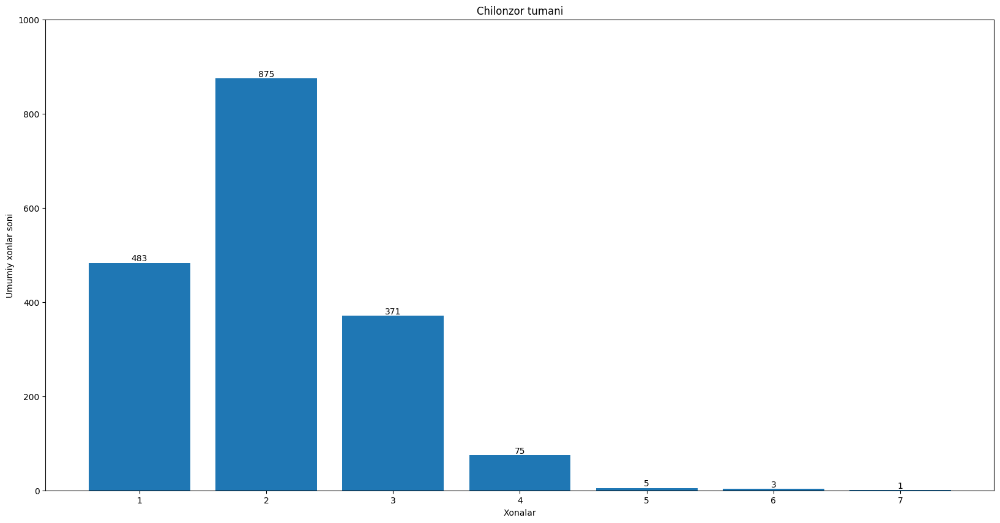

In [313]:
names = xonalar_soni.index
counts = xonalar_soni.values

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Umumiy xonlar soni', title='Chilonzor tumani', ylim=(0, 1000))
ax.set(xlabel="Xonalar")
ax.bar_label(bar_container)

In [314]:
xonalar_soni = data_olx[(data_olx["Location"]=="Яккасарайский район")]["Xonalar"].value_counts()
xonalar_soni
# Яккасарайский район xonalar soni

Xonalar
2    178
3    138
1     81
4     79
8      3
6      3
5      3
7      3
Name: count, dtype: int64

[Text(0, 0, '178'),
 Text(0, 0, '138'),
 Text(0, 0, '81'),
 Text(0, 0, '79'),
 Text(0, 0, '3'),
 Text(0, 0, '3'),
 Text(0, 0, '3'),
 Text(0, 0, '3')]

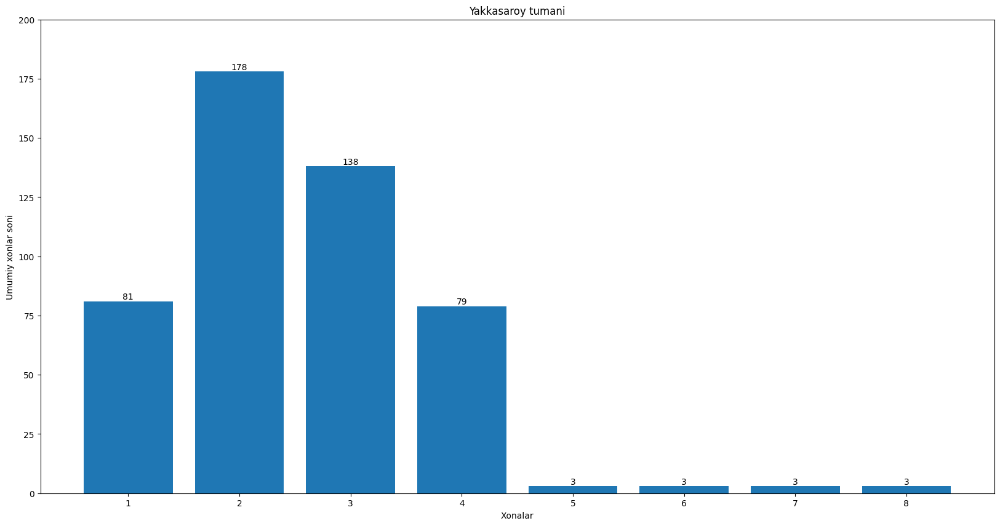

In [315]:
names = xonalar_soni.index
counts = xonalar_soni.values

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Umumiy xonlar soni', title='Yakkasaroy tumani', ylim=(0, 200))
ax.set(xlabel="Xonalar")
ax.bar_label(bar_container)

In [316]:
xonalar_soni = data_olx[(data_olx["Location"]=="Шайхантахурский район")]["Xonalar"].value_counts()
xonalar_soni
# Шайхантахурский район xonalar soni

Xonalar
3    153
2    109
4     50
1     32
5      5
6      1
Name: count, dtype: int64

[Text(0, 0, '153'),
 Text(0, 0, '109'),
 Text(0, 0, '50'),
 Text(0, 0, '32'),
 Text(0, 0, '5'),
 Text(0, 0, '1')]

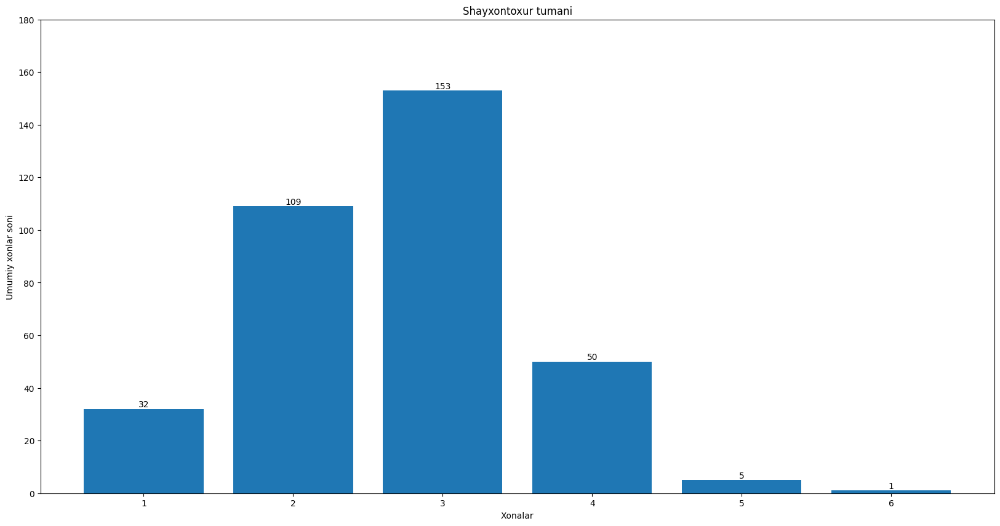

In [317]:
names = xonalar_soni.index
counts = xonalar_soni.values

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Umumiy xonlar soni', title='Shayxontoxur tumani', ylim=(0, 180))
ax.set(xlabel="Xonalar")
ax.bar_label(bar_container)

In [318]:
xonalar_soni = data_olx[(data_olx["Location"]=="Алмазарский район")]["Xonalar"].value_counts()
xonalar_soni
# Алмазарский район xonalar soni

Xonalar
3    56
2    48
4    29
1    15
5     8
6     1
7     1
Name: count, dtype: int64

[Text(0, 0, '56'),
 Text(0, 0, '48'),
 Text(0, 0, '29'),
 Text(0, 0, '15'),
 Text(0, 0, '8'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

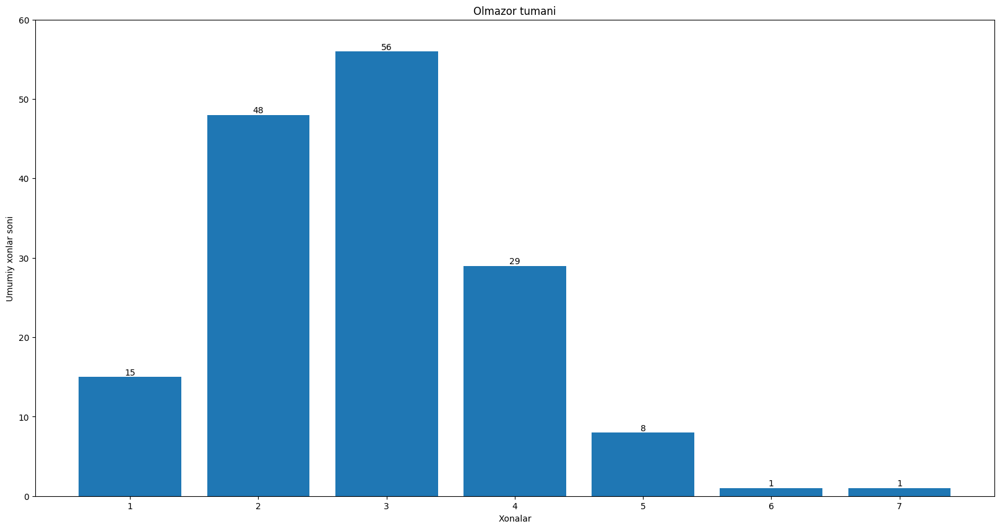

In [319]:
names = xonalar_soni.index
counts = xonalar_soni.values

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Umumiy xonlar soni', title='Olmazor tumani', ylim=(0, 60))
ax.set(xlabel="Xonalar")
ax.bar_label(bar_container)

In [320]:
xonalar_soni = data_olx[(data_olx["Location"]=="Мирзо-Улугбекский район")]["Xonalar"].value_counts()
xonalar_soni
# Мирзо-Улугбекский район xonalar soni

Xonalar
2    274
3    219
1    143
4     90
5     20
6      6
8      3
7      2
Name: count, dtype: int64

[Text(0, 0, '274'),
 Text(0, 0, '219'),
 Text(0, 0, '143'),
 Text(0, 0, '90'),
 Text(0, 0, '20'),
 Text(0, 0, '6'),
 Text(0, 0, '3'),
 Text(0, 0, '2')]

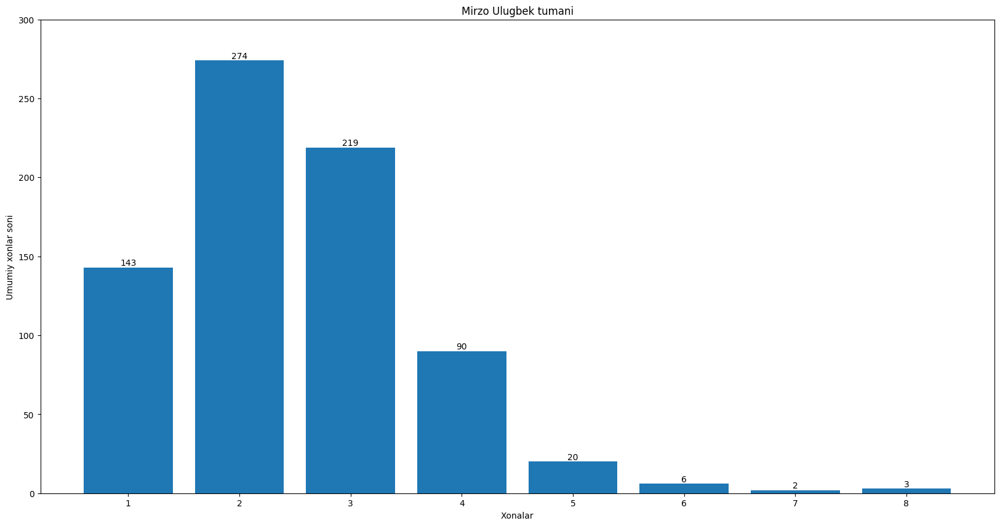

In [321]:
names = xonalar_soni.index
counts = xonalar_soni.values

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Umumiy xonlar soni', title='Mirzo Ulugbek tumani', ylim=(0, 300))
ax.set(xlabel="Xonalar")
ax.bar_label(bar_container)

In [322]:
xonalar_soni = data_olx[(data_olx["Location"]=="Юнусабадский район")]["Xonalar"].value_counts()
xonalar_soni
# Юнусабадский район xonalar soni

Xonalar
2    233
3    200
1     80
4     74
5     21
Name: count, dtype: int64

[Text(0, 0, '233'),
 Text(0, 0, '200'),
 Text(0, 0, '80'),
 Text(0, 0, '74'),
 Text(0, 0, '21')]

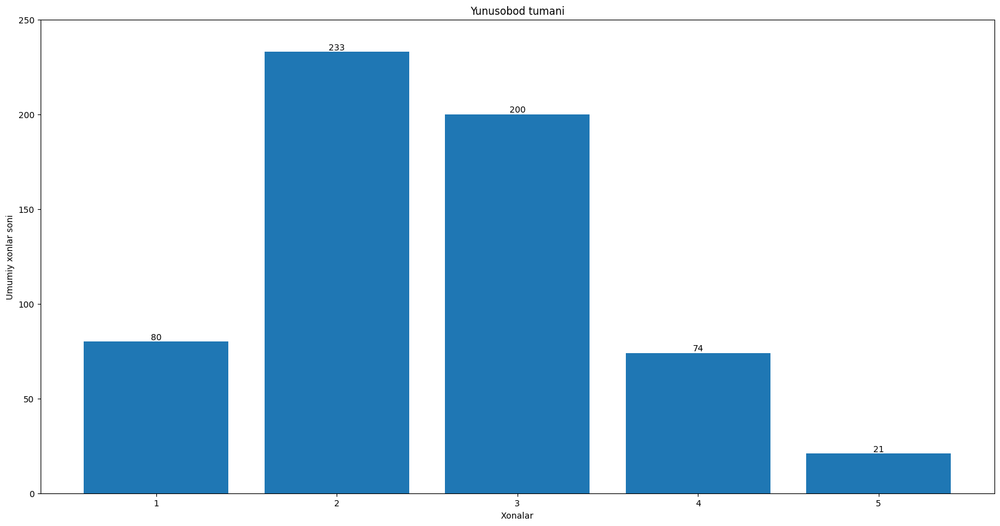

In [323]:
names = xonalar_soni.index
counts = xonalar_soni.values

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Umumiy xonlar soni', title='Yunusobod tumani', ylim=(0, 250))
ax.set(xlabel="Xonalar")
ax.bar_label(bar_container)

In [324]:
xonalar_soni = data_olx[(data_olx["Location"]=="Мирабадский район")]["Xonalar"].value_counts()
xonalar_soni
# Мирабадский район xonalar soni

Xonalar
3     150
2     142
4      69
1      48
5      13
6       4
11      1
Name: count, dtype: int64

[Text(0, 0, '150'),
 Text(0, 0, '142'),
 Text(0, 0, '69'),
 Text(0, 0, '48'),
 Text(0, 0, '13'),
 Text(0, 0, '4'),
 Text(0, 0, '1')]

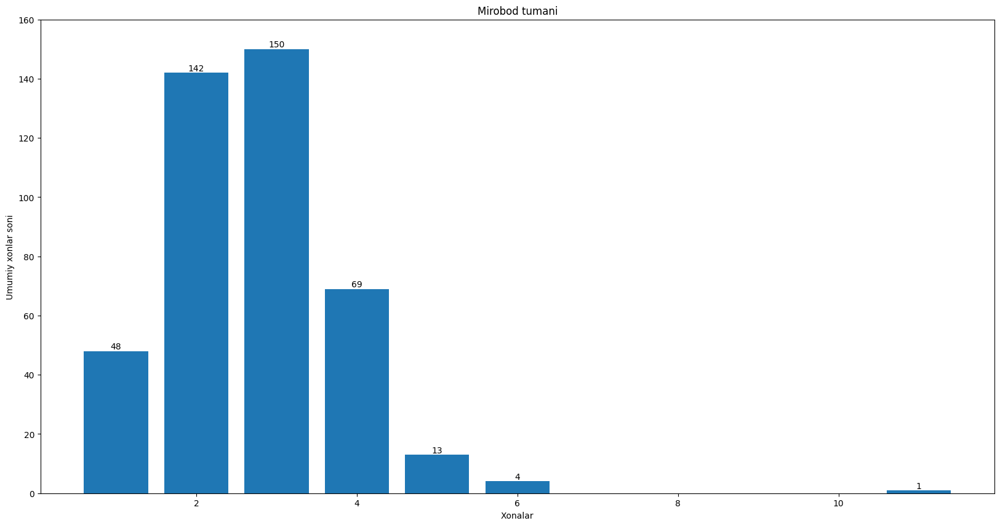

In [325]:
names = xonalar_soni.index
counts = xonalar_soni.values

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Umumiy xonlar soni', title='Mirobod tumani', ylim=(0, 160))
ax.set(xlabel="Xonalar")
ax.bar_label(bar_container)

In [326]:
xonalar_soni = data_olx[(data_olx["Location"]=="Бектемирский район")]["Xonalar"].value_counts()
xonalar_soni
# Бектемирский район xonalar soni

Xonalar
2    11
4     2
1     2
3     2
Name: count, dtype: int64

[Text(0, 0, '11'), Text(0, 0, '2'), Text(0, 0, '2'), Text(0, 0, '2')]

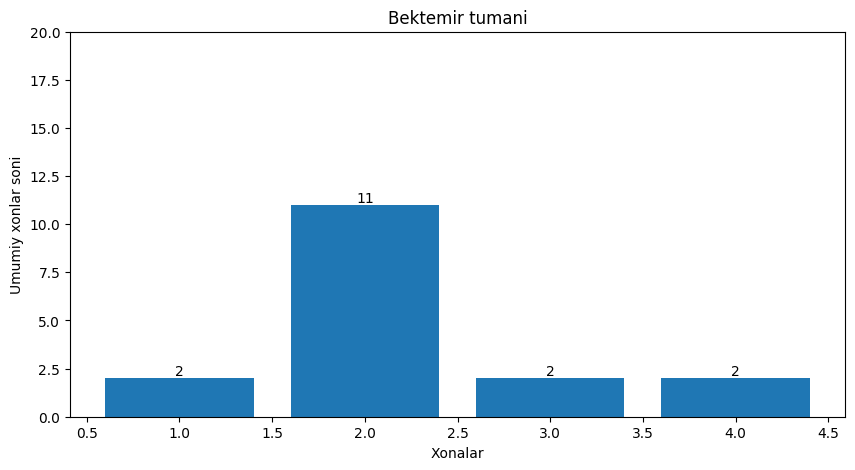

In [327]:
names = xonalar_soni.index
counts = xonalar_soni.values

fig, ax = plt.subplots(figsize=(10,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Umumiy xonlar soni', title='Bektemir tumani', ylim=(0, 20))
ax.set(xlabel="Xonalar")
ax.bar_label(bar_container)

In [328]:
xonalar_soni = data_olx[(data_olx["Location"]=="Яшнабадский район")]["Xonalar"].value_counts()
xonalar_soni
# Яшнабадский район xonalar soni

Xonalar
2    122
3     77
1     64
4     39
5      2
6      1
Name: count, dtype: int64

[Text(0, 0, '122'),
 Text(0, 0, '77'),
 Text(0, 0, '64'),
 Text(0, 0, '39'),
 Text(0, 0, '2'),
 Text(0, 0, '1')]

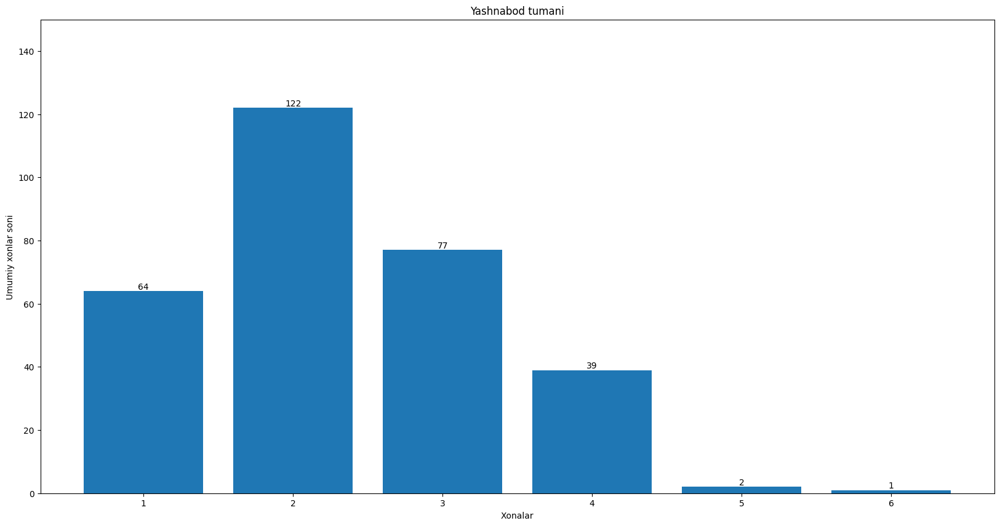

In [329]:
names = xonalar_soni.index
counts = xonalar_soni.values

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Umumiy xonlar soni', title='Yashnabod tumani', ylim=(0, 150))
ax.set(xlabel="Xonalar")
ax.bar_label(bar_container)

In [330]:
xonalar_soni = data_olx[(data_olx["Location"]=="Сергелийский район")]["Xonalar"].value_counts()
xonalar_soni
# Сергелийский район xonalar soni

Xonalar
2    66
3    51
1    33
4    23
5     5
6     2
7     1
Name: count, dtype: int64

[Text(0, 0, '66'),
 Text(0, 0, '51'),
 Text(0, 0, '33'),
 Text(0, 0, '23'),
 Text(0, 0, '5'),
 Text(0, 0, '2'),
 Text(0, 0, '1')]

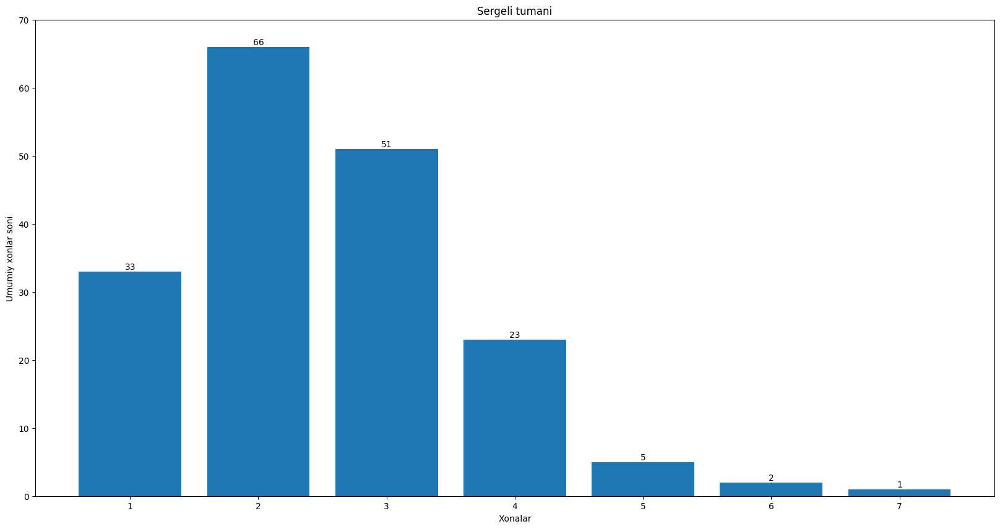

In [331]:
names = xonalar_soni.index
counts = xonalar_soni.values

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Umumiy xonlar soni', title='Sergeli tumani', ylim=(0, 70))
ax.set(xlabel="Xonalar")
ax.bar_label(bar_container)

In [332]:
xonalar_soni = data_olx[(data_olx["Location"]=="Учтепинский район")]["Xonalar"].value_counts()
xonalar_soni
# Учтепинский район xonalar soni

Xonalar
3    33
2    32
1    11
4     9
Name: count, dtype: int64

[Text(0, 0, '33'), Text(0, 0, '32'), Text(0, 0, '11'), Text(0, 0, '9')]

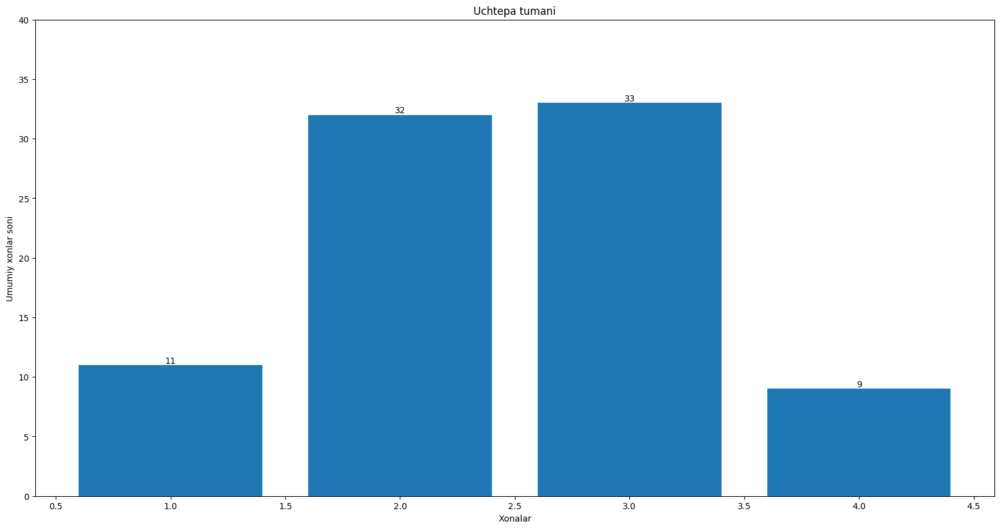

In [333]:
names = xonalar_soni.index
counts = xonalar_soni.values

fig, ax = plt.subplots(figsize=(20,10))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Umumiy xonlar soni', title='Uchtepa tumani', ylim=(0, 40))
ax.set(xlabel="Xonalar")
ax.bar_label(bar_container)

In [334]:
data_olx["Location"].unique()

array(['Яккасарайский район', 'Шайхантахурский район',
       'Чиланзарский район', 'Алмазарский район',
       'Мирзо-Улугбекский район', 'Юнусабадский район',
       'Мирабадский район', 'Бектемирский район', 'Яшнабадский район',
       'Сергелийский район', 'Учтепинский район'], dtype=object)

In [335]:
xonalar_soni = data_olx[(data_olx["Location"]=="Учтепинский район")]["Xonalar"].value_counts()
xonalar_soni.sort_index()

Xonalar
1    11
2    32
3    33
4     9
Name: count, dtype: int64

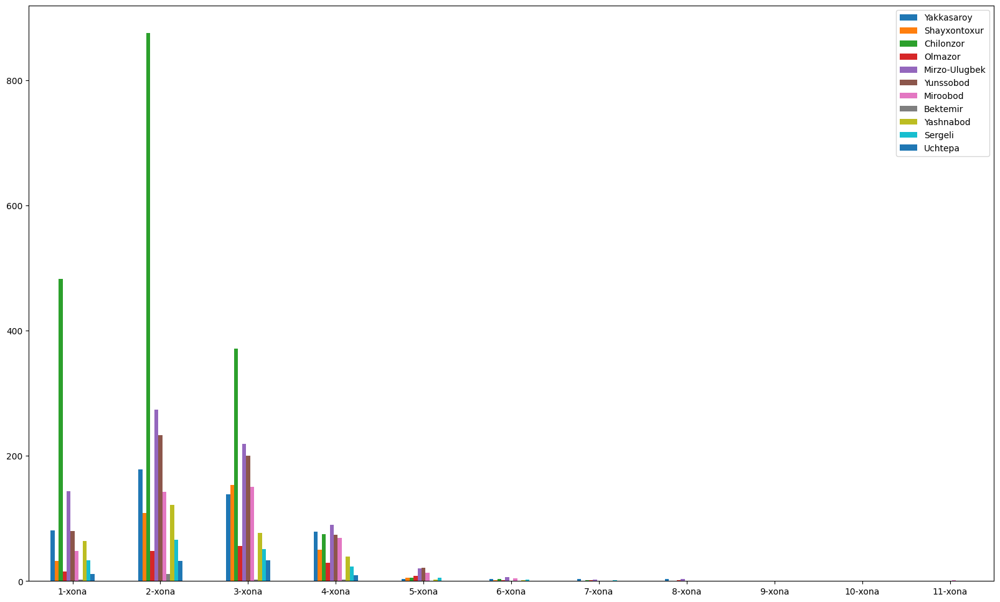

In [336]:
yak = [81, 178, 138, 79, 3, 3, 3, 3, 0, 0, 0]

shayx = [32, 109, 153, 50, 5, 1, 0, 0, 0, 0, 0]

chl = [483, 875, 371, 75, 5, 3, 1, 0, 0, 0, 0]

olm = [15, 48, 56, 29, 8, 1, 1, 1, 0, 0, 0]

mirzo = [143, 274, 219, 90, 20, 6, 2, 3, 0, 0, 0]

yun = [80, 233, 200, 74, 21, 0, 0, 0, 0, 0, 0]

mir = [48, 142, 150, 69, 13, 4, 0, 0, 0, 0, 1]

bek = [2, 11, 2, 2, 0, 0, 0, 0, 0, 0, 0]

yash = [64, 122, 77, 39, 2, 1, 0, 0, 0, 0, 0]

ser = [33, 66, 51, 23, 5, 2, 1, 0, 0, 0, 0]

uch = [11, 32, 33, 9, 0, 0, 0, 0, 0, 0, 0]

index = ['1-xona', '2-xona', '3-xona',

         '4-xona', '5-xona', '6-xona', '7-xona', "8-xona", "9-xona", "10-xona", "11-xona"]

df = pd.DataFrame({'Yakkasaroy': yak,
                   'Shayxontoxur': shayx,
                   'Chilonzor': chl,
                   'Olmazor': olm,
                   'Mirzo-Ulugbek': mirzo,
                   'Yunssobod': yun,
                   'Miroobod': mir,
                   'Bektemir': bek,
                   'Yashnabod': yash,
                   'Sergeli': ser,
                   'Uchtepa': uch}, index=index)

ax = df.plot.bar(rot=0, figsize=(20,12))

In [337]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
count,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000
mean,61283.036394,2.375988,66.534523,3.700328,5.935826,0.431490,0.362305,0.334168,0.161688,0.168241,0.188090,0.340721,0.162459,0.447870,0.706302,0.706302,0.724032,0.724610,0.725188,0.698400,0.698208,0.698400,0.710927,0.710927,0.712276,0.714781,0.714781,0.713047
std,42867.565460,1.023570,36.429027,2.275757,2.837124,0.495332,0.480713,0.471744,0.368200,0.374116,0.390822,0.473997,0.368907,0.497323,0.455499,0.455499,0.447044,0.446754,0.446463,0.458997,0.459080,0.458997,0.453376,0.453376,0.452745,0.451562,0.451562,0.452383
min,5200.000000,1.000000,13.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38000.000000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,49000.000000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,67390.000000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,599000.000000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [338]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Яккасарайский район")]["Etaj"].value_counts()
xonadonlar_soni
# Yakkasaroydagi xonadonlar qaysi qavatlarda joylashganligi soni

Etaj
4     96
3     84
5     74
2     54
7     51
1     50
9     23
8     21
6     21
10     8
11     2
12     2
16     1
14     1
Name: count, dtype: int64

[Text(0, 0, '96'),
 Text(0, 0, '84'),
 Text(0, 0, '74'),
 Text(0, 0, '54'),
 Text(0, 0, '51'),
 Text(0, 0, '50'),
 Text(0, 0, '23'),
 Text(0, 0, '21'),
 Text(0, 0, '21'),
 Text(0, 0, '8'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

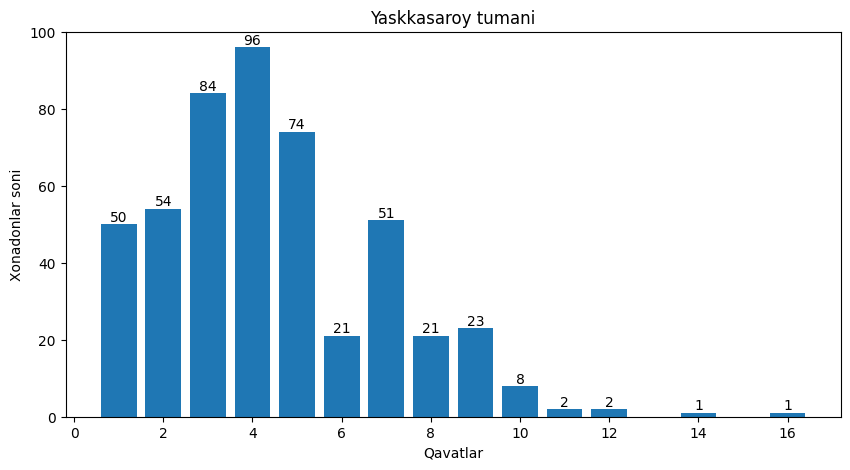

In [339]:
names = xonadonlar_soni.index
counts = xonadonlar_soni.values

fig, ax = plt.subplots(figsize=(10,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Xonadonlar soni', title='Yaskkasaroy tumani', ylim=(0, 100))
ax.set(xlabel="Qavatlar")
ax.bar_label(bar_container)

In [340]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Шайхантахурский район")]["Etaj"].value_counts()
xonadonlar_soni
# Шайхантахурский район xonadonlar qaysi qavatlarda joylashganligi soni

Etaj
3     76
4     67
5     46
2     43
1     28
9     27
6     27
7     16
8     15
10     2
12     2
13     1
Name: count, dtype: int64

[Text(0, 0, '76'),
 Text(0, 0, '67'),
 Text(0, 0, '46'),
 Text(0, 0, '43'),
 Text(0, 0, '28'),
 Text(0, 0, '27'),
 Text(0, 0, '27'),
 Text(0, 0, '16'),
 Text(0, 0, '15'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1')]

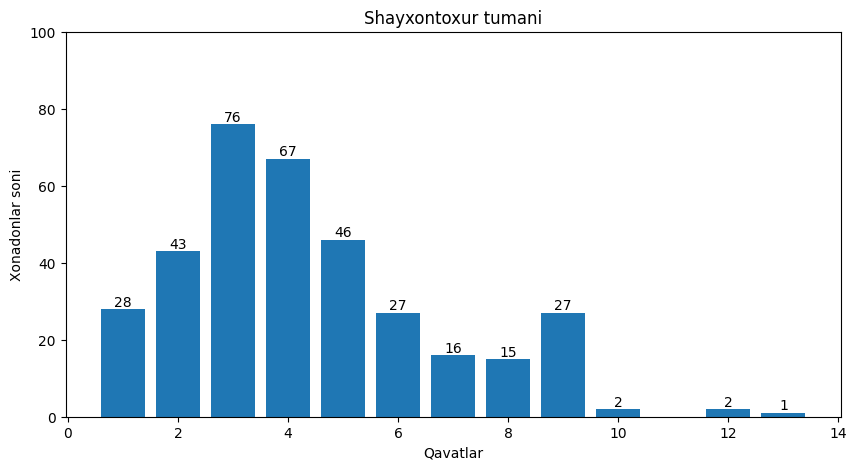

In [341]:
names = xonadonlar_soni.index
counts = xonadonlar_soni.values

fig, ax = plt.subplots(figsize=(10,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Xonadonlar soni', title='Shayxontoxur tumani', ylim=(0, 100))
ax.set(xlabel="Qavatlar")
ax.bar_label(bar_container)

In [342]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Чиланзарский район")]["Etaj"].value_counts()
xonadonlar_soni
# Чиланзарский район xonadonlar qaysi qavatlarda joylashganligi soni

Etaj
4     503
3     405
2     367
1     342
5      81
9      48
6      29
7      19
8      17
10      1
11      1
Name: count, dtype: int64

[Text(0, 0, '503'),
 Text(0, 0, '405'),
 Text(0, 0, '367'),
 Text(0, 0, '342'),
 Text(0, 0, '81'),
 Text(0, 0, '48'),
 Text(0, 0, '29'),
 Text(0, 0, '19'),
 Text(0, 0, '17'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

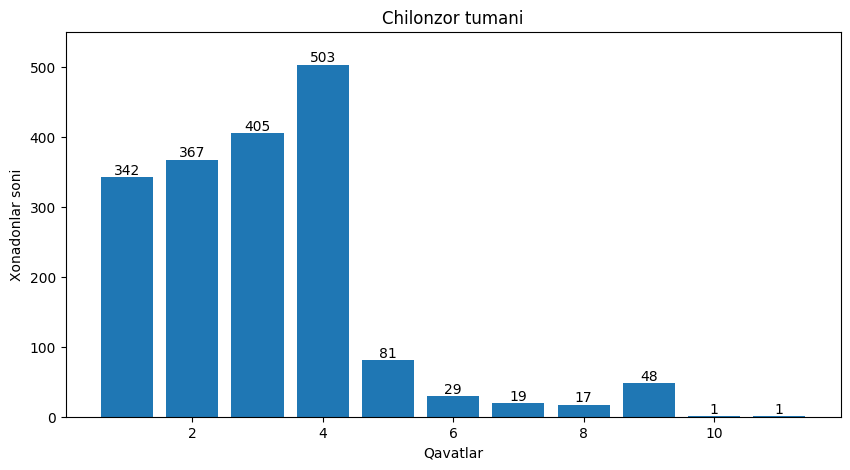

In [343]:
names = xonadonlar_soni.index
counts = xonadonlar_soni.values

fig, ax = plt.subplots(figsize=(10,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Xonadonlar soni', title='Chilonzor tumani', ylim=(0, 550))
ax.set(xlabel="Qavatlar")
ax.bar_label(bar_container)

In [344]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Алмазарский район")]["Etaj"].value_counts()
xonadonlar_soni
# Алмазарский район xonadonlar qaysi qavatlarda joylashganligi soni

Etaj
4     43
1     28
3     26
5     25
2     15
7      9
8      4
6      4
9      2
12     1
13     1
Name: count, dtype: int64

[Text(0, 0, '43'),
 Text(0, 0, '28'),
 Text(0, 0, '26'),
 Text(0, 0, '25'),
 Text(0, 0, '15'),
 Text(0, 0, '9'),
 Text(0, 0, '4'),
 Text(0, 0, '4'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

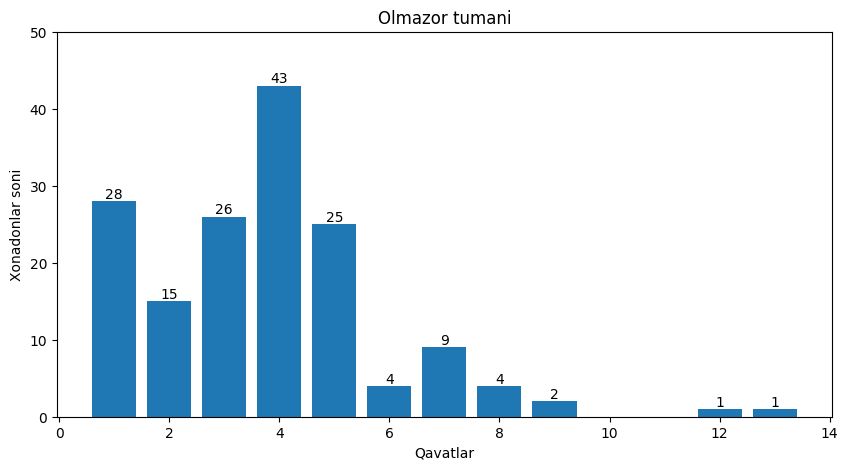

In [345]:
names = xonadonlar_soni.index
counts = xonadonlar_soni.values

fig, ax = plt.subplots(figsize=(10,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Xonadonlar soni', title='Olmazor tumani', ylim=(0, 50))
ax.set(xlabel="Qavatlar")
ax.bar_label(bar_container)

In [346]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Мирзо-Улугбекский район")]["Etaj"].value_counts()
xonadonlar_soni
# Мирзо-Улугбекский район xonadonlar qaysi qavatlarda joylashganligi soni

Etaj
2     166
3     161
4     118
1     107
5      73
6      38
7      27
9      26
8      23
10      7
13      3
16      2
12      2
15      1
24      1
17      1
20      1
Name: count, dtype: int64

[Text(0, 0, '166'),
 Text(0, 0, '161'),
 Text(0, 0, '118'),
 Text(0, 0, '107'),
 Text(0, 0, '73'),
 Text(0, 0, '38'),
 Text(0, 0, '27'),
 Text(0, 0, '26'),
 Text(0, 0, '23'),
 Text(0, 0, '7'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

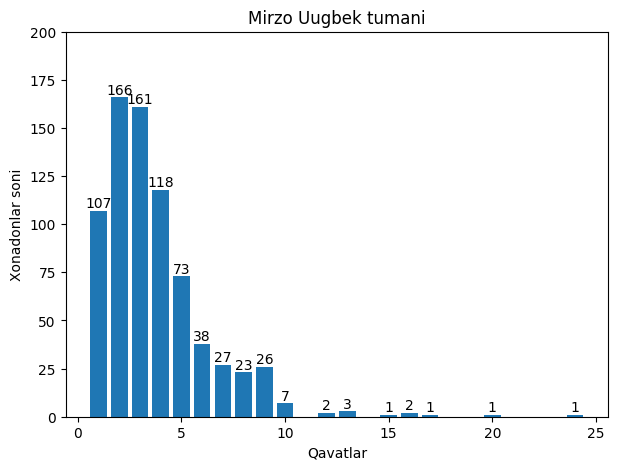

In [347]:
names = xonadonlar_soni.index
counts = xonadonlar_soni.values

fig, ax = plt.subplots(figsize=(7,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Xonadonlar soni', title='Mirzo Uugbek tumani', ylim=(0, 200))
ax.set(xlabel="Qavatlar")
ax.bar_label(bar_container)

In [348]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Юнусабадский район")]["Etaj"].value_counts()
xonadonlar_soni
# Юнусабадский район район xonadonlar qaysi qavatlarda joylashganligi soni

Etaj
3     152
2     123
4      99
1      95
5      43
8      25
9      24
7      23
6      17
10      4
11      1
12      1
16      1
Name: count, dtype: int64

[Text(0, 0, '152'),
 Text(0, 0, '123'),
 Text(0, 0, '99'),
 Text(0, 0, '95'),
 Text(0, 0, '43'),
 Text(0, 0, '25'),
 Text(0, 0, '24'),
 Text(0, 0, '23'),
 Text(0, 0, '17'),
 Text(0, 0, '4'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

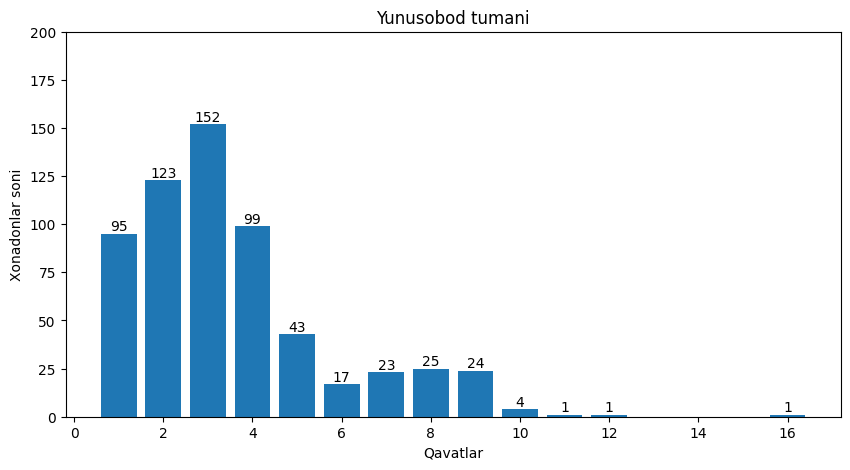

In [349]:
names = xonadonlar_soni.index
counts = xonadonlar_soni.values

fig, ax = plt.subplots(figsize=(10,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Xonadonlar soni', title='Yunusobod tumani', ylim=(0, 200))
ax.set(xlabel="Qavatlar")
ax.bar_label(bar_container)

In [350]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Мирабадский район")]["Etaj"].value_counts()
xonadonlar_soni
# Мирабадский район xonadonlar qaysi qavatlarda joylashganligi soni

Etaj
4     88
3     74
2     71
5     55
7     35
6     28
9     26
1     22
8     22
11     3
10     1
14     1
15     1
Name: count, dtype: int64

[Text(0, 0, '88'),
 Text(0, 0, '74'),
 Text(0, 0, '71'),
 Text(0, 0, '55'),
 Text(0, 0, '35'),
 Text(0, 0, '28'),
 Text(0, 0, '26'),
 Text(0, 0, '22'),
 Text(0, 0, '22'),
 Text(0, 0, '3'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

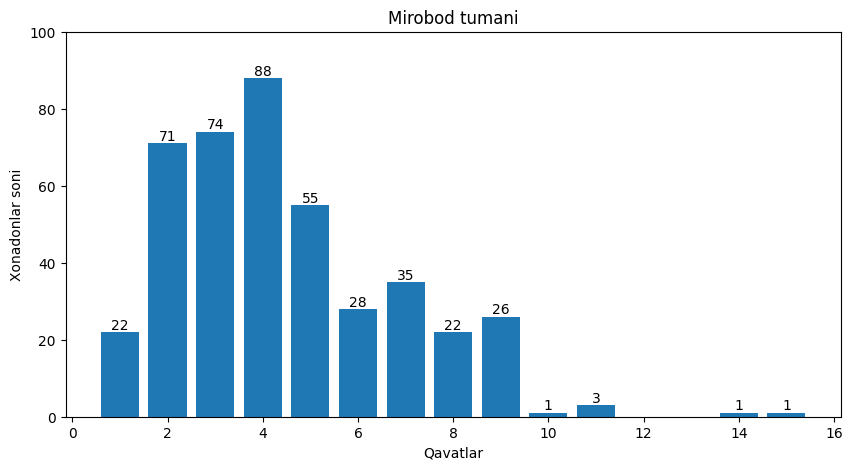

In [351]:
names = xonadonlar_soni.index
counts = xonadonlar_soni.values

fig, ax = plt.subplots(figsize=(10,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Xonadonlar soni', title='Mirobod tumani', ylim=(0, 100))
ax.set(xlabel="Qavatlar")
ax.bar_label(bar_container)

In [352]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Бектемирский район")]["Etaj"].value_counts()
xonadonlar_soni
# Бектемирский район xonadonlar qaysi qavatlarda joylashganligi soni

Etaj
4     4
2     3
1     3
7     2
3     2
9     2
12    1
Name: count, dtype: int64

[Text(0, 0, '4'),
 Text(0, 0, '3'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1')]

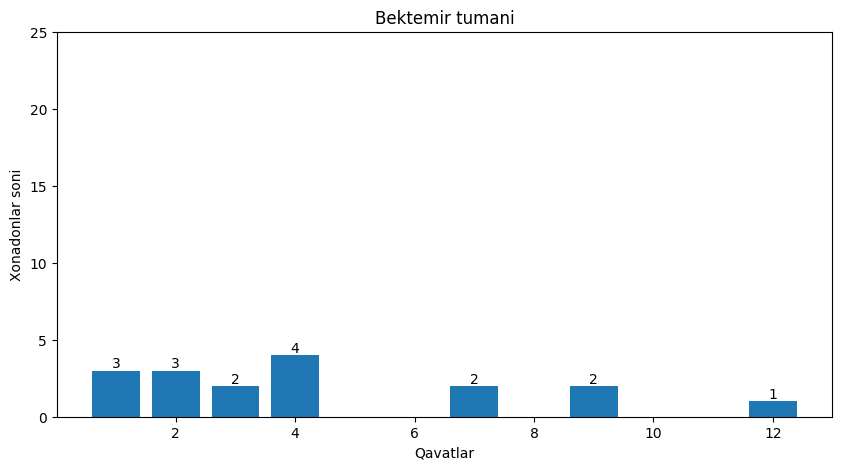

In [353]:
names = xonadonlar_soni.index
counts = xonadonlar_soni.values

fig, ax = plt.subplots(figsize=(10,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Xonadonlar soni', title='Bektemir tumani', ylim=(0, 25))
ax.set(xlabel="Qavatlar")
ax.bar_label(bar_container)

In [354]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Яшнабадский район")]["Etaj"].value_counts()
xonadonlar_soni
# Яшнабадский район xonadonlar qaysi qavatlarda joylashganligi soni

Etaj
1     48
3     46
4     39
7     38
2     37
5     33
8     29
6     19
9     14
10     2
Name: count, dtype: int64

[Text(0, 0, '48'),
 Text(0, 0, '46'),
 Text(0, 0, '39'),
 Text(0, 0, '38'),
 Text(0, 0, '37'),
 Text(0, 0, '33'),
 Text(0, 0, '29'),
 Text(0, 0, '19'),
 Text(0, 0, '14'),
 Text(0, 0, '2')]

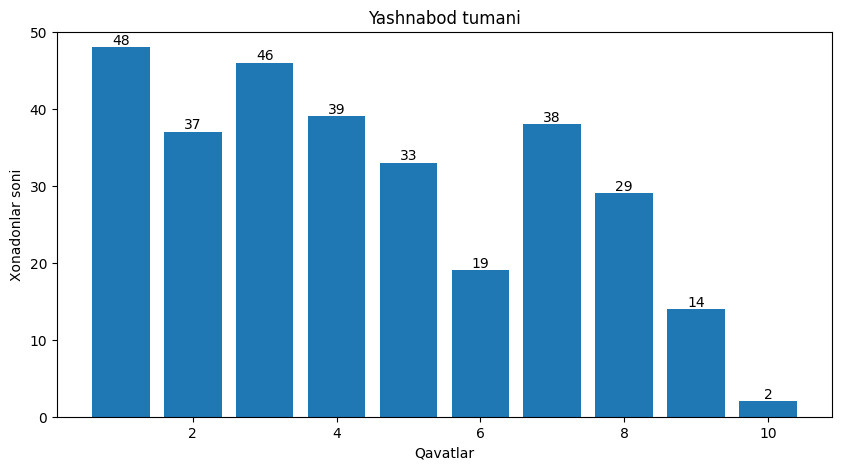

In [355]:
names = xonadonlar_soni.index
counts = xonadonlar_soni.values

fig, ax = plt.subplots(figsize=(10,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Xonadonlar soni', title='Yashnabod tumani', ylim=(0, 50))
ax.set(xlabel="Qavatlar")
ax.bar_label(bar_container)

In [356]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Сергелийский район")]["Etaj"].value_counts()
xonadonlar_soni
# Сергелийский район xonadonlar qaysi qavatlarda joylashganligi soni

Etaj
1     48
2     28
5     24
4     23
3     21
7     15
8      8
6      7
9      3
10     2
11     1
14     1
Name: count, dtype: int64

[Text(0, 0, '48'),
 Text(0, 0, '28'),
 Text(0, 0, '24'),
 Text(0, 0, '23'),
 Text(0, 0, '21'),
 Text(0, 0, '15'),
 Text(0, 0, '8'),
 Text(0, 0, '7'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

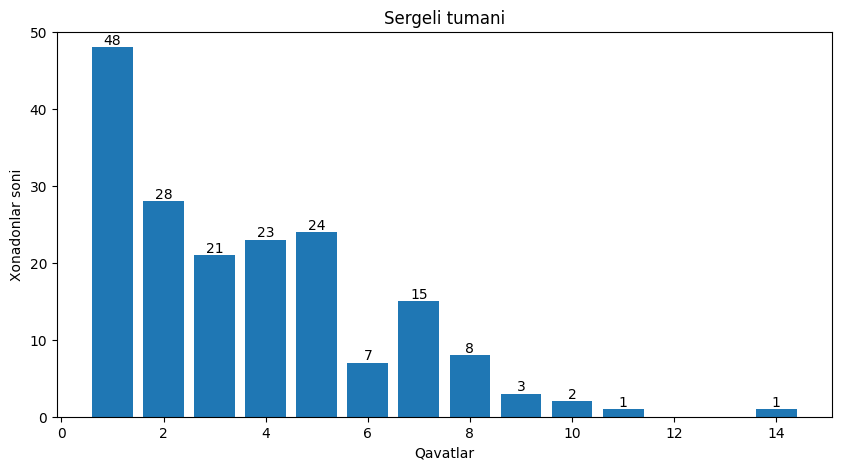

In [357]:
names = xonadonlar_soni.index
counts = xonadonlar_soni.values

fig, ax = plt.subplots(figsize=(10,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Xonadonlar soni', title='Sergeli tumani', ylim=(0, 50))
ax.set(xlabel="Qavatlar")
ax.bar_label(bar_container)

In [358]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Учтепинский район")]["Etaj"].value_counts()
xonadonlar_soni
# Учтепинский район xonadonlar qaysi qavatlarda joylashganligi soni

Etaj
1     18
3     17
4     16
2     13
5     12
9      3
15     2
8      2
6      1
7      1
Name: count, dtype: int64

[Text(0, 0, '18'),
 Text(0, 0, '17'),
 Text(0, 0, '16'),
 Text(0, 0, '13'),
 Text(0, 0, '12'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

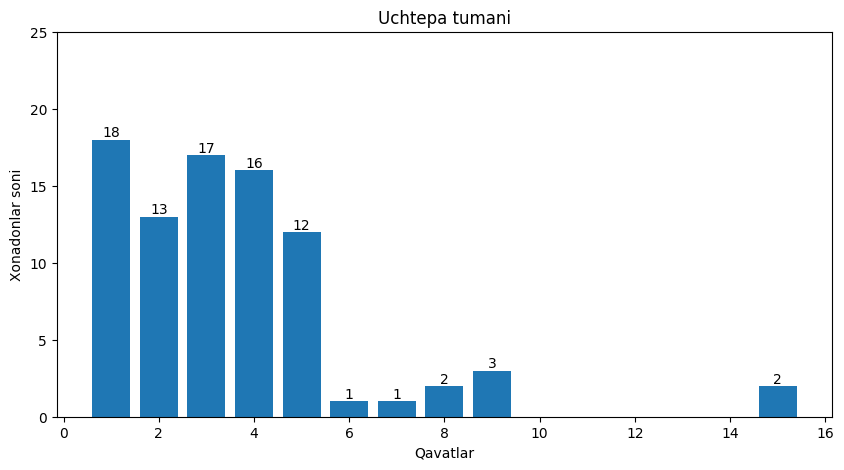

In [359]:
names = xonadonlar_soni.index
counts = xonadonlar_soni.values

fig, ax = plt.subplots(figsize=(10,5))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Xonadonlar soni', title='Uchtepa tumani', ylim=(0, 25))
ax.set(xlabel="Qavatlar")
ax.bar_label(bar_container)

In [360]:
data_olx["Location"].unique()

array(['Яккасарайский район', 'Шайхантахурский район',
       'Чиланзарский район', 'Алмазарский район',
       'Мирзо-Улугбекский район', 'Юнусабадский район',
       'Мирабадский район', 'Бектемирский район', 'Яшнабадский район',
       'Сергелийский район', 'Учтепинский район'], dtype=object)

In [361]:
xonadonlar_soni = data_olx[(data_olx["Location"]=="Учтепинский район")]["Etaj"].value_counts()
xonadonlar_soni.sort_index()

Etaj
1     18
2     13
3     17
4     16
5     12
6      1
7      1
8      2
9      3
15     2
Name: count, dtype: int64

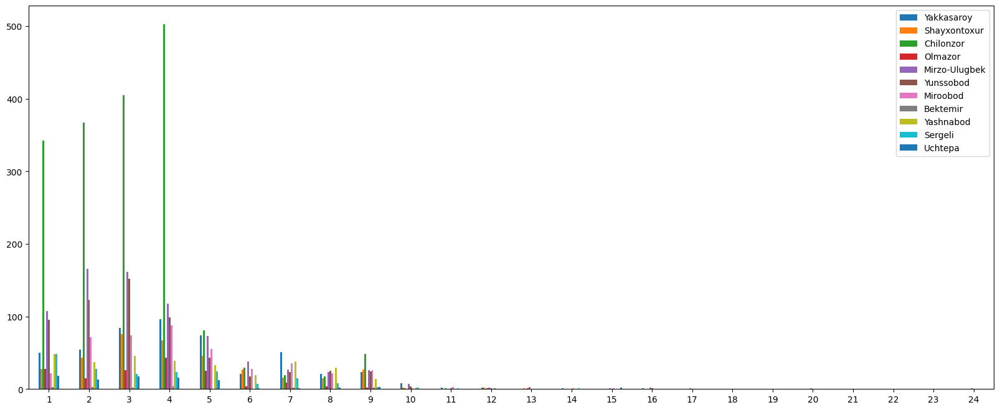

In [362]:
yak = [50,54,84,96,74,21,51,21,23,8,2,2,0,1,0,1,0,0,0,0,0,0,0,0]

shayx = [28,43,76,67,46,27,16,15,27,2,0,2,1,0,0,0,0,0,0,0,0,0,0,0]

chl = [342,367,405,503,81,29,19,17,48,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0]

olm = [28,15,26,43,25,4,9,4,2,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0]

mirzo = [107,166,161,118,73,38,27,23,26,7,0,2,3,0,1,2,1,0,0,1,0,0,0,1]

yun = [95,123,152,99,43,17,23,25,24,4,1,1,0,0,0,1,0,0,0,0,0,0,0,0]

mir = [22,71,74,88,55,28,35,22,26,1,3,0,0,1,1,0,0,0,0,0,0,0,0,0]

bek = [3,3,2,4,0,0,2,0,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0]

yash = [48,37,46,39,33,19,38,29,14,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0]

ser = [48,28,21,23,24,7,15,8,3,2,1,0,0,1,0,0,0,0,0,0,0,0,0,0]

uch = [18,13,17,16,12,1,1,2,3,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0]

index = ['1', '2', '3',

         '4', '5', '6', '7', "8", "9", "10", "11","12","13","14","15","16","17","18","19","20",
         "21","22","23","24"]

df = pd.DataFrame({'Yakkasaroy': yak,
                   'Shayxontoxur': shayx,
                   'Chilonzor': chl,
                   'Olmazor': olm,
                   'Mirzo-Ulugbek': mirzo,
                   'Yunssobod': yun,
                   'Miroobod': mir,
                   'Bektemir': bek,
                   'Yashnabod': yash,
                   'Sergeli': ser,
                   'Uchtepa': uch}, index=index)

ax = df.plot.bar(rot=0, figsize=(20,8))
# tumanlar kesimida etajlar soni

In [363]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
count,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000,5189.000000
mean,61283.036394,2.375988,66.534523,3.700328,5.935826,0.431490,0.362305,0.334168,0.161688,0.168241,0.188090,0.340721,0.162459,0.447870,0.706302,0.706302,0.724032,0.724610,0.725188,0.698400,0.698208,0.698400,0.710927,0.710927,0.712276,0.714781,0.714781,0.713047
std,42867.565460,1.023570,36.429027,2.275757,2.837124,0.495332,0.480713,0.471744,0.368200,0.374116,0.390822,0.473997,0.368907,0.497323,0.455499,0.455499,0.447044,0.446754,0.446463,0.458997,0.459080,0.458997,0.453376,0.453376,0.452745,0.451562,0.451562,0.452383
min,5200.000000,1.000000,13.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38000.000000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,49000.000000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,67390.000000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,599000.000000,11.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [364]:
data_olx.describe(include="object")

,Location,Info,Xususiy biznes,Turar joyi
count,5189,5189,5189,5189
unique,11,5144,2,2
top,Чиланзарский район,Продаётся квартира,Бизнес,Вторичный рынок
freq,1813,7,4896,4152


In [365]:
data_olx["Location"].unique()

array(['Яккасарайский район', 'Шайхантахурский район',
       'Чиланзарский район', 'Алмазарский район',
       'Мирзо-Улугбекский район', 'Юнусабадский район',
       'Мирабадский район', 'Бектемирский район', 'Яшнабадский район',
       'Сергелийский район', 'Учтепинский район'], dtype=object)

In [366]:
joy_turi_soni1 = data_olx[(data_olx["Location"]=="Яккасарайский район")]["Turar joyi"].value_counts()
joy_turi_soni2 = data_olx[(data_olx["Location"]=="Шайхантахурский район")]["Turar joyi"].value_counts()
joy_turi_soni3 = data_olx[(data_olx["Location"]=="Чиланзарский район")]["Turar joyi"].value_counts()
joy_turi_soni4 = data_olx[(data_olx["Location"]=="Алмазарский район")]["Turar joyi"].value_counts()
joy_turi_soni5 = data_olx[(data_olx["Location"]=="Мирзо-Улугбекский район")]["Turar joyi"].value_counts()
joy_turi_soni6 = data_olx[(data_olx["Location"]=="Юнусабадский район")]["Turar joyi"].value_counts()
joy_turi_soni7 = data_olx[(data_olx["Location"]=="Мирабадский район")]["Turar joyi"].value_counts()
joy_turi_soni8 = data_olx[(data_olx["Location"]=="Бектемирский район")]["Turar joyi"].value_counts()
joy_turi_soni9 = data_olx[(data_olx["Location"]=="Яшнабадский район")]["Turar joyi"].value_counts()
joy_turi_soni10 = data_olx[(data_olx["Location"]=="Сергелийский район")]["Turar joyi"].value_counts()
joy_turi_soni11 = data_olx[(data_olx["Location"]=="Учтепинский район")]["Turar joyi"].value_counts()

In [367]:
joy_turi_soni2

Turar joyi
Вторичный рынок    248
Новостройки        102
Name: count, dtype: int64

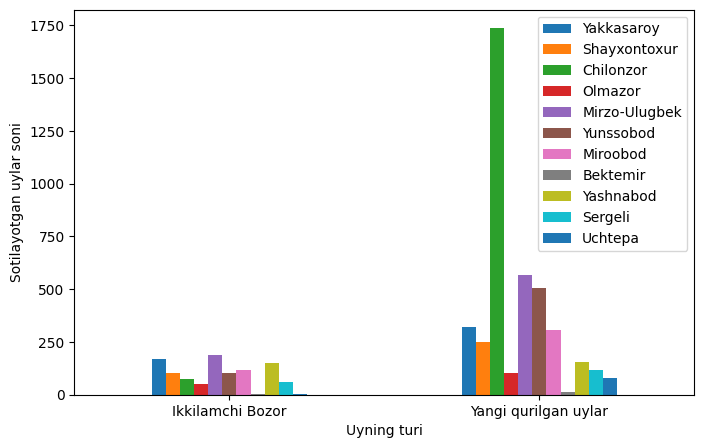

In [368]:
yak = list(joy_turi_soni1.sort_values())

shayx = list(joy_turi_soni2.sort_values())

chl = list(joy_turi_soni3.sort_values())

olm = list(joy_turi_soni4.sort_values())

mirzo = list(joy_turi_soni5.sort_values())

yun = list(joy_turi_soni6.sort_values())

mir = list(joy_turi_soni7.sort_values())

bek = list(joy_turi_soni8.sort_values())

yash = list(joy_turi_soni9.sort_values())

ser = list(joy_turi_soni10.sort_values())

uch = list(joy_turi_soni11.sort_values())


index = ['Ikkilamchi Bozor','Yangi qurilgan uylar']

df = pd.DataFrame({'Yakkasaroy': yak,
                   'Shayxontoxur': shayx,
                   'Chilonzor': chl,
                   'Olmazor': olm,
                   'Mirzo-Ulugbek': mirzo,
                   'Yunssobod': yun,
                   'Miroobod': mir,
                   'Bektemir': bek,
                   'Yashnabod': yash,
                   'Sergeli': ser,
                   'Uchtepa': uch}, index=index)

ax = df.plot.bar(rot=0, figsize=(8,5))
# Uy turlari tumanlar boyicha
ax = plt.xlabel("Uyning turi")
ax = plt.ylabel("Sotilayotgan uylar soni")

In [369]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5197,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5198,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5199,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [370]:
data_olx["Turar joyi"].unique()

array(['Новостройки', 'Вторичный рынок'], dtype=object)

In [371]:
data_olx["Location"].unique()

array(['Яккасарайский район', 'Шайхантахурский район',
       'Чиланзарский район', 'Алмазарский район',
       'Мирзо-Улугбекский район', 'Юнусабадский район',
       'Мирабадский район', 'Бектемирский район', 'Яшнабадский район',
       'Сергелийский район', 'Учтепинский район'], dtype=object)

In [372]:
yak1 = data_olx[(data_olx["Turar joyi"]=="Новостройки") & (data_olx["Location"]=="Яккасарайский район")]["Prices"].max()
shay1 = data_olx[(data_olx["Turar joyi"]=="Новостройки") & (data_olx["Location"]=="Шайхантахурский район")]["Prices"].max()
chil1 = data_olx[(data_olx["Turar joyi"]=="Новостройки") & (data_olx["Location"]=="Чиланзарский район")]["Prices"].max()
olm1 = data_olx[(data_olx["Turar joyi"]=="Новостройки") & (data_olx["Location"]=="Алмазарский район")]["Prices"].max()
mirzo1 = data_olx[(data_olx["Turar joyi"]=="Новостройки") & (data_olx["Location"]=="Мирзо-Улугбекский район")]["Prices"].max()
yun1 = data_olx[(data_olx["Turar joyi"]=="Новостройки") & (data_olx["Location"]=="Юнусабадский район")]["Prices"].max()
mir1 = data_olx[(data_olx["Turar joyi"]=="Новостройки") & (data_olx["Location"]=="Мирабадский район")]["Prices"].max()
bek1 = data_olx[(data_olx["Turar joyi"]=="Новостройки") & (data_olx["Location"]=="Бектемирский район")]["Prices"].max()
yash1 = data_olx[(data_olx["Turar joyi"]=="Новостройки") & (data_olx["Location"]=="Яшнабадский район")]["Prices"].max()
ser1 = data_olx[(data_olx["Turar joyi"]=="Новостройки") & (data_olx["Location"]=="Сергелийский район")]["Prices"].max()
uch1 = data_olx[(data_olx["Turar joyi"]=="Новостройки") & (data_olx["Location"]=="Учтепинский район")]["Prices"].max()


In [373]:
yak2 = data_olx[(data_olx["Turar joyi"]=="Вторичный рынок") & (data_olx["Location"]=="Яккасарайский район")]["Prices"].max()
shay2 = data_olx[(data_olx["Turar joyi"]=="Вторичный рынок") & (data_olx["Location"]=="Шайхантахурский район")]["Prices"].max()
chil2 = data_olx[(data_olx["Turar joyi"]=="Вторичный рынок") & (data_olx["Location"]=="Чиланзарский район")]["Prices"].max()
olm2 = data_olx[(data_olx["Turar joyi"]=="Вторичный рынок") & (data_olx["Location"]=="Алмазарский район")]["Prices"].max()
mirzo2 = data_olx[(data_olx["Turar joyi"]=="Вторичный рынок") & (data_olx["Location"]=="Мирзо-Улугбекский район")]["Prices"].max()
yun2 = data_olx[(data_olx["Turar joyi"]=="Вторичный рынок") & (data_olx["Location"]=="Юнусабадский район")]["Prices"].max()
mir2 = data_olx[(data_olx["Turar joyi"]=="Вторичный рынок") & (data_olx["Location"]=="Мирабадский район")]["Prices"].max()
bek2 = data_olx[(data_olx["Turar joyi"]=="Вторичный рынок") & (data_olx["Location"]=="Бектемирский район")]["Prices"].max()
yash2 = data_olx[(data_olx["Turar joyi"]=="Вторичный рынок") & (data_olx["Location"]=="Яшнабадский район")]["Prices"].max()
ser2 = data_olx[(data_olx["Turar joyi"]=="Вторичный рынок") & (data_olx["Location"]=="Сергелийский район")]["Prices"].max()
uch2 = data_olx[(data_olx["Turar joyi"]=="Вторичный рынок") & (data_olx["Location"]=="Учтепинский район")]["Prices"].max()


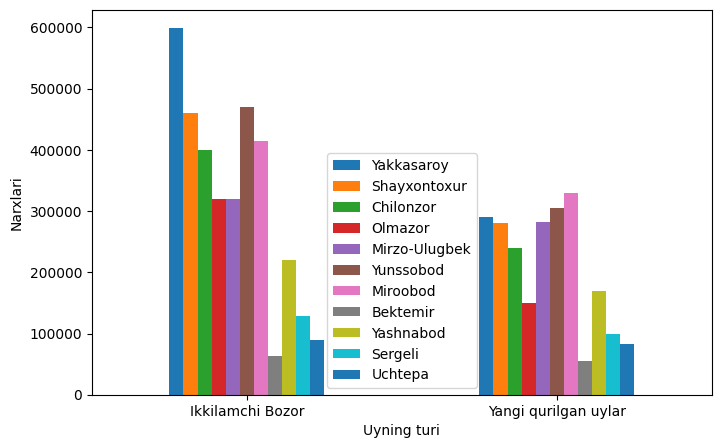

In [374]:
yak3 = [yak1, yak2]
shay3 = [shay1, shay2]
chil3 = [chil1, chil2]
olm3 = [olm1, olm2]
mirzo3 = [mirzo1, mirzo2]
yun3 = [yun1, yun2]
mir3 = [mir1, mir2]
bek3 = [bek1, bek2]
yash3 = [yash1, yash2]
ser3 = [ser1, ser2]
uch3 = [uch1, uch2]

index = ['Ikkilamchi Bozor','Yangi qurilgan uylar']

df = pd.DataFrame({'Yakkasaroy': yak3,
                   'Shayxontoxur': shay3,
                   'Chilonzor': chil3,
                   'Olmazor': olm3,
                   'Mirzo-Ulugbek': mirzo3,
                   'Yunssobod': yun3,
                   'Miroobod': mir3,
                   'Bektemir': bek3,
                   'Yashnabod': yash3,
                   'Sergeli': ser3,
                   'Uchtepa': uch3}, index=index)

ax = df.plot.bar(rot=0, figsize=(8,5))
ax = plt.xlabel("Uyning turi")
ax = plt.ylabel("Narxlari")

In [375]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5197,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5198,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5199,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [376]:
data_olx["Xususiy biznes"].value_counts()

Xususiy biznes
Бизнес          4896
Частное лицо     293
Name: count, dtype: int64

In [377]:
yak1 = len(data_olx[(data_olx["Xususiy biznes"]=="Бизнес") & (data_olx["Location"]=="Яккасарайский район")]["Xususiy biznes"].sum())/6
shay1 = len(data_olx[(data_olx["Xususiy biznes"]=="Бизнес") & (data_olx["Location"]=="Шайхантахурский район")]["Xususiy biznes"].sum())/6
chil1 = len(data_olx[(data_olx["Xususiy biznes"]=="Бизнес") & (data_olx["Location"]=="Чиланзарский район")]["Xususiy biznes"].sum())/6
olm1 = len(data_olx[(data_olx["Xususiy biznes"]=="Бизнес") & (data_olx["Location"]=="Алмазарский район")]["Xususiy biznes"].sum())/6
mirzo1 = len(data_olx[(data_olx["Xususiy biznes"]=="Бизнес") & (data_olx["Location"]=="Мирзо-Улугбекский район")]["Xususiy biznes"].sum())/6
yun1 = len(data_olx[(data_olx["Xususiy biznes"]=="Бизнес") & (data_olx["Location"]=="Юнусабадский район")]["Xususiy biznes"].sum())/6
mir1 = len(data_olx[(data_olx["Xususiy biznes"]=="Бизнес") & (data_olx["Location"]=="Мирабадский район")]["Xususiy biznes"].sum())/6
bek1 = len(data_olx[(data_olx["Xususiy biznes"]=="Бизнес") & (data_olx["Location"]=="Бектемирский район")]["Xususiy biznes"].sum())/6
yash1 = len(data_olx[(data_olx["Xususiy biznes"]=="Бизнес") & (data_olx["Location"]=="Яшнабадский район")]["Xususiy biznes"].sum())/6
ser1 = len(data_olx[(data_olx["Xususiy biznes"]=="Бизнес") & (data_olx["Location"]=="Сергелийский район")]["Xususiy biznes"].sum())/6
uch1 = len(data_olx[(data_olx["Xususiy biznes"]=="Бизнес") & (data_olx["Location"]=="Учтепинский район")]["Xususiy biznes"].sum())/6


In [378]:
yak2 = len(data_olx[(data_olx["Xususiy biznes"]=="Частное лицо") & (data_olx["Location"]=="Яккасарайский район")]["Xususiy biznes"].sum())/12
shay2 = len(data_olx[(data_olx["Xususiy biznes"]=="Частное лицо") & (data_olx["Location"]=="Шайхантахурский район")]["Xususiy biznes"].sum())/12
chil2 = len(data_olx[(data_olx["Xususiy biznes"]=="Частное лицо") & (data_olx["Location"]=="Чиланзарский район")]["Xususiy biznes"].sum())/12
olm2 = len(data_olx[(data_olx["Xususiy biznes"]=="Частное лицо") & (data_olx["Location"]=="Алмазарский район")]["Xususiy biznes"].sum())/12
mirzo2 = len(data_olx[(data_olx["Xususiy biznes"]=="Частное лицо") & (data_olx["Location"]=="Мирзо-Улугбекский район")]["Xususiy biznes"].sum())/12
yun2 = len(data_olx[(data_olx["Xususiy biznes"]=="Частное лицо") & (data_olx["Location"]=="Юнусабадский район")]["Xususiy biznes"].sum())/12
mir2 = len(data_olx[(data_olx["Xususiy biznes"]=="Частное лицо") & (data_olx["Location"]=="Мирабадский район")]["Xususiy biznes"].sum())/12
bek2 = len(data_olx[(data_olx["Xususiy biznes"]=="Частное лицо") & (data_olx["Location"]=="Бектемирский район")]["Xususiy biznes"].sum())/12
yash2 = len(data_olx[(data_olx["Xususiy biznes"]=="Частное лицо") & (data_olx["Location"]=="Яшнабадский район")]["Xususiy biznes"].sum())/12
ser2 = len(data_olx[(data_olx["Xususiy biznes"]=="Частное лицо") & (data_olx["Location"]=="Сергелийский район")]["Xususiy biznes"].sum())/12
uch2 = len(data_olx[(data_olx["Xususiy biznes"]=="Частное лицо") & (data_olx["Location"]=="Учтепинский район")]["Xususiy biznes"].sum())/12


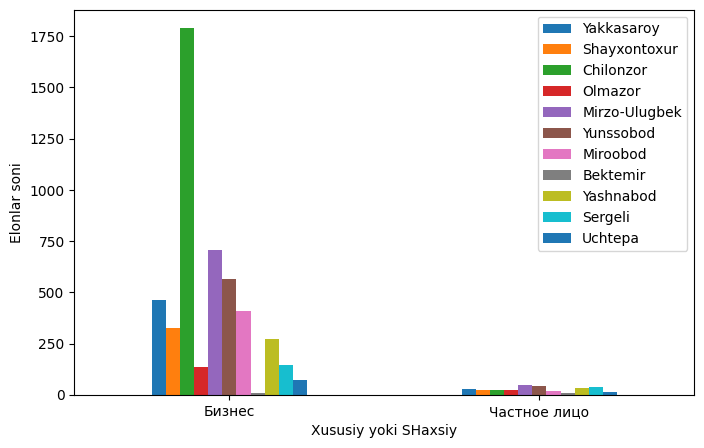

In [379]:
yak3 = [yak1, yak2]
shay3 = [shay1, shay2]
chil3 = [chil1, chil2]
olm3 = [olm1, olm2]
mirzo3 = [mirzo1, mirzo2]
yun3 = [yun1, yun2]
mir3 = [mir1, mir2]
bek3 = [bek1, bek2]
yash3 = [yash1, yash2]
ser3 = [ser1, ser2]
uch3 = [uch1, uch2]

index = ['Бизнес','Частное лицо']

df = pd.DataFrame({'Yakkasaroy': yak3,
                   'Shayxontoxur': shay3,
                   'Chilonzor': chil3,
                   'Olmazor': olm3,
                   'Mirzo-Ulugbek': mirzo3,
                   'Yunssobod': yun3,
                   'Miroobod': mir3,
                   'Bektemir': bek3,
                   'Yashnabod': yash3,
                   'Sergeli': ser3,
                   'Uchtepa': uch3}, index=index)

ax = df.plot.bar(rot=0, figsize=(8,5))
ax = plt.xlabel("Xususiy yoki SHaxsiy")
ax = plt.ylabel("Elonlar soni")

In [380]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5196,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5197,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5198,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5199,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [381]:
data_olx.groupby(by=["Xonalar"]).max()
# GRUPPA MAX BOLGANI UCHUN FAQAT Prices GA ETIBOR QARATSAK
# 1 xonalik uyni max narxi 399960 ekan galati tekshirib korish erak

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,399960.0,Частное лицо,Новостройки,563.0,17,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,564.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,578.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,455.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
11,Мирабадский район,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,240.0,5,5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [382]:
data_olx[data_olx["Prices"]==399960.0]
# Bizda qayta yuklangan data2 bor oshani ichidan tekshirib ko'ramiz balki narxi yashash maydonida dir

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
773,Чиланзарский район,Квартира сотилади новостройка\nБелтепада жойла...,399960.0,Частное лицо,Новостройки,1,120.0,1,5,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0


In [383]:
data2.iloc[773]
# menimcha bu uyning narxi 3333$ emas 333$ bolsa kerak shunda 120 kv uy 39960$
# lekin bu bir xona uchun juda katta narx shuing uchun ochirib tashlaymiz

Link                   https://www.olx.uz/d/obyavlenie/kvartira-sotil...
Location                                              Чиланзарский район
DataTime                                                 Сегодня в 13:21
Info                   Квартира сотилади новостройка\nБелтепада жойла...
Prices                                                            3333.0
Xususiy biznes                                              Частное лицо
Turar joyi                                                   Новостройки
Xonalar                                                                1
Umumiy maydoni                                                     120.0
Yashash maydoni                                                    120.0
Oshxona maydoni                                                    120.0
Etaj                                                                   1
Max etaj                                                               5
Qurilish turi                                      

In [384]:
data_olx.loc[773]

Location                                              Чиланзарский район
Info                   Квартира сотилади новостройка\nБелтепада жойла...
Prices                                                          399960.0
Xususiy biznes                                              Частное лицо
Turar joyi                                                   Новостройки
Xonalar                                                                1
Umumiy maydoni                                                     120.0
Etaj                                                                   1
Max etaj                                                               5
Mebel                                                                  1
Internet                                                               0
Telefon                                                                0
Televizor                                                              0
Muzlatgich                                         

In [385]:
data_olx.drop(index=773, axis=0, inplace=True)

In [386]:
data_olx.iloc[773]

Location                                              Чиланзарский район
Info                   Чиланзар 1 квартал 1/1/4 кирпич хорош.рем мете...
Prices                                                           38000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                1
Umumiy maydoni                                                      25.0
Etaj                                                                   1
Max etaj                                                               4
Mebel                                                                  1
Internet                                                               0
Telefon                                                                0
Televizor                                                              0
Muzlatgich                                         

In [387]:
data_olx.reset_index(drop=True, inplace=True)

In [388]:
data_olx.groupby(by=["Xonalar"]).max()
# endi max qiymat  130 000 $ ekan Tekshiramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,130000.0,Частное лицо,Новостройки,563.0,17,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,564.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,578.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,455.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
11,Мирабадский район,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,240.0,5,5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [389]:
data_olx[data_olx["Prices"]==130000.0]
# bu akay sityda ekan 50 kv metr bolishi mumin. Qoldiramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
38,Мирзо-Улугбекский район,4-комнатная квартира (2+2) со свежим ремонтом ...,130000.0,Бизнес,Вторичный рынок,4,130.0,6,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1
648,Юнусабадский район,Минор. Масжид рупарасида жк Минор. 1этаж 95кв.м,130000.0,Бизнес,Новостройки,3,95.0,1,10,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
655,Мирабадский район,Продаётся квартира 3/6/12 спец. план. ул. Нуку...,130000.0,Бизнес,Вторичный рынок,3,126.0,6,12,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1054,Шайхантахурский район,Новостройка 3\\4\\8 Ташкент Сити 91квм Гарденс,130000.0,Бизнес,Новостройки,3,91.0,4,8,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1111,Яккасарайский район,Продам Госпитальный Новостройка,130000.0,Бизнес,Новостройки,4,130.0,5,8,0,1,1,0,0,0,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1149,Яккасарайский район,Продам Акай Сити,130000.0,Бизнес,Новостройки,2,80.0,11,27,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3101,Яккасарайский район,Мадрид Новостройка 3/7/9 Кирпич ЕВРО ремонтом,130000.0,Бизнес,Новостройки,3,105.0,7,9,1,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3332,Мирзо-Улугбекский район,Кары Ниязова ЖК “Akay City” 1/17/25 50м2 евро...,130000.0,Бизнес,Новостройки,1,50.0,17,25,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3831,Яккасарайский район,4/4/7 ЦУМ 130м2 СПЕЦПЛАН с Лифтом ор-р Голубые...,130000.0,Бизнес,Вторичный рынок,4,130.0,4,7,1,1,1,0,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4272,Чиланзарский район,Спецплан м.Новза (Хамза) 3/3/5 упакованная,130000.0,Бизнес,Вторичный рынок,3,100.0,3,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [390]:
data_olx.groupby(by=["Xonalar"]).max()
# 1 xonalik umumiy maydon max=563. tekshirmaiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,130000.0,Частное лицо,Новостройки,563.0,17,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,564.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,578.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,455.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
11,Мирабадский район,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,240.0,5,5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [391]:
data_olx[data_olx["Umumiy maydoni"]==563.0]

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
4695,Яшнабадский район,Hondoningizni ozizngiz yarating Azia housedan ...,13549.0,Бизнес,Новостройки,1,563.0,7,12,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [392]:
data2.iloc[4707]
# data2 yani hamma qiymatlar saqlanib turgan datamizdan shu elonni tekshirib koramiz
# korishimiz mumin taxminimcha Yashash maydoni = 40 bu aslida Umumiy maydonniki bolishi kerak 
# shuning uchun ozgartiramiz

Link                   https://www.olx.uz/d/obyavlenie/hondoningizni-...
Location                                               Яшнабадский район
DataTime                                                 Сегодня в 10:56
Info                   Hondoningizni ozizngiz yarating Azia housedan ...
Prices                                                           13549.0
Xususiy biznes                                                    Бизнес
Turar joyi                                                   Новостройки
Xonalar                                                                1
Umumiy maydoni                                                     563.0
Yashash maydoni                                                     40.0
Oshxona maydoni                                                      0.0
Etaj                                                                   7
Max etaj                                                              12
Qurilish turi                                      

In [393]:
data_olx.at[4695,"Umumiy maydoni"] = 40

In [394]:
data_olx.loc[4695]

Location                                               Яшнабадский район
Info                   Hondoningizni ozizngiz yarating Azia housedan ...
Prices                                                           13549.0
Xususiy biznes                                                    Бизнес
Turar joyi                                                   Новостройки
Xonalar                                                                1
Umumiy maydoni                                                      40.0
Etaj                                                                   7
Max etaj                                                              12
Mebel                                                                  0
Internet                                                               0
Telefon                                                                0
Televizor                                                              0
Muzlatgich                                         

In [395]:
data_olx[(data_olx["Umumiy maydoni"]>100) & (data_olx["Xonalar"]==1)]
# xulosa qilsak 1-datani Infosida korishimiz mumkinku uy 3 xona ekan shuni ozgartiramiz
# 2-data taxminan 33,3 metr kv
# to'g'irlaymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
2254,Алмазарский район,Qora qamish 2l5 Muxbir 3l1l4,79500.0,Бизнес,Вторичный рынок,1,113.0,4,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3214,Чиланзарский район,"Чиланзар 8 1в2/4/4 не торец балкон 1,5*3 ор-р ...",29500.0,Бизнес,Вторичный рынок,1,333.0,4,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [396]:
data_olx.loc[2254,"Xonalar"] = 3

In [397]:
data_olx.loc[3214,"Umumiy maydoni"] = 33

In [398]:
data_olx[(data_olx["Umumiy maydoni"]>100) & (data_olx["Xonalar"]==1)]
# 1 xona liklarda 100 kv metrdan balndlari yoq oraliqni ham teksirib koramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab


In [399]:
data_olx[(data_olx["Umumiy maydoni"]>50) & (data_olx["Xonalar"]==1)]
# Yomon emas

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
508,Мирабадский район,1в2/4/9 на Ойбеке. С хорошим авторским ремонто...,68000.000000,Бизнес,Вторичный рынок,1,55.00,4,9,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
651,Мирабадский район,Продажа квартиры в центре Ойбек 1в2\4\9 55кв,69000.000000,Бизнес,Вторичный рынок,1,55.00,4,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
794,Юнусабадский район,продается квартира с котлована есть рассрочка,24999.000000,Бизнес,Новостройки,1,52.00,12,12,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
820,Шайхантахурский район,с/у совм меб +тех Ц15 1в3/7/12 общ пл 51 орр ...,43000.000000,Бизнес,Вторичный рынок,1,51.00,7,12,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1625,Мирабадский район,Продается квартира для под офис 1/1/12,35504.000000,Частное лицо,Вторичный рынок,1,52.00,1,12,1,1,1,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0
2881,Мирабадский район,Госпитальный 1в2/7/9,65000.000000,Бизнес,Вторичный рынок,1,55.00,7,9,1,0,0,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2929,Юнусабадский район,ЖК Diamond city ПРЕМИУМ КЛАСС без%рассрочка,37157.142857,Бизнес,Новостройки,1,52.02,9,11,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3239,Яккасарайский район,Квартира в Solaris,45000.000000,Частное лицо,Новостройки,1,52.00,8,10,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,0,1,1,1,0,1,1,1
3481,Чиланзарский район,"Фархадский""Чиланзар-12 кв""1/9/9""52 кв.м""Зайти ...",31000.000000,Бизнес,Вторичный рынок,1,52.00,9,9,1,0,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3761,Яшнабадский район,ЖК «OBI HAYOT» Дом вашей мечты по очень доступ...,31500.000000,Бизнес,Новостройки,1,56.00,7,11,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [400]:
data_olx.groupby(by=["Xonalar"]).max()
# 1 xonaliklar yaxshilandi
# 2 xonaliklarni korsak ham katta metr kv bor ekan shu ni o'rganib chiqamiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,130000.0,Частное лицо,Новостройки,60.0,17,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,564.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,578.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,455.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
11,Мирабадский район,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,240.0,5,5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [401]:
data_olx[data_olx["Umumiy maydoni"]==564.0]
# Demak infoda 56.4 dep yozilgan bizda esa uy 564.0 bolib qolgan togirlaymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
846,Мирабадский район,"ЖК:""Инокобод"" 2х-комн 56.4м2 балкон. разделка...",33800.0,Бизнес,Новостройки,2,564.0,2,7,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,1,0,1,1,1


In [402]:
data_olx.loc[846, "Umumiy maydoni"]

564.0

In [403]:
data_olx.at[846, "Umumiy maydoni"] = 56.4

In [404]:
data_olx.groupby(by=["Xonalar"]).max()
# 1-xona va 2-xonalikda muammo yo'q menimcha

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,130000.0,Частное лицо,Новостройки,60.0,17,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,115.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,578.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,455.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
11,Мирабадский район,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,240.0,5,5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [405]:
data_olx[(data_olx["Prices"]>160000) & (data_olx["Prices"]<200000.0) & (data_olx["Xonalar"]==2)]

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
1104,Мирзо-Улугбекский район,3в2/3/8 Ц-1 Евролюкс Новостройка,165000.0,Бизнес,Новостройки,2,87.0,3,8,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1315,Яккасарайский район,ЖК MIRABAD AVENUE продаётся 2-х комнатная квар...,169000.0,Частное лицо,Новостройки,2,84.0,5,6,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1617,Яккасарайский район,Продаётся 2-х комнатная квартира в ЖК Мирабад ...,169000.0,Частное лицо,Новостройки,2,84.0,5,6,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4571,Мирабадский район,Квартира премиум класса,170000.0,Частное лицо,Новостройки,2,87.0,3,6,1,0,0,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [406]:
data_olx[data_olx["Umumiy maydoni"]==578.0]
# Taxminimcha bu 57.8 metr kv bolishi kerak

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
907,Яшнабадский район,Izzat tjm dan supper yangilik,26214.285714,Бизнес,Новостройки,3,578.0,3,12,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [407]:
data_olx.loc[907,"Umumiy maydoni"] = 57.8

In [408]:
data_olx.groupby(by=["Xonalar"]).max()

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,130000.0,Частное лицо,Новостройки,60.0,17,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,115.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,307.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,455.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
11,Мирабадский район,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,240.0,5,5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [409]:
data_olx[(data_olx["Umumiy maydoni"]==307) & (data_olx["Xonalar"]==3)]

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
158,Юнусабадский район,Юнусобод -4 новостройка подвальное помещение ...,56000.0,Бизнес,Вторичный рынок,3,307.0,1,9,0,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [410]:
data_olx[(data_olx["Prices"]==460000) & (data_olx["Xonalar"]==3)]
# Demak 3 xonallilarda ham muammo yoq

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
368,Шайхантахурский район,Продается Готовоя квартира Ташкент сити bulva...,460000.0,Бизнес,Новостройки,3,118.0,3,7,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [411]:
data_olx.groupby(by=["Xonalar"]).max()
# 4 xonalilarni tekshiramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,130000.0,Частное лицо,Новостройки,60.0,17,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,115.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,307.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,455.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
11,Мирабадский район,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,240.0,5,5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [412]:
data_olx[(data_olx["Umumiy maydoni"]==455.0) & (data_olx["Xonalar"]==4)]
# 38812 $ ga bunday katta uy bolishi mumkin emas. Tekshiramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
1868,Яшнабадский район,Sokin tjm dan so'ngi honadonlarimizdan birini ...,38812.5,Бизнес,Новостройки,4,455.0,7,7,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [413]:
data2.loc[1869]
# sokin tjm da da 4-xona 100 kv atrofida ekan demak bu ham 103 kv bolsa kerak # interdetdan sokin tjmni topib organib chiqdim
# lekin 38000$ ga bu uyga unchalik togri kelmaydi.
# kv sini togirlab olib qolamiz

Link                   https://www.olx.uz/d/obyavlenie/sokin-tjm-dan-...
Location                                               Яшнабадский район
DataTime                                                 Сегодня в 08:20
Info                   Sokin tjm dan so'ngi honadonlarimizdan birini ...
Prices                                                       434700000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                                   Новостройки
Xonalar                                                                4
Umumiy maydoni                                                     455.0
Yashash maydoni                                                    103.0
Oshxona maydoni                                                      0.0
Etaj                                                                   7
Max etaj                                                               7
Qurilish turi                                      

In [414]:
data_olx.at[1868, "Umumiy maydoni"] = 103

In [415]:
data_olx.groupby(by=["Xonalar"]).max()
# Menimcha 4 xonaliklar yomon emas 
# 5 -xonaliklarni tekshiramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,130000.0,Частное лицо,Новостройки,60.0,17,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,115.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,307.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,304.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
11,Мирабадский район,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,240.0,5,5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [416]:
data_olx[(data_olx["Umumiy maydoni"]==600.0) & (data_olx["Xonalar"]==5)]
# bu togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
3538,Юнусабадский район,"Продается магазин и евро квартира 5ком , Юнуса...",470000.0,Частное лицо,Новостройки,5,600.0,2,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [417]:
data_olx[(data_olx["Prices"]==599000) & (data_olx["Xonalar"]==5)]
# bu ham haqiqatga yaqinroq

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
2471,Яккасарайский район,Квартира класса LUX в 3 уровня.5 комнатная,599000.0,Бизнес,Новостройки,5,240.0,9,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [418]:
data_olx.groupby(by=["Xonalar"]).max()
# 6-7-8 larda menimcha muammo yoq
# lekin 11-xonalikni tekshirib korish kerak

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,130000.0,Частное лицо,Новостройки,60.0,17,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,115.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,307.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,304.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
11,Мирабадский район,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,240.0,5,5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [419]:
data_olx[(data_olx["Xonalar"]==11)]
# mirobod ozi qimmat tuman lekin bu bizga 1-ta 5 xonalim va 1-ta 6 xonalik umumiy 11-xonalik uyni
# 140 000 ming demoqda

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
3906,Мирабадский район,"Квартира 240 м2, 5/5+6/6 с евроремонтом и мебе...",140000.0,Бизнес,Новостройки,11,240.0,5,5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [420]:
data_olx[(data_olx["Location"]=="Мирабадский район") & (data_olx["Xonalar"]==5)]
# mirboddagi 5-xonalik uylar
# 3906

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
888,Мирабадский район,5/2/6 Новостройка ГАБУС 200м2 ул.Нукус музей г...,280000.0,Бизнес,Новостройки,5,200.0,2,6,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
982,Мирабадский район,"Госпитальный, ор. Капитал банк, 5 ком., с ремо...",120000.0,Бизнес,Вторичный рынок,5,110.0,5,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1362,Мирабадский район,5/6/9 госпитальный Нукусская,85000.0,Бизнес,Вторичный рынок,5,115.0,6,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1668,Мирабадский район,Продажа новый евро квартира. М. Ойбек. ''SNU'',300000.0,Бизнес,Вторичный рынок,5,200.0,8,9,1,1,0,0,0,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1857,Мирабадский район,Ул. Нукуская 5/5/5 100 кв.м,115000.0,Бизнес,Вторичный рынок,5,100.0,5,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2007,Мирабадский район,продаётся квартира Мирабадский район,280000.0,Бизнес,Вторичный рынок,5,200.0,2,6,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2056,Мирабадский район,Продаётся банковская квартира 5/2/9 (8888),289000.0,Бизнес,Вторичный рынок,5,206.0,2,9,0,1,1,0,0,1,1,0,1,0,0,1,1,1,0,1,0,1,1,1,1,1,0
2223,Мирабадский район,Продается квартира с ремонтом Госпитальный,120000.0,Бизнес,Вторичный рынок,5,110.0,5,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2396,Мирабадский район,Продаётся квартира Коробка в Новостройке Дупле...,120000.0,Бизнес,Новостройки,5,193.0,1,6,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2466,Мирабадский район,5/6/9 Госпитальный базар ул.Нукуская 118 кв.м,84000.0,Бизнес,Вторичный рынок,5,118.0,6,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [421]:
data_olx[(data_olx["Location"]=="Мирабадский район") & (data_olx["Xonalar"]==6)]
# mirboddagi 6-xonalik uylar

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
954,Мирабадский район,Новостройка ЖК New Life/220 m2/6 комнат/10-11 ...,85000.0,Бизнес,Новостройки,6,220.0,10,11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3837,Мирабадский район,Квартира 113 м2+113 мансарда. Общая площадь 22...,95000.0,Бизнес,Вторичный рынок,6,226.0,5,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4660,Мирабадский район,"Продается пентхаус 6\9\9 квартира, метро Ойбека",180000.0,Бизнес,Новостройки,6,212.0,9,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4776,Мирабадский район,"6/1/8 ЖК ""Parisien "" новостройка",240000.0,Бизнес,Новостройки,6,180.0,1,8,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [422]:
# info ga etibor bersak 5/5+6/6 yani ikkita xonadon sotilayotganini korishimiz mumkin
# va MIroboddagi 5 va 6 xonaliklarni ko'rsak bitta uy uchun 140 000 $ deb yozilgan degan hulosaga kelamiz
# datani 2 ga bolib olzmiz 5 va 6  xonalik qilib va 120 kv  qilib olamiz

In [423]:
data_olx.loc[3906, "Umumiy maydoni"] = 120
data_olx.loc[3906, "Xonalar"] = 5

In [424]:
data_olx.groupby(by=["Xonalar"]).max()

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,130000.0,Частное лицо,Новостройки,60.0,17,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,115.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,307.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,304.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [425]:
data_olx.groupby(by=["Xonalar"]).min()
# menimcha 1-2 xonalilar yaxshi
# lekin 3-xonalikni mteri juda kichkinaroqqa oxshayapti

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Алмазарский район,! 1 комнатная Евро кирпич Ор-р ТЦ Макро 2 кв Ч...,5200.000000,Бизнес,Вторичный рынок,13.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Алмазарский район,! 1 квартал 2 ком/1/4 Хай тек ремонт Кирпич ба...,13394.642857,Бизнес,Вторичный рынок,30.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Алмазарский район,! 3ком балкон 2/6 Разделка Ор-р Фарахадский ба...,19028.571429,Бизнес,Вторичный рынок,35.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Алмазарский район,!Прадается Новостройка ЖК Оринтир Паркентский...,35625.000000,Бизнес,Вторичный рынок,57.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Алмазарский район,"#120 квадратли, 5хонали, 2та санузел, «Новостр...",35000.000000,Бизнес,Вторичный рынок,45.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Алмазарский район,",6️⃣•2️⃣•9️⃣, Метро Хамза,175м²,мебель+техника...",30000.000000,Бизнес,Вторичный рынок,42.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Алмазарский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,128000.000000,Бизнес,Вторичный рынок,210.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.000000,Бизнес,Вторичный рынок,186.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [426]:
data_olx[(data_olx["Umumiy maydoni"]==35.0) & (data_olx["Xonalar"]==3)]
# infoni korsak bu 1-xona
# Togirlaymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
164,Алмазарский район,Йевроремонт 1 хона Мебел + Техника Арзонга,33500.0,Бизнес,Новостройки,3,35.0,5,7,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [427]:
data_olx.loc[164,"Xonalar"] = 1

In [428]:
data_olx.groupby(by=["Xonalar"]).min()

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Алмазарский район,! 1 комнатная Евро кирпич Ор-р ТЦ Макро 2 кв Ч...,5200.000000,Бизнес,Вторичный рынок,13.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Алмазарский район,! 1 квартал 2 ком/1/4 Хай тек ремонт Кирпич ба...,13394.642857,Бизнес,Вторичный рынок,30.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Алмазарский район,! 3ком балкон 2/6 Разделка Ор-р Фарахадский ба...,19028.571429,Бизнес,Вторичный рынок,40.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Алмазарский район,!Прадается Новостройка ЖК Оринтир Паркентский...,35625.000000,Бизнес,Вторичный рынок,57.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Алмазарский район,"#120 квадратли, 5хонали, 2та санузел, «Новостр...",35000.000000,Бизнес,Вторичный рынок,45.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Алмазарский район,",6️⃣•2️⃣•9️⃣, Метро Хамза,175м²,мебель+техника...",30000.000000,Бизнес,Вторичный рынок,42.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Алмазарский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,128000.000000,Бизнес,Вторичный рынок,210.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.000000,Бизнес,Вторичный рынок,186.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [429]:
data_olx[(data_olx["Umumiy maydoni"]==45.0) & (data_olx["Xonalar"]==5)]
# infoni korsak bu uy 2-xonalik ekan
# togirlaymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
4214,Шайхантахурский район,Чиланзар 23 2/2/5 кирпич 1.5х3 разделка,35000.0,Бизнес,Вторичный рынок,5,45.0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [430]:
data_olx.loc[4222,"Xonalar"] = 2

In [431]:
data_olx.groupby(by=["Xonalar"]).min()
# 1-2-3-4 lar yaxshiga oxshyapti

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Алмазарский район,! 1 комнатная Евро кирпич Ор-р ТЦ Макро 2 кв Ч...,5200.000000,Бизнес,Вторичный рынок,13.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Алмазарский район,! 1 квартал 2 ком/1/4 Хай тек ремонт Кирпич ба...,13394.642857,Бизнес,Вторичный рынок,28.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Алмазарский район,! 3ком балкон 2/6 Разделка Ор-р Фарахадский ба...,19028.571429,Бизнес,Вторичный рынок,40.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Алмазарский район,!Прадается Новостройка ЖК Оринтир Паркентский...,35625.000000,Бизнес,Вторичный рынок,57.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Алмазарский район,"#120 квадратли, 5хонали, 2та санузел, «Новостр...",35000.000000,Бизнес,Вторичный рынок,45.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Алмазарский район,",6️⃣•2️⃣•9️⃣, Метро Хамза,175м²,мебель+техника...",30000.000000,Бизнес,Вторичный рынок,42.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Алмазарский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,128000.000000,Бизнес,Вторичный рынок,210.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.000000,Бизнес,Вторичный рынок,186.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [432]:
data_olx.groupby(by=["Xonalar"]).min()
# 3-4 lar yaxshiga oxAsyapti

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Алмазарский район,! 1 комнатная Евро кирпич Ор-р ТЦ Макро 2 кв Ч...,5200.000000,Бизнес,Вторичный рынок,13.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Алмазарский район,! 1 квартал 2 ком/1/4 Хай тек ремонт Кирпич ба...,13394.642857,Бизнес,Вторичный рынок,28.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Алмазарский район,! 3ком балкон 2/6 Разделка Ор-р Фарахадский ба...,19028.571429,Бизнес,Вторичный рынок,40.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Алмазарский район,!Прадается Новостройка ЖК Оринтир Паркентский...,35625.000000,Бизнес,Вторичный рынок,57.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Алмазарский район,"#120 квадратли, 5хонали, 2та санузел, «Новостр...",35000.000000,Бизнес,Вторичный рынок,45.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Алмазарский район,",6️⃣•2️⃣•9️⃣, Метро Хамза,175м²,мебель+техника...",30000.000000,Бизнес,Вторичный рынок,42.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Алмазарский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,128000.000000,Бизнес,Вторичный рынок,210.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.000000,Бизнес,Вторичный рынок,186.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [433]:
data_olx.groupby(by=["Xonalar"]).min()
# 45 kv ham 5-xonalik uchun kochkinaroq
# tekshiramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Алмазарский район,! 1 комнатная Евро кирпич Ор-р ТЦ Макро 2 кв Ч...,5200.000000,Бизнес,Вторичный рынок,13.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Алмазарский район,! 1 квартал 2 ком/1/4 Хай тек ремонт Кирпич ба...,13394.642857,Бизнес,Вторичный рынок,28.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Алмазарский район,! 3ком балкон 2/6 Разделка Ор-р Фарахадский ба...,19028.571429,Бизнес,Вторичный рынок,40.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Алмазарский район,!Прадается Новостройка ЖК Оринтир Паркентский...,35625.000000,Бизнес,Вторичный рынок,57.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Алмазарский район,"#120 квадратли, 5хонали, 2та санузел, «Новостр...",35000.000000,Бизнес,Вторичный рынок,45.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Алмазарский район,",6️⃣•2️⃣•9️⃣, Метро Хамза,175м²,мебель+техника...",30000.000000,Бизнес,Вторичный рынок,42.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Алмазарский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,128000.000000,Бизнес,Вторичный рынок,210.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.000000,Бизнес,Вторичный рынок,186.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [434]:
data_olx[(data_olx["Umumiy maydoni"]==45.0) & (data_olx["Xonalar"]==5)]
# Bu uy 2-xonalik ekan
# Togirlaymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
4214,Шайхантахурский район,Чиланзар 23 2/2/5 кирпич 1.5х3 разделка,35000.0,Бизнес,Вторичный рынок,5,45.0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [435]:
data_olx.loc[4214,"Xonalar"] = 2

In [436]:
data_olx.groupby(by=["Xonalar"]).min()
# 54 kv ham 5-xonalik uchun kochkinaroq
# tekshiramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Алмазарский район,! 1 комнатная Евро кирпич Ор-р ТЦ Макро 2 кв Ч...,5200.000000,Бизнес,Вторичный рынок,13.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Алмазарский район,! 1 квартал 2 ком/1/4 Хай тек ремонт Кирпич ба...,13394.642857,Бизнес,Вторичный рынок,28.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Алмазарский район,! 3ком балкон 2/6 Разделка Ор-р Фарахадский ба...,19028.571429,Бизнес,Вторичный рынок,40.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Алмазарский район,!Прадается Новостройка ЖК Оринтир Паркентский...,35625.000000,Бизнес,Вторичный рынок,57.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Алмазарский район,"#120 квадратли, 5хонали, 2та санузел, «Новостр...",56000.000000,Бизнес,Вторичный рынок,54.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Алмазарский район,",6️⃣•2️⃣•9️⃣, Метро Хамза,175м²,мебель+техника...",30000.000000,Бизнес,Вторичный рынок,42.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Алмазарский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,128000.000000,Бизнес,Вторичный рынок,210.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.000000,Бизнес,Вторичный рынок,186.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [437]:
data_olx[(data_olx["Umumiy maydoni"]==54.0) & (data_olx["Xonalar"]==5)]
# Bu uy 2-xonalik ekan
# Togirlaymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
2037,Чиланзарский район,1 квартал Чиланзар ВЫСОКОПОТОЛОЧКА 2/1/4 Разде...,56000.0,Бизнес,Вторичный рынок,5,54.0,1,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [438]:
data_olx.loc[2037,"Xonalar"] = 2

In [439]:
data_olx.groupby(by=["Xonalar"]).min()
# 5 xonalik endi togri boldi
# endi 6-xonalikni tekshiramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Алмазарский район,! 1 комнатная Евро кирпич Ор-р ТЦ Макро 2 кв Ч...,5200.000000,Бизнес,Вторичный рынок,13.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Алмазарский район,! 1 квартал 2 ком/1/4 Хай тек ремонт Кирпич ба...,13394.642857,Бизнес,Вторичный рынок,28.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Алмазарский район,! 3ком балкон 2/6 Разделка Ор-р Фарахадский ба...,19028.571429,Бизнес,Вторичный рынок,40.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Алмазарский район,!Прадается Новостройка ЖК Оринтир Паркентский...,35625.000000,Бизнес,Вторичный рынок,57.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Алмазарский район,"#120 квадратли, 5хонали, 2та санузел, «Новостр...",57000.000000,Бизнес,Вторичный рынок,87.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Алмазарский район,",6️⃣•2️⃣•9️⃣, Метро Хамза,175м²,мебель+техника...",30000.000000,Бизнес,Вторичный рынок,42.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Алмазарский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,128000.000000,Бизнес,Вторичный рынок,210.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.000000,Бизнес,Вторичный рынок,186.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [440]:
data_olx[(data_olx["Umumiy maydoni"]==42.0) & (data_olx["Xonalar"]==6)]
# bu uy ham 2-xonalik ekan togirlaymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
2880,Чиланзарский район,Uy sotiladi chilonzorda 20 kv 2 honali dom,30000.0,Частное лицо,Вторичный рынок,6,42.0,6,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [441]:
data_olx.loc[2880,"Xonalar"] = 2

In [442]:
data_olx.groupby(by=["Xonalar"]).min()
# 6-xonalik togirlandi
# 7-xonalik togriga oxshayapti
# 8 -xonalikni tekshiramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Алмазарский район,! 1 комнатная Евро кирпич Ор-р ТЦ Макро 2 кв Ч...,5200.000000,Бизнес,Вторичный рынок,13.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Алмазарский район,! 1 квартал 2 ком/1/4 Хай тек ремонт Кирпич ба...,13394.642857,Бизнес,Вторичный рынок,28.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Алмазарский район,! 3ком балкон 2/6 Разделка Ор-р Фарахадский ба...,19028.571429,Бизнес,Вторичный рынок,40.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Алмазарский район,!Прадается Новостройка ЖК Оринтир Паркентский...,35625.000000,Бизнес,Вторичный рынок,57.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Алмазарский район,"#120 квадратли, 5хонали, 2та санузел, «Новостр...",57000.000000,Бизнес,Вторичный рынок,87.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Алмазарский район,",6️⃣•2️⃣•9️⃣, Метро Хамза,175м²,мебель+техника...",58999.000000,Бизнес,Вторичный рынок,134.8,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Алмазарский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,128000.000000,Бизнес,Вторичный рынок,210.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.000000,Бизнес,Вторичный рынок,186.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [443]:
data_olx[(data_olx["Umumiy maydoni"]==186.0) & (data_olx["Xonalar"]==8)]

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
337,Мирзо-Улугбекский район,Продаётся 4+4/1/5 Кора СУ-3,155000.0,Бизнес,Вторичный рынок,8,186.0,1,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [444]:
data_olx[(data_olx["Xonalar"]==8)]
# 8-xonalik ham togriga oxhsyapti

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
337,Мирзо-Улугбекский район,Продаётся 4+4/1/5 Кора СУ-3,155000.0,Бизнес,Вторичный рынок,8,186.0,1,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
481,Яккасарайский район,Продаётся 8 комнат 4+5 эатжи 291м2 с ремонтом ...,230000.0,Бизнес,Вторичный рынок,8,291.0,4,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3351,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,190000.0,Бизнес,Новостройки,8,300.0,8,9,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4201,Мирзо-Улугбекский район,Продам коммерческую недвижимость Тахтапуль 200...,270000.0,Бизнес,Вторичный рынок,8,400.0,2,2,0,1,1,0,0,0,0,0,1,1,1,1,1,1,0,0,0,0,0,1,0,0,0
4292,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.0,Бизнес,Новостройки,8,305.0,8,9,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4360,Яккасарайский район,Срочно ПРОДАЁТСЯ 8ком квартира Яккасарай “Gol...,173000.0,Бизнес,Новостройки,8,244.0,9,9,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [445]:
data_olx.groupby(by=["Xonalar"]).max()
# Demak 1-2-3-4 xonaliklarni max Priceslari unchalik ham yaxshi emas
# yan bir marta tekshirib ko'ramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,130000.0,Частное лицо,Новостройки,60.0,17,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,115.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,307.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,304.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [446]:
data_olx[(data_olx["Prices"]==130000.0) & (data_olx["Xonalar"]==1)]

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
3332,Мирзо-Улугбекский район,Кары Ниязова ЖК “Akay City” 1/17/25 50м2 евро...,130000.0,Бизнес,Новостройки,1,50.0,17,25,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [447]:
data_olx[(data_olx["Prices"]>90000) & (data_olx["Prices"]<130000) & (data_olx["Xonalar"]==1)]

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
826,Яккасарайский район,Продается Квартира в Центре. м.Космонавты,91000.0,Бизнес,Вторичный рынок,1,40.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [448]:
data_olx[(data_olx["Prices"]>70000) & (data_olx["Prices"]<91000) & (data_olx["Xonalar"]==1)]

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
940,Яккасарайский район,"Юнус Раджабий 1в-2/1/4 Авторский ремонт, мебел...",72000.0,Бизнес,Вторичный рынок,1,42.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2529,Мирабадский район,Ц7. Евро. Упакованная. 1в2/2/4 Корейское посол...,75000.0,Бизнес,Вторичный рынок,1,40.0,2,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3489,Мирабадский район,Продажа квартиры на Цуме,75000.0,Бизнес,Вторичный рынок,1,42.0,2,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5087,Шайхантахурский район,"Студия, 47м², 6/9 этаж (86737)",80000.0,Бизнес,Вторичный рынок,1,47.0,6,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [449]:
# menimcha 130 000 $ ga akay sity bo'lsa ham juda qimmat menimcha ochirib tashlaganimiz maqul

In [450]:
data_olx.iloc[3332]

Location                                         Мирзо-Улугбекский район
Info                   Кары Ниязова ЖК “Akay City”  1/17/25 50м2 евро...
Prices                                                          130000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                                   Новостройки
Xonalar                                                                1
Umumiy maydoni                                                      50.0
Etaj                                                                  17
Max etaj                                                              25
Mebel                                                                  1
Internet                                                               0
Telefon                                                                0
Televizor                                                              1
Muzlatgich                                         

In [451]:
data_olx.drop(index=3332, axis=0, inplace=True)

In [452]:
data_olx.reset_index(drop=True, inplace=True)

In [453]:
data_olx.groupby(by=["Xonalar"]).max()
# 2-xonalik eng qimmat uyni tekshiraymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,91000.0,Частное лицо,Новостройки,60.0,16,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,115.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,307.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,304.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [454]:
data_olx[(data_olx["Umumiy maydoni"]==115) & (data_olx["Xonalar"]==2)]
# menimcha bolishi mumkin
# 2-xonalik ham togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
2240,Мирабадский район,Квартира 115 кв.м. Нукусская. Дом бизнес класс...,138000.0,Бизнес,Новостройки,2,115.0,11,12,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,1,1,1,1,0,1,1,0


In [455]:
data_olx[(data_olx["Prices"]==200000) & (data_olx["Xonalar"]==2)]
# menimcha bolishi mumkin
# 2-xonalik ham togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
4472,Шайхантахурский район,Ташкент сити Boulevard 2/7/7 70м² евро,200000.0,Бизнес,Новостройки,2,70.0,7,7,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [456]:
data_olx.groupby(by=["Xonalar"]).max()
#3-xonalikni koramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,91000.0,Частное лицо,Новостройки,60.0,16,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,115.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,307.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,304.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [457]:
data_olx[(data_olx["Prices"]==460000) & (data_olx["Xonalar"]==3)]
# menimcha togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
368,Шайхантахурский район,Продается Готовоя квартира Ташкент сити bulva...,460000.0,Бизнес,Новостройки,3,118.0,3,7,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [458]:
data_olx[(data_olx["Umumiy maydoni"]==307) & (data_olx["Xonalar"]==3)]
# menimcha togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
158,Юнусабадский район,Юнусобод -4 новостройка подвальное помещение ...,56000.0,Бизнес,Вторичный рынок,3,307.0,1,9,0,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [459]:
data_olx.groupby(by=["Xonalar"]).max()
# 4-5-xonalikni koramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,91000.0,Частное лицо,Новостройки,60.0,16,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,115.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,307.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,304.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [460]:
data_olx[(data_olx["Prices"]==415000) & (data_olx["Xonalar"]==4)]
# menimcha togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
510,Мирабадский район,Габус 4/5/7 на улице Тараса Шевченко с Ремонтом,415000.0,Бизнес,Новостройки,4,230.0,5,7,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [461]:
data_olx[(data_olx["Umumiy maydoni"]==304) & (data_olx["Xonalar"]==4)]
# menimcha togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
396,Алмазарский район,Ибн Сино 4-комнота 7-этаж 304 квм,88000.0,Бизнес,Новостройки,4,304.0,7,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [462]:
data_olx[(data_olx["Prices"]==599000) & (data_olx["Xonalar"]==5)]
# menimcha togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
2471,Яккасарайский район,Квартира класса LUX в 3 уровня.5 комнатная,599000.0,Бизнес,Новостройки,5,240.0,9,9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [463]:
data_olx[(data_olx["Umumiy maydoni"]==600) & (data_olx["Xonalar"]==5)]
# menimcha togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
3537,Юнусабадский район,"Продается магазин и евро квартира 5ком , Юнуса...",470000.0,Частное лицо,Новостройки,5,600.0,2,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [464]:
data_olx.groupby(by=["Xonalar"]).max()
#5-menimcha yomon emas 6-7-8 - xonalikni ko'ramiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Яшнабадский район,чиланзар 8 1/1/4 30м2 не торец ор-р школа,91000.0,Частное лицо,Новостройки,60.0,16,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Яшнабадский район,•Ш.Руставели• 2/4/9 с хорошим ремонтом!,200000.0,Частное лицо,Новостройки,115.0,14,51,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яшнабадский район,“N ONE” uy aotib olishingiz uchun 9 sabab,460000.0,Частное лицо,Новостройки,307.0,24,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Яшнабадский район,“Жк NEW LIFE” 4 ком + терасса 170 кв.м Ремонт ...,415000.0,Частное лицо,Новостройки,304.0,16,20,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,Яшнабадский район,тахтапул 5/3/4 кирпич //площадь 126м2// банков...,599000.0,Частное лицо,Новостройки,600.0,9,9,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
6,Яшнабадский район,Срочно Продается 6 комнатная квартира дуплекс,320000.0,Частное лицо,Новостройки,270.0,20,25,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,Яккасарайский район,Чиланзар 10 квартал новостройка 215 кв.м еврор...,282000.0,Частное лицо,Новостройки,304.0,9,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
8,Яккасарайский район,Яккасарай Той Хона Рай Газ/Дуплекс/300 м2 коро...,270000.0,Бизнес,Новостройки,400.0,9,9,1,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [465]:
data_olx[(data_olx["Prices"]==320000) & (data_olx["Xonalar"]==6)]
# menimcha togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
3145,Алмазарский район,Дуплекс на Cambridge Residence от Murad Building,320000.0,Бизнес,Новостройки,6,220.0,1,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [466]:
data_olx[(data_olx["Umumiy maydoni"]==270) & (data_olx["Xonalar"]==6)]
# menimcha togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
3419,Яккасарайский район,"Ж/К Family House, ДВУХЪЯРУСНАЯ 9-10 этаж 270м²",118000.0,Бизнес,Новостройки,6,270.0,9,10,0,1,0,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [467]:
data_olx[(data_olx["Prices"]==282000) & (data_olx["Xonalar"]==7)]
# menimcha togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
3688,Мирзо-Улугбекский район,Максим горький 7/2/4 СРОЧНО,282000.0,Частное лицо,Вторичный рынок,7,261.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [468]:
data_olx[(data_olx["Umumiy maydoni"]==304) & (data_olx["Xonalar"]==7)]
# menimcha togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
4523,Яккасарайский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,135000.0,Бизнес,Новостройки,7,304.0,9,10,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [469]:
data_olx.groupby(by=["Xonalar"]).min()
# endi min boyicha yana bir marta korib chiqamiz
# 1- xonalik yaxshi

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Алмазарский район,! 1 комнатная Евро кирпич Ор-р ТЦ Макро 2 кв Ч...,5200.000000,Бизнес,Вторичный рынок,13.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Алмазарский район,! 1 квартал 2 ком/1/4 Хай тек ремонт Кирпич ба...,13394.642857,Бизнес,Вторичный рынок,28.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Алмазарский район,! 3ком балкон 2/6 Разделка Ор-р Фарахадский ба...,19028.571429,Бизнес,Вторичный рынок,40.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Алмазарский район,!Прадается Новостройка ЖК Оринтир Паркентский...,35625.000000,Бизнес,Вторичный рынок,57.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Алмазарский район,"#120 квадратли, 5хонали, 2та санузел, «Новостр...",57000.000000,Бизнес,Вторичный рынок,87.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Алмазарский район,",6️⃣•2️⃣•9️⃣, Метро Хамза,175м²,мебель+техника...",58999.000000,Бизнес,Вторичный рынок,134.8,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Алмазарский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,128000.000000,Бизнес,Вторичный рынок,210.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.000000,Бизнес,Вторичный рынок,186.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [470]:
data_olx[(data_olx["Prices"]>13000) & ((data_olx["Prices"]<14000)) & (data_olx["Xonalar"]==2)]


,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
2839,Яшнабадский район,ЖК «Baku Resindence» orzuyingizdagi uy 40/30/30,13942.857143,Бизнес,Новостройки,2,61.0,8,9,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3728,Юнусабадский район,"ЖК «MENING UYIM» 2х-ком 56м2 , черновой ремонт...",13394.642857,Бизнес,Новостройки,2,56.9,8,9,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0,0,1,0,0,1
4543,Яшнабадский район,ЖК Baku Residence 40% boshlang’ich to’lov bila...,13942.857143,Бизнес,Новостройки,2,61.0,7,9,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4556,Яшнабадский район,ЖК BAKU Только разумные цены отличные условия ...,13942.857143,Бизнес,Новостройки,2,61.0,8,9,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4941,Яшнабадский район,ЖК Baku Resindence 2 xonalik xonadon sotuvda 6...,13942.857143,Бизнес,Новостройки,2,61.0,8,9,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [471]:
data_olx.loc[2839]
# menimcha togri

Location                                              Яшнабадский район
Info                   ЖК «Baku Resindence»  orzuyingizdagi uy 40/30/30
Prices                                                     13942.857143
Xususiy biznes                                                   Бизнес
Turar joyi                                                  Новостройки
Xonalar                                                               2
Umumiy maydoni                                                     61.0
Etaj                                                                  8
Max etaj                                                              9
Mebel                                                                 0
Internet                                                              0
Telefon                                                               0
Televizor                                                             0
Muzlatgich                                                      

In [472]:
data_olx[(data_olx["Prices"]>19000) & (data_olx["Prices"]<20000) & (data_olx["Xonalar"]==3)]
#3-xonalik
# tepadagi baku resizdensi 2-xonalik bilan solishtirsak togri

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
4931,Яшнабадский район,Baku Residence 3 xonalik xonadon sotuvda 74 kv,19028.571429,Бизнес,Новостройки,3,74.0,5,9,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [473]:
data_olx[(data_olx["Umumiy maydoni"]==40.0) & (data_olx["Xonalar"]==3)]
# 3-xonalik uy 40 kv metr korsatilgan. Infoda esa 70 kv deb yozilgan Togirlymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
4910,Мирабадский район,Продается Садыка Азимова Гувд 3/4/4 70кв,72000.0,Бизнес,Вторичный рынок,3,40.0,4,4,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [474]:
data_olx.loc[4910,"Umumiy maydoni"] = 70

In [475]:
data_olx.groupby(by=["Xonalar"]).min()

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Алмазарский район,! 1 комнатная Евро кирпич Ор-р ТЦ Макро 2 кв Ч...,5200.000000,Бизнес,Вторичный рынок,13.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Алмазарский район,! 1 квартал 2 ком/1/4 Хай тек ремонт Кирпич ба...,13394.642857,Бизнес,Вторичный рынок,28.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Алмазарский район,! 3ком балкон 2/6 Разделка Ор-р Фарахадский ба...,19028.571429,Бизнес,Вторичный рынок,45.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Алмазарский район,!Прадается Новостройка ЖК Оринтир Паркентский...,35625.000000,Бизнес,Вторичный рынок,57.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Алмазарский район,"#120 квадратли, 5хонали, 2та санузел, «Новостр...",57000.000000,Бизнес,Вторичный рынок,87.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Алмазарский район,",6️⃣•2️⃣•9️⃣, Метро Хамза,175м²,мебель+техника...",58999.000000,Бизнес,Вторичный рынок,134.8,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Алмазарский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,128000.000000,Бизнес,Вторичный рынок,210.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.000000,Бизнес,Вторичный рынок,186.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [476]:
data_olx[(data_olx["Umumiy maydoni"]==57.0) & (data_olx["Xonalar"]==4)]
# oylashimcha 4-xona uchun 57 kv juda kamlik qiladi
# ochirganimiz yaxshi

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
985,Сергелийский район,"Бобур махаллада новостройка, мошина бозори тўғ...",44500.0,Бизнес,Новостройки,4,57.0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [477]:
data_olx[(data_olx["Umumiy maydoni"]>56.0) & (data_olx["Umumiy maydoni"]<65.0) & (data_olx["Xonalar"]==4)]
# analiz qilsak 57 bo'lishi mumkin ekan chunki yana bittasi bor 58
# Etibor bersak 
# 2004 3-xona ekan (Info) lekin bizda 4-xona 
# 3462 3-xona ekan(info) lekin bizda 4-xona
# 4886 2-xona ekan(info) lekin bizda 4-xona
# Togirlaymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
985,Сергелийский район,"Бобур махаллада новостройка, мошина бозори тўғ...",44500.0,Бизнес,Новостройки,4,57.0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2004,Чиланзарский район,-3/4/4 Чиланзар 7-kвартал срочно Продаётся Раз...,40800.0,Бизнес,Вторичный рынок,4,60.0,4,4,1,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2952,Чиланзарский район,",Чиланзар 17кв (3*4/2/4) Раздельная 58 м², бал...",56000.0,Бизнес,Вторичный рынок,4,58.0,2,4,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3462,Мирабадский район,"ТШевченко 2в3/4/4 кирпич , общ пл60 , орр СНБ...",76000.0,Бизнес,Вторичный рынок,4,60.0,4,4,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4886,Юнусабадский район,Продаю 2х комнатную в центре,35625.0,Частное лицо,Вторичный рынок,4,60.0,4,4,1,0,0,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [478]:
data_olx.loc[2004, "Xonalar"] = 3
data_olx.loc[3462, "Xonalar"] = 3
data_olx.loc[4886, "Xonalar"] = 2

In [479]:
data_olx.groupby(by=["Xonalar"]).min()
# Menimcha yomon emas

,Location,Info,Prices,Xususiy biznes,Turar joyi,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
Xonalar,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Алмазарский район,! 1 комнатная Евро кирпич Ор-р ТЦ Макро 2 кв Ч...,5200.000000,Бизнес,Вторичный рынок,13.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Алмазарский район,! 1 квартал 2 ком/1/4 Хай тек ремонт Кирпич ба...,13394.642857,Бизнес,Вторичный рынок,28.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Алмазарский район,! 3ком балкон 2/6 Разделка Ор-р Фарахадский ба...,19028.571429,Бизнес,Вторичный рынок,45.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Алмазарский район,!Прадается Новостройка ЖК Оринтир Паркентский...,38000.000000,Бизнес,Вторичный рынок,57.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Алмазарский район,"#120 квадратли, 5хонали, 2та санузел, «Новостр...",57000.000000,Бизнес,Вторичный рынок,87.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Алмазарский район,",6️⃣•2️⃣•9️⃣, Метро Хамза,175м²,мебель+техника...",58999.000000,Бизнес,Вторичный рынок,134.8,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Алмазарский район,7/9-10/10 ЖК Dream House Яккасарай тезиковка 3...,128000.000000,Бизнес,Вторичный рынок,210.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Мирзо-Улугбекский район,Недвижимост продажа квартиры,140000.000000,Бизнес,Вторичный рынок,186.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [480]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5182,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5183,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5184,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5185,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [481]:
# Tepada kordikki xonlari infoda 2 xona bolb lekin Xonalarda 4 bolib qolgan ekan shunaqalarni qidiramiz
# bizga Info va Xonalar clolumni va qoshimchaga Prices columini ham olamiz

In [482]:
#data_olx.to_csv("Datasets/olx-uylar-1.csv", index=False)

In [483]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,2,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5182,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5183,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5184,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,2,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5185,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [484]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
count,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000
mean,61204.495055,2.372855,66.085375,3.698284,5.932331,0.431270,0.362445,0.334297,0.161558,0.168113,0.187970,0.340659,0.162329,0.447658,0.706189,0.706189,0.724118,0.724696,0.725275,0.698477,0.698284,0.698477,0.711008,0.711008,0.712358,0.714864,0.714864,0.713129
std,42606.367051,1.013684,33.668374,2.268380,2.825264,0.495301,0.480753,0.471790,0.368080,0.374002,0.390726,0.473977,0.368788,0.497301,0.455551,0.455551,0.447001,0.446710,0.446419,0.458964,0.459047,0.458964,0.453338,0.453338,0.452707,0.451523,0.451523,0.452344
min,5200.000000,1.000000,13.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38000.000000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,49000.000000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,67003.500000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,599000.000000,8.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [485]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [486]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [487]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info


array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [488]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [489]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [490]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [491]:
len(s)

5187

In [492]:
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"1/[0-9]/[0-9]", s[i][1]) and s[i][2]==2:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

        

In [493]:
a1

[149, 511, 849, 890, 1029, 1924, 2297, 2438, 2647, 4221, 4278, 4872]

In [494]:
a2

['Кара камыш 2/4    1/4/4   средний Акфа',
 'ЖК"Madrid" Новастройка\n1+1/3/9 новая',
 'ЖК"Madrid" Новастройка 1+1/3/9 новая',
 'Чилонзор 8 квартал 38 дом 1/3/4',
 '1/2/4 БИЙ Ялангач',
 'Навои 2в1/3/4  кирпич орр  урда , набережная Анхора',
 'Tansiqboy-1 да 1+2 килинган 1/1/5 огород подвол парковка бор',
 'Продаётся Новостройка! 1+1/3/9 новая ремонт 66м2! Яккасайский район!',
 'квартира 1в2 1/4/5 Кушбеги Яккасарайский район',
 'Ттз-2  1/2/9. Новостройка! Новый ремонт!',
 'Бобура 1/2/4 Мебель+Техника/Площадь-45м2/срочно/хорошее место',
 '1/3/5 Сергели-1 чистая квартира 42кв срочно!']

In [495]:
a3

[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

In [496]:
len(a1)

12

In [497]:
data_olx.loc[149]
# 1-datani tekshirib ko'rish kerak
# 149-data
# Infoda 1 xona yozilgan lekin xonalar soni 2 ekan. Menimcha 1 xona 42kv b'olishi mumkin, Infoda maslan 1-xona 2-xona 
# qilingan deb ham yozilmagan
# shuning uchun o'zgartiramiz

Location                                    Алмазарский район
Info                   Кара камыш 2/4    1/4/4   средний Акфа
Prices                                                27800.0
Xususiy biznes                                         Бизнес
Turar joyi                                    Вторичный рынок
Xonalar                                                     2
Umumiy maydoni                                           42.0
Etaj                                                        4
Max etaj                                                    4
Mebel                                                       0
Internet                                                    1
Telefon                                                     0
Televizor                                                   0
Muzlatgich                                                  0
Konditsioner                                                0
Kabelli TV                                                  0
Kir mash

In [498]:
data_olx.loc[149, "Xonalar"] = 1

In [499]:
data_olx.loc[511]
# Infoda 1+1 yozilgan ekan ozgartirmaymiz


Location                                 Яккасарайский район
Info                   ЖК"Madrid" Новастройка\n1+1/3/9 новая
Prices                                               70000.0
Xususiy biznes                                        Бизнес
Turar joyi                                       Новостройки
Xonalar                                                    2
Umumiy maydoni                                          66.0
Etaj                                                       3
Max etaj                                                   9
Mebel                                                      0
Internet                                                   0
Telefon                                                    0
Televizor                                                  0
Muzlatgich                                                 0
Konditsioner                                               0
Kabelli TV                                                 0
Kir mashina             

In [500]:
data_olx.loc[849]
# bu ham togri


Location                                Яккасарайский район
Info                   ЖК"Madrid" Новастройка 1+1/3/9 новая
Prices                                              70000.0
Xususiy biznes                                       Бизнес
Turar joyi                                      Новостройки
Xonalar                                                   2
Umumiy maydoni                                         66.0
Etaj                                                      3
Max etaj                                                  9
Mebel                                                     0
Internet                                                  0
Telefon                                                   0
Televizor                                                 0
Muzlatgich                                                0
Konditsioner                                              0
Kabelli TV                                                0
Kir mashina                             

In [501]:
data_olx.loc[890]
# ozgartiramiz


Location                            Чиланзарский район
Info                   Чилонзор 8 квартал 38 дом 1/3/4
Prices                                         35500.0
Xususiy biznes                            Частное лицо
Turar joyi                             Вторичный рынок
Xonalar                                              2
Umumiy maydoni                                    30.0
Etaj                                                 3
Max etaj                                             4
Mebel                                                0
Internet                                             0
Telefon                                              0
Televizor                                            0
Muzlatgich                                           0
Konditsioner                                         0
Kabelli TV                                           0
Kir mashina                                          0
Oshxona                                              0
Shifoxona 

In [502]:
data_olx.loc[890, "Xonalar"] = 1

In [503]:
data_olx.loc[1029]


Location               Мирзо-Улугбекский район
Info                         1/2/4 БИЙ Ялангач
Prices                                 35000.0
Xususiy biznes                          Бизнес
Turar joyi                     Вторичный рынок
Xonalar                                      2
Umumiy maydoni                            33.0
Etaj                                         2
Max etaj                                     4
Mebel                                        0
Internet                                     0
Telefon                                      0
Televizor                                    0
Muzlatgich                                   0
Konditsioner                                 0
Kabelli TV                                   0
Kir mashina                                  0
Oshxona                                      0
Shifoxona                                    0
Poliklinika                                  0
Bolalar maydonchasi                          0
Bolalar bogch

In [504]:
data_olx.loc[1029, "Xonalar"] = 1

In [505]:
data_olx.loc[1924]
# bu togri

Location                                           Шайхантахурский район
Info                   Навои 2в1/3/4  кирпич орр  урда , набережная А...
Prices                                                           47000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                2
Umumiy maydoni                                                      46.0
Etaj                                                                   3
Max etaj                                                               4
Mebel                                                                  0
Internet                                                               0
Telefon                                                                0
Televizor                                                              0
Muzlatgich                                         

In [506]:
data_olx.loc[2297]
# Bu togri


Location                                               Алмазарский район
Info                   Tansiqboy-1 да 1+2 килинган 1/1/5 огород подво...
Prices                                                           31000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                2
Umumiy maydoni                                                      43.0
Etaj                                                                   1
Max etaj                                                               4
Mebel                                                                  0
Internet                                                               1
Telefon                                                                0
Televizor                                                              0
Muzlatgich                                         

In [507]:
data_olx.loc[2438]
# buyam togri


Location                                             Яккасарайский район
Info                   Продаётся Новостройка! 1+1/3/9 новая ремонт 66...
Prices                                                           70000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                                   Новостройки
Xonalar                                                                2
Umumiy maydoni                                                      66.0
Etaj                                                                   3
Max etaj                                                               9
Mebel                                                                  1
Internet                                                               0
Telefon                                                                0
Televizor                                                              0
Muzlatgich                                         

In [508]:
data_olx.loc[2647]
# bu ham togri


Location                                           Сергелийский район
Info                   квартира 1в2 1/4/5 Кушбеги Яккасарайский район
Prices                                                        41000.0
Xususiy biznes                                           Частное лицо
Turar joyi                                                Новостройки
Xonalar                                                             2
Umumiy maydoni                                                   38.8
Etaj                                                                4
Max etaj                                                            5
Mebel                                                               0
Internet                                                            1
Telefon                                                             1
Televizor                                                           0
Muzlatgich                                                          0
Konditsioner        

In [509]:
data_olx.loc[4221]


Location                                Мирзо-Улугбекский район
Info                   Ттз-2  1/2/9. Новостройка! Новый ремонт!
Prices                                                  29500.0
Xususiy biznes                                           Бизнес
Turar joyi                                          Новостройки
Xonalar                                                       2
Umumiy maydoni                                             28.0
Etaj                                                          2
Max etaj                                                      9
Mebel                                                         1
Internet                                                      0
Telefon                                                       0
Televizor                                                     0
Muzlatgich                                                    0
Konditsioner                                                  0
Kabelli TV                              

In [510]:
data_olx.loc[4221, "Xonalar"] = 1


In [511]:
data_olx.loc[4278]


Location                                             Яккасарайский район
Info                   Бобура 1/2/4 Мебель+Техника/Площадь-45м2/срочн...
Prices                                                           46000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                2
Umumiy maydoni                                                      45.0
Etaj                                                                   2
Max etaj                                                               4
Mebel                                                                  1
Internet                                                               1
Telefon                                                                1
Televizor                                                              0
Muzlatgich                                         

In [512]:
data_olx[(data_olx["Location"]=="Яккасарайский район") & (data_olx["Xonalar"]==1) & (data_olx["Prices"]>44000) & (data_olx["Prices"]<47000)]
# memimcha tepadagi data 1-xonalik bolishi mumkin
# Togirlaymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
970,Яккасарайский район,"Ул.Бобура 1/2/4 улучшенка с евроремонтом, ор-р...",45000.0,Бизнес,Вторичный рынок,1,45.0,2,4,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2109,Яккасарайский район,. Улучшенка 1в2/9/9 Ул.Бобура Ор-р Корзинка,46000.0,Бизнес,Вторичный рынок,1,45.0,9,10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2398,Яккасарайский район,", Бобура 1в2/9/10 Балкон 2*6 Пл. 45М2 Ор...",46000.0,Бизнес,Вторичный рынок,1,45.0,9,10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2714,Яккасарайский район,1 комнатная квартира Новостройка ЖК Соларис So...,46500.0,Бизнес,Новостройки,1,50.0,7,10,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3239,Яккасарайский район,Квартира в Solaris,45000.0,Частное лицо,Новостройки,1,52.0,8,10,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,0,1,1,1,0,1,1,1
4039,Яккасарайский район,Бобура 1/2/4 Мебель+Техника Площадь-45/Panel/,46000.0,Бизнес,Вторичный рынок,1,45.0,2,4,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [513]:
data_olx.loc[4287, "Xonalar"]=1

In [514]:
data_olx.loc[4872]
# Togirlaymiz


Location                                         Сергелийский район
Info                   1/3/5 Сергели-1 чистая квартира 42кв срочно!
Prices                                                      29300.0
Xususiy biznes                                               Бизнес
Turar joyi                                          Вторичный рынок
Xonalar                                                           2
Umumiy maydoni                                                 40.0
Etaj                                                              3
Max etaj                                                          5
Mebel                                                             0
Internet                                                          1
Telefon                                                           1
Televizor                                                         0
Muzlatgich                                                        0
Konditsioner                                    

In [515]:
data_olx.loc[4872, "Xonalar"]=1

In [516]:
data_olx[(data_olx["Prices"]>33000) & (data_olx["Prices"]<36000) & (data_olx["Xonalar"]==2) & (data_olx["Umumiy maydoni"]<38)]


,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
1093,Чиланзарский район,"Чиланзар 8 квартал, 1в2комнатка на 1 этаже кир...",35500.0,Бизнес,Вторичный рынок,2,30.0,1,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1231,Чиланзарский район,Чиланзар 24 1²/4/5 Срочно продается квартира,34500.0,Бизнес,Вторичный рынок,2,33.0,4,5,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2419,Чиланзарский район,10кв Чилонзорда 1в2/1/4 панель ЕВРО ремонт меб...,35000.0,Бизнес,Вторичный рынок,2,30.0,1,4,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2433,Чиланзарский район,ЕВРО ремонт на 3 кв Чиланзара 1в2/1/4 панель 3...,33500.0,Бизнес,Вторичный рынок,2,30.0,1,4,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3562,Чиланзарский район,",Чил 20кв (1*2/2/4) площадь 37м², балкон 1.5*6...",33500.0,Бизнес,Вторичный рынок,2,37.0,2,4,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3667,Мирзо-Улугбекский район,1в2/1/4 Ялангач своя. Умид.Евроремонт. 35м2. Н...,35999.0,Бизнес,Вторичный рынок,2,33.0,1,4,0,1,0,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [517]:
#Endi 1 -xona 3-xonalikni tekshiramiz

In [518]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [519]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [520]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [521]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [522]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [523]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [524]:
len(s)

5187

In [525]:
# Endi shuni elonda 1 xona lekin xonlar 3 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"1/[0-9]/[0-9]", s[i][1]) and s[i][2]==3:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [526]:
a1

[4483]

In [527]:
a2
# Etibor bersak bu elon togri 2 xona 3 xona qilingan

['Космонавтов. 2+1/3/5. Квартира в центре продам срочно']

In [528]:
a3

[3]

In [529]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 1-xona 4 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [530]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [531]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [532]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [533]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [534]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [535]:
# Endi shuni elonda 1 xona lekin xonlar 4 bolib qolganlar uchun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"1/[0-9]/[0-9]", s[i][1]) and s[i][2]==4:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [536]:
a1
#1-xona 4 xona bolib qolgan yoq ekan

[]

In [537]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 1-xona 5 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [538]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [539]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [540]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [541]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [542]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [543]:
# Endi shuni elonda 1 xona ekin xonlar 5 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"1/[0-9]/[0-9]", s[i][1]) and s[i][2]==5:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [544]:
a1
#1-xona 5-xona bolib qolgan yoq ekan

[]

In [545]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 1-xona 6 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [546]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [547]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [548]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [549]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [550]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [551]:
# Endi shuni elonda 1 xona lekin xonlar 6 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"1/[0-9]/[0-9]", s[i][1]) and s[i][2]==6:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [552]:
a1
# 1-xonalikda 6-xona bolib qogan yoq ekan

[]

In [553]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 1-xona 7 xona bolib qolganini tekshiramiz


,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [554]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [555]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [556]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [557]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [558]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [559]:
# Endi shuni elonda 1 xona ekin xonlar 7 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"1/[0-9]/[0-9]", s[i][1]) and s[i][2]==7:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [560]:
a1
# 1-xonada 7-xona yoq ekan

[]

In [561]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 1-xona 8 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [562]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [563]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [564]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [565]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [566]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [567]:
# Endi shuni elonda 1 xona ekin xonlar 8 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"1/[0-9]/[0-9]", s[i][1]) and s[i][2]==8:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])



In [568]:
a1
#1-xonalda 8-xona yoq ekan

[]

## 2-xonaliklar

In [569]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 2-xona 1 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [570]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [571]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [572]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [573]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [574]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [575]:
# Endi shuni elonda 2 xona ekin xonlar 1 bolib qolganlar uchun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"2/[0-9]/[0-9]", s[i][1]) and s[i][2]==1:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [576]:
a1

[29,
 42,
 43,
 71,
 72,
 83,
 111,
 115,
 121,
 133,
 167,
 229,
 230,
 237,
 282,
 325,
 349,
 387,
 402,
 422,
 445,
 492,
 502,
 504,
 508,
 541,
 558,
 568,
 581,
 583,
 592,
 596,
 711,
 731,
 755,
 762,
 824,
 853,
 880,
 934,
 940,
 974,
 978,
 1034,
 1057,
 1077,
 1216,
 1253,
 1317,
 1349,
 1356,
 1357,
 1366,
 1383,
 1401,
 1406,
 1445,
 1613,
 1647,
 1648,
 1660,
 1664,
 1697,
 1710,
 1789,
 1847,
 1891,
 1961,
 2013,
 2038,
 2039,
 2047,
 2109,
 2160,
 2184,
 2237,
 2239,
 2271,
 2329,
 2368,
 2389,
 2391,
 2398,
 2408,
 2429,
 2529,
 2530,
 2546,
 2564,
 2567,
 2569,
 2679,
 2724,
 2748,
 2767,
 2785,
 2881,
 2907,
 2956,
 2958,
 2962,
 3029,
 3041,
 3070,
 3107,
 3139,
 3140,
 3214,
 3297,
 3362,
 3365,
 3396,
 3470,
 3486,
 3491,
 3505,
 3515,
 3574,
 3674,
 3733,
 3785,
 3788,
 3790,
 3904,
 4020,
 4041,
 4053,
 4097,
 4106,
 4180,
 4290,
 4314,
 4384,
 4440,
 4494,
 4496,
 4536,
 4542,
 4650,
 4790,
 4827,
 4838,
 4893,
 4895,
 4914,
 4940,
 4961,
 5002,
 5021,
 5033,

In [577]:
a2

['^ Райхон кафе Чиланзар 9 1*2/3/4 Упаковка',
 'Госпитальный 1в2/3/5_40м2,Хороший ремонт,Ор-р Госпитальный базар',
 '1*2/1/5 Срочно Продается Квартира на Чиланзар 17',
 '1*2/1/4 Срочно Продается Квартира на Чиланзар 12',
 'Чилонзор 25-кв 45м2 Балкон 2/6 срочно 1в2/8/9',
 '1*2/1/4 Срочно Продается Квартира на Чиланзар 20',
 '#1+2/3/5 НЕДОРОГО Балкон 1/3 ТЦ Парус Чиланзар 6',
 'Чилонзор 16-кв 33м2 ЕВРО ремонт 1в2/4/4',
 'Чилонзор 8-кв 33м2 Балкон 1,5/3 не торец 1в2/4/4',
 'квартал-8  1в2/4/4 балкон-1,5/3 Чиланзар 33квм',
 'квартал-6  1в2/2/4 Кирпич 1/3-балкон Чиланзар 30квм',
 'Улица Актепе 1в2/4/4 Кирпич 1,2/3-балкон орр Гулханий 30квм',
 'Квартира с Евроремонтом! Дархан! Центр. 1в2/9/9 45 м2',
 'квартал-17  1в2/3/4 балкон-1,5/3  Чиланзар 33квм',
 'Срочно Продаю 1в2/4/4 Чиланзар 10 квартал Евро ремонт Просторная',
 'квартал-19  1в2/4/4 балкон-1,5/6 Чиланзар 38квм',
 'Евро квартира на Дархане 1в2/9/9 ор.р интеллект',
 '#Чил11\n1в2/2/4 балкон 1.5х3 \nПанель \nОбщая площадь 33кв.м',
 '-Чил

In [578]:
a3

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1]

In [579]:
len(a1)

156

In [580]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        #print(data_olx.iat[i,1])
        data_olx.iat[i,5] = 2
        

In [581]:
data_olx.loc[29]

Location                                      Чиланзарский район
Info                   ^ Райхон кафе Чиланзар 9 1*2/3/4 Упаковка
Prices                                                   36000.0
Xususiy biznes                                            Бизнес
Turar joyi                                       Вторичный рынок
Xonalar                                                        2
Umumiy maydoni                                              32.0
Etaj                                                           3
Max etaj                                                       4
Mebel                                                          1
Internet                                                       0
Telefon                                                        0
Televizor                                                      0
Muzlatgich                                                     0
Konditsioner                                                   0
Kabelli TV               

In [582]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 2-xona 3 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [583]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [584]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [585]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [586]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [587]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [588]:
# Endi shuni elonda 2 xona lekin xonlar 3 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"2/[0-9]/[0-9]", s[i][1]) and s[i][2]==3:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [589]:
a1

[137, 174, 184, 521, 792, 1011, 2431, 2845, 3653, 3829, 4005, 4522, 5169]

In [590]:
a2

['Ц5 3в-2/3/4 кирпич/лоджия 2х6, Финансовый институт',
 'Центр Ц5 3в2/3/4 с пристройкой, Финансовый институт',
 'На Ц-7 укомплектованная с евроремонтом квартира. 100м2. 3в2/8/9',
 'Центр города Ц5 3в2/3/4 \nМетро-Абдула Кадыри_комнаты РаздельHo',
 'Ж/К Сайрам от NRG Murad Buildings 2/4/9 67.30 кв.м',
 'Ц15 3 в 2/1/5 улучшенная планировка, ор-р салон шанель',
 '-ПРОДАЮ! 2/4/5 Чиланзар 24кв.Ор.Ширин Балкон2/6+1.5/3[Общая.пл57м²]',
 'Ойбек 3-х в 2/4/9 в образцовом доме, закрытый двор',
 'Кунаева 3в2/5/9 не торец, мебель+тех, хороший ремонт',
 'Бобура 2/3/4  высокопотолок   Комнаты-Раздельно/Kirpich/ общая-пл 58м2',
 'Кунаево 3в2/5/9 отличный ремонт/Техника и Мебель вся остаётся/75m2',
 'Куйлюк 2/1/9 62м2 чистая',
 'С ремонтом"2/3/4"С обстановкой "Чиланзар-13 кв/Фархадский']

In [591]:
a3
# elonlarga etibor berib qarasak
# 137 3 to 2 
# 174 3 to 2
# 184 3 to 2
# 521 3 to 2
# 792 3 to 2
# 1011 3 to 2
# 2431 3 to 2
# 2845 3 to 2
# 3653 3 to 2 
# 3829 3 to 2
# 4005 3 to 2
# 4522 3 to 2
# 5169 3 to 2


[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3]

In [592]:
len(a1)

13

In [593]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        #print(data_olx.iat[i,1])
        data_olx.iat[i,5] = 2
        

In [594]:
data_olx.loc[137]

Location                                              Юнусабадский район
Info                   Ц5 3в-2/3/4 кирпич/лоджия 2х6, Финансовый инст...
Prices                                                           81000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                2
Umumiy maydoni                                                      70.0
Etaj                                                                   3
Max etaj                                                               4
Mebel                                                                  0
Internet                                                               1
Telefon                                                                1
Televizor                                                              0
Muzlatgich                                         

In [595]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 2-xona 4 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [596]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [597]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [598]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [599]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [600]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [601]:
# Endi shuni elonda 2 xona ekin xonlar 4 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"2/[0-9]/[0-9]", s[i][1]) and s[i][2]==4:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [602]:
a1
# 2 xona 4 xona bolib qolgan yoq

[]

In [603]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 2-xona 5 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [604]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [605]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [606]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [607]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [608]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [609]:
# Endi shuni elonda 2 xona ekin xonlar 5 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"2/[0-9]/[0-9]", s[i][1]) and s[i][2]==5:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [610]:
a1

[3254, 3965]

In [611]:
a2
# faqat 1-sini ozgartiramiz 4 x xona qilib

['2+2/8/9 квартира дублекс.', 'Ц4, 3+2/2/4. Евро. Мебель. Техника. 120 кв.м.']

In [612]:
a3

[5, 5]

In [613]:
data_olx.loc[3254, "Xonalar"] = 4

In [614]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 2-xona 6 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [615]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [616]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [617]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [618]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [619]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [620]:
# Endi shuni elonda 2 xona ekin xonlar 6 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"2/[0-9]/[0-9]", s[i][1]) and s[i][2]==6:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [621]:
a1

[]

In [622]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 2-xona 7 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [623]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [624]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [625]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [626]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

In [627]:
#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [628]:
# Endi shuni elonda 2 xona ekin xonlar 6 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"2/[0-9]/[0-9]", s[i][1]) and s[i][2]==7:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [629]:
a1

[]

In [630]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 2-xona 8 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [631]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [632]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [633]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [634]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [635]:
# Endi shuni elonda 2 xona ekin xonlar 8 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"2/[0-9]/[0-9]", s[i][1]) and s[i][2]==8:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [636]:
a1
# yoq

[]

### 3- xonaliklar

In [637]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 3-xona 1 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [638]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [639]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [640]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [641]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [642]:
# Endi shuni elonda 3 xona ekin xonlar 1 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"3/[0-9]/[0-9]", s[i][1]) and s[i][2]==1:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [643]:
a1

[59, 820, 834, 1407, 1788, 2630, 3534, 4287, 4777, 4930]

In [644]:
a2
# pastdagilar Xonalar =1
# 59 2 - xona ekan
# 821 1-xona 3-xona qilingan
# 835 1-xona 3-xona qilingan
# 1408 1-xona 3-xona qilingan
# 1789 1-xona 3-xona qilingan
# 2632 1-xona 3-xona qilingan
# 3541 2-xona 3-xona qilingan
# 4790 3-xona bolisi kerak ekan
# 4943 2-xona 3 xona qilingan
# Togirlaymiz

['Чиланзар/РАЙхон"2в3/4/4"Панель"Балкон 1,20/3"С обстановкой',
 'с/у совм меб +тех Ц15 1в3/7/12 общ пл  51 орр ганга */*',
 '-Чиланзар 25 квартал 1в3/1/4 керамз-',
 'Чиланзар 25 квартал 1в3/1/4 керамз *42м2',
 'Ц14 1в3/1/4 кирпич с/у совм орр хадра миллий таомлар',
 'Караташ  1в3/9/12 орр сам дарвоза',
 ',Чиланзар 8, 2в3/1/4, панелька 35м² продаётся',
 'Дружба 3/7/9 нархоз 75м2',
 'Яккасарайский район Солар канал ближайшей Кушбеги новостройка 43/6/9',
 '2в3/4/4 Чилaнзар 17кв 46кв.м Бaлкoн: 1.5/3 Oр:Сингапуpский']

In [645]:
a3

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [646]:
#data_olx.loc[59]
data_olx.loc[59, "Xonalar"] = 2
data_olx.loc[820, "Xonalar"] = 3
data_olx.loc[834, "Xonalar"] = 3
data_olx.loc[1407, "Xonalar"] = 3
data_olx.loc[1788, "Xonalar"] = 3
data_olx.loc[2630, "Xonalar"] = 3
data_olx.loc[3534, "Xonalar"] = 3
data_olx.loc[4777, "Xonalar"] = 3
data_olx.loc[4930, "Xonalar"] = 3

In [647]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 3-xona 2 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",2
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,2
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [648]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [649]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [650]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 2, ..., 2, 1, 2], dtype=int64)

In [651]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 2),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [652]:
# Endi shuni elonda 3 xona ekin xonlar 2 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"2в3/[0-9]/[0-9]", s[i][1]) and s[i][2]==2:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [653]:
a1

[2,
 49,
 59,
 67,
 86,
 99,
 100,
 103,
 108,
 113,
 146,
 209,
 241,
 244,
 310,
 318,
 372,
 397,
 407,
 490,
 506,
 524,
 533,
 544,
 579,
 604,
 629,
 696,
 759,
 760,
 761,
 772,
 803,
 814,
 822,
 845,
 965,
 973,
 996,
 1020,
 1025,
 1033,
 1037,
 1038,
 1102,
 1132,
 1138,
 1181,
 1219,
 1235,
 1239,
 1257,
 1264,
 1272,
 1301,
 1305,
 1325,
 1326,
 1334,
 1335,
 1364,
 1371,
 1378,
 1382,
 1397,
 1399,
 1410,
 1426,
 1427,
 1508,
 1624,
 1656,
 1657,
 1683,
 1690,
 1699,
 1702,
 1716,
 1720,
 1734,
 1744,
 1754,
 1855,
 1869,
 1896,
 1945,
 1963,
 2000,
 2055,
 2129,
 2175,
 2231,
 2268,
 2276,
 2314,
 2315,
 2325,
 2345,
 2369,
 2376,
 2377,
 2379,
 2422,
 2440,
 2477,
 2488,
 2507,
 2545,
 2551,
 2561,
 2575,
 2577,
 2592,
 2602,
 2605,
 2621,
 2632,
 2646,
 2649,
 2675,
 2702,
 2746,
 2753,
 2779,
 2783,
 2803,
 2810,
 2828,
 2834,
 2837,
 2862,
 2891,
 2914,
 2938,
 2941,
 2975,
 3007,
 3018,
 3026,
 3033,
 3034,
 3042,
 3054,
 3074,
 3123,
 3135,
 3173,
 3181,
 3182,
 31

In [654]:
a2

['Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ',
 'Чиланзар-3"БЕЗ Расходов"2в3/1/4"ХаЙ ТэК"Укомплектованная")Балкон 1,5/3',
 'Чиланзар/РАЙхон"2в3/4/4"Панель"Балкон 1,20/3"С обстановкой',
 '4 чилонзор кирпич 2в3/1/4 балкон 2/6 ориентир метро мирзо улугбек',
 'Чиланзар 14-кв 2в3/2/4 не торец балкон 1,5/3',
 'Чилонзор 20-кв 54м2 Балкон 1,5/6 Зеркалка 2в3/1/4',
 'квартал-21  2в3/4/4 Зеркалка меб+техника 1,5/6-балкон Чиланзар 54квм',
 'Чилонзор 25-кв 62м2 Балкон 3/6+1/3 Хорош Ремонт 2в3/4/5',
 'Чилонзор 19-кв ЕВРО ремонт 2в3/3/4 Балкон 1,5/3',
 'Метро Хамза. Чиланзар 5 Квартал 2в3/2/4 Царство недвижимости',
 '+2в3/3/4 Чиланзар 14кв Раздельная Балкон 1.5*6 54м² ор:Чопонота',
 'СРОЧНО. Чиланзар 20 Квартал 2в3/4/4 Балкон 1.5х6. Царство недвижимости',
 'квартал-19  2в3/3/5 ЕВРО мебель+техника Разделка Чиланзар',
 '+2в3/2/4 Чиланзар 8кв Балкон 1.5*3 Евро ремонт ор:Малика гостиница',
 'квартал-16  2в3/1/4 орр МЕТРО Чиланзар 45квм',
 'квартал-21  2в3/3/4 ЕВРО Разделка балкон-1,5/6 Чи

In [655]:
a3

[2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2]

In [656]:
len(a1)

200

In [657]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        #print(data_olx.iat[i,5])
        data_olx.iat[i,5] = 3

In [658]:
data_olx.loc[2]

Location                                              Чиланзарский район
Info                   Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар...
Prices                                                           46000.0
Xususiy biznes                                                    Бизнес
Turar joyi                                               Вторичный рынок
Xonalar                                                                3
Umumiy maydoni                                                      45.0
Etaj                                                                   1
Max etaj                                                               4
Mebel                                                                  1
Internet                                                               1
Telefon                                                                1
Televizor                                                              1
Muzlatgich                                         

In [659]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 3-xona 4 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [660]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [661]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [662]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [663]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [664]:
# Endi shuni elonda 3 xona ekin xonlar 4 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"3/[0-9]/[0-9]", s[i][1]) and s[i][2]==4:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [665]:
a1

[4211, 4368, 4682]

In [666]:
a2

['Дархан дом Загс 4*3/9/9',
 'Ц1 4*3/2/4 (Бибигон) с мебелью с техникой',
 'Ул. Чехова - 4-3/5/8 - 130 м2 - Коробка']

In [667]:
a3

[4, 4, 4]

In [668]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        #print(data_olx.iat[i,5])
        data_olx.iat[i,5] = 3

In [669]:
data_olx.loc[4211]

Location               Мирзо-Улугбекский район
Info                   Дархан дом Загс 4*3/9/9
Prices                                 68000.0
Xususiy biznes                          Бизнес
Turar joyi                     Вторичный рынок
Xonalar                                      3
Umumiy maydoni                           100.0
Etaj                                         9
Max etaj                                     9
Mebel                                        1
Internet                                     0
Telefon                                      0
Televizor                                    0
Muzlatgich                                   0
Konditsioner                                 0
Kabelli TV                                   0
Kir mashina                                  0
Oshxona                                      1
Shifoxona                                    1
Poliklinika                                  1
Bolalar maydonchasi                          1
Bolalar bogch

In [670]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 3-xona 5 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [671]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [672]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [673]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [674]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [675]:
# Endi shuni elonda 3 xona ekin xonlar 5 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(3/[0-9]/[0-9]|3в5/[0-9]/[0-9])", s[i][1]) and s[i][2]==5:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [676]:
a1
# yoq

[]

In [677]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 3-xona 6 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [678]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [679]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [680]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [681]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [682]:
# Endi shuni elonda 3 xona ekin xonlar 6 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"3/[0-9]/[0-9]", s[i][1]) and s[i][2]==6:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [683]:
a1
#yoq

[]

In [684]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 3-xona 7 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [685]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [686]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [687]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [688]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [689]:
# Endi shuni elonda 3 xona ekin xonlar 7 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(3/[0-9]/[0-9]|3в7/[0-9]/[0-9])", s[i][1]) and s[i][2]==7:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [690]:
a1
#Yoq

[]

In [691]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 3-xona 8 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [692]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [693]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [694]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [695]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [696]:
# Endi shuni elonda 3 xona ekin xonlar 8 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(3/[0-9]/[0-9]|3в8/[0-9]/[0-9])", s[i][1]) and s[i][2]==8:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [697]:
a1

[]

### 4 - xonaliklar

In [698]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 4-xona 1 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [699]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [700]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [701]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [702]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [703]:
# Endi shuni elonda 4 xona ekin xonlar 1 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(4/[0-9]/[0-9]|4в1/[0-9]/[0-9])", s[i][1]) and s[i][2]==1:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [704]:
a1
#Yoq

[]

In [705]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 4-xona 2 xona bolib qolganini tekshiramiz


,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [706]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [707]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [708]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [709]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [710]:
# Endi shuni elonda 4 xona ekin xonlar 2 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(4/[0-9]/[0-9]|4в2/[0-9]/[0-9])", s[i][1]) and s[i][2]==2:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [711]:
a1

[3557, 4401]

In [712]:
a2

['Юнусабад  8 квартал 4/2/4, не торец, квартира, 80 м2,ст цена 67000у.е',
 'Ж/К Мадрид 4/2/9 108 кв.м']

In [713]:
a3

[2, 2]

In [714]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        #print(data_olx.iat[i,5])
        data_olx.iat[i,5] = 4

In [715]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 4-xona 3 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [716]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [717]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [718]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [719]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [720]:
# Endi shuni elonda 4 xona ekin xonlar 3 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"4/[0-9]/[0-9]", s[i][1]) and s[i][2]==3:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [721]:
a1

[40,
 582,
 626,
 819,
 959,
 1634,
 1658,
 1910,
 2022,
 2197,
 2300,
 2361,
 2414,
 2882,
 3052,
 3183,
 3607,
 3943,
 4155,
 4209,
 4408,
 4424,
 4571,
 4878,
 5019,
 5071,
 5160]

In [722]:
a2

['Продаётся 4/3/5 Карасу 6 Qorasu 6',
 'Продается 4/3/5 Карасу-6 Qorasu',
 '2+1в4/4/5 Саламатина_Кирпич_Разделка_Общая пл 78м2_Не торец',
 'Чиланзар24 3в4/2/5  ор-р кинотеатр ватан,',
 'Фархадская!!!Чиланзар-15  3*4/3/4',
 'Продается 4/2/5 Карасу-4',
 'Чиланзар 11 квартал 3в4/1/4 панель**',
 '*для вас на продажу срочно*Шайхантахур ор р Гульзор 3в4/8/9 78m2',
 'Продается Шикарный вариант Для Сдачи в Аренду Юнусабад 3в4/4/4 76м2',
 'Чиланзар 26-кв 85м2 Балкон 2/6 Кирпичный 4/1/5',
 'Юнусабад 14 квартал 4/2/5 Продаётся квартира',
 '3 Комнатная. Чиланзар 13 Квартал 3в4/3/4 Царство недвижимости',
 'Шайхонтохур Ц13 3в4/4/4/ балкон 2*6 площадь 67м2 орт Кафе Гап',
 'Срочно! 3*4/3/4 Алгоритм Бисёр. 77-серия. Газ. Бал: 2х6. Чилонзор.',
 '*Чиланзар* 17 квартал 3в4/2/4 панель',
 'Чиланзар-8кв 3в4/4/4 ЕВРО мебель+техника Не торец 65квм Раздельный',
 '3в4/3/4.  Банковская. БИЙ. Горького',
 'Чилонзор 15 3в4/3/4_70м² балкон 1.5х6 евро Ор-р Учтепинский хокимият',
 'Чиланзар 13кв. 3в4/3/4 Евроремонт Мож

In [723]:
a3

[3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3]

In [724]:
len(a1)

27

In [725]:
for i in range(len(data_olx)):
    
    if data_olx.index[i] in a1:
        #print(data_olx.iat[i,5])
        data_olx.iat[i,5] = 4

In [726]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 4-xona 5 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [727]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [728]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [729]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [730]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [731]:
# Endi shuni elonda 4 xona ekin xonlar 5 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(4/[0-9]/[0-9]|4в5/[0-9]/[0-9])", s[i][1]) and s[i][2]==5:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [732]:
a1
#yoq

[]

In [733]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 4-xona 6 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [734]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [735]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [736]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [737]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [738]:
# Endi shuni elonda 4 xona ekin xonlar 6 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(4/[0-9]/[0-9]|4в6/[0-9]/[0-9])", s[i][1]) and s[i][2]==6:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [739]:
a1

[48]

In [740]:
a2

['Продается 4+4/1/5 Карасу-3']

In [741]:
a3

[6]

In [742]:
data_olx.loc[48, "Xonalar"] = 8

In [743]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 4-xona 7 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [744]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [745]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [746]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [747]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [748]:
# Endi shuni elonda 4 xona ekin xonlar 7 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(4/[0-9]/[0-9]|4в7/[0-9]/[0-9])", s[i][1]) and s[i][2]==7:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [749]:
a1
#yoq

[]

In [750]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 4-xona 8 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [751]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [752]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [753]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [754]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [755]:
# Endi shuni elonda 4 xona ekin xonlar 8 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(4/[0-9]/[0-9]|4в8/[0-9]/[0-9])", s[i][1]) and s[i][2]==8:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [756]:
a1

[48, 337]

In [757]:
a2
# bular togri

['Продается 4+4/1/5 Карасу-3', 'Продаётся 4+4/1/5 Кора СУ-3']

### 5 - xonaliklar

In [758]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 5-xona 1 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [759]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [760]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [761]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [762]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [763]:
# Endi shuni elonda 5 xona ekin xonlar 1 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(5/[0-9]/[0-9]|5в1/[0-9]/[0-9])", s[i][1]) and s[i][2]==1:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [764]:
a1
#yoq

[]

In [765]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 5-xona 2 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [766]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [767]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [768]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [769]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [770]:
# Endi shuni elonda 5 xona ekin xonlar 2 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(5/[0-9]/[0-9]|5в2/[0-9]/[0-9])", s[i][1]) and s[i][2]==2:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [771]:
a1
#yoq

[]

In [772]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 5-xona 3 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [773]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [774]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [775]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [776]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [777]:
# Endi shuni elonda 5 xona ekin xonlar 3 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(5/[0-9]/[0-9]|5в3/[0-9]/[0-9])", s[i][1]) and s[i][2]==3:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [778]:
a1

[873, 3681]

In [779]:
a2

['Продается 5/3/5 на Карасу-1 лоджия 2х9',
 'Новостройка.  Чил. 14 квартал 5/6/9']

In [780]:
a3

[3, 3]

In [781]:
data_olx.loc[873, "Xonalar"] = 5
data_olx.loc[3681, "Xonalar"] = 5

In [782]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 5-xona 4 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [783]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [784]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [785]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [786]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [787]:
# Endi shuni elonda 5 xona ekin xonlar 4 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(5/[0-9]/[0-9]|5в4/[0-9]/[0-9])", s[i][1]) and s[i][2]==4:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [788]:
a1

[1060, 2543]

In [789]:
a2

['Чилонзор 23-кв 116м2 ЕВРО ремонт 4в5/7/9 балкон 3/6 + 2/7',
 'Продажа Госпитальный 4в5/6/9 ул.Нукус,Макро']

In [790]:
a3

[4, 4]

In [791]:
data_olx.loc[1060, "Xonalar"] = 5
data_olx.loc[2543, "Xonalar"] = 5

In [792]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 5-xona 6 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [793]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [794]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [795]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [796]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [797]:
# Endi shuni elonda 5 xona ekin xonlar 6 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(5/[0-9]/[0-9]|5в6/[0-9]/[0-9])", s[i][1]) and s[i][2]==6:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [798]:
a1
#yoq

[]

In [799]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 5-xona 7 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [800]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [801]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [802]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [803]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [804]:
# Endi shuni elonda 5 xona ekin xonlar 7 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(5/[0-9]/[0-9]|5в7/[0-9]/[0-9])", s[i][1]) and s[i][2]==7:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [805]:
a1
#yoq

[]

In [806]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 5-xona 8 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [807]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [808]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [809]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [810]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [811]:
# Endi shuni elonda 5 xona ekin xonlar 8 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(5/[0-9]/[0-9]|5в8/[0-9]/[0-9])", s[i][1]) and s[i][2]==8:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [812]:
a1
#yoq

[]

### 6 - xonaliklar

In [813]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 6-xona 1 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [814]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [815]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [816]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [817]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [818]:
# Endi shuni elonda 6 xona ekin xonlar 1 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(6/[0-9]/[0-9]|6в1/[0-9]/[0-9])", s[i][1]) and s[i][2]==1:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [819]:
a1
#yoq

[]

In [820]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 6-xona 2 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [821]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [822]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [823]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [824]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [825]:
# Endi shuni elonda 6 xona ekin xonlar 2 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(6/[0-9]/[0-9]|6в2/[0-9]/[0-9])", s[i][1]) and s[i][2]==2:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [826]:
a1
# yoq

[]

In [827]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 6-xona 3 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [828]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [829]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [830]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [831]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [832]:
# Endi shuni elonda 6 xona ekin xonlar 3 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(6/[0-9]/[0-9]|6в3/[0-9]/[0-9])", s[i][1]) and s[i][2]==3:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [833]:
a1

[1058]

In [834]:
a2

['16/9/3 xonali uy']

In [835]:
data_olx.loc[1058]
# 3 xonalik togri data ekan

Location               Мирзо-Улугбекский район
Info                          16/9/3 xonali uy
Prices                                 89990.0
Xususiy biznes                    Частное лицо
Turar joyi                         Новостройки
Xonalar                                      3
Umumiy maydoni                           83.16
Etaj                                         9
Max etaj                                    16
Mebel                                        0
Internet                                     1
Telefon                                      0
Televizor                                    0
Muzlatgich                                   0
Konditsioner                                 0
Kabelli TV                                   0
Kir mashina                                  0
Oshxona                                      1
Shifoxona                                    1
Poliklinika                                  1
Bolalar maydonchasi                          1
Bolalar bogch

In [836]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 6-xona 4 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [837]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [838]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [839]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [840]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [841]:
# Endi shuni elonda 6 xona ekin xonlar 4 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(6/[0-9]/[0-9]|6в4/[0-9]/[0-9])", s[i][1]) and s[i][2]==4:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [842]:
a1

[]

In [843]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 6-xona 5 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [844]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [845]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [846]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [847]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [848]:
# Endi shuni elonda 6 xona ekin xonlar 5 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(6/[0-9]/[0-9]|6в5/[0-9]/[0-9])", s[i][1]) and s[i][2]==5:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [849]:
a1

[]

In [850]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 6-xona 7 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [851]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [852]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [853]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [854]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [855]:
# Endi shuni elonda 6 xona ekin xonlar 7 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(6/[0-9]/[0-9]|6в7/[0-9]/[0-9])", s[i][1]) and s[i][2]==7:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [856]:
a1

[]

In [857]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 6-xona 8 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [858]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [859]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [860]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [861]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [862]:
# Endi shuni elonda 6 xona ekin xonlar 8 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(6/[0-9]/[0-9]|6в8/[0-9]/[0-9])", s[i][1]) and s[i][2]==8:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [863]:
a1

[]

### 7 - xonaliklar

In [864]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 7-xona 1 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [865]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [866]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [867]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [868]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [869]:
# Endi shuni elonda 7 xona ekin xonlar 1 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(7/[0-9]/[0-9]|7в1/[0-9]/[0-9])", s[i][1]) and s[i][2]==1:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [870]:
a1

[]

In [871]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 7-xona 2 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [872]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [873]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [874]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [875]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [876]:
# Endi shuni elonda 7 xona ekin xonlar 2 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(7/[0-9]/[0-9]|7в2/[0-9]/[0-9])", s[i][1]) and s[i][2]==2:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [877]:
a1
#yoq

[]

In [878]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 7-xona 3 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [879]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [880]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [881]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [882]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [883]:
# Endi shuni elonda 7 xona ekin xonlar 3 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(7/[0-9]/[0-9]|7в3/[0-9]/[0-9])", s[i][1]) and s[i][2]==3:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [884]:
a1

[]

In [885]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 7-xona 4 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [886]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [887]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [888]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [889]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [890]:
# Endi shuni elonda 7 xona ekin xonlar 4 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(7/[0-9]/[0-9]|7в4/[0-9]/[0-9])", s[i][1]) and s[i][2]==4:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [891]:
a1

[]

In [892]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 7-xona 5 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [893]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [894]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [895]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [896]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [897]:
# Endi shuni elonda 7 xona ekin xonlar 5 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(7/[0-9]/[0-9]|7в5/[0-9]/[0-9])", s[i][1]) and s[i][2]==5:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [898]:
a1

[]

In [899]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 7-xona 6 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [900]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [901]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [902]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [903]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [904]:
# Endi shuni elonda 7 xona ekin xonlar 6 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(7/[0-9]/[0-9]|7в6/[0-9]/[0-9])", s[i][1]) and s[i][2]==6:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [905]:
a1

[]

In [906]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 7-xona 8 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [907]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [908]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [909]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [910]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [911]:
# Endi shuni elonda 7 xona ekin xonlar 8 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(7/[0-9]/[0-9]|7в8/[0-9]/[0-9])", s[i][1]) and s[i][2]==8:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [912]:
a1

[]

### 8 - xonaliklar

In [913]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 8-xona 1 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [914]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [915]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [916]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [917]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [918]:
# Endi shuni elonda 8 xona ekin xonlar 1 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(8/[0-9]/[0-9]|8в1/[0-9]/[0-9])", s[i][1]) and s[i][2]==1:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [919]:
a1

[]

In [920]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 8-xona 2 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [921]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [922]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [923]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [924]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [925]:
# Endi shuni elonda 8 xona ekin xonlar 2 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(8/[0-9]/[0-9]|8в2/[0-9]/[0-9])", s[i][1]) and s[i][2]==2:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [926]:
a1
#yoq

[]

In [927]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 8-xona 3 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [928]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [929]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [930]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [931]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [932]:
# Endi shuni elonda 8 xona ekin xonlar 3 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(8/[0-9]/[0-9]|8в3/[0-9]/[0-9])", s[i][1]) and s[i][2]==3:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [933]:
a1
#yoq

[]

In [934]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 8-xona 4 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [935]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [936]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [937]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [938]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [939]:
# Endi shuni elonda 8 xona ekin xonlar 4 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(8/[0-9]/[0-9]|8в4/[0-9]/[0-9])", s[i][1]) and s[i][2]==4:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [940]:
a1
#Yoq

[]

In [941]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 8-xona 5 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [942]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [943]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [944]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [945]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [946]:
# Endi shuni elonda 8 xona ekin xonlar 5 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(8/[0-9]/[0-9]|8в5/[0-9]/[0-9])", s[i][1]) and s[i][2]==5:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [947]:
a1
#yoq

[]

In [948]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 8-xona 6 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [949]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [950]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [951]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [952]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [953]:
# Endi shuni elonda 8 xona ekin xonlar 6 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(8/[0-9]/[0-9]|8в6/[0-9]/[0-9])", s[i][1]) and s[i][2]==6:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])

In [954]:
a1
#yoq

[]

In [955]:
data_xona = data_olx[["Info", "Xonalar",]]
data_xona
# endi 8-xona 7 xona bolib qolganini tekshiramiz

,Info,Xonalar
0,Продам Ж/К Парисен новостройка,3
1,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,3
2,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",3
3,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,4
4,Однокомнатная переделанная в 2х на Каракамыше...,1
...,...,...
5182,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,3
5183,2/1/6 Срочно Продается Квартира на Чиланзар 10,2
5184,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,3
5185,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,1


In [956]:
data_xona_list_index = []

for i in data_xona.index:
    data_xona_list_index.append(i)

#data_xona_list_index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [957]:
data_xona_list_info = np.array(data_xona["Info"])
data_xona_list_info

array(['Продам Ж/К Парисен новостройка',
       'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка',
       'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', ...,
       'У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царство недвижимости',
       'Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царство недвижимости',
       'Яккасарайский район улица Нукуская двухкомнатная'], dtype=object)

In [958]:
data_xona_list_xona = np.array(data_xona["Xonalar"])
data_xona_list_xona

array([3, 3, 3, ..., 3, 1, 2], dtype=int64)

In [959]:
s = []

for i in range(len(data_xona_list_info)):
    s.append((data_xona_list_index[i], data_xona_list_info[i], data_xona_list_xona[i]))

#s

[(0, 'Продам Ж/К Парисен новостройка', 3),
 (1, 'Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перегародка', 3),
 (2, 'Ремонт Для Себя!2в3/1/4"С обстановкой!Чиланзар-2 кв"МЕХНАТ', 3),
 (3, 'Яккасарай /Новостройка/4 комнат/3 этаж //150 м2', 4),
 (4, 'Однокомнатная переделанная в 2х  на Каракамыше 1/2', 1),
 (5, 'Срочно продаётся своя квартира на Карасу 4', 4),
 (6, 'М.Улугбек 1/3/4 Ор-р Академ Городок', 1),
 (7, 'Юнусабад 14 3/3/9 комната раздельние Ор-тир петушок корзинка', 3),
 (8, 'Чилонзор 23-кв 2/5/5 Балкон 2/6 средний ремонт', 2),
 (9, 'Чилонзар-16  2/3/4/балкон 1.5х3', 2),
 (10, '3 ком/2/4 кирпич площадь 87м2. Новомосковская', 3),
 (11, '3 ком/4/4 кирпич балкон 2*6. Ц5 на небе', 3),
 (12, 'Новостройка 2/3/7 яккасарай ул Шотаруставелли', 2),
 (13, 'Ц5 Свердловская планировка/кирпич/3 комн/2 этаж', 3),
 (14, 'Продаётся квартира Ц2 2/8/8', 2),
 (15, 'Novostroyka 76 kv Gunchada 3 xonali', 3),
 (16, 'Чиланзар 24-кв 65м2 3/4/4 Балкон 1,5/3 Успей купить', 3),
 (17, '1/1/4 буюк ипак йули апте

In [960]:
# Endi shuni elonda 8 xona ekin xonlar 7 bolib qolganlar chun tekshiramiz
a1=[]
a2=[]
a3=[]

for i in range(len(s)):
    if re.search(r"(8/[0-9]/[0-9]|8в7/[0-9]/[0-9])", s[i][1]) and s[i][2]==7:
        a1.append(int(s[i][0]))
        a2.append(s[i][1])
        a3.append(s[i][2])
        


In [961]:
a1
#yoq

[]

In [962]:
data_olx["Xonalar"].value_counts()

Xonalar
2    2058
3    1620
1     830
4     561
5      84
6      19
7       8
8       7
Name: count, dtype: int64

In [963]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,3,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5182,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5183,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5184,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,3,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5185,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [964]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
count,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000
mean,61204.495055,2.447658,66.085375,3.698284,5.932331,0.431270,0.362445,0.334297,0.161558,0.168113,0.187970,0.340659,0.162329,0.447658,0.706189,0.706189,0.724118,0.724696,0.725275,0.698477,0.698284,0.698477,0.711008,0.711008,0.712358,0.714864,0.714864,0.713129
std,42606.367051,0.998122,33.668374,2.268380,2.825264,0.495301,0.480753,0.471790,0.368080,0.374002,0.390726,0.473977,0.368788,0.497301,0.455551,0.455551,0.447001,0.446710,0.446419,0.458964,0.459047,0.458964,0.453338,0.453338,0.452707,0.451523,0.451523,0.452344
min,5200.000000,1.000000,13.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38000.000000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,49000.000000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,67003.500000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,599000.000000,8.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [965]:
data_olx.describe(include="object")

,Location,Info,Xususiy biznes,Turar joyi
count,5187,5187,5187,5187
unique,11,5142,2,2
top,Чиланзарский район,Продаётся квартира,Бизнес,Вторичный рынок
freq,1812,7,4895,4152


# Har bir tumandagi eng qimmat qavat

In [966]:
yak = data_olx[data_olx["Location"]=="Яккасарайский район"]
yak = int(yak[yak["Prices"]==yak.Prices.max()]["Etaj"])
yak

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\2205395624.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  yak = int(yak[yak["Prices"]==yak.Prices.max()]["Etaj"])


9

In [967]:
shay = data_olx[data_olx["Location"]=="Шайхантахурский район"]
shay = int(shay[shay["Prices"]==shay.Prices.max()]["Etaj"])
shay

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\4289284840.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  shay = int(shay[shay["Prices"]==shay.Prices.max()]["Etaj"])


3

In [968]:
chl = data_olx[data_olx["Location"]=="Чиланзарский район"]
chl = int(chl[chl["Prices"]==chl.Prices.max()]["Etaj"])
chl

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\3127294819.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  chl = int(chl[chl["Prices"]==chl.Prices.max()]["Etaj"])


7

In [969]:
olm = data_olx[data_olx["Location"]=="Алмазарский район"]
olm = int(olm[olm["Prices"]==olm.Prices.max()]["Etaj"])
olm

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\4251623534.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  olm = int(olm[olm["Prices"]==olm.Prices.max()]["Etaj"])


1

In [970]:
mirzo = data_olx[data_olx["Location"]=="Мирзо-Улугбекский район"]
mirzo = int(mirzo[mirzo["Prices"]==mirzo.Prices.max()]["Etaj"])
mirzo

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\2280177028.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  mirzo = int(mirzo[mirzo["Prices"]==mirzo.Prices.max()]["Etaj"])


7

In [971]:
yun = data_olx[data_olx["Location"]=="Юнусабадский район"]
yun = int(yun[yun["Prices"]==yun.Prices.max()]["Etaj"])
yun

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\3028477428.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  yun = int(yun[yun["Prices"]==yun.Prices.max()]["Etaj"])


2

In [972]:
mir = data_olx[data_olx["Location"]=="Мирабадский район"]
mir = int(mir[mir["Prices"]==mir.Prices.max()]["Etaj"])
mir

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\2756784738.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  mir = int(mir[mir["Prices"]==mir.Prices.max()]["Etaj"])


5

In [973]:
bek = data_olx[data_olx["Location"]=="Бектемирский район"]
bek = int(bek[bek["Prices"]==bek.Prices.max()]["Etaj"])
bek

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\3803263695.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  bek = int(bek[bek["Prices"]==bek.Prices.max()]["Etaj"])


4

In [974]:
yash = data_olx[data_olx["Location"]=="Яшнабадский район"]
yash = int(yash[yash["Prices"]==yash.Prices.max()]["Etaj"])
yash

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\367980436.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  yash = int(yash[yash["Prices"]==yash.Prices.max()]["Etaj"])


6

In [975]:
ser = data_olx[data_olx["Location"]=="Сергелийский район"]
ser = int(ser[ser["Prices"]==ser.Prices.max()]["Etaj"])
ser

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\1642190426.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  ser = int(ser[ser["Prices"]==ser.Prices.max()]["Etaj"])


2

In [976]:
uch = data_olx[data_olx["Location"]=="Учтепинский район"]
uch = int(uch[uch["Prices"]==uch.Prices.max()]["Etaj"])
uch

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\341455090.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  uch = int(uch[uch["Prices"]==uch.Prices.max()]["Etaj"])


5

In [977]:
eng_qimmat_etajlar = [yak, shay, chl, olm, mirzo, yun, mir, bek, yash, ser, uch]
eng_qimmat_etajlar

[9, 3, 7, 1, 7, 2, 5, 4, 6, 2, 5]

In [978]:
tumanlar = ["Yak", "Shay", "Chil", "Olma", "Mirzo", "Yuns", "Mir", "Bek", "Yash", "Ser", "Uch"]

[Text(0, 0, '9'),
 Text(0, 0, '3'),
 Text(0, 0, '7'),
 Text(0, 0, '1'),
 Text(0, 0, '7'),
 Text(0, 0, '2'),
 Text(0, 0, '5'),
 Text(0, 0, '4'),
 Text(0, 0, '6'),
 Text(0, 0, '2'),
 Text(0, 0, '5')]

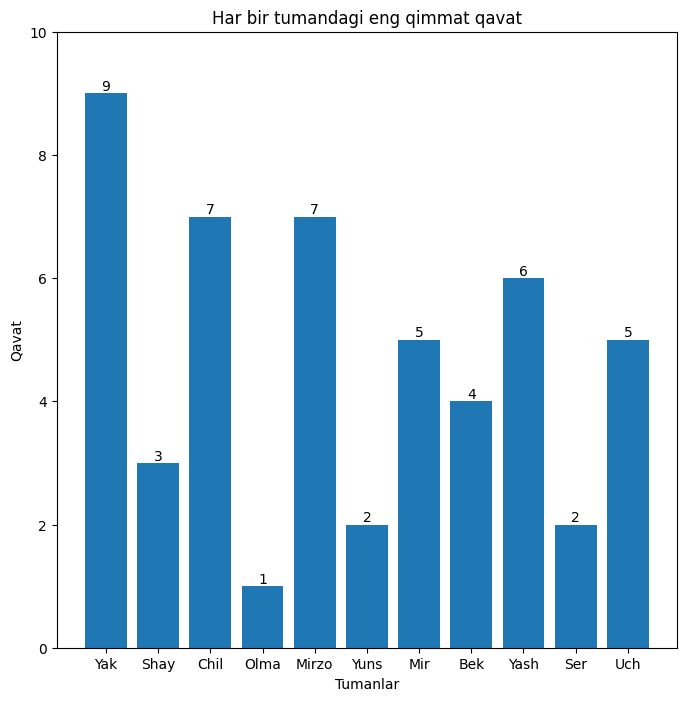

In [979]:
names = tumanlar
counts = eng_qimmat_etajlar

fig, ax = plt.subplots(figsize=(8,8))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Qavat', title='Har bir tumandagi eng qimmat qavat', ylim=(0, 10))
ax.set(xlabel="Tumanlar")
ax.bar_label(bar_container)
# Har bir tumandagi eng qimmat qavat

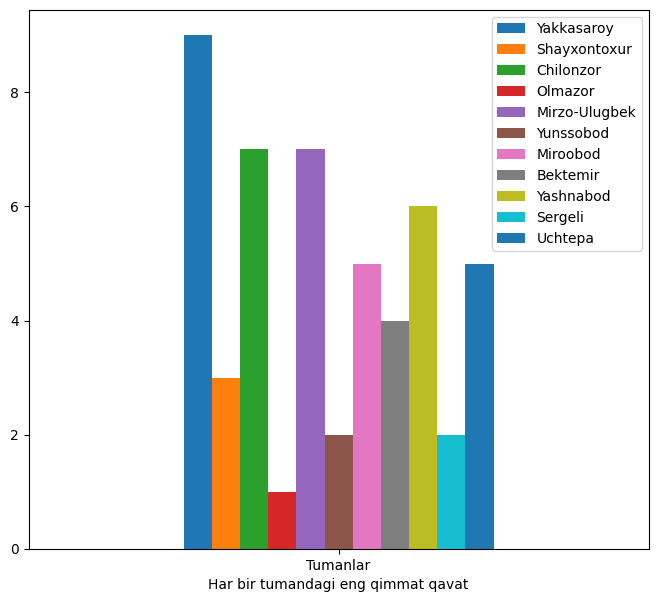

In [980]:
index = ["Tumanlar"]

df = pd.DataFrame({'Yakkasaroy': eng_qimmat_etajlar[0],
                   'Shayxontoxur': eng_qimmat_etajlar[1],
                   'Chilonzor': eng_qimmat_etajlar[2],
                   'Olmazor': eng_qimmat_etajlar[3],
                   'Mirzo-Ulugbek': eng_qimmat_etajlar[4],
                   'Yunssobod': eng_qimmat_etajlar[5],
                   'Miroobod': eng_qimmat_etajlar[6],
                   'Bektemir': eng_qimmat_etajlar[7],
                   'Yashnabod': eng_qimmat_etajlar[8],
                   'Sergeli': eng_qimmat_etajlar[9],
                   'Uchtepa': eng_qimmat_etajlar[10]}, index=index)

ax = df.plot.bar(rot=0, figsize=(8,7))
ax = plt.xlabel("Har bir tumandagi eng qimmat qavat")
# tumanlar kesimida etajlar soni

# Har bir tumandagi eng arzon qavat

In [981]:
yak = data_olx[data_olx["Location"]=="Яккасарайский район"]
yak = (yak[yak["Prices"]==yak.Prices.min()]["Etaj"])
yak = yak.values[0]
yak

chl = data_olx[data_olx["Location"]=="Чиланзарский район"]
chl = int(chl[chl["Prices"]==chl.Prices.min()]["Etaj"])
chl

olm = data_olx[data_olx["Location"]=="Алмазарский район"]
olm = int(olm[olm["Prices"]==olm.Prices.min()]["Etaj"])
olm

mirzo = data_olx[data_olx["Location"]=="Мирзо-Улугбекский район"]
mirzo = int(mirzo[mirzo["Prices"]==mirzo.Prices.min()]["Etaj"])
mirzo

yun = data_olx[data_olx["Location"]=="Юнусабадский район"]
yun = int(yun[yun["Prices"]==yun.Prices.min()]["Etaj"])
yun

mir = data_olx[data_olx["Location"]=="Мирабадский район"]
mir = int(mir[mir["Prices"]==mir.Prices.min()]["Etaj"])
mir

bek = data_olx[data_olx["Location"]=="Бектемирский район"]
bek = int(bek[bek["Prices"]==bek.Prices.min()]["Etaj"])
bek

yash = data_olx[data_olx["Location"]=="Яшнабадский район"]
yash = int(yash[yash["Prices"]==yash.Prices.min()]["Etaj"])
yash

ser = data_olx[data_olx["Location"]=="Сергелийский район"]
ser = (ser[ser["Prices"]==ser.Prices.min()]["Etaj"])
ser = ser.values[0]
ser

uch = data_olx[data_olx["Location"]=="Учтепинский район"]
uch = int(uch[uch["Prices"]==uch.Prices.min()]["Etaj"])
uch

C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\1617555735.py:7: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  chl = int(chl[chl["Prices"]==chl.Prices.min()]["Etaj"])
C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\1617555735.py:11: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  olm = int(olm[olm["Prices"]==olm.Prices.min()]["Etaj"])
C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\1617555735.py:15: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  mirzo = int(mirzo[mirzo["Prices"]==mirzo.Prices.min()]["Etaj"])
C:\Users\djdle\AppData\Local\Temp\ipykernel_3084\1617555735.py:19: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) ins

4

In [982]:
eng_arzon_etajlar = [yak, shay, chl, olm, mirzo, yun, mir, bek, yash, ser, uch]
eng_arzon_etajlar

[4, 3, 4, 3, 1, 8, 4, 7, 3, 4, 4]

In [983]:
tumanlar = ["Yak", "Shay", "Chil", "Olma", "Mirzo", "Yuns", "Mir", "Bek", "Yash", "Ser", "Uch"]

[Text(0, 0, '4'),
 Text(0, 0, '3'),
 Text(0, 0, '4'),
 Text(0, 0, '3'),
 Text(0, 0, '1'),
 Text(0, 0, '8'),
 Text(0, 0, '4'),
 Text(0, 0, '7'),
 Text(0, 0, '3'),
 Text(0, 0, '4'),
 Text(0, 0, '4')]

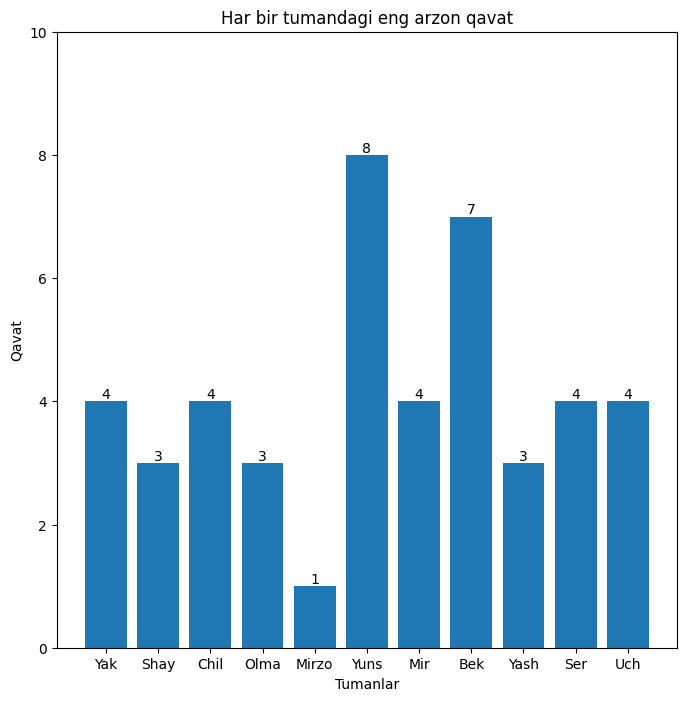

In [984]:
names = tumanlar
counts = eng_arzon_etajlar

fig, ax = plt.subplots(figsize=(8,8))
bar_container = ax.bar(names, counts)
ax.set(ylabel='Qavat', title='Har bir tumandagi eng arzon qavat', ylim=(0, 10))
ax.set(xlabel="Tumanlar")
ax.bar_label(bar_container)
# Har bir tumandagi eng qimmat qavat

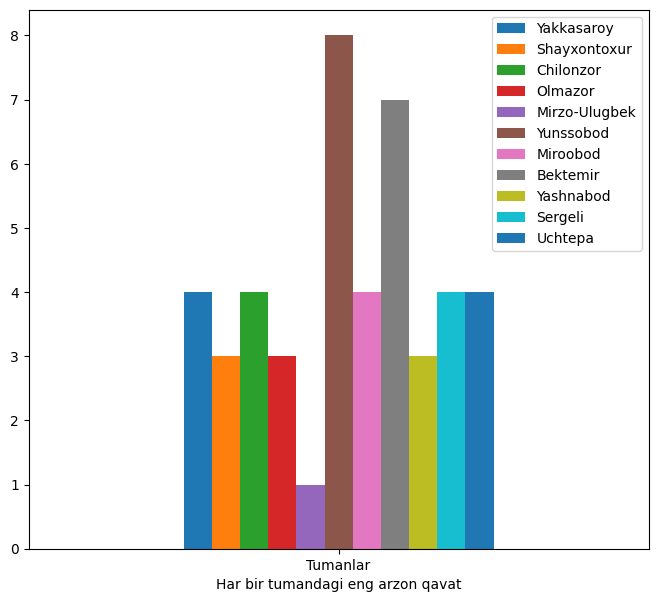

In [985]:
index = ["Tumanlar"]

df = pd.DataFrame({'Yakkasaroy': eng_arzon_etajlar[0],
                   'Shayxontoxur': eng_arzon_etajlar[1],
                   'Chilonzor': eng_arzon_etajlar[2],
                   'Olmazor': eng_arzon_etajlar[3],
                   'Mirzo-Ulugbek': eng_arzon_etajlar[4],
                   'Yunssobod': eng_arzon_etajlar[5],
                   'Miroobod': eng_arzon_etajlar[6],
                   'Bektemir': eng_arzon_etajlar[7],
                   'Yashnabod': eng_arzon_etajlar[8],
                   'Sergeli': eng_arzon_etajlar[9],
                   'Uchtepa': eng_arzon_etajlar[10]}, index=index)

ax = df.plot.bar(rot=0, figsize=(8,7))
ax = plt.xlabel("Har bir tumandagi eng arzon qavat")
# tumanlar kesimida etajlar soni

In [986]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,3,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5182,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5183,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5184,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,3,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5185,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [987]:
data_olx.describe()

,Prices,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
count,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000,5187.000000
mean,61204.495055,2.447658,66.085375,3.698284,5.932331,0.431270,0.362445,0.334297,0.161558,0.168113,0.187970,0.340659,0.162329,0.447658,0.706189,0.706189,0.724118,0.724696,0.725275,0.698477,0.698284,0.698477,0.711008,0.711008,0.712358,0.714864,0.714864,0.713129
std,42606.367051,0.998122,33.668374,2.268380,2.825264,0.495301,0.480753,0.471790,0.368080,0.374002,0.390726,0.473977,0.368788,0.497301,0.455551,0.455551,0.447001,0.446710,0.446419,0.458964,0.459047,0.458964,0.453338,0.453338,0.452707,0.451523,0.451523,0.452344
min,5200.000000,1.000000,13.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38000.000000,2.000000,46.000000,2.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,49000.000000,2.000000,60.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,67003.500000,3.000000,75.000000,5.000000,8.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,599000.000000,8.000000,600.000000,24.000000,51.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [988]:
data_olx.describe(include="object")

,Location,Info,Xususiy biznes,Turar joyi
count,5187,5187,5187,5187
unique,11,5142,2,2
top,Чиланзарский район,Продаётся квартира,Бизнес,Вторичный рынок
freq,1812,7,4895,4152


In [989]:
data_olx[data_olx["Umumiy maydoni"]>350]
# 4200 data Komercheskiy ekan yani xonadaon emas buni ham ochirb tashlaymiz

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
3537,Юнусабадский район,"Продается магазин и евро квартира 5ком , Юнуса...",470000.0,Частное лицо,Новостройки,5,600.0,2,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4200,Мирзо-Улугбекский район,Продам коммерческую недвижимость Тахтапуль 200...,270000.0,Бизнес,Вторичный рынок,8,400.0,2,2,0,1,1,0,0,0,0,0,1,1,1,1,1,1,0,0,0,0,0,1,0,0,0
4292,Мирзо-Улугбекский район,"Дархан,дуплекс коробка 370 кв.м",320000.0,Бизнес,Новостройки,5,370.0,7,8,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [990]:
data_olx.drop(4200, axis=0, inplace=True)

In [991]:
data_olx.reset_index(drop=True, inplace=True)

In [992]:
data_olx

,Location,Info,Prices,Xususiy biznes,Turar joyi,Xonalar,Umumiy maydoni,Etaj,Max etaj,Mebel,Internet,Telefon,Televizor,Muzlatgich,Konditsioner,Kabelli TV,Kir mashina,Oshxona,Shifoxona,Poliklinika,Bolalar maydonchasi,Bolalar bogchasi,Bekat,Park,Kongilochar joy,Yashil maydon,Restoran,Kafe,Avtoturargoh,Supermarket,Dukon,Maktab
0,Яккасарайский район,Продам Ж/К Парисен новостройка,142000.0,Бизнес,Новостройки,3,92.0,4,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,Шайхантахурский район,Ташкент Сити Гарденс 3/3/8 110м2 G2 Блок Перег...,127000.0,Бизнес,Новостройки,3,110.0,3,8,0,1,1,0,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,Чиланзарский район,"Ремонт Для Себя!2в3/1/4""С обстановкой!Чиланзар...",46000.0,Бизнес,Вторичный рынок,3,45.0,1,4,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,Яккасарайский район,Яккасарай /Новостройка/4 комнат/3 этаж //150 м2,240000.0,Бизнес,Новостройки,4,150.0,3,8,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4,Алмазарский район,Однокомнатная переделанная в 2х на Каракамыше...,35001.0,Бизнес,Вторичный рынок,1,39.0,4,5,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5181,Чиланзарский район,Чиланзар 2 квартал. 3/1/4. Кирпич. Балкон 2×4....,65000.0,Бизнес,Вторичный рынок,3,64.0,1,4,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5182,Чиланзарский район,2/1/6 Срочно Продается Квартира на Чиланзар 10,56000.0,Бизнес,Новостройки,2,48.0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5183,Чиланзарский район,У Нас Дешевле. Чиланзар 8 Квартал 2в3/2/4 Царс...,46997.0,Бизнес,Вторичный рынок,3,52.0,2,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5184,Чиланзарский район,Оптовый рынок. Чиланзар 6 Квартал 1/2/4 Царств...,34455.0,Бизнес,Вторичный рынок,1,30.0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [993]:
#data_olx.to_csv("Datasets/olx1.csv")